# 📌 1. Introdução (FINALIZAR)

O objetivo deste projeto é construir modelos preditivos para **detectar churn de clientes em uma empresa de telecomunicações**, utilizando uma base de dados do Kaggle. A tarefa é de **classificação binária**, e envolve o uso de diferentes algoritmos, como redes neurais (MLP e Transformer), Random Forest, Gradient Boosting e mais.

Este notebook está organizado em seções por **responsável** e segue princípios de **código limpo** com **funções reutilizáveis**, documentação clara e visualizações apropriadas.

O grupo é composto por:

- Brenda  Guerra (bvga)
- Yasmin Maria Wanderley Soares (ymws)
- Gabriel Ferreira da Silva (gfs4)
- Lucas Santiago Monterazo (lsm6)
- Matheus Correia (mcr)


# ⚙️ 2. Metodologia

## 2.1. Etapas do projeto
O projeto foi dividido para ser feito por etapas, com cada membro responsável por uma etapa:
- **T1-T4 (lsm6)**: Pré-processamento dos dados, normalização, codificação e divisão dos conjuntos
- **T5-T6 (Pessoa 2)**: Modelagem com MLP e Transformer
- **T7-T8 (Pessoa 3)**: Modelagem com Random Forest e Gradient Boosting
- **T9-T11 (Pessoa 4)**: Avaliação e visualização dos modelos
- **T12-T14 (Pessoa 5)**: Integração, documentação e apresentação



# 🧹 3. Pré-processamento



## 3.1. Carregamento e inspeção inicial

In [1]:
#dependencias
!pip install tabular-transformers

import importlib.util
from google.colab import files

def check_and_install(package):
    if importlib.util.find_spec(package) is None:
        !pip install {package} -qq

check_and_install('tensorflow')
check_and_install('numpy')
check_and_install('pandas')
check_and_install('scipy')
check_and_install('matplotlib')
check_and_install('scikit-learn')
check_and_install('kagglehub')
check_and_install('seaborn')
check_and_install('tabpfn')
check_and_install('torch')
check_and_install('tabular_transformers')

import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)


#libs
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import io
import os
from scipy import stats
from sklearn.metrics import mean_squared_error, log_loss, confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score, roc_curve, auc
import seaborn as sns
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

%matplotlib inline

In [2]:
import kagglehub
import os
import pandas as pd

# Download do dataset pelo Kaggle
dataset_path = kagglehub.dataset_download("kapturovalexander/customers-churned-in-telecom-services")
csv_filename = 'customer_churn_telecom_services.csv' # Corrected filename
csv_filepath = os.path.join(dataset_path, csv_filename) # Construct the correct file path

#loading the dataset -- #decoding the files as uploaded will be a dictionary of keys (the file names) and values (the encoded file objects)

churn = pd.read_csv(csv_filepath)
display(churn.head())

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## 3.2. Limpeza dos dados (nulos, inconsistências, outliers)

In [3]:
def tratar_dados(df):
    # Remove irrelevant columns if any (none identified in this dataset initially)
    # Handle 'TotalCharges' which is object type and contains some spaces
    # Replace spaces with NaN and then convert to numeric
    df['TotalCharges'] = df['TotalCharges'].replace(' ', np.nan)
    df['TotalCharges'] = pd.to_numeric(df['TotalCharges'])

    # Remove rows with missing values (introduced by the above step or originally present)
    df = df.dropna()

    # Handle inconsistencies in categorical strings (extra spaces, capitalization)
    for col in df.select_dtypes(include='object').columns:
        df[col] = df[col].astype(str).str.strip().str.lower()

    return df

## 3.3. Codificação e normalização

- Codificação para redes (one-hot + normalização)

- Codificação para árvores (label ou nada)

In [4]:
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Identify categorical and numerical features
def get_feature_types(df, target='Churn'):
    categorical_features = df.select_dtypes(include='object').columns.tolist()
    if target in categorical_features:
        categorical_features.remove(target)
    numeric_features = df.select_dtypes(include=np.number).columns.tolist()
    return categorical_features, numeric_features

# Preprocessing for Neural Networks (One-Hot Encoding + Scaling)
def preprocess_for_nn(df, target='Churn'):
    df_processed = df.copy()
    categorical_features, numeric_features = get_feature_types(df_processed, target=target)

    # Separate target variable before processing
    y = df_processed[target].apply(lambda x: 1 if x == 'yes' else 0) # Convert Churn to 0/1
    X = df_processed.drop(target, axis=1)


    # Create a column transformer for applying different transformations to different columns
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)])

    # Create a preprocessing pipeline
    pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

    X_processed = pipeline.fit_transform(X)
    return X_processed, y, pipeline # Return pipeline to be used for transforming new data

# Preprocessing for Tree-based Models (Label Encoding - for categorical features where order doesn't matter, or leave as is for some algorithms)
# For simplicity and compatibility with most tree models in sklearn, we'll use Label Encoding for object types.
def preprocess_for_trees(df, target='Churn'):
    df_processed = df.copy()
    # Convert target to numeric
    df_processed[target] = df_processed[target].apply(lambda x: 1 if x == 'Yes' else 0)

    for col in df_processed.select_dtypes(include='object').columns:
        df_processed[col] = LabelEncoder().fit_transform(df_processed[col])

    X = df_processed.drop(target, axis=1)
    y = df_processed[target]

    return X, y

## 3.4. Divisão dos dados (treino, validação, teste)

In [5]:
from sklearn.model_selection import train_test_split

def dividir_dados(X, y):
    X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
    X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.25, random_state=42, stratify=y_trainval)

    return X_train, X_val, X_test, y_train, y_val, y_test

## 3.5 Feature Engineering

In [6]:
def create_engineered_features(df):
    df_engineered = df.copy()

    df_engineered['AvgMonthlyCharge_per_Tenure'] = df_engineered.apply(
        lambda row: row['TotalCharges'] / row['tenure'] if row['tenure'] > 0 else 0, axis=1
    )

    optional_services = ['OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']
    for col in optional_services:
        if col in df_engineered.columns:
            # Ensure consistent handling of 'No internet service' or similar
            df_engineered[col] = df_engineered[col].apply(lambda x: 1 if x == 'Yes' else 0)
    df_engineered['NumExtraServices'] = df_engineered[optional_services].sum(axis=1)

    if 'InternetService' in df_engineered.columns and 'Contract' in df_engineered.columns:
         df_engineered['InternetService_Contract'] = df_engineered['InternetService'] + '_' + df_engineered['Contract']

    if 'PaymentMethod' in df_engineered.columns:
        df_engineered['IsElectronicCheck'] = df_engineered['PaymentMethod'].apply(lambda x: 1 if x == 'Electronic check' else 0)

    return df_engineered

# Apply the feature engineering step to your cleaned data
# Make sure to run the 'tratar_dados' function first to get 'churn_cleaned'
churn_cleaned = tratar_dados(churn.copy())
churn_cleaned_engineered = create_engineered_features(churn_cleaned.copy())

print("Original columns:", churn_cleaned.columns.tolist())
print("Columns after feature engineering:", churn_cleaned_engineered.columns.tolist())
display(churn_cleaned_engineered[['tenure', 'MonthlyCharges', 'TotalCharges', 'AvgMonthlyCharge_per_Tenure', 'NumExtraServices', 'InternetService_Contract', 'IsElectronicCheck']].head())

Original columns: ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn']
Columns after feature engineering: ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn', 'AvgMonthlyCharge_per_Tenure', 'NumExtraServices', 'InternetService_Contract', 'IsElectronicCheck']


,tenure,MonthlyCharges,TotalCharges,AvgMonthlyCharge_per_Tenure,NumExtraServices,InternetService_Contract,IsElectronicCheck
0,1,29.85,29.85,29.850000,0,dsl_month-to-month,0
1,34,56.95,1889.50,55.573529,0,dsl_one year,0
2,2,53.85,108.15,54.075000,0,dsl_month-to-month,0
3,45,42.30,1840.75,40.905556,0,dsl_one year,0
4,2,70.70,151.65,75.825000,0,fiber optic_month-to-month,0


In [ ]:

display(churn_cleaned_engineered.head())

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,AvgMonthlyCharge_per_Tenure,NumExtraServices,InternetService_Contract,IsElectronicCheck
0,female,0,yes,no,1,no,no phone service,dsl,0,0,...,month-to-month,yes,electronic check,29.85,29.85,no,29.850000,0,dsl_month-to-month,0
1,male,0,no,no,34,yes,no,dsl,0,0,...,one year,no,mailed check,56.95,1889.50,no,55.573529,0,dsl_one year,0
2,male,0,no,no,2,yes,no,dsl,0,0,...,month-to-month,yes,mailed check,53.85,108.15,yes,54.075000,0,dsl_month-to-month,0
3,male,0,no,no,45,no,no phone service,dsl,0,0,...,one year,no,bank transfer (automatic),42.30,1840.75,no,40.905556,0,dsl_one year,0
4,female,0,no,no,2,yes,no,fiber optic,0,0,...,month-to-month,yes,electronic check,70.70,151.65,yes,75.825000,0,fiber optic_month-to-month,0


## 3.6. Visualização inicial dos dados

In [7]:
# Apply data cleaning
churn_cleaned = tratar_dados(churn.copy())

# Apply feature engineering
churn_engineered = create_engineered_features(churn_cleaned.copy())

churn_minority = churn_engineered[churn_engineered['Churn'] == 'yes']
churn_majority = churn_engineered[churn_engineered['Churn'] == 'no']

churn_minority_duplicated = pd.concat([churn_minority]*3, ignore_index=True)

churn_balanced = pd.concat([churn_majority, churn_minority_duplicated], ignore_index=True)


In [8]:

# Preprocessing and Splitting for Neural Networks
X_processed_nn, y_nn, pipeline_nn = preprocess_for_nn(churn_balanced.copy())
X_train_nn, X_val_nn, X_test_nn, y_train_nn, y_val_nn, y_test_nn = dividir_dados(X_processed_nn, y_nn)

# Preprocessing and Splitting for Tree-based Models
X_processed_trees, y_trees = preprocess_for_trees(churn_balanced.copy())
X_train_trees, X_val_trees, X_test_trees, y_train_trees, y_val_trees, y_test_trees = dividir_dados(X_processed_trees, y_trees)



In [9]:

print("Data preprocessing and splitting complete.")
print("\nShapes for Neural Networks:")
print("X_train_nn:", X_train_nn.shape)
print("X_val_nn:", X_val_nn.shape)
print("X_test_nn:", X_test_nn.shape)
print("y_train_nn:", y_train_nn.shape)
print("y_val_nn:", y_val_nn.shape)
print("y_test_nn:", y_test_nn.shape)

print("\nShapes for Tree-based Models:")
print("X_train_trees:", X_train_trees.shape)
print("X_val_trees:", X_val_trees.shape)
print("X_test_trees:", X_test_trees.shape)
print("y_train_trees:", y_train_trees.shape)
print("y_val_trees:", y_val_trees.shape)
print("y_test_trees:", y_test_trees.shape)

Data preprocessing and splitting complete.

Shapes for Neural Networks:
X_train_nn: (6462, 45)
X_val_nn: (2154, 45)
X_test_nn: (2154, 45)
y_train_nn: (6462,)
y_val_nn: (2154,)
y_test_nn: (2154,)

Shapes for Tree-based Models:
X_train_trees: (6462, 23)
X_val_trees: (2154, 23)
X_test_trees: (2154, 23)
y_train_trees: (6462,)
y_val_trees: (2154,)
y_test_trees: (2154,)


In [ ]:
print(y_nn.value_counts())


Churn
1    5607
0    5163
Name: count, dtype: int64



--- Data after Cleaning ---
Shape before cleaning: (7043, 20)
Shape after cleaning: (7032, 20)

Missing values after cleaning:
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

--- Visualizing outliers after cleaning ---


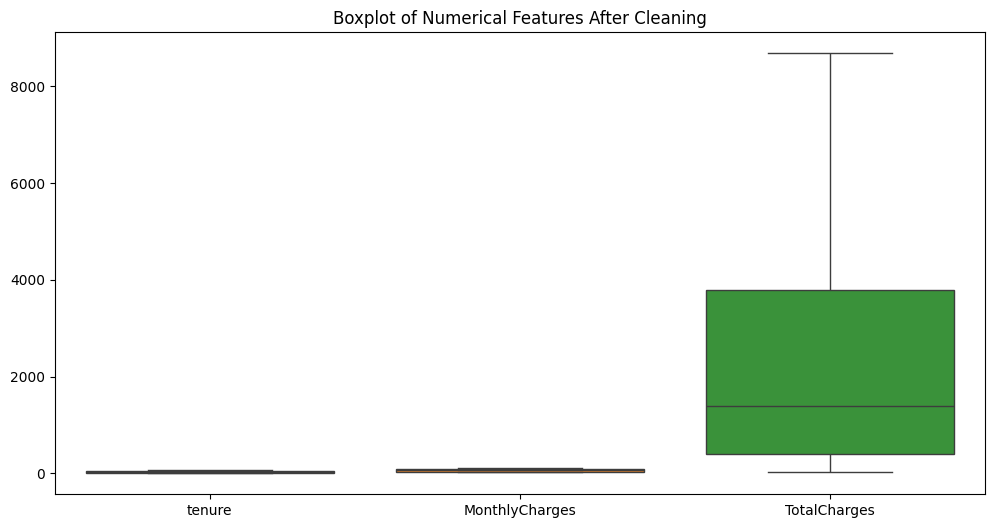


--- Data after Feature Engineering ---
Shape after Feature Engineering: (7032, 24)


,tenure,MonthlyCharges,TotalCharges,AvgMonthlyCharge_per_Tenure,NumExtraServices,InternetService_Contract,IsElectronicCheck
0,1,29.85,29.85,29.850000,0,dsl_month-to-month,0
1,34,56.95,1889.50,55.573529,0,dsl_one year,0
2,2,53.85,108.15,54.075000,0,dsl_month-to-month,0
3,45,42.30,1840.75,40.905556,0,dsl_one year,0
4,2,70.70,151.65,75.825000,0,fiber optic_month-to-month,0



--- Data after Encoding (for Neural Networks) ---
Shape after One-Hot Encoding and Scaling: (10770, 45)


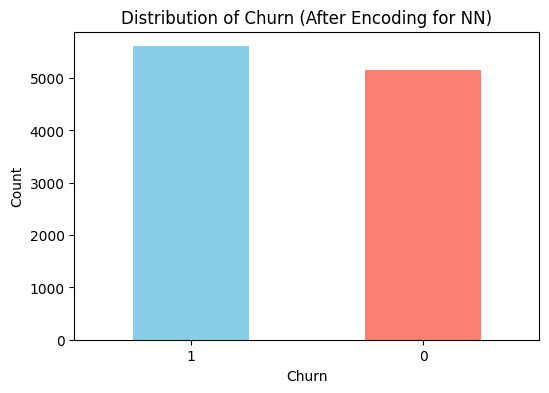


--- Data after Encoding (for Tree-based Models) ---
Shape after Label Encoding: (10770, 23)


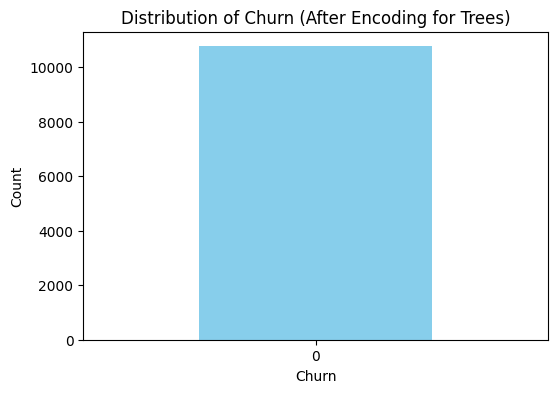


--- Data after Splitting (Example for Neural Networks) ---
Shape of X_train_nn: (6462, 45)
Shape of X_val_nn: (2154, 45)
Shape of X_test_nn: (2154, 45)
Shape of y_train_nn: (6462,)
Shape of y_val_nn: (2154,)
Shape of y_test_nn: (2154,)


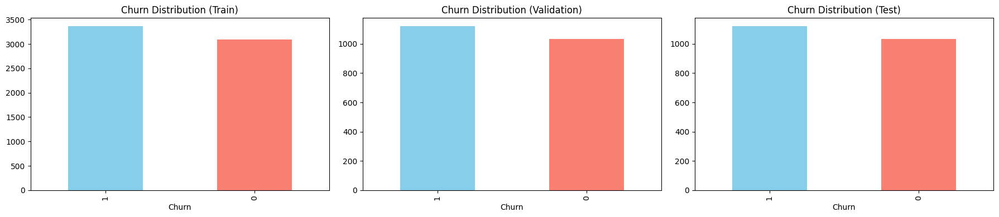

In [10]:
print("\n--- Data after Cleaning ---")
print("Shape before cleaning:", churn.shape)
print("Shape after cleaning:", churn_cleaned.shape)
print("\nMissing values after cleaning:")
print(churn_cleaned.isnull().sum())

print("\n--- Visualizing outliers after cleaning ---")
plt.figure(figsize=(12, 6))
sns.boxplot(data=churn_cleaned[['tenure', 'MonthlyCharges', 'TotalCharges']])
plt.title('Boxplot of Numerical Features After Cleaning')
plt.show()


print("\n--- Data after Feature Engineering ---")
print("Shape after Feature Engineering:", churn_engineered.shape)
display(churn_engineered[['tenure', 'MonthlyCharges', 'TotalCharges', 'AvgMonthlyCharge_per_Tenure', 'NumExtraServices', 'InternetService_Contract', 'IsElectronicCheck']].head())


print("\n--- Data after Encoding (for Neural Networks) ---")
print("Shape after One-Hot Encoding and Scaling:", X_processed_nn.shape)
# Visualize the distribution of the target variable in the processed data.
plt.figure(figsize=(6, 4))
pd.Series(y_nn).value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Distribution of Churn (After Encoding for NN)')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


print("\n--- Data after Encoding (for Tree-based Models) ---")
print("Shape after Label Encoding:", X_processed_trees.shape)
# Visualize the distribution of the target variable again.
plt.figure(figsize=(6, 4))
pd.Series(y_trees).value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Distribution of Churn (After Encoding for Trees)')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


print("\n--- Data after Splitting (Example for Neural Networks) ---")
print("Shape of X_train_nn:", X_train_nn.shape)
print("Shape of X_val_nn:", X_val_nn.shape)
print("Shape of X_test_nn:", X_test_nn.shape)
print("Shape of y_train_nn:", y_train_nn.shape)
print("Shape of y_val_nn:", y_val_nn.shape)
print("Shape of y_test_nn:", y_test_nn.shape)

# Visualize the distribution of the target variable in each split to check stratification.
plt.figure(figsize=(18, 4))
plt.subplot(1, 3, 1)
pd.Series(y_train_nn).value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Churn Distribution (Train)')
plt.subplot(1, 3, 2)
pd.Series(y_val_nn).value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Churn Distribution (Validation)')
plt.subplot(1, 3, 3)
pd.Series(y_test_nn).value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Churn Distribution (Test)')
plt.tight_layout()
plt.show()

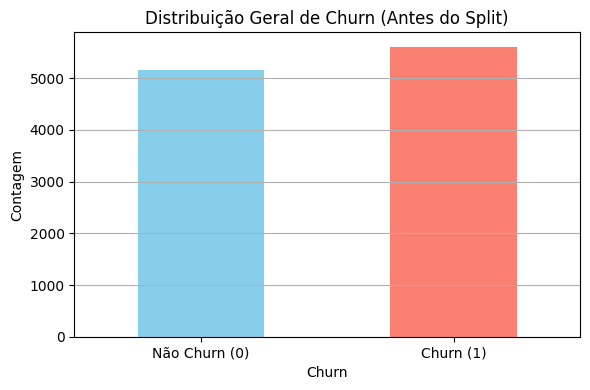

In [11]:

plt.figure(figsize=(6, 4))
pd.Series(y_nn).value_counts().sort_index().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Distribuição Geral de Churn (Antes do Split)')
plt.xticks([0, 1], ['Não Churn (0)', 'Churn (1)'], rotation=0)
plt.xlabel('Churn')
plt.ylabel('Contagem')
plt.grid(axis='y')
plt.tight_layout()
plt.show()



# 🧠 4. Modelagem com Redes Neurais (Pessoa 2)

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np
import tensorflow as tf

def auc_roc(y_true, y_pred_prob):
    auc = roc_auc_score(y_true, y_pred_prob)
    return auc

def ks_statistic(y_true, y_pred):
    ks_stat, p_value = stats.ks_2samp(y_true, y_pred)
    return ks_stat, p_value
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np
import tensorflow as tf

class RocKsCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_val, y_val, plot_interval=25):
        super().__init__()
        self.X_val = X_val
        self.y_val = y_val
        self.plot_interval = plot_interval

    def on_epoch_end(self, epoch, logs=None):
        y_pred_proba = self.model.predict(self.X_val, verbose=0).ravel()

        # ROC AUC
        fpr, tpr, thresholds = roc_curve(self.y_val, y_pred_proba)
        roc_auc = roc_auc_score(self.y_val, y_pred_proba)

        # KS
        ks_statistic = np.max(np.abs(tpr - fpr))
        ks_threshold = thresholds[np.argmax(np.abs(tpr - fpr))]

        print(f"Epoch {epoch+1} - ROC AUC: {roc_auc:.4f} | KS: {ks_statistic:.4f}")

        # Plot & show in Colab
        if (epoch + 1) % self.plot_interval == 0:
            fig, axs = plt.subplots(1, 2, figsize=(10, 4))

            # ROC plot
            axs[0].plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
            axs[0].plot([0, 1], [0, 1], 'k--')
            axs[0].set_title(f'ROC Curve - Epoch {epoch+1}')
            axs[0].set_xlabel('FPR')
            axs[0].set_ylabel('TPR')
            axs[0].legend()
            axs[0].grid(True)

            # KS plot
            axs[1].plot(thresholds, tpr, label='TPR')
            axs[1].plot(thresholds, fpr, label='FPR')
            axs[1].axvline(ks_threshold, color='r', linestyle='--',
                           label=f'KS = {ks_statistic:.3f}')
            axs[1].set_title('KS Curve')
            axs[1].set_xlabel('Threshold')
            axs[1].set_ylabel('Rate')
            axs[1].legend()
            axs[1].grid(True)

            plt.tight_layout()
            plt.show()
            plt.savefig(f'roc_ks_epoch_{epoch+1}.png', dpi=300)




In [ ]:

model = Sequential([
    Dense(10, activation='relu', input_shape=(X_train_nn.shape[1],)),
    Dense(1, activation='sigmoid')  # Saída binária
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
history = model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_val_nn, y_val_nn),
    epochs=500,
    callbacks=[early_stop, RocKsCallback(X_val_nn, y_val_nn)],
    verbose=1,
    batch_size=32
)

model.save('nn_1camada.h5')
files.download('nn_1camada.h5')


# 9. Avaliação
loss, acc = model.evaluate(X_val_nn, y_val_nn, verbose=0)
print(f"\n✅ Validação final — Loss: {loss:.4f}, Accuracy: {acc:.4f}")

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score

y_pred_probs = model.predict(X_test_nn)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

precision = precision_score(y_test_nn, y_pred)
recall = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print("\n📊 Classification Report:\n")
print(classification_report(y_test_nn, y_pred, target_names=["Não Churn", "Churn"]))


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

📊 Classification Report:

              precision    recall  f1-score   support

   Não Churn       0.77      0.68      0.72      1033
       Churn       0.74      0.81      0.77      1121

    accuracy                           0.75      2154
   macro avg       0.75      0.75      0.75      2154
weighted avg       0.75      0.75      0.75      2154



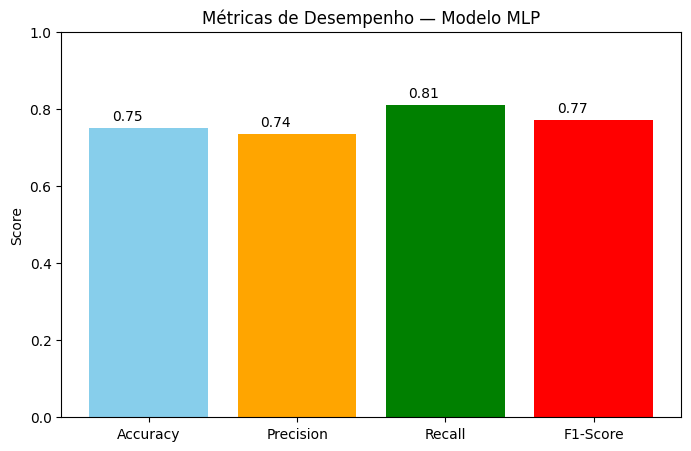

In [ ]:
import matplotlib.pyplot as plt

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [
    model.evaluate(X_test_nn, y_test_nn, verbose=0)[1],  # accuracy from model
    precision,
    recall,
    f1
]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — Modelo MLP')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()


Epoch 1/500
188/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5704 - loss: 0.6808Epoch 1 - ROC AUC: 0.7877 | KS: 0.4713
202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5750 - loss: 0.6789 - val_accuracy: 0.7335 - val_loss: 0.6063
Epoch 2/500
184/202 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7026 - loss: 0.6137Epoch 2 - ROC AUC: 0.7924 | KS: 0.4767
202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7034 - loss: 0.6125 - val_accuracy: 0.7344 - val_loss: 0.5607
Epoch 3/500
185/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7258 - loss: 0.5760Epoch 3 - ROC AUC: 0.7995 | KS: 0.4831
202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7267 - loss: 0.5750 - val_accuracy: 0.7428 - val_loss: 0.5437
Epoch 4/500
184/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7479 - loss: 0.5541Epoch 4 - ROC AUC: 0.8078 | KS: 0.4858
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7473 - loss: 0.5543 - val_accuracy: 0.7428 - val_loss: 0.5369
Epoch 5/500
185/202 ━━━━━━━━━━━━

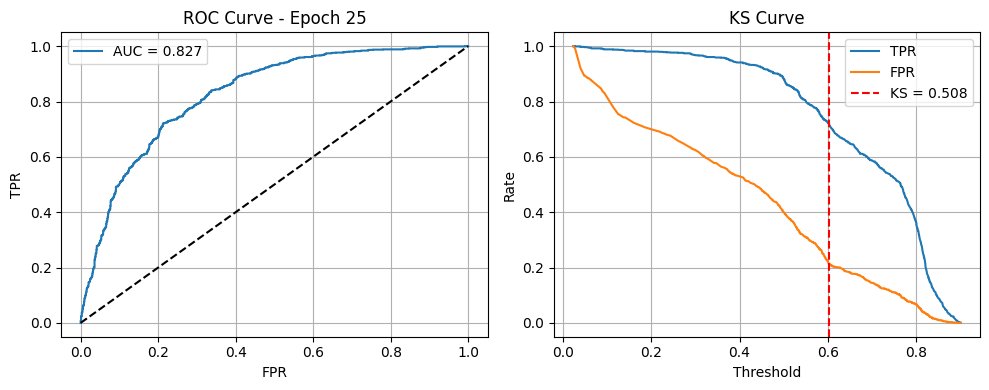

202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7485 - loss: 0.5157 - val_accuracy: 0.7465 - val_loss: 0.5159
Epoch 26/500
201/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7586 - loss: 0.5170Epoch 26 - ROC AUC: 0.8258 | KS: 0.5018
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7586 - loss: 0.5170 - val_accuracy: 0.7447 - val_loss: 0.5145
Epoch 27/500
181/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7505 - loss: 0.5263Epoch 27 - ROC AUC: 0.8265 | KS: 0.5054
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7516 - loss: 0.5247 - val_accuracy: 0.7461 - val_loss: 0.5149
Epoch 28/500
190/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7546 - loss: 0.5185Epoch 28 - ROC AUC: 0.8259 | KS: 0.5011
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7546 - loss: 0.5182 - val_accuracy: 0.7474 - val_loss: 0.5151
Epoch 29/500
187/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7623 - loss: 0.4979Epoch 29 - ROC AUC: 0.8255 | KS: 0.5031
202/202 ━━━━━━━━━━━━━━━━

<Figure size 640x480 with 0 Axes>

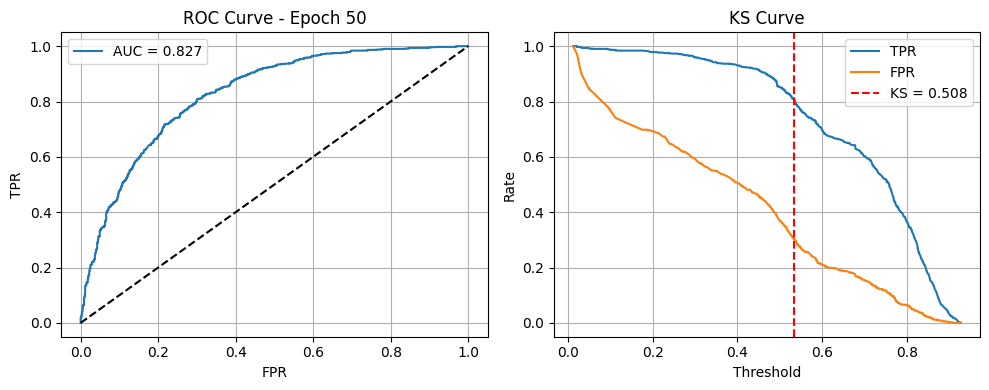

202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7618 - loss: 0.5086 - val_accuracy: 0.7461 - val_loss: 0.5126
Epoch 51/500
185/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7689 - loss: 0.5030Epoch 51 - ROC AUC: 0.8263 | KS: 0.5002
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7683 - loss: 0.5034 - val_accuracy: 0.7461 - val_loss: 0.5131
Epoch 52/500
180/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7701 - loss: 0.4927Epoch 52 - ROC AUC: 0.8267 | KS: 0.5024
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7692 - loss: 0.4937 - val_accuracy: 0.7405 - val_loss: 0.5216
Epoch 53/500
181/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7601 - loss: 0.4948Epoch 53 - ROC AUC: 0.8270 | KS: 0.4999
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7603 - loss: 0.4960 - val_accuracy: 0.7419 - val_loss: 0.5165
Epoch 54/500
183/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7629 - loss: 0.5039Epoch 54 - ROC AUC: 0.8270 | KS: 0.4998
202/202 ━━━━━━━━━━━━━━━━

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Validação final — Loss: 0.5108, Accuracy: 0.7447


<Figure size 640x480 with 0 Axes>

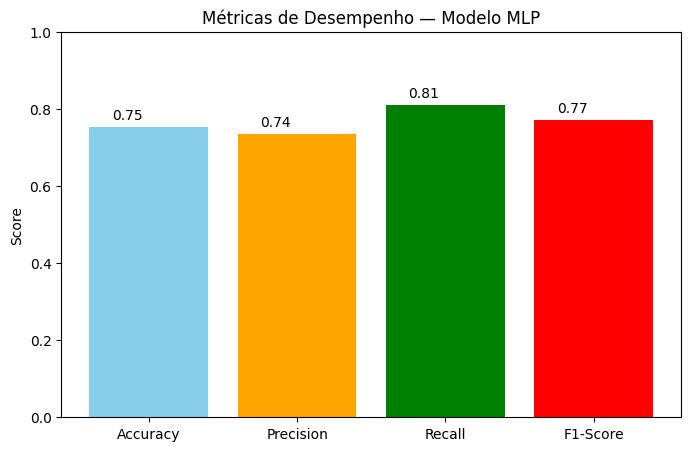

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

model = Sequential([
    Dense(10, activation='relu', input_shape=(X_train_nn.shape[1],)),
    Dropout(0.3),  # 30% dos neurônios desativados nessa camada
    Dense(10, activation='relu'),
    Dropout(0.3),  # Outro dropout antes da saída
    Dense(10, activation='relu'),
    Dropout(0.3),  # Outro dropout antes da saída
    Dense(1, activation='sigmoid')  # Saída binária
])

model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_val_nn, y_val_nn),
    epochs=500,
    callbacks=[early_stop, RocKsCallback(X_val_nn, y_val_nn)],
    verbose=1,
    batch_size=32
)

model.save('nn_3camada_0.3dropout_500epochs.h5')
files.download('nn_3camada_0.3dropout_500epochs.h5')

# Avaliação
loss, acc = model.evaluate(X_val_nn, y_val_nn, verbose=0)
print(f"\n✅ Validação final — Loss: {loss:.4f}, Accuracy: {acc:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [
    model.evaluate(X_test_nn, y_test_nn, verbose=0)[1],  # accuracy from model
    precision,
    recall,
    f1
]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — Modelo MLP')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



Epoch 1/500


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


195/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6098 - loss: 0.6587Epoch 1 - ROC AUC: 0.8156 | KS: 0.4975
202/202 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6124 - loss: 0.6563 - val_accuracy: 0.7479 - val_loss: 0.5258
Epoch 2/500
187/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7349 - loss: 0.5410Epoch 2 - ROC AUC: 0.8259 | KS: 0.5139
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7358 - loss: 0.5399 - val_accuracy: 0.7563 - val_loss: 0.5106
Epoch 3/500
190/202 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7462 - loss: 0.5164Epoch 3 - ROC AUC: 0.8274 | KS: 0.5158
202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7466 - loss: 0.5164 - val_accuracy: 0.7572 - val_loss: 0.5090
Epoch 4/500
196/202 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7638 - loss: 0.4963Epoch 4 - ROC AUC: 0.8291 | KS: 0.5123
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7636 - loss: 0.4966 - val_accuracy: 0.7530 - val_loss: 0.5057
Epoch 5/500
181/202 ━━━━━━━━━━━━━━━━━━━━ 0s 

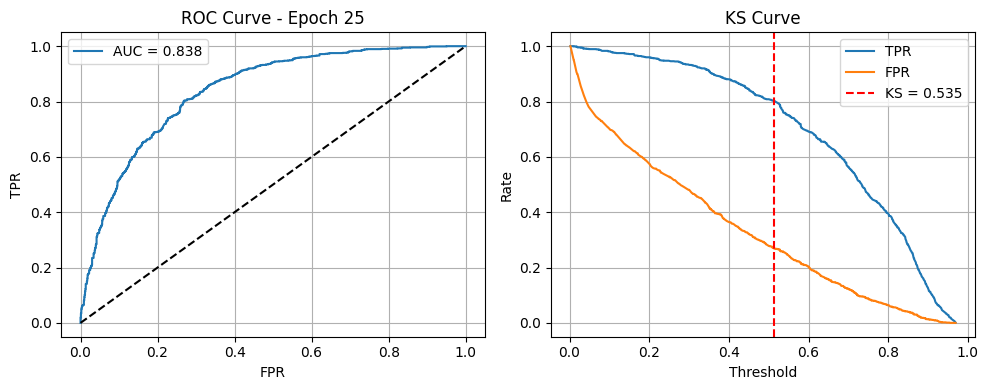

202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7790 - loss: 0.4836 - val_accuracy: 0.7669 - val_loss: 0.4949
Epoch 26/500
179/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7814 - loss: 0.4651Epoch 26 - ROC AUC: 0.8389 | KS: 0.5412
202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7809 - loss: 0.4666 - val_accuracy: 0.7674 - val_loss: 0.4929
Epoch 27/500
192/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7828 - loss: 0.4814Epoch 27 - ROC AUC: 0.8372 | KS: 0.5278
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7829 - loss: 0.4811 - val_accuracy: 0.7628 - val_loss: 0.4965
Epoch 28/500
182/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7840 - loss: 0.4839Epoch 28 - ROC AUC: 0.8379 | KS: 0.5274
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7839 - loss: 0.4829 - val_accuracy: 0.7558 - val_loss: 0.4948
Epoch 29/500
189/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7847 - loss: 0.4787Epoch 29 - ROC AUC: 0.8378 | KS: 0.5350
202/202 ━━━━━━━━━━━━━━━━

<Figure size 640x480 with 0 Axes>

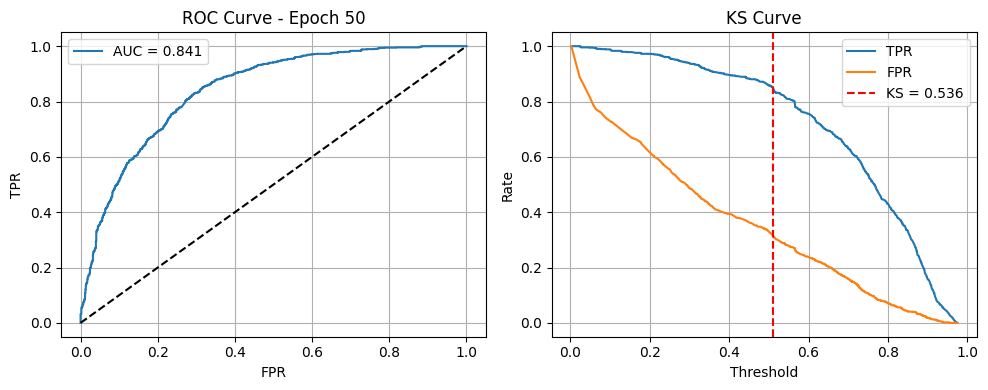

202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7806 - loss: 0.4599 - val_accuracy: 0.7683 - val_loss: 0.4895
Epoch 51/500
176/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7931 - loss: 0.4554Epoch 51 - ROC AUC: 0.8417 | KS: 0.5419
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7921 - loss: 0.4564 - val_accuracy: 0.7711 - val_loss: 0.4886
Epoch 52/500
186/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7807 - loss: 0.4730Epoch 52 - ROC AUC: 0.8410 | KS: 0.5339
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7811 - loss: 0.4725 - val_accuracy: 0.7669 - val_loss: 0.4901
Epoch 53/500
183/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7841 - loss: 0.4616Epoch 53 - ROC AUC: 0.8414 | KS: 0.5398
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7843 - loss: 0.4619 - val_accuracy: 0.7683 - val_loss: 0.4882
Epoch 54/500
187/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7818 - loss: 0.4690Epoch 54 - ROC AUC: 0.8426 | KS: 0.5434
202/202 ━━━━━━━━━━━━━━━━

<Figure size 640x480 with 0 Axes>

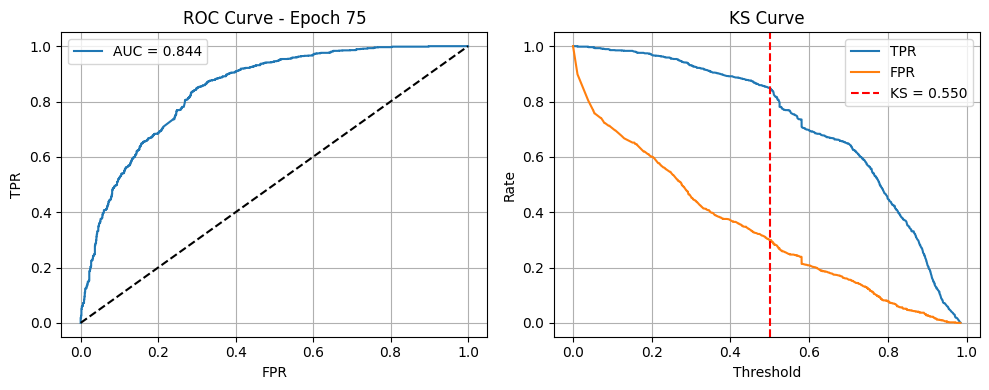

202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7796 - loss: 0.4631 - val_accuracy: 0.7772 - val_loss: 0.4841
Epoch 76/500
198/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7801 - loss: 0.4667Epoch 76 - ROC AUC: 0.8430 | KS: 0.5371
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7803 - loss: 0.4664 - val_accuracy: 0.7683 - val_loss: 0.4863
Epoch 77/500
181/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7929 - loss: 0.4564Epoch 77 - ROC AUC: 0.8432 | KS: 0.5453
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7928 - loss: 0.4565 - val_accuracy: 0.7730 - val_loss: 0.4852
Epoch 78/500
197/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7923 - loss: 0.4576Epoch 78 - ROC AUC: 0.8448 | KS: 0.5481
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7923 - loss: 0.4576 - val_accuracy: 0.7744 - val_loss: 0.4829
Epoch 79/500
197/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7877 - loss: 0.4549Epoch 79 - ROC AUC: 0.8450 | KS: 0.5420
202/202 ━━━━━━━━━━━━━━━━

<Figure size 640x480 with 0 Axes>

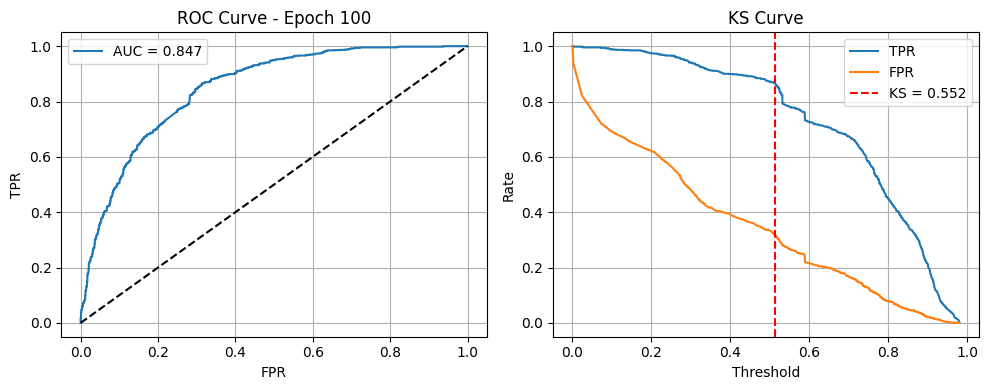

202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7978 - loss: 0.4491 - val_accuracy: 0.7730 - val_loss: 0.4814
Epoch 101/500
179/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7856 - loss: 0.4603Epoch 101 - ROC AUC: 0.8457 | KS: 0.5545
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7861 - loss: 0.4595 - val_accuracy: 0.7744 - val_loss: 0.4816
Epoch 102/500
199/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7888 - loss: 0.4506Epoch 102 - ROC AUC: 0.8440 | KS: 0.5521
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7888 - loss: 0.4506 - val_accuracy: 0.7781 - val_loss: 0.4833
Epoch 103/500
202/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7859 - loss: 0.4458Epoch 103 - ROC AUC: 0.8450 | KS: 0.5563
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7859 - loss: 0.4458 - val_accuracy: 0.7799 - val_loss: 0.4845
Epoch 104/500
196/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7889 - loss: 0.4543Epoch 104 - ROC AUC: 0.8452 | KS: 0.5529
202/202 ━━━━━━━━

<Figure size 640x480 with 0 Axes>

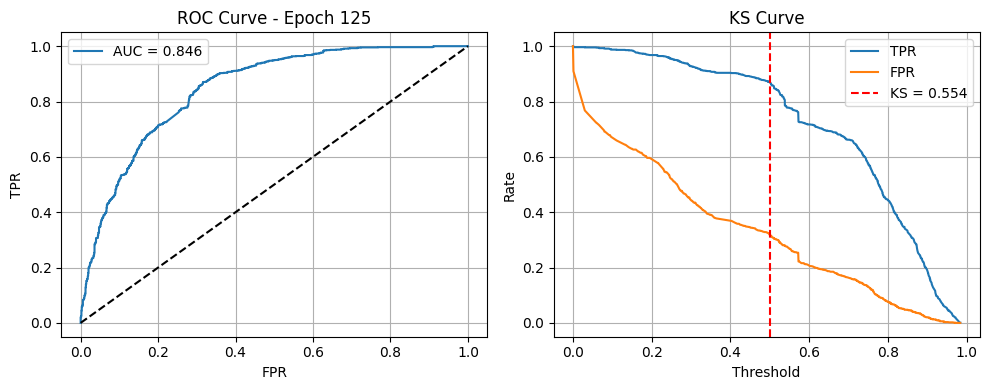

202/202 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7979 - loss: 0.4417 - val_accuracy: 0.7809 - val_loss: 0.4802
Epoch 126/500
194/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7905 - loss: 0.4457Epoch 126 - ROC AUC: 0.8453 | KS: 0.5583
202/202 ━━━━━━━━━━━━━━━━━━━━ 38s 190ms/step - accuracy: 0.7905 - loss: 0.4457 - val_accuracy: 0.7813 - val_loss: 0.4813
Epoch 127/500
179/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7896 - loss: 0.4480Epoch 127 - ROC AUC: 0.8463 | KS: 0.5576
202/202 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7891 - loss: 0.4484 - val_accuracy: 0.7823 - val_loss: 0.4794
Epoch 128/500
193/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7921 - loss: 0.4447Epoch 128 - ROC AUC: 0.8460 | KS: 0.5533
202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7920 - loss: 0.4449 - val_accuracy: 0.7772 - val_loss: 0.4800
Epoch 129/500
201/202 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7899 - loss: 0.4484Epoch 129 - ROC AUC: 0.8470 | KS: 0.5588
202/202 ━━━━━

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Validação final — Loss: 0.4791, Accuracy: 0.7748


<Figure size 640x480 with 0 Axes>

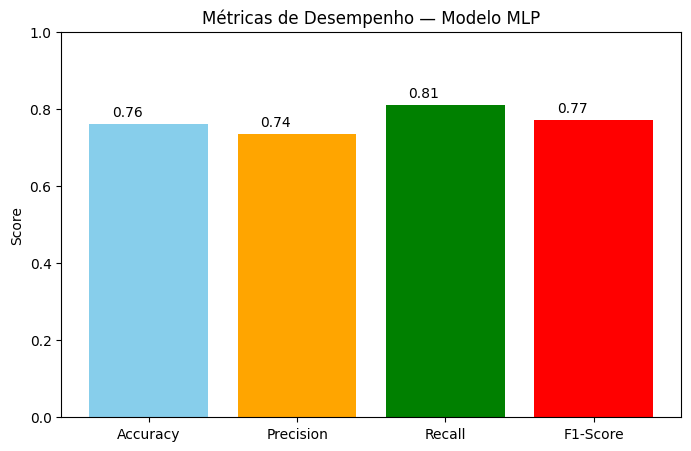

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

model = Sequential([
    Dense(20, activation='relu', input_shape=(X_train_nn.shape[1],)),
    Dropout(0.3),  # 30% dos neurônios desativados nessa camada
    Dense(20, activation='relu'),
    Dropout(0.3),  # Outro dropout antes da saída

    Dense(1, activation='sigmoid')  # Saída binária
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_val_nn, y_val_nn),
    epochs=500,
    callbacks=[early_stop, RocKsCallback(X_val_nn, y_val_nn)],
    verbose=1,
    batch_size=32
)


model.save('nn_2camada_0.3dropout_500epochs.h5')
files.download('nn_2camada_0.3dropout_500epochs.h5')

# Avaliação
loss, acc = model.evaluate(X_val_nn, y_val_nn, verbose=0)
print(f"\n✅ Validação final — Loss: {loss:.4f}, Accuracy: {acc:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [
    model.evaluate(X_test_nn, y_test_nn, verbose=0)[1],  # accuracy from model
    precision,
    recall,
    f1
]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — Modelo MLP')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



In [ ]:

model = Sequential([
    Dense(40, activation='tanh', input_shape=(X_train_nn.shape[1],)),
    Dropout(0.3),  # 30% dos neurônios desativados nessa camada
    Dense(10, activation='tanh'),
    Dropout(0.3),  # Outro dropout antes da saída

    Dense(1, activation='sigmoid')  # Saída binária
])

model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=100, restore_best_weights=True)

history = model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_val_nn, y_val_nn),
    epochs=1000,
    callbacks=[early_stop, RocKsCallback(X_val_nn, y_val_nn)],
    verbose=1,
    batch_size=32
)


model.save('nn_2camada_0.3dropout_1000epochs.h5')
files.download('nn_2camada_0.3dropout_1000epochs.h5')

# Avaliação
loss, acc = model.evaluate(X_val_nn, y_val_nn, verbose=0)
print(f"\n✅ Validação final — Loss: {loss:.4f}, Accuracy: {acc:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [
    model.evaluate(X_test_nn, y_test_nn, verbose=0)[1],  # accuracy from model
    precision,
    recall,
    f1
]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — Modelo MLP')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()

NameError: name 'Sequential' is not defined

In [ ]:
model.save('nn_2camada_0.3dropout_1000epochs.h5')
files.download('nn_2camada_0.3dropout_1000epochs.h5')


NameError: name 'model' is not defined

In [ ]:
from tabpfn import TabPFNClassifier
import torch
from sklearn.metrics import classification_report, confusion_matrix

model = TabPFNClassifier(device='cuda' if torch.cuda.is_available() else 'cpu',
    ignore_pretraining_limits=True
)
model.fit(X_train_nn, y_train_nn)

y_pred = model.predict(X_val_nn)

print("📊 Relatório de Classificação:")
print(classification_report(y_val_nn, y_pred))

print("🧩 Matriz de Confusão:")
print(confusion_matrix(y_val_nn, y_pred))

tabpfn-v2-classifier-finetuned-zk73skhh.(…):   0%|          | 0.00/29.0M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

In [ ]:
y_pred_proba = model.predict_proba(X_val_nn)[:, 1]  # probabilities for positive class

fpr, tpr, thresholds = roc_curve(y_val_nn, y_pred_proba)
ks_statistic = np.max(tpr - fpr)
ks_threshold = thresholds[np.argmax(tpr - fpr)]
y_pred_class = (y_pred_proba >= 0.5).astype(int)

acc = accuracy_score(y_val_nn, y_pred_class)
prec = precision_score(y_val_nn, y_pred_class)
rec = recall_score(y_val_nn, y_pred_class)
f1 = f1_score(y_val_nn, y_pred_class)


In [ ]:
plt.figure(figsize=(12,5))

# KS Curve subplot
plt.subplot(1,2,1)
plt.plot(thresholds, tpr, label='TPR (Recall)')
plt.plot(thresholds, fpr, label='FPR')
plt.axvline(ks_threshold, color='r', linestyle='--', label=f'KS = {ks_statistic:.3f}')
plt.xlabel('Threshold')
plt.ylabel('Rate')
plt.title('KS Curve')
plt.legend()
plt.grid(True)

# Bar plot of other metrics
plt.subplot(1,2,2)
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
metrics_values = [acc, prec, rec, f1]
plt.bar(metrics_names, metrics_values, color=['blue', 'orange', 'green', 'red'])
plt.ylim(0,1)
plt.title('Classification Metrics at Threshold=0.5')
for i, v in enumerate(metrics_values):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center')
plt.grid(axis='y')

plt.tight_layout()
plt.show()


In [ ]:
import joblib
joblib.dump(model, 'tabpfn_model.pkl')

In [ ]:

# Calculate metrics
accuracy = accuracy_score(y_val_nn, y_pred)
precision = precision_score(y_val_nn, y_pred, average='weighted')
recall = recall_score(y_val_nn, y_pred, average='weighted')
f1 = f1_score(y_val_nn, y_pred, average='weighted')

# Store in dictionary for plotting
metrics = {
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1
}

# Plot
plt.figure(figsize=(8, 5))
plt.bar(metrics.keys(), metrics.values(), color=['royalblue', 'seagreen', 'orange', 'crimson'])
plt.ylim(0, 1.05)  # scores range between 0 and 1
plt.title('🔍 Model Evaluation Metrics')
plt.ylabel('Score')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate values on top of bars
for i, (key, value) in enumerate(metrics.items()):
    plt.text(i, value + 0.02, f"{value:.2f}", ha='center', fontsize=12)

plt.tight_layout()
plt.show()


In [18]:
import torch
import torch.nn as nn

def ks_statistic(y_true, y_pred_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
    ks = np.max(np.abs(tpr - fpr))
    return ks

X_val_tensor = torch.tensor(X_val_nn, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val_nn.values, dtype=torch.float32)
val_loader = DataLoader(TensorDataset(X_val_tensor, y_val_tensor), batch_size=32)


def plot_ks_curve(y_true, y_pred_proba, title="KS Curve"):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
    ks_statistic = np.max(np.abs(tpr - fpr))
    ks_threshold = thresholds[np.argmax(np.abs(tpr - fpr))]

    plt.figure(figsize=(6,6))
    plt.plot(thresholds, tpr, label='TPR (True Positive Rate)')
    plt.plot(thresholds, fpr, label='FPR (False Positive Rate)')
    plt.axvline(ks_threshold, color='r', linestyle='--', label=f'KS = {ks_statistic:.3f}')
    plt.xlabel('Threshold')
    plt.ylabel('Rate')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def evaluate_validation(model, val_loader, device, epoch=None):
    model.eval()
    all_preds_proba = []
    all_targets = []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(device)
            preds = model(xb).squeeze().cpu().numpy()
            all_preds_proba.extend(preds)
            all_targets.extend(yb.numpy())

    all_preds_proba = np.array(all_preds_proba)
    all_targets = np.array(all_targets)

    # Plot KS curve if epoch given
    if epoch is not None and epoch%25==0:
        plot_ks_curve(all_targets, all_preds_proba, title=f"KS Curve at Epoch {epoch+1}")

    ks = ks_statistic(all_targets, all_preds_proba)

    all_preds = (all_preds_proba >= 0.5).astype(int)
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    return ks, acc, prec, rec, f1

class STABTransformer(nn.Module):
    def __init__(self, input_dim, d_model=64, n_heads=4, n_layers=2, dropout=0.1):
        super(STABTransformer, self).__init__()
        self.input_proj = nn.Linear(input_dim, d_model)

        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=n_heads, dropout=dropout, batch_first=True)
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=n_layers)

        self.head = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # x shape: (batch_size, input_dim)
        x = self.input_proj(x).unsqueeze(1)  # shape: (batch_size, seq_len=1, d_model)
        x = self.encoder(x)                 # shape: (batch_size, 1, d_model)
        x = x.squeeze(1)                    # shape: (batch_size, d_model)
        return self.head(x)


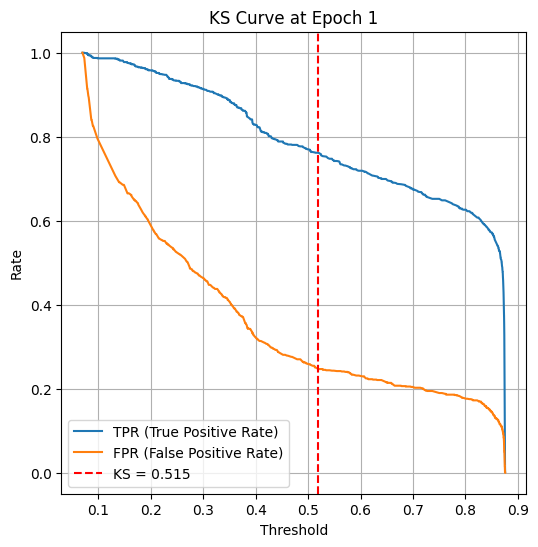

Epoch 000 — Train Loss: 0.5171 | Train Acc: 0.7546 | Val KS: 0.5150 | Val Acc: 0.7563 | Val Prec: 0.7637 | Val Recall: 0.7698 | Val F1: 0.7668
Epoch 010 — Train Loss: 0.4741 | Train Acc: 0.7761 | Val KS: 0.5186 | Val Acc: 0.7591 | Val Prec: 0.7412 | Val Recall: 0.8252 | Val F1: 0.7809
Epoch 020 — Train Loss: 0.4619 | Train Acc: 0.7786 | Val KS: 0.5182 | Val Acc: 0.7544 | Val Prec: 0.7414 | Val Recall: 0.8109 | Val F1: 0.7746


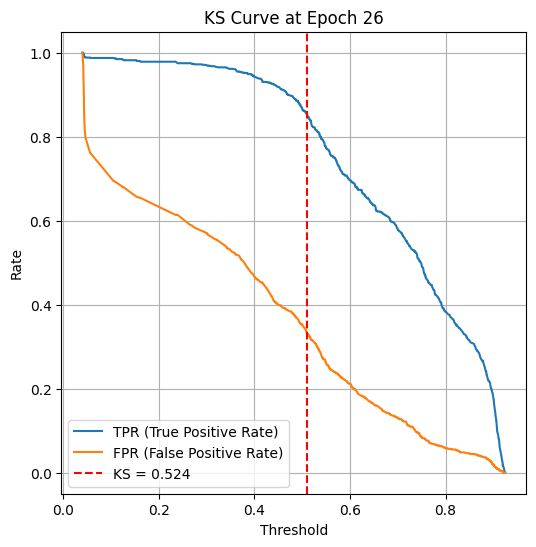

Epoch 030 — Train Loss: 0.4500 | Train Acc: 0.7868 | Val KS: 0.5189 | Val Acc: 0.7456 | Val Prec: 0.7650 | Val Recall: 0.7377 | Val F1: 0.7511
Epoch 040 — Train Loss: 0.4244 | Train Acc: 0.7990 | Val KS: 0.5361 | Val Acc: 0.7646 | Val Prec: 0.7410 | Val Recall: 0.8421 | Val F1: 0.7883


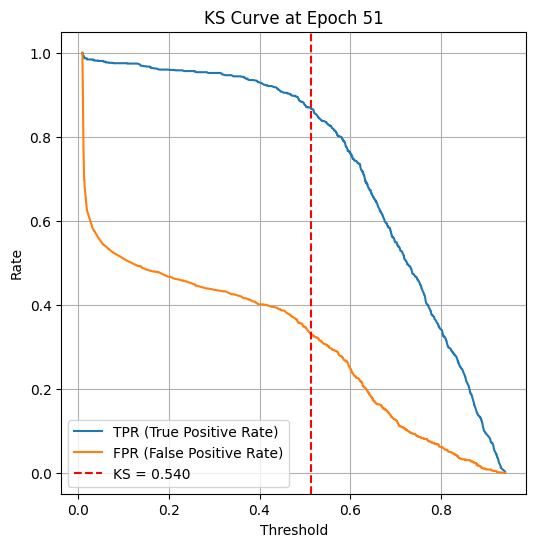

Epoch 050 — Train Loss: 0.3904 | Train Acc: 0.8254 | Val KS: 0.5397 | Val Acc: 0.7688 | Val Prec: 0.7326 | Val Recall: 0.8751 | Val F1: 0.7976
Epoch 060 — Train Loss: 0.3659 | Train Acc: 0.8389 | Val KS: 0.5339 | Val Acc: 0.7651 | Val Prec: 0.7331 | Val Recall: 0.8626 | Val F1: 0.7926
Epoch 070 — Train Loss: 0.3291 | Train Acc: 0.8527 | Val KS: 0.5855 | Val Acc: 0.7911 | Val Prec: 0.7381 | Val Recall: 0.9277 | Val F1: 0.8221


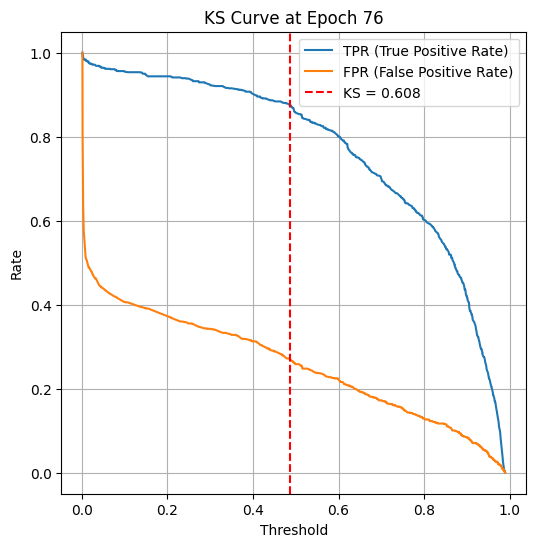

Epoch 080 — Train Loss: 0.2933 | Train Acc: 0.8709 | Val KS: 0.5907 | Val Acc: 0.7925 | Val Prec: 0.7687 | Val Recall: 0.8599 | Val F1: 0.8118
Epoch 090 — Train Loss: 0.2747 | Train Acc: 0.8785 | Val KS: 0.6071 | Val Acc: 0.7962 | Val Prec: 0.7777 | Val Recall: 0.8519 | Val F1: 0.8131
Epoch 099 — Train Loss: 0.2649 | Train Acc: 0.8801 | Val KS: 0.6179 | Val Acc: 0.8041 | Val Prec: 0.7812 | Val Recall: 0.8662 | Val F1: 0.8215


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F

X_train_tensor = torch.tensor(X_train_nn, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_nn, dtype=torch.float32)


train_loader = DataLoader(TensorDataset(X_train_tensor, y_train_tensor), batch_size=32, shuffle=True)

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = STABTransformer(input_dim=X_train_tensor.shape[1]).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.BCELoss()

epochs=100
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    all_preds = []
    all_targets = []

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        preds_np = (pred > 0.5).detach().cpu().numpy()
        targets_np = yb.detach().cpu().numpy()

        all_preds.extend(preds_np)
        all_targets.extend(targets_np)

    # Training metrics
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    # Validation metrics
    ks_val, acc_val, prec_val, rec_val, f1_val = evaluate_validation(model, val_loader, device, epoch)

    if epoch % 10 == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch:03d} — Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Train Acc: {acc:.4f} | Val KS: {ks_val:.4f} | Val Acc: {acc_val:.4f} | "
              f"Val Prec: {prec_val:.4f} | Val Recall: {rec_val:.4f} | Val F1: {f1_val:.4f}")


In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)


# Save model weights
torch.save(model.state_dict(), 'stab_transformer_4head_2layer_0.1droput.pt')
files.download('stab_transformer_4head_2layer_0.1droput.pt')


acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Accuracy: 0.8129
✅ Precision: 0.7854
✅ Recall: 0.8814
✅ F1 Score: 0.8306


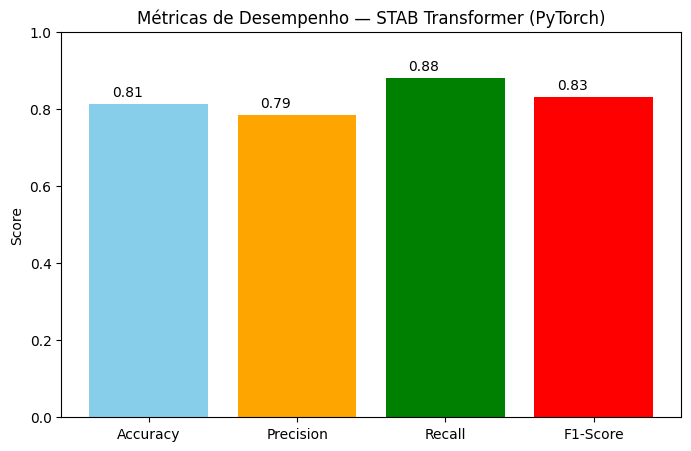

In [ ]:
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()


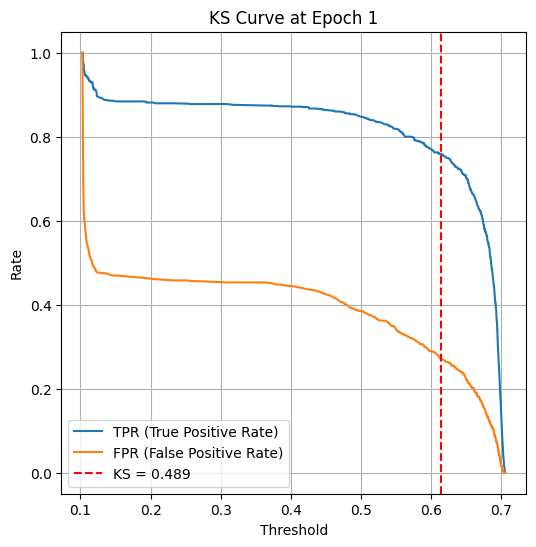

Epoch 000 — Train Loss: 0.5426 | Train Acc: 0.7526 | Val KS: 0.4891 | Val Acc: 0.7358 | Val Prec: 0.7047 | Val Recall: 0.8475 | Val F1: 0.7695
Epoch 010 — Train Loss: 0.4901 | Train Acc: 0.7665 | Val KS: 0.5173 | Val Acc: 0.7618 | Val Prec: 0.7346 | Val Recall: 0.8492 | Val F1: 0.7878
Epoch 020 — Train Loss: 0.4841 | Train Acc: 0.7719 | Val KS: 0.5207 | Val Acc: 0.7623 | Val Prec: 0.7228 | Val Recall: 0.8814 | Val F1: 0.7942


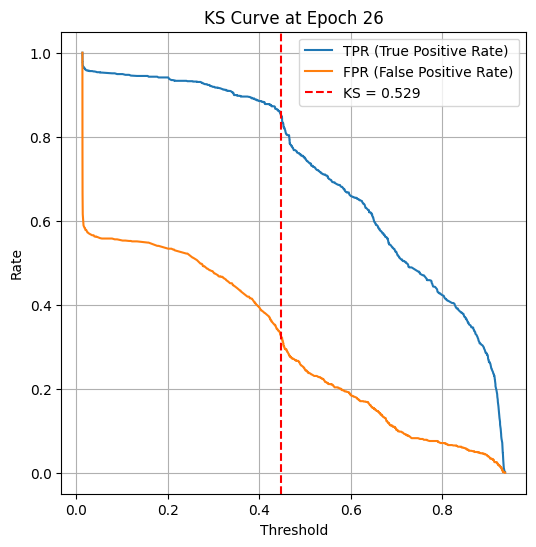

Epoch 030 — Train Loss: 0.4793 | Train Acc: 0.7721 | Val KS: 0.5174 | Val Acc: 0.7419 | Val Prec: 0.7817 | Val Recall: 0.6994 | Val F1: 0.7382
Epoch 040 — Train Loss: 0.4728 | Train Acc: 0.7721 | Val KS: 0.5253 | Val Acc: 0.7530 | Val Prec: 0.7632 | Val Recall: 0.7618 | Val F1: 0.7625


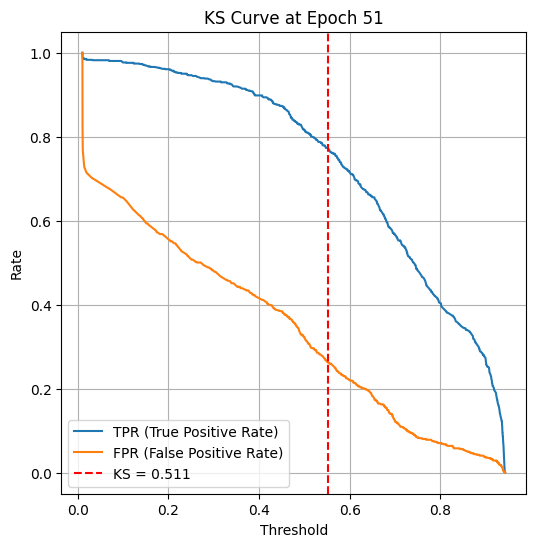

Epoch 050 — Train Loss: 0.4741 | Train Acc: 0.7762 | Val KS: 0.5111 | Val Acc: 0.7498 | Val Prec: 0.7332 | Val Recall: 0.8162 | Val F1: 0.7725
Epoch 060 — Train Loss: 0.4644 | Train Acc: 0.7821 | Val KS: 0.4931 | Val Acc: 0.7419 | Val Prec: 0.7119 | Val Recall: 0.8466 | Val F1: 0.7734
Epoch 070 — Train Loss: 0.4590 | Train Acc: 0.7880 | Val KS: 0.5242 | Val Acc: 0.7577 | Val Prec: 0.7081 | Val Recall: 0.9090 | Val F1: 0.7961


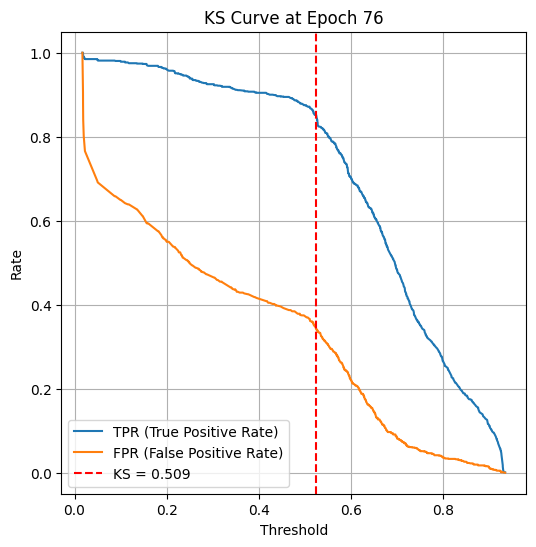

Epoch 080 — Train Loss: 0.4629 | Train Acc: 0.7816 | Val KS: 0.5177 | Val Acc: 0.7618 | Val Prec: 0.7229 | Val Recall: 0.8796 | Val F1: 0.7936
Epoch 090 — Train Loss: 0.4636 | Train Acc: 0.7855 | Val KS: 0.5201 | Val Acc: 0.7609 | Val Prec: 0.7345 | Val Recall: 0.8466 | Val F1: 0.7866


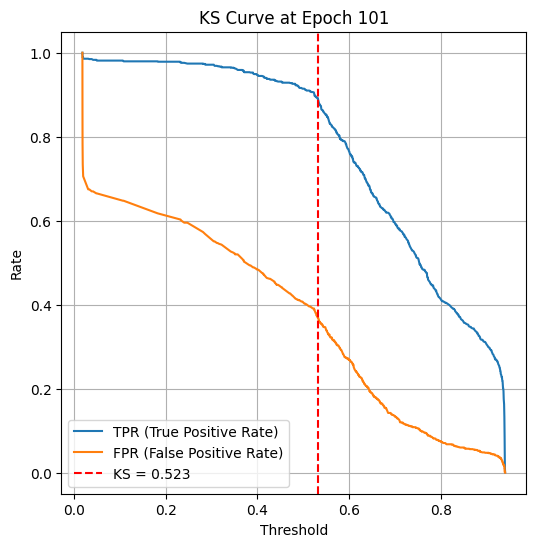

Epoch 100 — Train Loss: 0.4531 | Train Acc: 0.7895 | Val KS: 0.5232 | Val Acc: 0.7609 | Val Prec: 0.7098 | Val Recall: 0.9144 | Val F1: 0.7992
Epoch 110 — Train Loss: 0.4311 | Train Acc: 0.8013 | Val KS: 0.5211 | Val Acc: 0.7572 | Val Prec: 0.7415 | Val Recall: 0.8189 | Val F1: 0.7783
Epoch 120 — Train Loss: 0.4169 | Train Acc: 0.8075 | Val KS: 0.5298 | Val Acc: 0.7669 | Val Prec: 0.7127 | Val Recall: 0.9251 | Val F1: 0.8051


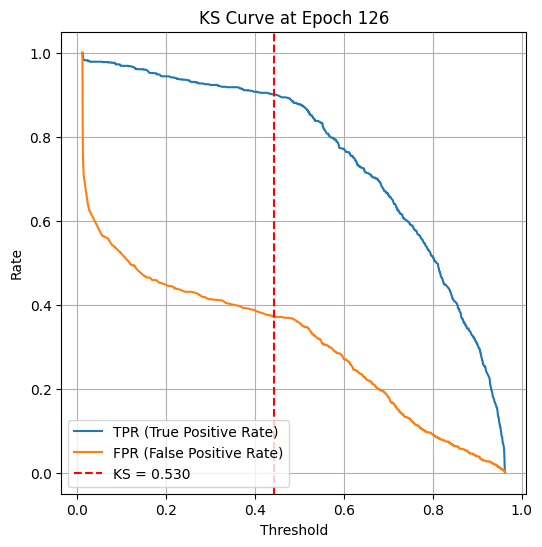

Epoch 130 — Train Loss: 0.4111 | Train Acc: 0.8157 | Val KS: 0.5322 | Val Acc: 0.7669 | Val Prec: 0.7169 | Val Recall: 0.9126 | Val F1: 0.8030
Epoch 140 — Train Loss: 0.3975 | Train Acc: 0.8202 | Val KS: 0.5467 | Val Acc: 0.7753 | Val Prec: 0.7486 | Val Recall: 0.8555 | Val F1: 0.7985


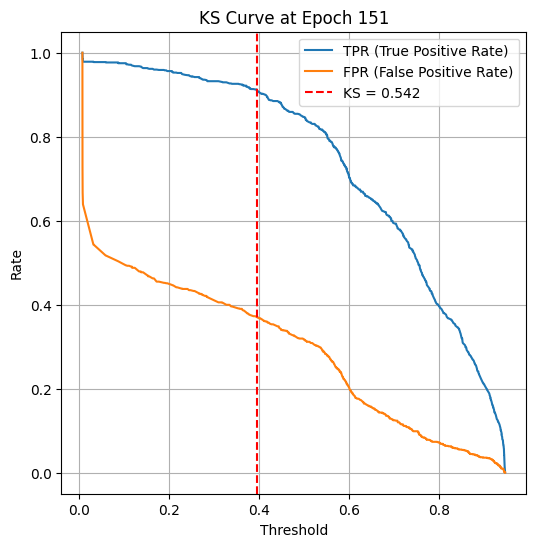

Epoch 150 — Train Loss: 0.3915 | Train Acc: 0.8242 | Val KS: 0.5418 | Val Acc: 0.7679 | Val Prec: 0.7431 | Val Recall: 0.8466 | Val F1: 0.7915
Epoch 160 — Train Loss: 0.3822 | Train Acc: 0.8307 | Val KS: 0.5658 | Val Acc: 0.7786 | Val Prec: 0.7249 | Val Recall: 0.9260 | Val F1: 0.8132
Epoch 170 — Train Loss: 0.3682 | Train Acc: 0.8321 | Val KS: 0.5600 | Val Acc: 0.7818 | Val Prec: 0.7340 | Val Recall: 0.9108 | Val F1: 0.8129


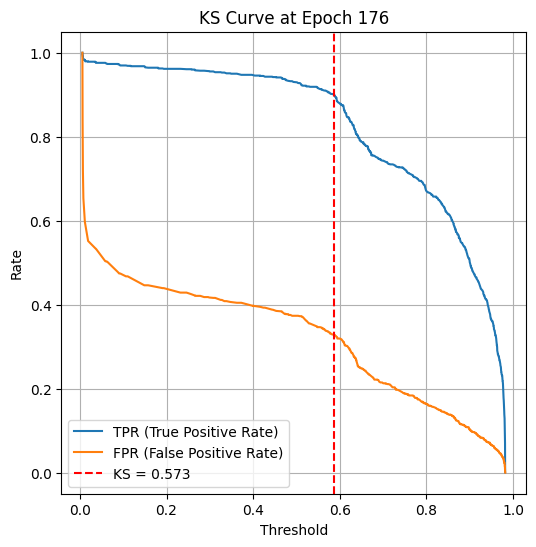

Epoch 180 — Train Loss: 0.3681 | Train Acc: 0.8323 | Val KS: 0.5728 | Val Acc: 0.7832 | Val Prec: 0.7280 | Val Recall: 0.9313 | Val F1: 0.8172
Epoch 190 — Train Loss: 0.3521 | Train Acc: 0.8457 | Val KS: 0.5900 | Val Acc: 0.7976 | Val Prec: 0.7531 | Val Recall: 0.9090 | Val F1: 0.8238


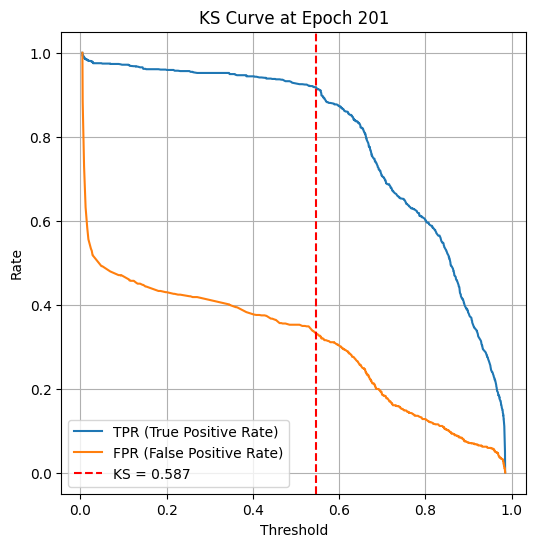

Epoch 200 — Train Loss: 0.3477 | Train Acc: 0.8485 | Val KS: 0.5869 | Val Acc: 0.7925 | Val Prec: 0.7404 | Val Recall: 0.9260 | Val F1: 0.8228
Epoch 210 — Train Loss: 0.3303 | Train Acc: 0.8559 | Val KS: 0.5945 | Val Acc: 0.8013 | Val Prec: 0.7580 | Val Recall: 0.9081 | Val F1: 0.8263
Epoch 220 — Train Loss: 0.3265 | Train Acc: 0.8572 | Val KS: 0.6085 | Val Acc: 0.7990 | Val Prec: 0.7675 | Val Recall: 0.8805 | Val F1: 0.8201


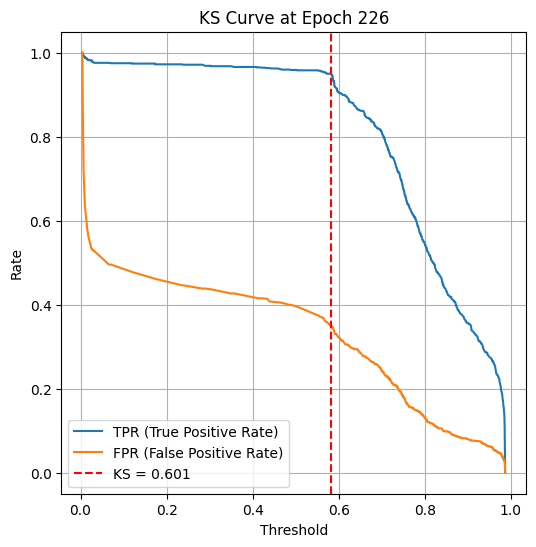

Epoch 230 — Train Loss: 0.3273 | Train Acc: 0.8607 | Val KS: 0.5898 | Val Acc: 0.7953 | Val Prec: 0.7572 | Val Recall: 0.8930 | Val F1: 0.8195
Epoch 240 — Train Loss: 0.3189 | Train Acc: 0.8606 | Val KS: 0.6160 | Val Acc: 0.8027 | Val Prec: 0.7766 | Val Recall: 0.8715 | Val F1: 0.8214


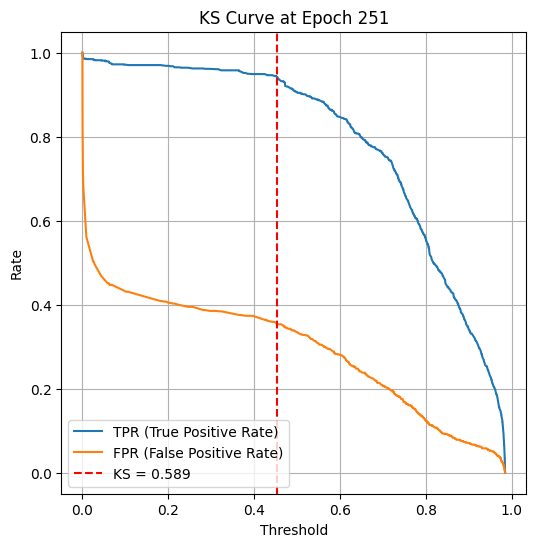

Epoch 250 — Train Loss: 0.3031 | Train Acc: 0.8691 | Val KS: 0.5887 | Val Acc: 0.7902 | Val Prec: 0.7458 | Val Recall: 0.9054 | Val F1: 0.8179
Epoch 260 — Train Loss: 0.2941 | Train Acc: 0.8717 | Val KS: 0.6081 | Val Acc: 0.8041 | Val Prec: 0.7772 | Val Recall: 0.8742 | Val F1: 0.8228
Epoch 270 — Train Loss: 0.2854 | Train Acc: 0.8736 | Val KS: 0.6014 | Val Acc: 0.7999 | Val Prec: 0.7447 | Val Recall: 0.9367 | Val F1: 0.8297


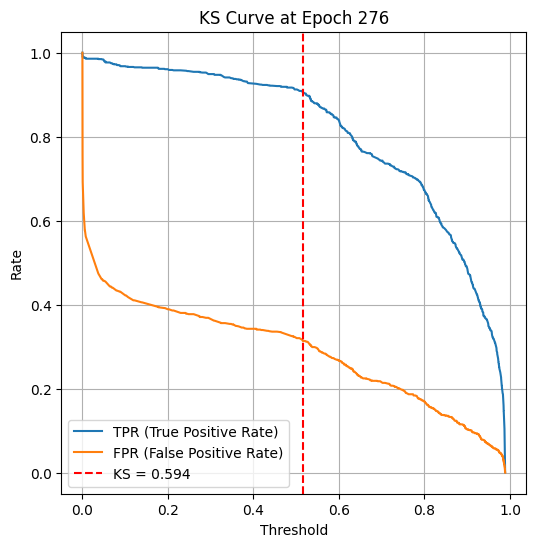

Epoch 280 — Train Loss: 0.2888 | Train Acc: 0.8751 | Val KS: 0.6071 | Val Acc: 0.8045 | Val Prec: 0.7489 | Val Recall: 0.9393 | Val F1: 0.8334
Epoch 290 — Train Loss: 0.2785 | Train Acc: 0.8774 | Val KS: 0.6123 | Val Acc: 0.8064 | Val Prec: 0.7540 | Val Recall: 0.9322 | Val F1: 0.8337


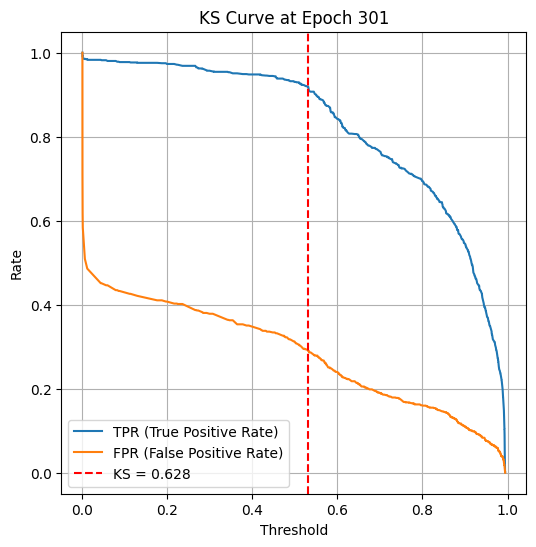

Epoch 300 — Train Loss: 0.2773 | Train Acc: 0.8822 | Val KS: 0.6283 | Val Acc: 0.8148 | Val Prec: 0.7647 | Val Recall: 0.9304 | Val F1: 0.8394
Epoch 310 — Train Loss: 0.2713 | Train Acc: 0.8873 | Val KS: 0.6231 | Val Acc: 0.8152 | Val Prec: 0.7621 | Val Recall: 0.9376 | Val F1: 0.8408
Epoch 320 — Train Loss: 0.2704 | Train Acc: 0.8858 | Val KS: 0.6303 | Val Acc: 0.8069 | Val Prec: 0.7756 | Val Recall: 0.8849 | Val F1: 0.8267


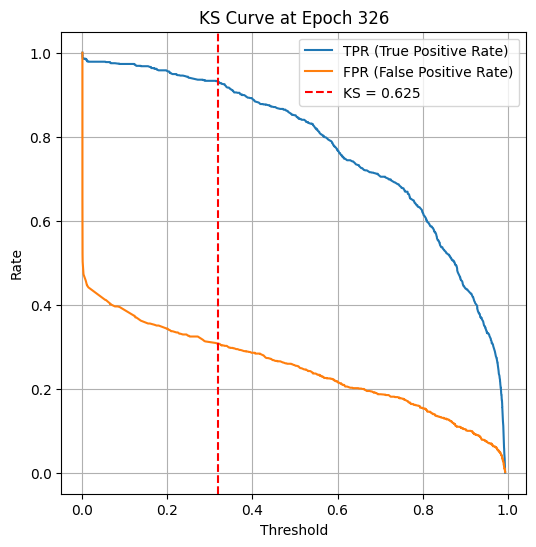

Epoch 330 — Train Loss: 0.2641 | Train Acc: 0.8829 | Val KS: 0.6054 | Val Acc: 0.8055 | Val Prec: 0.7573 | Val Recall: 0.9215 | Val F1: 0.8314
Epoch 340 — Train Loss: 0.2547 | Train Acc: 0.8931 | Val KS: 0.6333 | Val Acc: 0.8097 | Val Prec: 0.7754 | Val Recall: 0.8930 | Val F1: 0.8300


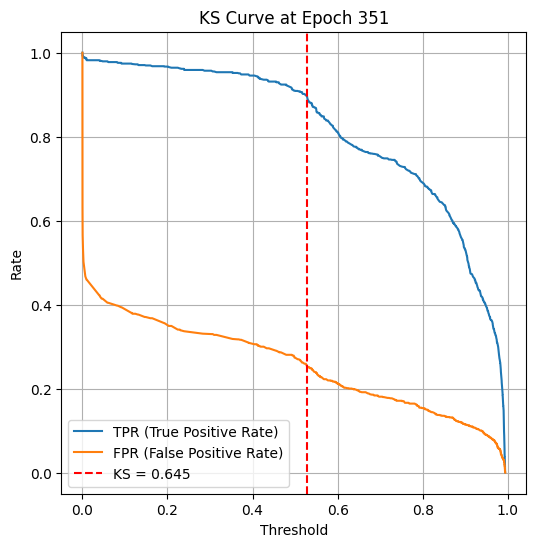

Epoch 350 — Train Loss: 0.2460 | Train Acc: 0.8920 | Val KS: 0.6448 | Val Acc: 0.8217 | Val Prec: 0.7832 | Val Recall: 0.9090 | Val F1: 0.8415
Epoch 360 — Train Loss: 0.2616 | Train Acc: 0.8918 | Val KS: 0.6319 | Val Acc: 0.8175 | Val Prec: 0.7692 | Val Recall: 0.9277 | Val F1: 0.8411
Epoch 370 — Train Loss: 0.2467 | Train Acc: 0.8946 | Val KS: 0.6300 | Val Acc: 0.8166 | Val Prec: 0.7729 | Val Recall: 0.9170 | Val F1: 0.8388


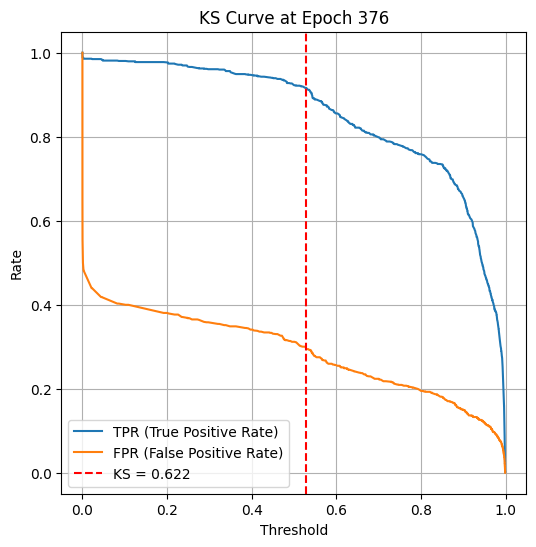

Epoch 380 — Train Loss: 0.2269 | Train Acc: 0.9024 | Val KS: 0.6352 | Val Acc: 0.8217 | Val Prec: 0.7692 | Val Recall: 0.9393 | Val F1: 0.8458
Epoch 390 — Train Loss: 0.2464 | Train Acc: 0.8948 | Val KS: 0.6458 | Val Acc: 0.8245 | Val Prec: 0.7742 | Val Recall: 0.9358 | Val F1: 0.8473


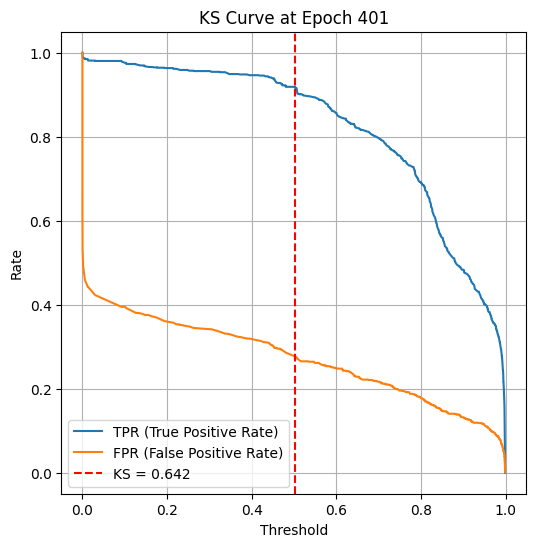

Epoch 400 — Train Loss: 0.2289 | Train Acc: 0.9020 | Val KS: 0.6420 | Val Acc: 0.8240 | Val Prec: 0.7815 | Val Recall: 0.9188 | Val F1: 0.8446
Epoch 410 — Train Loss: 0.2317 | Train Acc: 0.8980 | Val KS: 0.6499 | Val Acc: 0.8268 | Val Prec: 0.7783 | Val Recall: 0.9331 | Val F1: 0.8487
Epoch 420 — Train Loss: 0.2236 | Train Acc: 0.9041 | Val KS: 0.6329 | Val Acc: 0.8166 | Val Prec: 0.7615 | Val Recall: 0.9429 | Val F1: 0.8426


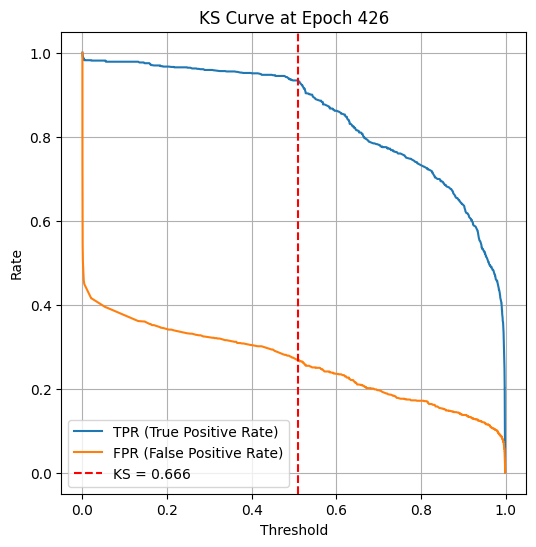

Epoch 430 — Train Loss: 0.2223 | Train Acc: 0.9041 | Val KS: 0.6519 | Val Acc: 0.8268 | Val Prec: 0.7846 | Val Recall: 0.9197 | Val F1: 0.8468
Epoch 440 — Train Loss: 0.2222 | Train Acc: 0.9027 | Val KS: 0.6256 | Val Acc: 0.8143 | Val Prec: 0.7823 | Val Recall: 0.8912 | Val F1: 0.8332


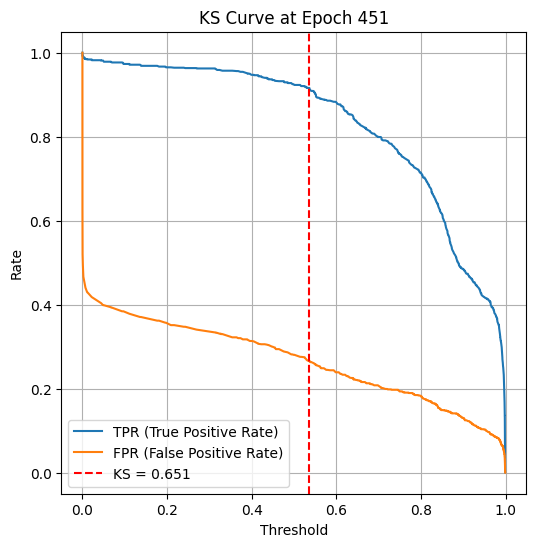

Epoch 450 — Train Loss: 0.2146 | Train Acc: 0.9059 | Val KS: 0.6509 | Val Acc: 0.8254 | Val Prec: 0.7811 | Val Recall: 0.9233 | Val F1: 0.8463
Epoch 460 — Train Loss: 0.2215 | Train Acc: 0.9059 | Val KS: 0.6571 | Val Acc: 0.8287 | Val Prec: 0.7793 | Val Recall: 0.9358 | Val F1: 0.8504
Epoch 470 — Train Loss: 0.2165 | Train Acc: 0.9051 | Val KS: 0.6357 | Val Acc: 0.8213 | Val Prec: 0.7690 | Val Recall: 0.9384 | Val F1: 0.8453


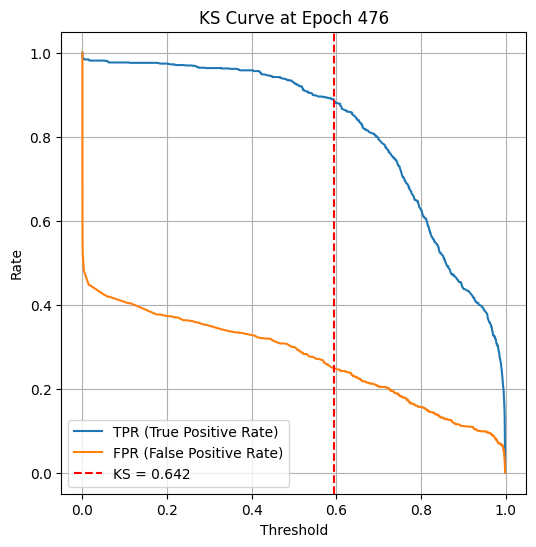

Epoch 480 — Train Loss: 0.2169 | Train Acc: 0.9107 | Val KS: 0.6692 | Val Acc: 0.8268 | Val Prec: 0.7936 | Val Recall: 0.9019 | Val F1: 0.8443
Epoch 490 — Train Loss: 0.2048 | Train Acc: 0.9084 | Val KS: 0.6572 | Val Acc: 0.8319 | Val Prec: 0.7935 | Val Recall: 0.9153 | Val F1: 0.8500
Epoch 499 — Train Loss: 0.2143 | Train Acc: 0.9075 | Val KS: 0.6458 | Val Acc: 0.8273 | Val Prec: 0.7748 | Val Recall: 0.9420 | Val F1: 0.8502


In [ ]:

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = STABTransformer(input_dim=X_train_tensor.shape[1], n_heads=8, n_layers=3, dropout=0.3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.BCELoss()


epochs=500
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    all_preds = []
    all_targets = []

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        preds_np = (pred > 0.5).detach().cpu().numpy()
        targets_np = yb.detach().cpu().numpy()

        all_preds.extend(preds_np)
        all_targets.extend(targets_np)

    # Training metrics
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    # Validation metrics
    ks_val, acc_val, prec_val, rec_val, f1_val = evaluate_validation(model, val_loader, device, epoch)

    if epoch % 10 == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch:03d} — Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Train Acc: {acc:.4f} | Val KS: {ks_val:.4f} | Val Acc: {acc_val:.4f} | "
              f"Val Prec: {prec_val:.4f} | Val Recall: {rec_val:.4f} | Val F1: {f1_val:.4f}")


In [ ]:

torch.save(model.state_dict(), 'stab_transformer_8head_3layer_0.3droput_500epochs.pt')
files.download('stab_transformer_8head_3layer_0.3droput_500epochs.pt')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Accuracy: 0.8236
✅ Precision: 0.7742
✅ Recall: 0.9331
✅ F1 Score: 0.8463


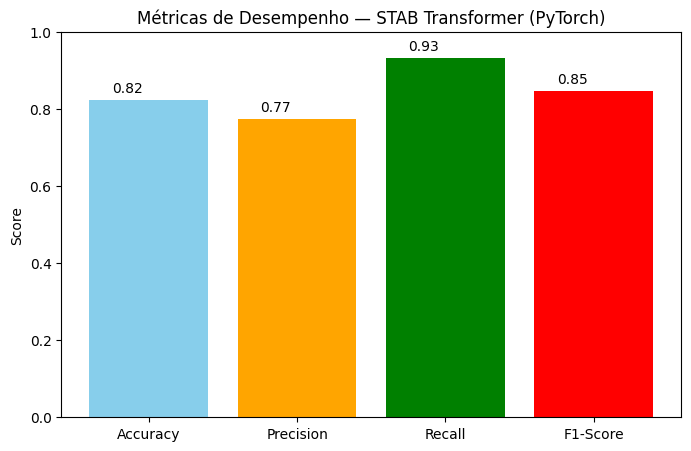

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)


# Save model weights
torch.save(model.state_dict(), 'stab_transformer_4head_2layer_0.1droput.pt')
files.download('stab_transformer_4head_2layer_0.1droput.pt')


acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



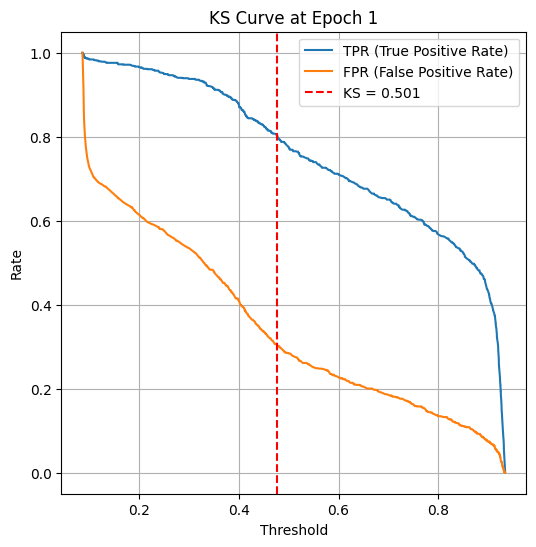

Epoch 000 — Train Loss: 0.5273 | Train Acc: 0.7502 | Val KS: 0.5008 | Val Acc: 0.7465 | Val Prec: 0.7476 | Val Recall: 0.7743 | Val F1: 0.7607
Epoch 010 — Train Loss: 0.4850 | Train Acc: 0.7696 | Val KS: 0.5199 | Val Acc: 0.7609 | Val Prec: 0.7218 | Val Recall: 0.8796 | Val F1: 0.7929
Epoch 020 — Train Loss: 0.4775 | Train Acc: 0.7764 | Val KS: 0.5134 | Val Acc: 0.7572 | Val Prec: 0.7293 | Val Recall: 0.8483 | Val F1: 0.7843


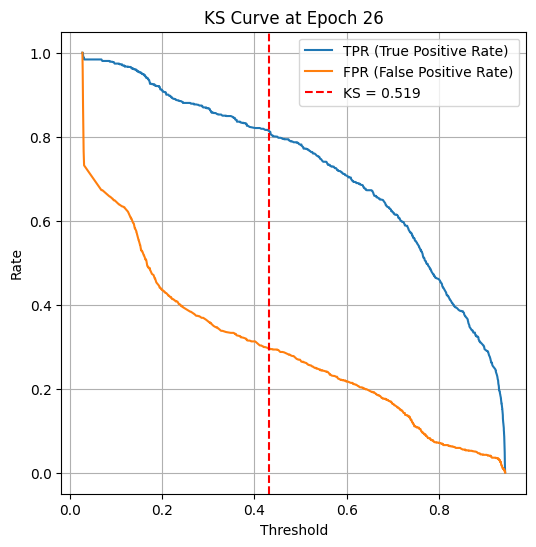

Epoch 030 — Train Loss: 0.4687 | Train Acc: 0.7810 | Val KS: 0.5188 | Val Acc: 0.7516 | Val Prec: 0.7593 | Val Recall: 0.7654 | Val F1: 0.7623
Epoch 040 — Train Loss: 0.4645 | Train Acc: 0.7806 | Val KS: 0.5117 | Val Acc: 0.7535 | Val Prec: 0.7349 | Val Recall: 0.8234 | Val F1: 0.7766


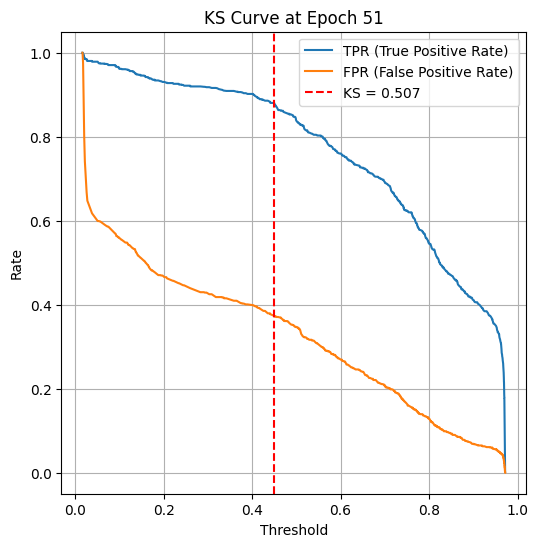

Epoch 050 — Train Loss: 0.4591 | Train Acc: 0.7826 | Val KS: 0.5069 | Val Acc: 0.7498 | Val Prec: 0.7242 | Val Recall: 0.8385 | Val F1: 0.7772
Epoch 060 — Train Loss: 0.4494 | Train Acc: 0.7916 | Val KS: 0.5103 | Val Acc: 0.7553 | Val Prec: 0.7207 | Val Recall: 0.8653 | Val F1: 0.7864
Epoch 070 — Train Loss: 0.4382 | Train Acc: 0.8005 | Val KS: 0.5259 | Val Acc: 0.7581 | Val Prec: 0.7107 | Val Recall: 0.9028 | Val F1: 0.7953


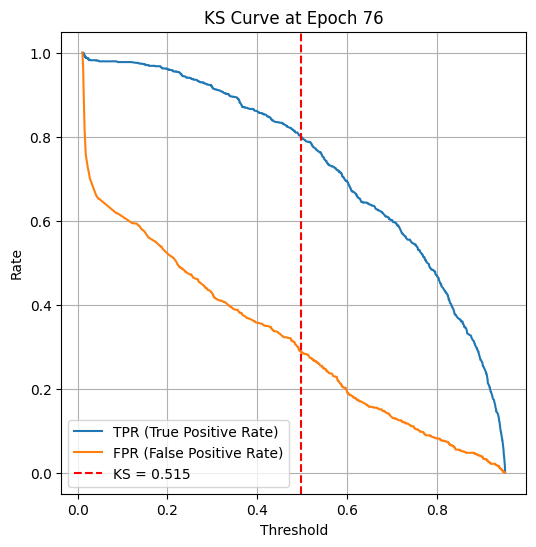

Epoch 080 — Train Loss: 0.4248 | Train Acc: 0.8070 | Val KS: 0.5323 | Val Acc: 0.7586 | Val Prec: 0.7375 | Val Recall: 0.8323 | Val F1: 0.7821
Epoch 090 — Train Loss: 0.4004 | Train Acc: 0.8199 | Val KS: 0.5442 | Val Acc: 0.7744 | Val Prec: 0.7257 | Val Recall: 0.9108 | Val F1: 0.8078


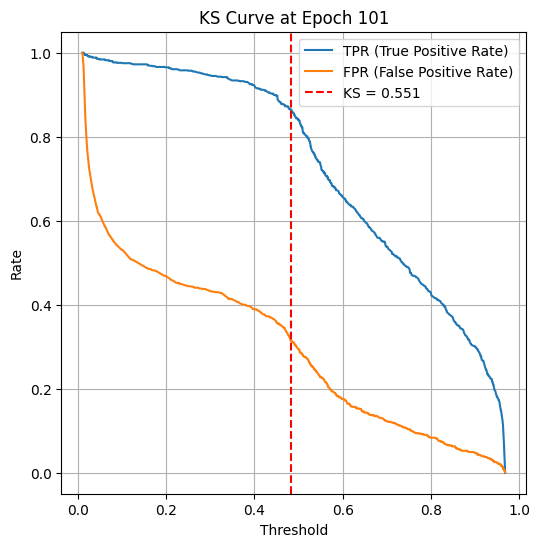

Epoch 100 — Train Loss: 0.3896 | Train Acc: 0.8166 | Val KS: 0.5508 | Val Acc: 0.7762 | Val Prec: 0.7566 | Val Recall: 0.8403 | Val F1: 0.7963
Epoch 110 — Train Loss: 0.3783 | Train Acc: 0.8259 | Val KS: 0.5337 | Val Acc: 0.7688 | Val Prec: 0.7365 | Val Recall: 0.8653 | Val F1: 0.7957
Epoch 120 — Train Loss: 0.3631 | Train Acc: 0.8302 | Val KS: 0.5696 | Val Acc: 0.7897 | Val Prec: 0.7359 | Val Recall: 0.9295 | Val F1: 0.8214


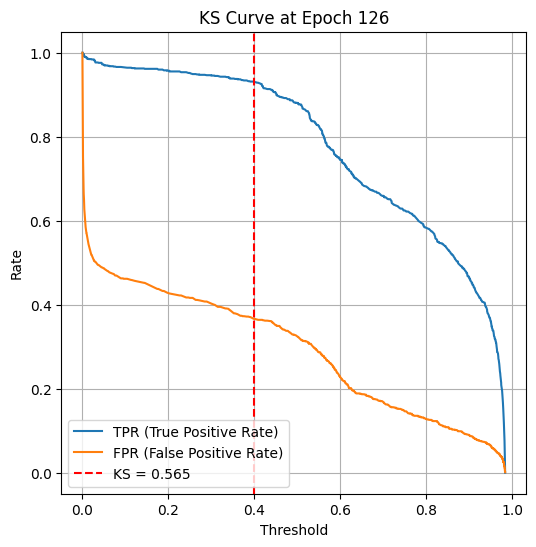

Epoch 130 — Train Loss: 0.3526 | Train Acc: 0.8397 | Val KS: 0.5665 | Val Acc: 0.7860 | Val Prec: 0.7381 | Val Recall: 0.9126 | Val F1: 0.8161
Epoch 140 — Train Loss: 0.3413 | Train Acc: 0.8420 | Val KS: 0.5886 | Val Acc: 0.7967 | Val Prec: 0.7498 | Val Recall: 0.9144 | Val F1: 0.8240


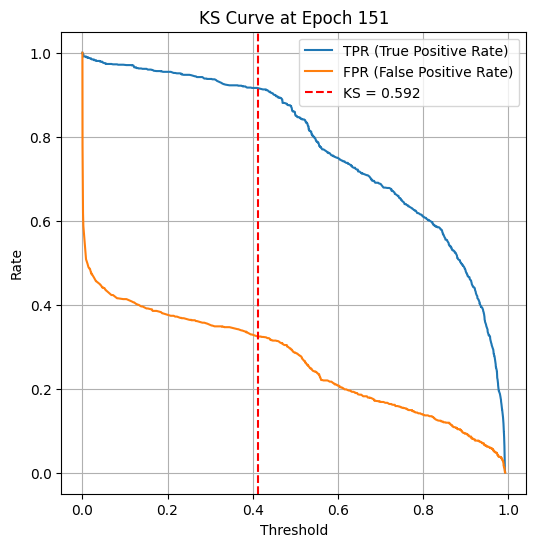

Epoch 150 — Train Loss: 0.3331 | Train Acc: 0.8462 | Val KS: 0.5918 | Val Acc: 0.7855 | Val Prec: 0.7638 | Val Recall: 0.8510 | Val F1: 0.8051
Epoch 160 — Train Loss: 0.3175 | Train Acc: 0.8544 | Val KS: 0.5977 | Val Acc: 0.7999 | Val Prec: 0.7482 | Val Recall: 0.9277 | Val F1: 0.8284
Epoch 170 — Train Loss: 0.3004 | Train Acc: 0.8652 | Val KS: 0.6055 | Val Acc: 0.8022 | Val Prec: 0.7538 | Val Recall: 0.9206 | Val F1: 0.8289


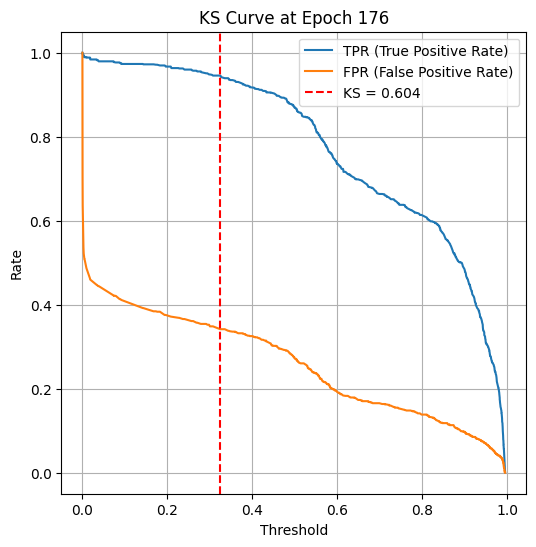

Epoch 180 — Train Loss: 0.2978 | Train Acc: 0.8646 | Val KS: 0.5952 | Val Acc: 0.7967 | Val Prec: 0.7629 | Val Recall: 0.8840 | Val F1: 0.8190
Epoch 190 — Train Loss: 0.2934 | Train Acc: 0.8699 | Val KS: 0.6102 | Val Acc: 0.7967 | Val Prec: 0.7617 | Val Recall: 0.8867 | Val F1: 0.8195


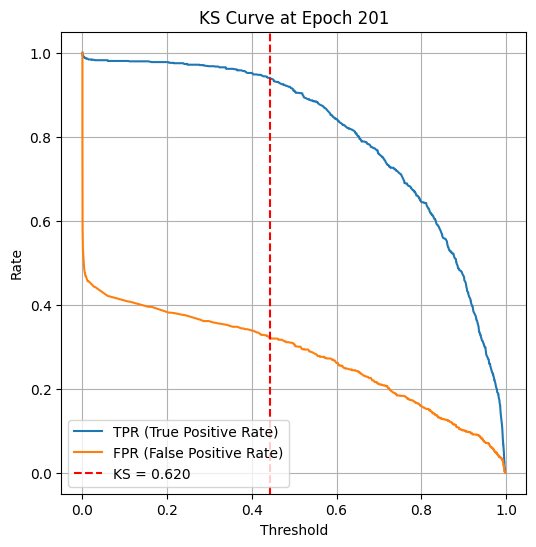

Epoch 200 — Train Loss: 0.2799 | Train Acc: 0.8742 | Val KS: 0.6198 | Val Acc: 0.8059 | Val Prec: 0.7633 | Val Recall: 0.9090 | Val F1: 0.8298
Epoch 210 — Train Loss: 0.2745 | Train Acc: 0.8722 | Val KS: 0.6139 | Val Acc: 0.8087 | Val Prec: 0.7616 | Val Recall: 0.9206 | Val F1: 0.8336
Epoch 220 — Train Loss: 0.2684 | Train Acc: 0.8802 | Val KS: 0.6217 | Val Acc: 0.8041 | Val Prec: 0.7733 | Val Recall: 0.8822 | Val F1: 0.8242


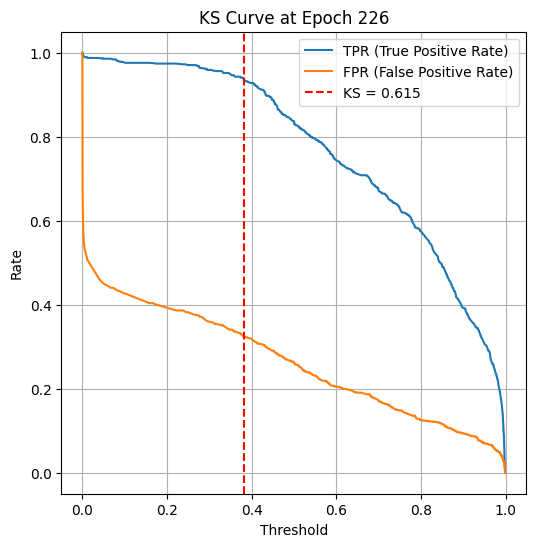

Epoch 230 — Train Loss: 0.2685 | Train Acc: 0.8788 | Val KS: 0.6227 | Val Acc: 0.8050 | Val Prec: 0.7793 | Val Recall: 0.8724 | Val F1: 0.8232
Epoch 240 — Train Loss: 0.2573 | Train Acc: 0.8866 | Val KS: 0.6175 | Val Acc: 0.8045 | Val Prec: 0.7730 | Val Recall: 0.8840 | Val F1: 0.8248


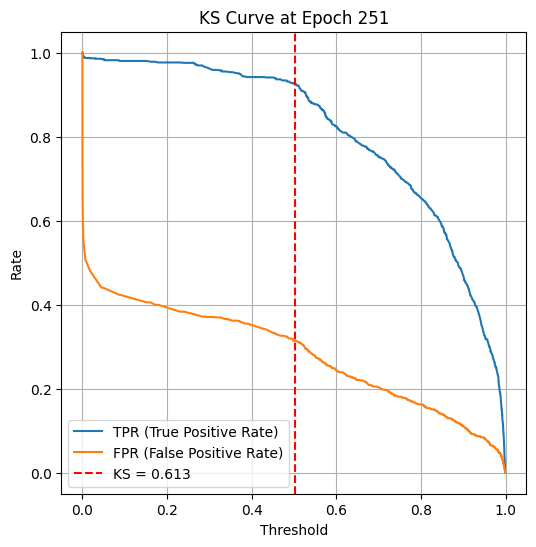

Epoch 250 — Train Loss: 0.2431 | Train Acc: 0.8907 | Val KS: 0.6132 | Val Acc: 0.8115 | Val Prec: 0.7623 | Val Recall: 0.9269 | Val F1: 0.8366
Epoch 260 — Train Loss: 0.2601 | Train Acc: 0.8883 | Val KS: 0.6380 | Val Acc: 0.8180 | Val Prec: 0.7872 | Val Recall: 0.8912 | Val F1: 0.8360
Epoch 270 — Train Loss: 0.2513 | Train Acc: 0.8890 | Val KS: 0.6322 | Val Acc: 0.8073 | Val Prec: 0.7861 | Val Recall: 0.8653 | Val F1: 0.8238


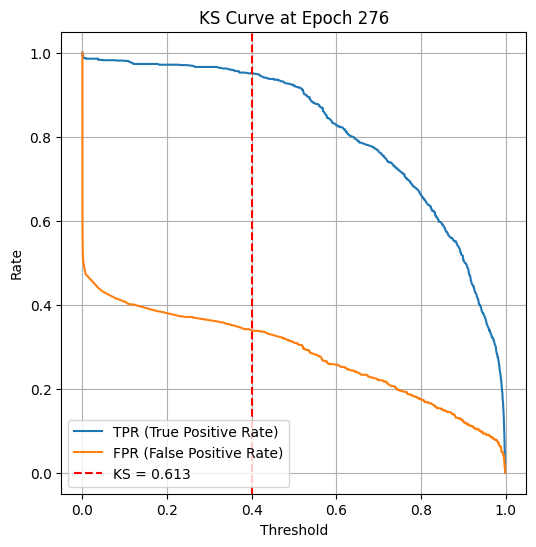

Epoch 280 — Train Loss: 0.2393 | Train Acc: 0.8952 | Val KS: 0.6237 | Val Acc: 0.8138 | Val Prec: 0.7632 | Val Recall: 0.9313 | Val F1: 0.8389
Epoch 290 — Train Loss: 0.2392 | Train Acc: 0.8980 | Val KS: 0.6446 | Val Acc: 0.8106 | Val Prec: 0.7925 | Val Recall: 0.8617 | Val F1: 0.8256


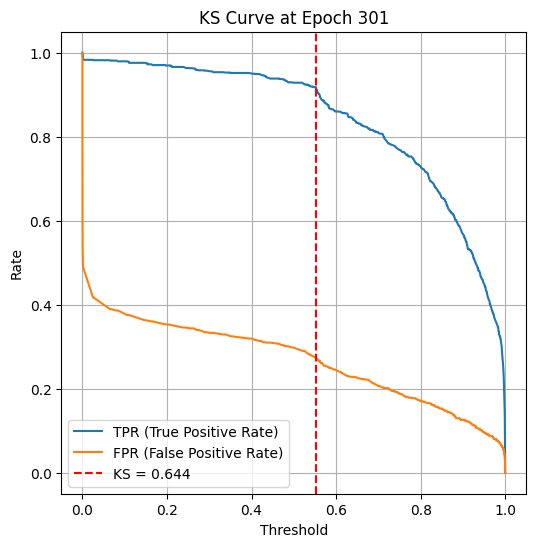

Epoch 300 — Train Loss: 0.2372 | Train Acc: 0.8942 | Val KS: 0.6440 | Val Acc: 0.8203 | Val Prec: 0.7723 | Val Recall: 0.9286 | Val F1: 0.8433
Epoch 310 — Train Loss: 0.2335 | Train Acc: 0.8997 | Val KS: 0.6479 | Val Acc: 0.8180 | Val Prec: 0.7895 | Val Recall: 0.8867 | Val F1: 0.8353
Epoch 320 — Train Loss: 0.2259 | Train Acc: 0.9017 | Val KS: 0.6548 | Val Acc: 0.8208 | Val Prec: 0.7905 | Val Recall: 0.8921 | Val F1: 0.8382


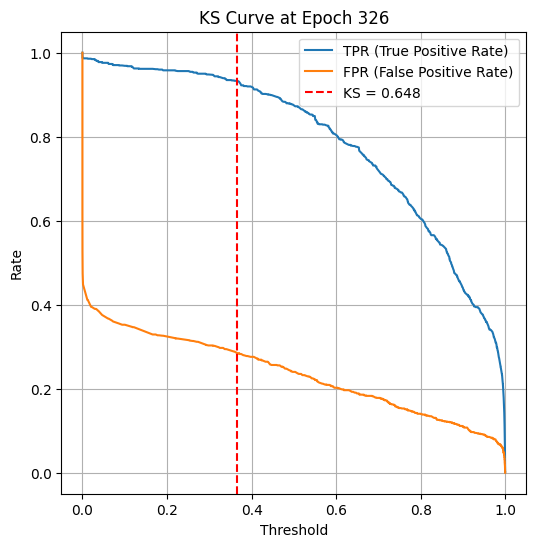

Epoch 330 — Train Loss: 0.2216 | Train Acc: 0.9030 | Val KS: 0.6437 | Val Acc: 0.8240 | Val Prec: 0.7836 | Val Recall: 0.9144 | Val F1: 0.8440
Epoch 340 — Train Loss: 0.2282 | Train Acc: 0.9003 | Val KS: 0.6419 | Val Acc: 0.8213 | Val Prec: 0.7831 | Val Recall: 0.9081 | Val F1: 0.8410


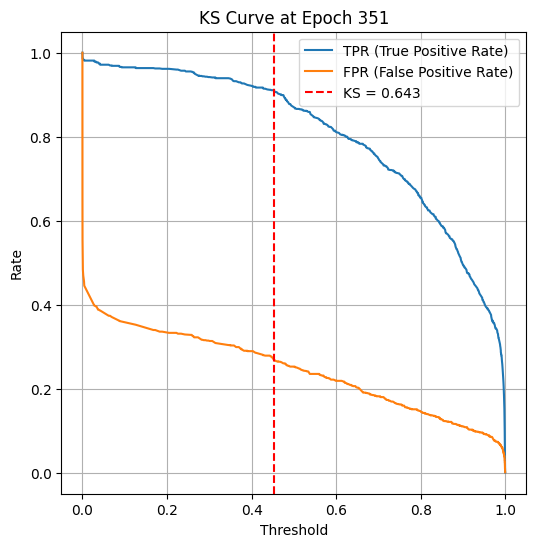

Epoch 350 — Train Loss: 0.2169 | Train Acc: 0.9028 | Val KS: 0.6426 | Val Acc: 0.8106 | Val Prec: 0.7887 | Val Recall: 0.8689 | Val F1: 0.8268
Epoch 360 — Train Loss: 0.2166 | Train Acc: 0.9041 | Val KS: 0.6219 | Val Acc: 0.8073 | Val Prec: 0.7771 | Val Recall: 0.8831 | Val F1: 0.8267
Epoch 370 — Train Loss: 0.2076 | Train Acc: 0.9059 | Val KS: 0.6432 | Val Acc: 0.8222 | Val Prec: 0.7791 | Val Recall: 0.9188 | Val F1: 0.8432


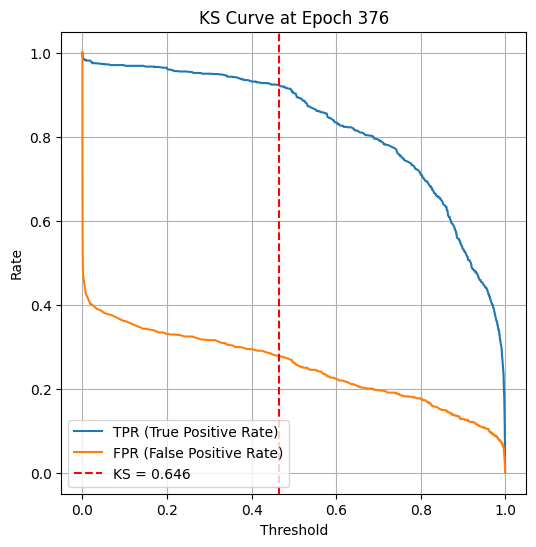

Epoch 380 — Train Loss: 0.2153 | Train Acc: 0.9084 | Val KS: 0.6413 | Val Acc: 0.8152 | Val Prec: 0.7913 | Val Recall: 0.8760 | Val F1: 0.8315
Epoch 390 — Train Loss: 0.2101 | Train Acc: 0.9062 | Val KS: 0.6591 | Val Acc: 0.8268 | Val Prec: 0.8036 | Val Recall: 0.8831 | Val F1: 0.8415


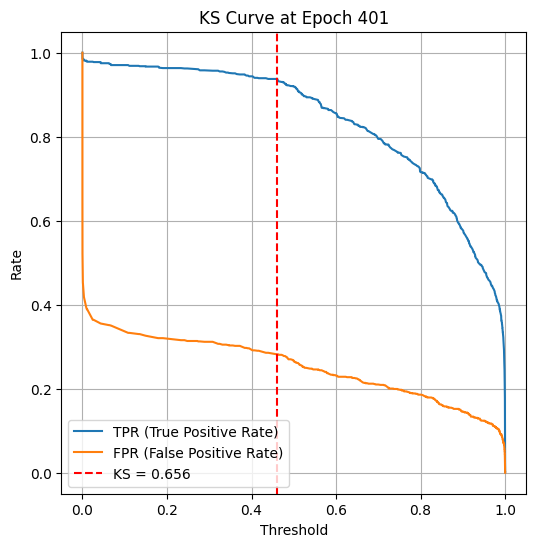

Epoch 400 — Train Loss: 0.2009 | Train Acc: 0.9079 | Val KS: 0.6559 | Val Acc: 0.8305 | Val Prec: 0.7899 | Val Recall: 0.9188 | Val F1: 0.8495
Epoch 410 — Train Loss: 0.2081 | Train Acc: 0.9093 | Val KS: 0.6659 | Val Acc: 0.8315 | Val Prec: 0.7961 | Val Recall: 0.9090 | Val F1: 0.8488
Epoch 420 — Train Loss: 0.2024 | Train Acc: 0.9129 | Val KS: 0.6436 | Val Acc: 0.8227 | Val Prec: 0.7814 | Val Recall: 0.9153 | Val F1: 0.8431


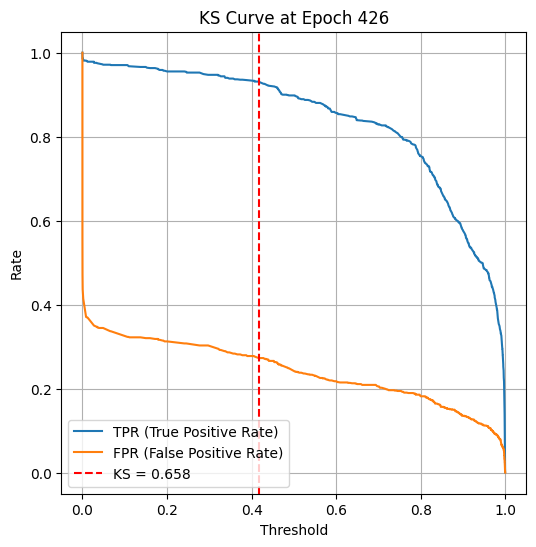

Epoch 430 — Train Loss: 0.2055 | Train Acc: 0.9078 | Val KS: 0.6642 | Val Acc: 0.8227 | Val Prec: 0.7973 | Val Recall: 0.8840 | Val F1: 0.8384
Epoch 440 — Train Loss: 0.2030 | Train Acc: 0.9087 | Val KS: 0.6667 | Val Acc: 0.8301 | Val Prec: 0.7952 | Val Recall: 0.9072 | Val F1: 0.8475


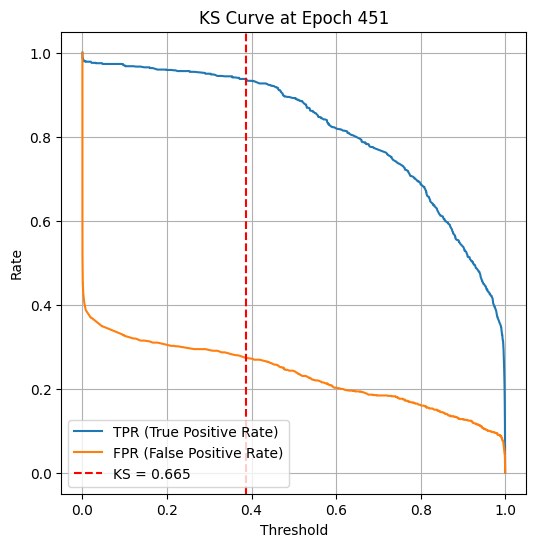

Epoch 450 — Train Loss: 0.1982 | Train Acc: 0.9140 | Val KS: 0.6646 | Val Acc: 0.8278 | Val Prec: 0.8000 | Val Recall: 0.8921 | Val F1: 0.8435
Epoch 460 — Train Loss: 0.2001 | Train Acc: 0.9107 | Val KS: 0.6694 | Val Acc: 0.8329 | Val Prec: 0.7938 | Val Recall: 0.9170 | Val F1: 0.8510
Epoch 470 — Train Loss: 0.1978 | Train Acc: 0.9155 | Val KS: 0.6668 | Val Acc: 0.8324 | Val Prec: 0.8055 | Val Recall: 0.8938 | Val F1: 0.8474


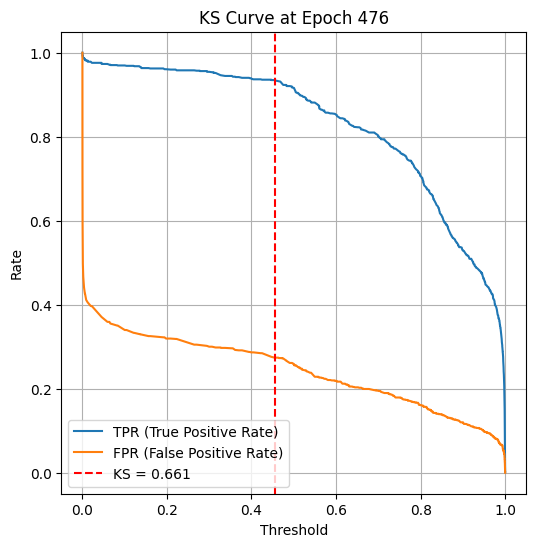

Epoch 480 — Train Loss: 0.1992 | Train Acc: 0.9109 | Val KS: 0.6683 | Val Acc: 0.8329 | Val Prec: 0.7970 | Val Recall: 0.9108 | Val F1: 0.8501
Epoch 490 — Train Loss: 0.1894 | Train Acc: 0.9188 | Val KS: 0.6636 | Val Acc: 0.8310 | Val Prec: 0.8021 | Val Recall: 0.8965 | Val F1: 0.8467


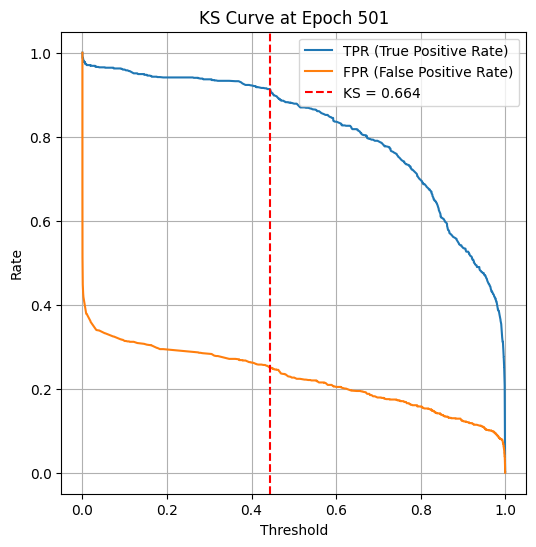

Epoch 500 — Train Loss: 0.1955 | Train Acc: 0.9164 | Val KS: 0.6637 | Val Acc: 0.8282 | Val Prec: 0.8080 | Val Recall: 0.8787 | Val F1: 0.8419
Epoch 510 — Train Loss: 0.1939 | Train Acc: 0.9157 | Val KS: 0.6609 | Val Acc: 0.8254 | Val Prec: 0.7997 | Val Recall: 0.8867 | Val F1: 0.8409
Epoch 520 — Train Loss: 0.1836 | Train Acc: 0.9178 | Val KS: 0.6621 | Val Acc: 0.8194 | Val Prec: 0.7966 | Val Recall: 0.8769 | Val F1: 0.8348


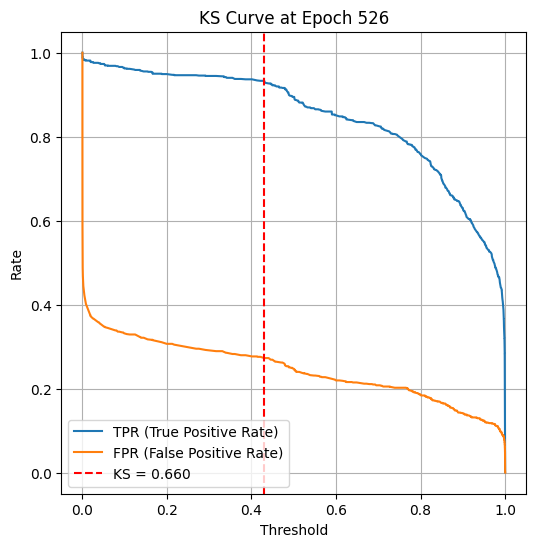

Epoch 530 — Train Loss: 0.1862 | Train Acc: 0.9194 | Val KS: 0.6658 | Val Acc: 0.8240 | Val Prec: 0.7968 | Val Recall: 0.8885 | Val F1: 0.8402
Epoch 540 — Train Loss: 0.1799 | Train Acc: 0.9209 | Val KS: 0.6559 | Val Acc: 0.8254 | Val Prec: 0.7945 | Val Recall: 0.8965 | Val F1: 0.8424


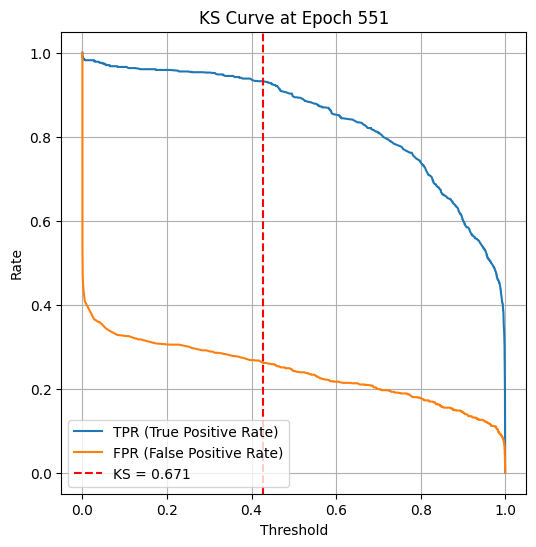

Epoch 550 — Train Loss: 0.1855 | Train Acc: 0.9200 | Val KS: 0.6708 | Val Acc: 0.8287 | Val Prec: 0.8003 | Val Recall: 0.8938 | Val F1: 0.8445
Epoch 560 — Train Loss: 0.1892 | Train Acc: 0.9203 | Val KS: 0.6656 | Val Acc: 0.8273 | Val Prec: 0.8077 | Val Recall: 0.8769 | Val F1: 0.8409
Epoch 570 — Train Loss: 0.1875 | Train Acc: 0.9169 | Val KS: 0.6642 | Val Acc: 0.8352 | Val Prec: 0.7910 | Val Recall: 0.9286 | Val F1: 0.8543


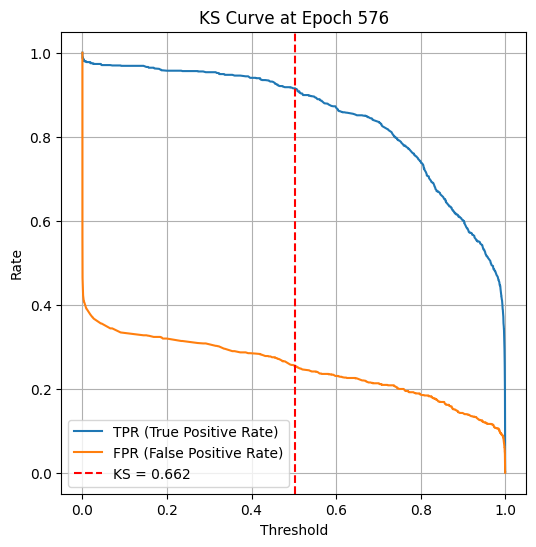

Epoch 580 — Train Loss: 0.1792 | Train Acc: 0.9222 | Val KS: 0.6702 | Val Acc: 0.8384 | Val Prec: 0.7944 | Val Recall: 0.9304 | Val F1: 0.8570
Epoch 590 — Train Loss: 0.1847 | Train Acc: 0.9226 | Val KS: 0.6748 | Val Acc: 0.8301 | Val Prec: 0.8008 | Val Recall: 0.8965 | Val F1: 0.8460


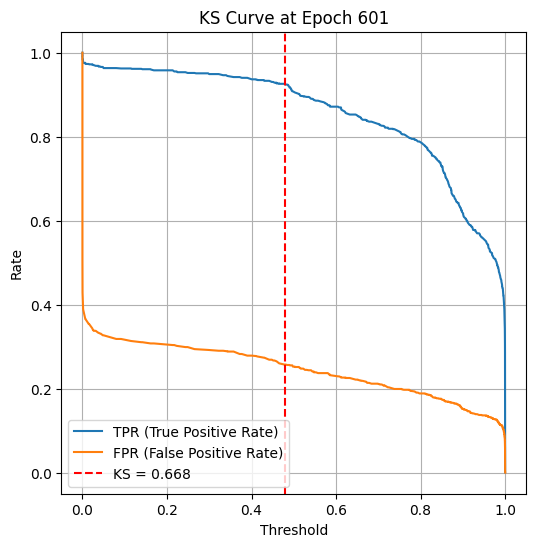

Epoch 600 — Train Loss: 0.1747 | Train Acc: 0.9188 | Val KS: 0.6685 | Val Acc: 0.8296 | Val Prec: 0.7955 | Val Recall: 0.9054 | Val F1: 0.8469
Epoch 610 — Train Loss: 0.1715 | Train Acc: 0.9232 | Val KS: 0.6728 | Val Acc: 0.8375 | Val Prec: 0.7932 | Val Recall: 0.9304 | Val F1: 0.8563
Epoch 620 — Train Loss: 0.1872 | Train Acc: 0.9191 | Val KS: 0.6668 | Val Acc: 0.8315 | Val Prec: 0.7961 | Val Recall: 0.9090 | Val F1: 0.8488


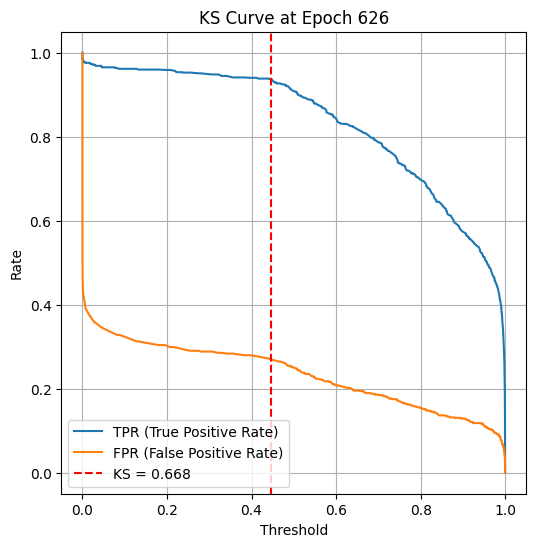

Epoch 630 — Train Loss: 0.1779 | Train Acc: 0.9215 | Val KS: 0.6611 | Val Acc: 0.8282 | Val Prec: 0.7997 | Val Recall: 0.8938 | Val F1: 0.8441
Epoch 640 — Train Loss: 0.1821 | Train Acc: 0.9201 | Val KS: 0.6683 | Val Acc: 0.8333 | Val Prec: 0.7981 | Val Recall: 0.9099 | Val F1: 0.8504


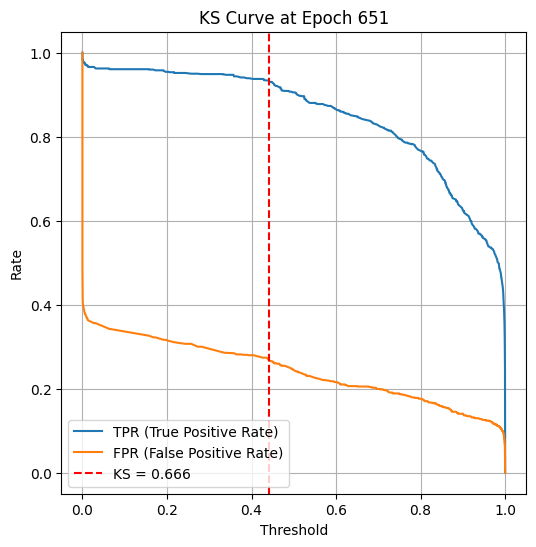

Epoch 650 — Train Loss: 0.1751 | Train Acc: 0.9205 | Val KS: 0.6659 | Val Acc: 0.8343 | Val Prec: 0.8017 | Val Recall: 0.9054 | Val F1: 0.8504
Epoch 660 — Train Loss: 0.1886 | Train Acc: 0.9201 | Val KS: 0.6496 | Val Acc: 0.8273 | Val Prec: 0.7784 | Val Recall: 0.9340 | Val F1: 0.8491
Epoch 670 — Train Loss: 0.1709 | Train Acc: 0.9240 | Val KS: 0.6606 | Val Acc: 0.8324 | Val Prec: 0.7853 | Val Recall: 0.9331 | Val F1: 0.8528


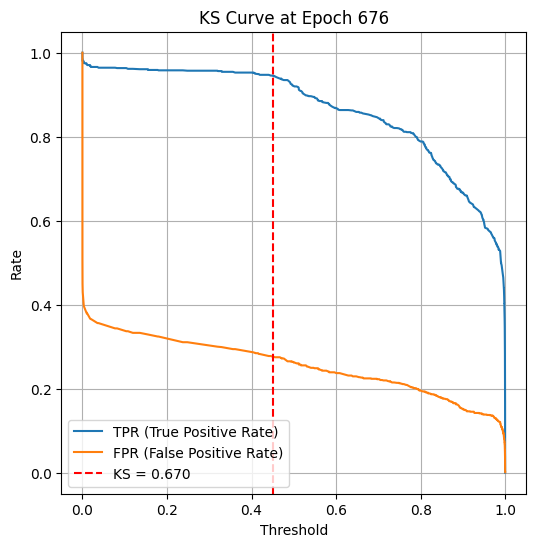

Epoch 680 — Train Loss: 0.1789 | Train Acc: 0.9263 | Val KS: 0.6675 | Val Acc: 0.8296 | Val Prec: 0.7950 | Val Recall: 0.9063 | Val F1: 0.8470
Epoch 690 — Train Loss: 0.1649 | Train Acc: 0.9301 | Val KS: 0.6699 | Val Acc: 0.8301 | Val Prec: 0.8003 | Val Recall: 0.8974 | Val F1: 0.8461


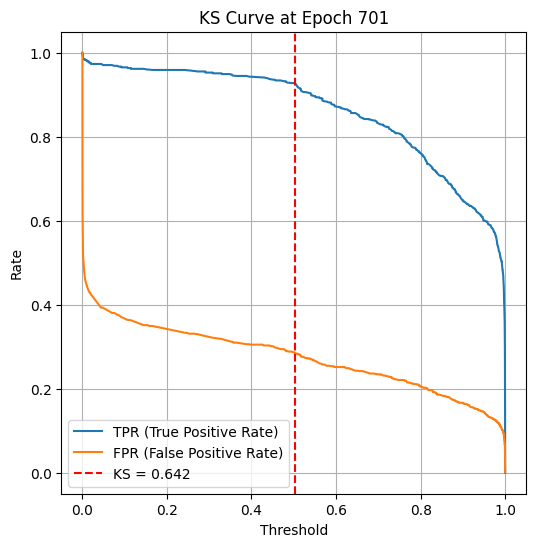

Epoch 700 — Train Loss: 0.1828 | Train Acc: 0.9201 | Val KS: 0.6422 | Val Acc: 0.8245 | Val Prec: 0.7783 | Val Recall: 0.9269 | Val F1: 0.8461
Epoch 710 — Train Loss: 0.1571 | Train Acc: 0.9322 | Val KS: 0.6657 | Val Acc: 0.8310 | Val Prec: 0.7896 | Val Recall: 0.9206 | Val F1: 0.8501
Epoch 720 — Train Loss: 0.1669 | Train Acc: 0.9249 | Val KS: 0.6426 | Val Acc: 0.8236 | Val Prec: 0.7722 | Val Recall: 0.9376 | Val F1: 0.8469


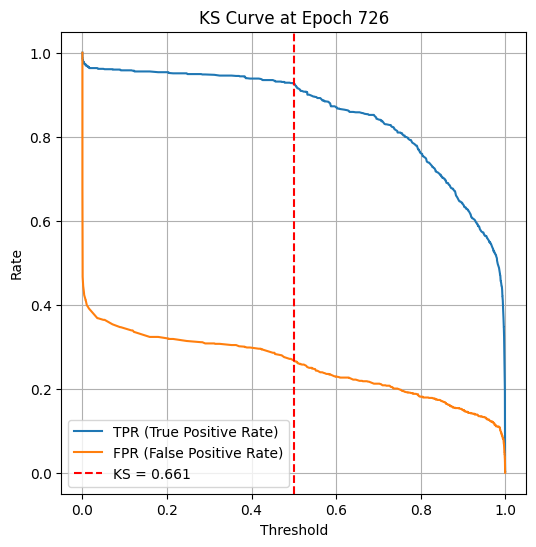

Epoch 730 — Train Loss: 0.1793 | Train Acc: 0.9256 | Val KS: 0.6643 | Val Acc: 0.8315 | Val Prec: 0.7956 | Val Recall: 0.9099 | Val F1: 0.8489
Epoch 740 — Train Loss: 0.1725 | Train Acc: 0.9236 | Val KS: 0.6612 | Val Acc: 0.8264 | Val Prec: 0.7929 | Val Recall: 0.9019 | Val F1: 0.8439


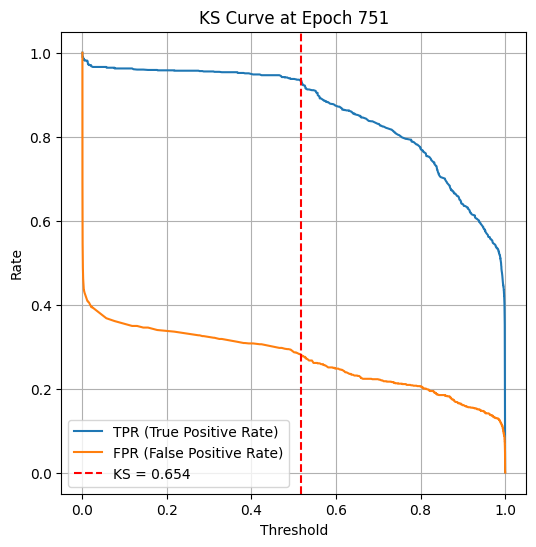

Epoch 750 — Train Loss: 0.1665 | Train Acc: 0.9290 | Val KS: 0.6543 | Val Acc: 0.8301 | Val Prec: 0.7803 | Val Recall: 0.9376 | Val F1: 0.8517
Epoch 760 — Train Loss: 0.1683 | Train Acc: 0.9270 | Val KS: 0.6737 | Val Acc: 0.8375 | Val Prec: 0.7918 | Val Recall: 0.9331 | Val F1: 0.8567
Epoch 770 — Train Loss: 0.1637 | Train Acc: 0.9291 | Val KS: 0.6700 | Val Acc: 0.8292 | Val Prec: 0.7986 | Val Recall: 0.8983 | Val F1: 0.8455


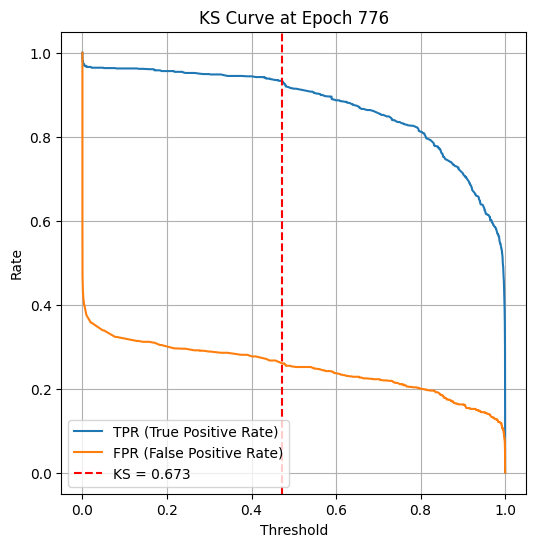

Epoch 780 — Train Loss: 0.1658 | Train Acc: 0.9271 | Val KS: 0.6782 | Val Acc: 0.8380 | Val Prec: 0.8002 | Val Recall: 0.9179 | Val F1: 0.8550
Epoch 790 — Train Loss: 0.1685 | Train Acc: 0.9274 | Val KS: 0.6718 | Val Acc: 0.8329 | Val Prec: 0.7952 | Val Recall: 0.9144 | Val F1: 0.8506


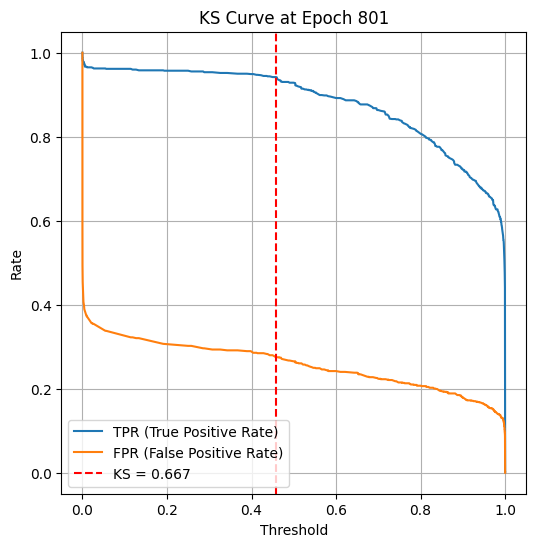

Epoch 800 — Train Loss: 0.1673 | Train Acc: 0.9266 | Val KS: 0.6671 | Val Acc: 0.8352 | Val Prec: 0.7915 | Val Recall: 0.9277 | Val F1: 0.8542
Epoch 810 — Train Loss: 0.1782 | Train Acc: 0.9228 | Val KS: 0.6737 | Val Acc: 0.8357 | Val Prec: 0.8008 | Val Recall: 0.9108 | Val F1: 0.8523
Epoch 820 — Train Loss: 0.1678 | Train Acc: 0.9263 | Val KS: 0.6766 | Val Acc: 0.8319 | Val Prec: 0.7981 | Val Recall: 0.9063 | Val F1: 0.8488


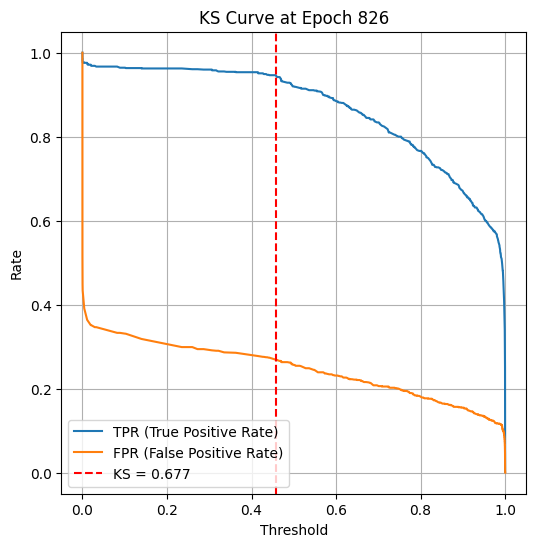

Epoch 830 — Train Loss: 0.1584 | Train Acc: 0.9297 | Val KS: 0.6759 | Val Acc: 0.8357 | Val Prec: 0.8120 | Val Recall: 0.8903 | Val F1: 0.8494
Epoch 840 — Train Loss: 0.1581 | Train Acc: 0.9297 | Val KS: 0.6658 | Val Acc: 0.8343 | Val Prec: 0.7851 | Val Recall: 0.9384 | Val F1: 0.8549


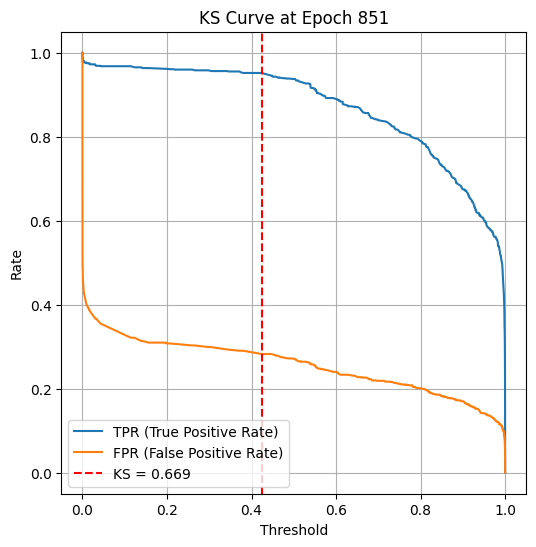

Epoch 850 — Train Loss: 0.1672 | Train Acc: 0.9273 | Val KS: 0.6692 | Val Acc: 0.8375 | Val Prec: 0.7896 | Val Recall: 0.9376 | Val F1: 0.8573
Epoch 860 — Train Loss: 0.1540 | Train Acc: 0.9335 | Val KS: 0.6874 | Val Acc: 0.8468 | Val Prec: 0.7976 | Val Recall: 0.9456 | Val F1: 0.8653
Epoch 870 — Train Loss: 0.1604 | Train Acc: 0.9316 | Val KS: 0.6708 | Val Acc: 0.8343 | Val Prec: 0.7980 | Val Recall: 0.9126 | Val F1: 0.8514


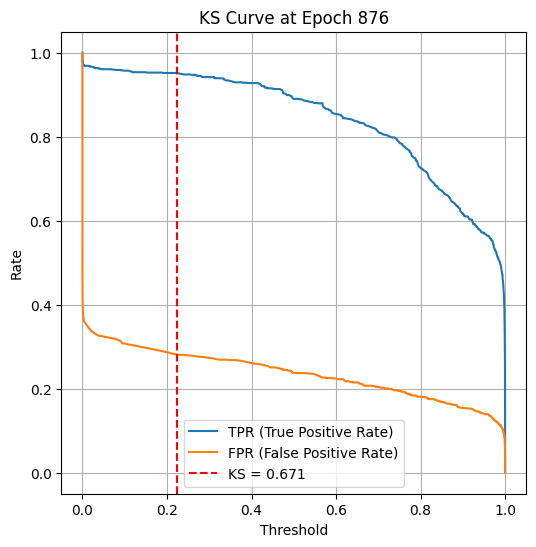

Epoch 880 — Train Loss: 0.1643 | Train Acc: 0.9270 | Val KS: 0.6844 | Val Acc: 0.8338 | Val Prec: 0.8054 | Val Recall: 0.8974 | Val F1: 0.8489
Epoch 890 — Train Loss: 0.1640 | Train Acc: 0.9274 | Val KS: 0.6572 | Val Acc: 0.8305 | Val Prec: 0.7812 | Val Recall: 0.9367 | Val F1: 0.8519


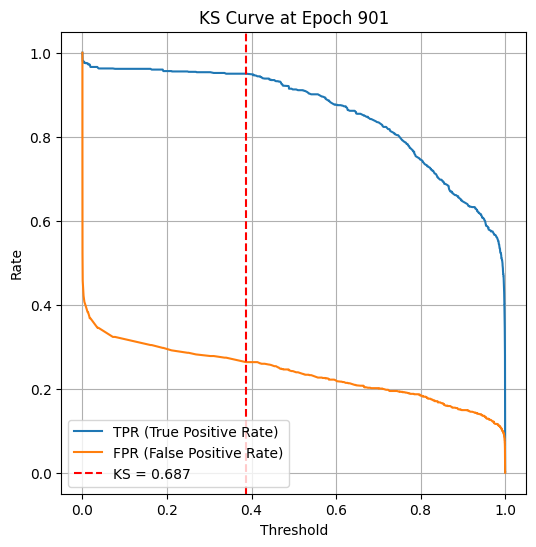

Epoch 900 — Train Loss: 0.1630 | Train Acc: 0.9296 | Val KS: 0.6867 | Val Acc: 0.8389 | Val Prec: 0.8042 | Val Recall: 0.9126 | Val F1: 0.8550
Epoch 910 — Train Loss: 0.1465 | Train Acc: 0.9375 | Val KS: 0.6704 | Val Acc: 0.8329 | Val Prec: 0.8027 | Val Recall: 0.9001 | Val F1: 0.8486
Epoch 920 — Train Loss: 0.1586 | Train Acc: 0.9291 | Val KS: 0.6811 | Val Acc: 0.8366 | Val Prec: 0.8040 | Val Recall: 0.9072 | Val F1: 0.8525


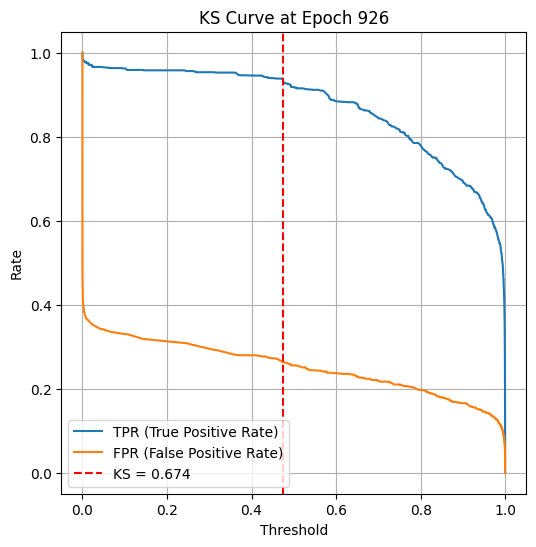

Epoch 930 — Train Loss: 0.1622 | Train Acc: 0.9288 | Val KS: 0.6829 | Val Acc: 0.8417 | Val Prec: 0.8076 | Val Recall: 0.9135 | Val F1: 0.8573
Epoch 940 — Train Loss: 0.1432 | Train Acc: 0.9375 | Val KS: 0.7052 | Val Acc: 0.8510 | Val Prec: 0.8195 | Val Recall: 0.9153 | Val F1: 0.8647


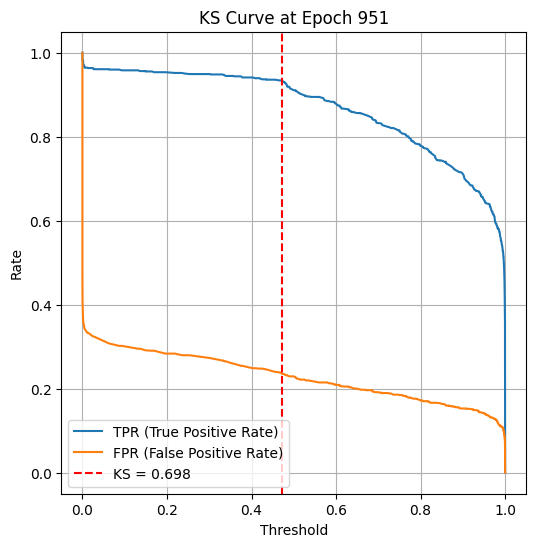

Epoch 950 — Train Loss: 0.1462 | Train Acc: 0.9344 | Val KS: 0.6978 | Val Acc: 0.8445 | Val Prec: 0.8129 | Val Recall: 0.9108 | Val F1: 0.8591
Epoch 960 — Train Loss: 0.1510 | Train Acc: 0.9336 | Val KS: 0.6847 | Val Acc: 0.8394 | Val Prec: 0.8133 | Val Recall: 0.8974 | Val F1: 0.8533
Epoch 970 — Train Loss: 0.1597 | Train Acc: 0.9288 | Val KS: 0.6964 | Val Acc: 0.8459 | Val Prec: 0.8109 | Val Recall: 0.9179 | Val F1: 0.8611


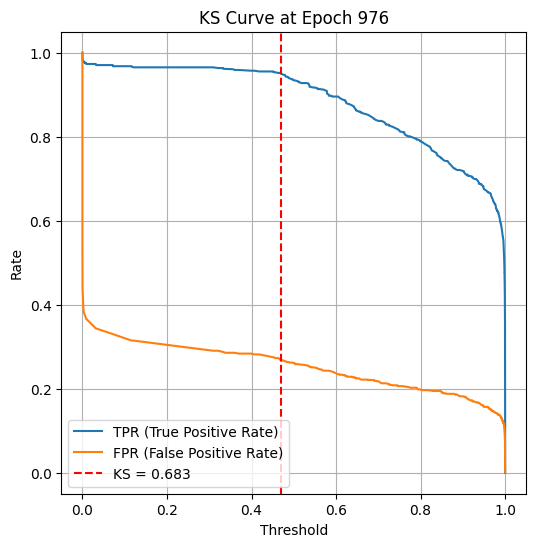

Epoch 980 — Train Loss: 0.1530 | Train Acc: 0.9342 | Val KS: 0.6913 | Val Acc: 0.8468 | Val Prec: 0.8083 | Val Recall: 0.9251 | Val F1: 0.8627
Epoch 990 — Train Loss: 0.1493 | Train Acc: 0.9359 | Val KS: 0.6928 | Val Acc: 0.8403 | Val Prec: 0.8115 | Val Recall: 0.9028 | Val F1: 0.8547
Epoch 999 — Train Loss: 0.1538 | Train Acc: 0.9328 | Val KS: 0.6696 | Val Acc: 0.8375 | Val Prec: 0.7905 | Val Recall: 0.9358 | Val F1: 0.8570


In [ ]:

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = STABTransformer(input_dim=X_train_tensor.shape[1], n_heads=2, n_layers=2, dropout=0.3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.BCELoss()


epochs=1000
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    all_preds = []
    all_targets = []

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        preds_np = (pred > 0.5).detach().cpu().numpy()
        targets_np = yb.detach().cpu().numpy()

        all_preds.extend(preds_np)
        all_targets.extend(targets_np)

    # Training metrics
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    # Validation metrics
    ks_val, acc_val, prec_val, rec_val, f1_val = evaluate_validation(model, val_loader, device, epoch)

    if epoch % 10 == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch:03d} — Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Train Acc: {acc:.4f} | Val KS: {ks_val:.4f} | Val Acc: {acc_val:.4f} | "
              f"Val Prec: {prec_val:.4f} | Val Recall: {rec_val:.4f} | Val F1: {f1_val:.4f}")


In [ ]:

torch.save(model.state_dict(), 'stab_transformer_2head_2layer_0.1droput_1000epochs.pt')
files.download('stab_transformer_2head_2layer_0.1droput_1000epochs.pt')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Accuracy: 0.8357
✅ Precision: 0.7894
✅ Recall: 0.9331
✅ F1 Score: 0.8553


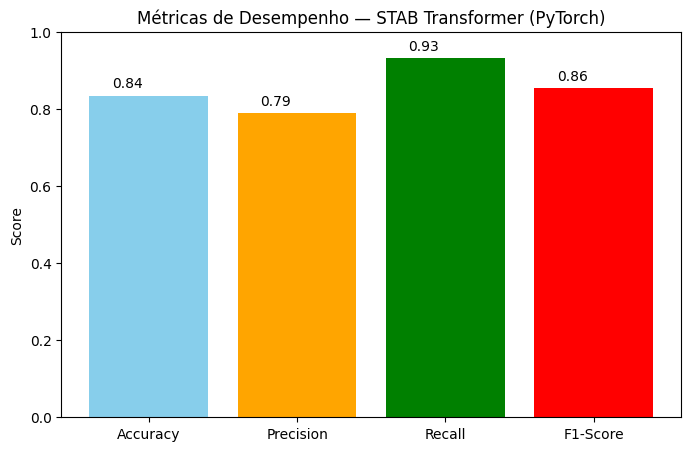

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)


# Save model weights
torch.save(model.state_dict(), 'stab_transformer_4head_2layer_0.1droput.pt')
files.download('stab_transformer_4head_2layer_0.1droput.pt')


acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Accuracy: 0.4986
✅ Precision: 0.5154
✅ Recall: 0.6102
✅ F1 Score: 0.5588


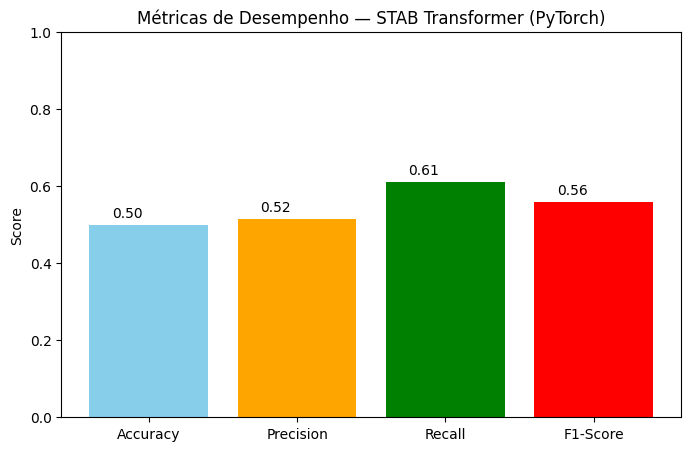

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_val_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_val_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)


# Save model weights
torch.save(model.state_dict(), 'stab_transformer_4head_2layer_0.1droput.pt')
files.download('stab_transformer_4head_2layer_0.1droput.pt')


acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



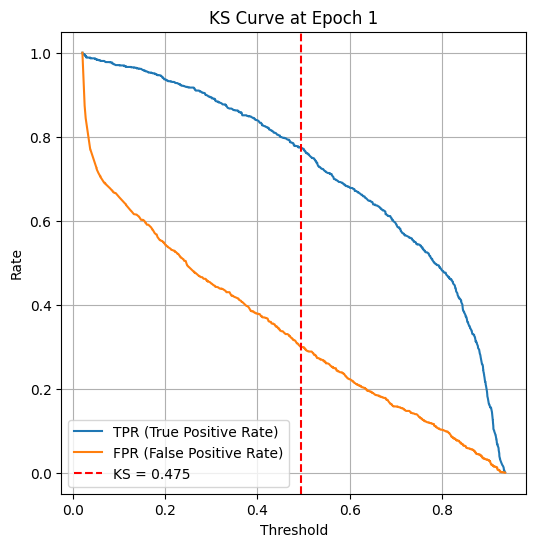

Epoch 000 — Train Loss: 0.5077 | Train Acc: 0.7614 | Val KS: 0.4752 | Val Acc: 0.7372 | Val Prec: 0.7366 | Val Recall: 0.7707 | Val F1: 0.7533
Epoch 010 — Train Loss: 0.4804 | Train Acc: 0.7721 | Val KS: 0.5136 | Val Acc: 0.7558 | Val Prec: 0.7465 | Val Recall: 0.8037 | Val F1: 0.7741
Epoch 020 — Train Loss: 0.4643 | Train Acc: 0.7821 | Val KS: 0.5245 | Val Acc: 0.7656 | Val Prec: 0.7319 | Val Recall: 0.8671 | Val F1: 0.7938


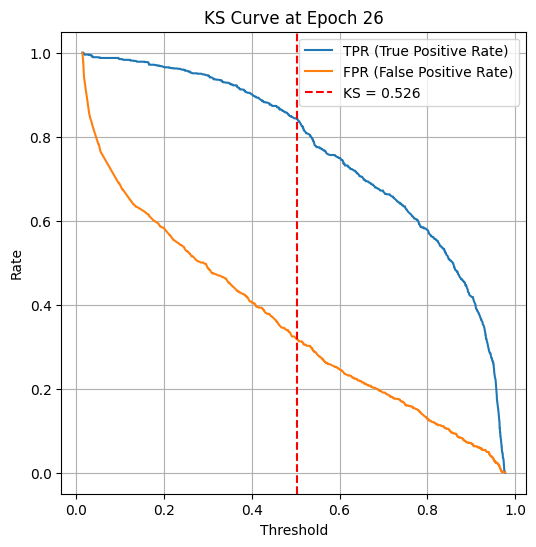

Epoch 030 — Train Loss: 0.4553 | Train Acc: 0.7866 | Val KS: 0.5280 | Val Acc: 0.7665 | Val Prec: 0.7460 | Val Recall: 0.8359 | Val F1: 0.7884
Epoch 040 — Train Loss: 0.4316 | Train Acc: 0.7929 | Val KS: 0.5406 | Val Acc: 0.7702 | Val Prec: 0.7285 | Val Recall: 0.8903 | Val F1: 0.8013


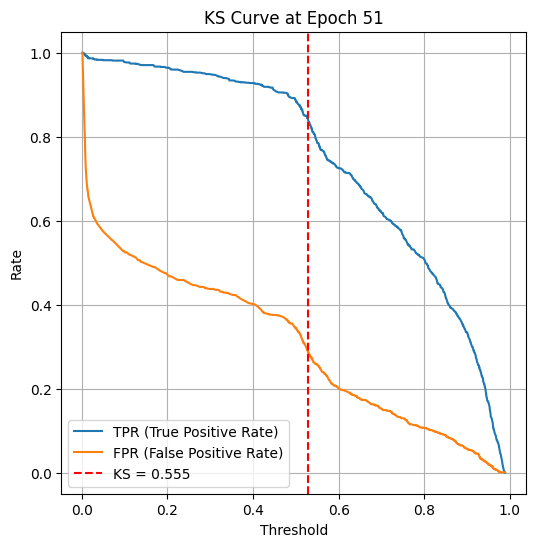

Epoch 050 — Train Loss: 0.4070 | Train Acc: 0.8076 | Val KS: 0.5546 | Val Acc: 0.7753 | Val Prec: 0.7365 | Val Recall: 0.8849 | Val F1: 0.8039
Epoch 060 — Train Loss: 0.3830 | Train Acc: 0.8213 | Val KS: 0.5639 | Val Acc: 0.7827 | Val Prec: 0.7424 | Val Recall: 0.8921 | Val F1: 0.8104
Epoch 070 — Train Loss: 0.3574 | Train Acc: 0.8301 | Val KS: 0.5782 | Val Acc: 0.7874 | Val Prec: 0.7373 | Val Recall: 0.9188 | Val F1: 0.8181


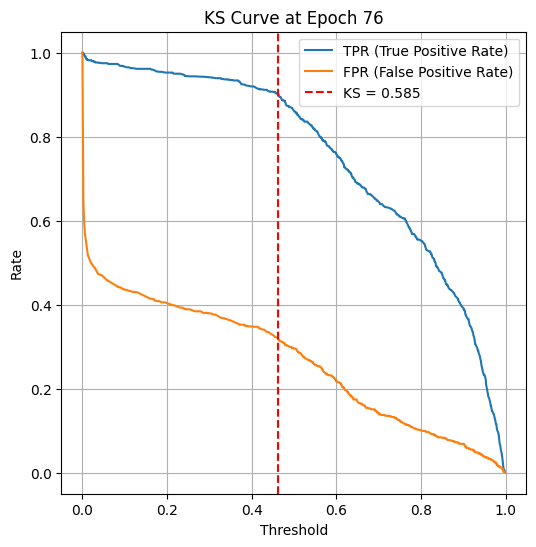

Epoch 080 — Train Loss: 0.3404 | Train Acc: 0.8435 | Val KS: 0.5846 | Val Acc: 0.7934 | Val Prec: 0.7507 | Val Recall: 0.9028 | Val F1: 0.8198
Epoch 090 — Train Loss: 0.3257 | Train Acc: 0.8456 | Val KS: 0.5893 | Val Acc: 0.7985 | Val Prec: 0.7531 | Val Recall: 0.9117 | Val F1: 0.8249


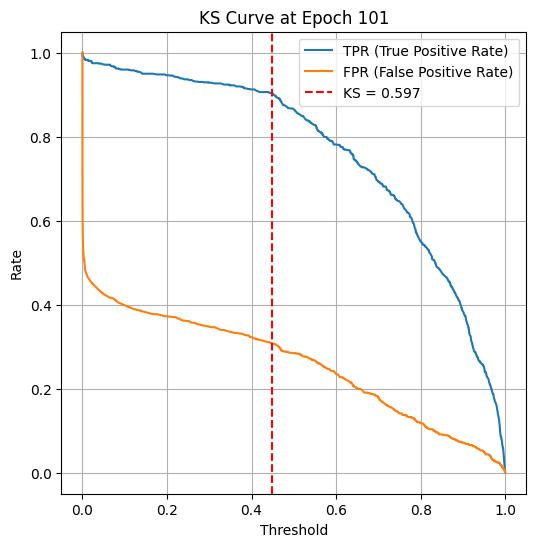

Epoch 100 — Train Loss: 0.3033 | Train Acc: 0.8603 | Val KS: 0.5967 | Val Acc: 0.7934 | Val Prec: 0.7674 | Val Recall: 0.8653 | Val F1: 0.8134
Epoch 110 — Train Loss: 0.3046 | Train Acc: 0.8596 | Val KS: 0.5953 | Val Acc: 0.7981 | Val Prec: 0.7606 | Val Recall: 0.8930 | Val F1: 0.8215
Epoch 120 — Train Loss: 0.2905 | Train Acc: 0.8703 | Val KS: 0.6064 | Val Acc: 0.7967 | Val Prec: 0.7670 | Val Recall: 0.8751 | Val F1: 0.8175


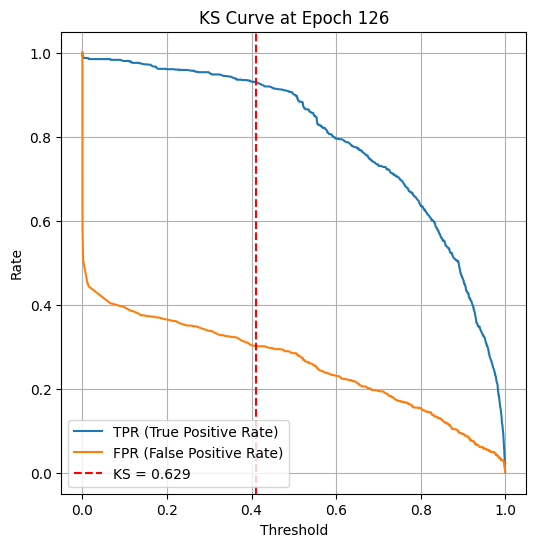

Epoch 130 — Train Loss: 0.2759 | Train Acc: 0.8726 | Val KS: 0.6124 | Val Acc: 0.8078 | Val Prec: 0.7701 | Val Recall: 0.8992 | Val F1: 0.8296
Epoch 140 — Train Loss: 0.2700 | Train Acc: 0.8756 | Val KS: 0.6186 | Val Acc: 0.8129 | Val Prec: 0.7647 | Val Recall: 0.9251 | Val F1: 0.8373


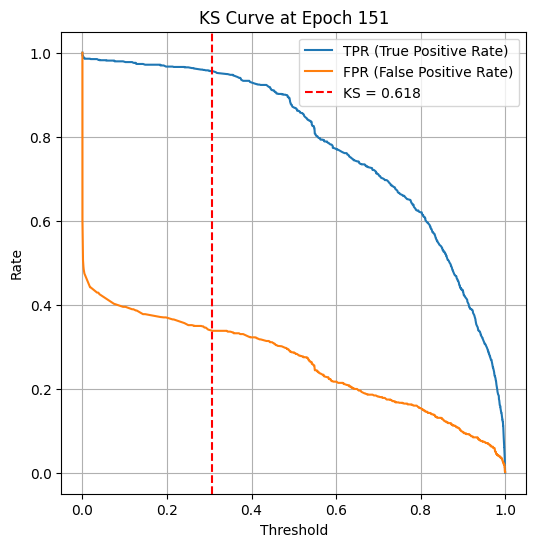

Epoch 150 — Train Loss: 0.2605 | Train Acc: 0.8813 | Val KS: 0.6184 | Val Acc: 0.7948 | Val Prec: 0.7671 | Val Recall: 0.8698 | Val F1: 0.8152
Epoch 160 — Train Loss: 0.2606 | Train Acc: 0.8794 | Val KS: 0.6276 | Val Acc: 0.8045 | Val Prec: 0.7756 | Val Recall: 0.8787 | Val F1: 0.8239
Epoch 170 — Train Loss: 0.2512 | Train Acc: 0.8853 | Val KS: 0.6343 | Val Acc: 0.8110 | Val Prec: 0.7793 | Val Recall: 0.8885 | Val F1: 0.8303


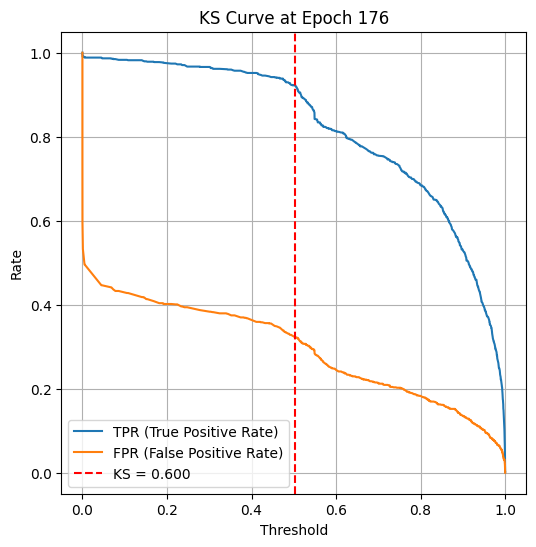

Epoch 180 — Train Loss: 0.2474 | Train Acc: 0.8844 | Val KS: 0.6314 | Val Acc: 0.8083 | Val Prec: 0.7770 | Val Recall: 0.8858 | Val F1: 0.8278
Epoch 190 — Train Loss: 0.2344 | Train Acc: 0.8909 | Val KS: 0.6258 | Val Acc: 0.8166 | Val Prec: 0.7733 | Val Recall: 0.9161 | Val F1: 0.8387


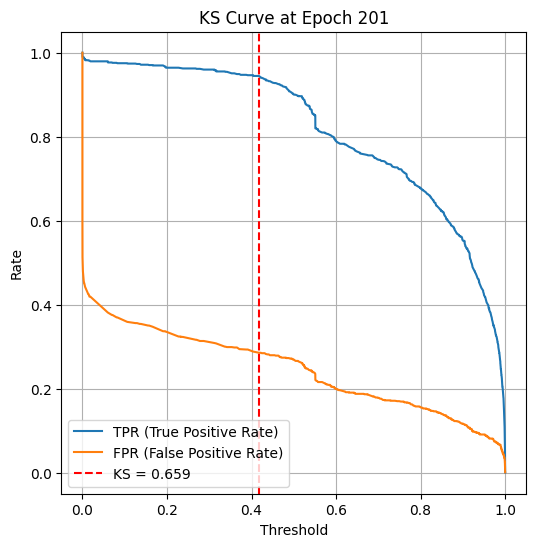

Epoch 200 — Train Loss: 0.2341 | Train Acc: 0.8915 | Val KS: 0.6591 | Val Acc: 0.8189 | Val Prec: 0.7840 | Val Recall: 0.9001 | Val F1: 0.8380
Epoch 210 — Train Loss: 0.2343 | Train Acc: 0.8928 | Val KS: 0.6433 | Val Acc: 0.8152 | Val Prec: 0.7813 | Val Recall: 0.8956 | Val F1: 0.8346
Epoch 220 — Train Loss: 0.2274 | Train Acc: 0.8959 | Val KS: 0.6385 | Val Acc: 0.8175 | Val Prec: 0.7817 | Val Recall: 0.9010 | Val F1: 0.8371


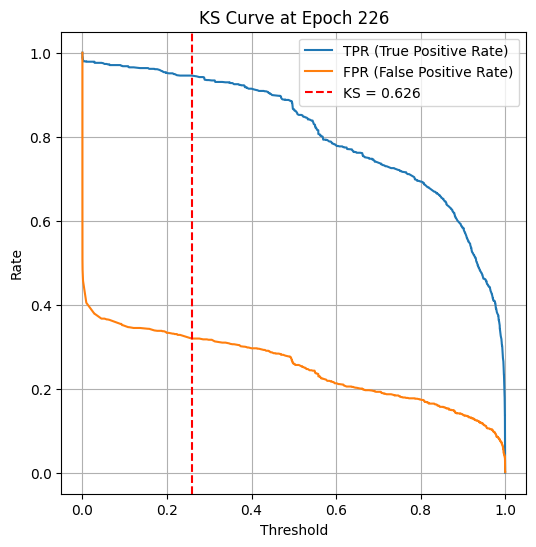

Epoch 230 — Train Loss: 0.2199 | Train Acc: 0.8985 | Val KS: 0.6393 | Val Acc: 0.8110 | Val Prec: 0.7802 | Val Recall: 0.8867 | Val F1: 0.8301
Epoch 240 — Train Loss: 0.2242 | Train Acc: 0.8965 | Val KS: 0.6395 | Val Acc: 0.8240 | Val Prec: 0.7728 | Val Recall: 0.9376 | Val F1: 0.8472


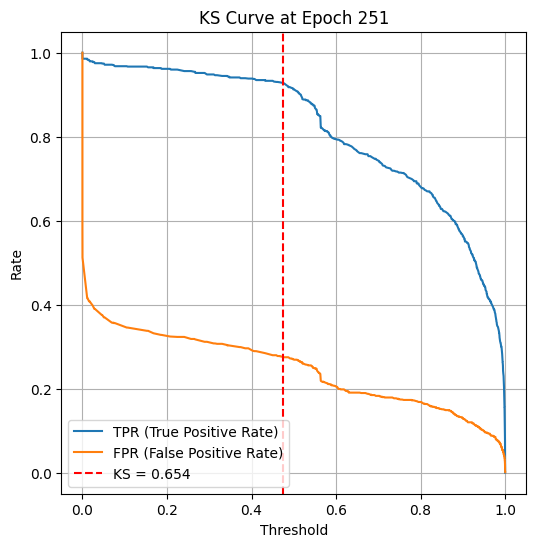

Epoch 250 — Train Loss: 0.2142 | Train Acc: 0.9011 | Val KS: 0.6537 | Val Acc: 0.8254 | Val Prec: 0.7863 | Val Recall: 0.9126 | Val F1: 0.8448
Epoch 260 — Train Loss: 0.2073 | Train Acc: 0.9061 | Val KS: 0.6381 | Val Acc: 0.8194 | Val Prec: 0.7731 | Val Recall: 0.9242 | Val F1: 0.8419
Epoch 270 — Train Loss: 0.2141 | Train Acc: 0.9068 | Val KS: 0.6619 | Val Acc: 0.8315 | Val Prec: 0.7841 | Val Recall: 0.9331 | Val F1: 0.8521


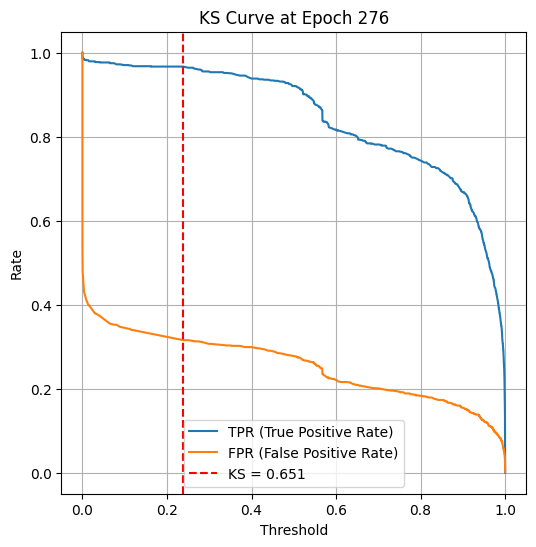

Epoch 280 — Train Loss: 0.2062 | Train Acc: 0.9031 | Val KS: 0.6637 | Val Acc: 0.8343 | Val Prec: 0.7834 | Val Recall: 0.9420 | Val F1: 0.8554
Epoch 290 — Train Loss: 0.2114 | Train Acc: 0.9027 | Val KS: 0.6514 | Val Acc: 0.8250 | Val Prec: 0.7780 | Val Recall: 0.9286 | Val F1: 0.8467


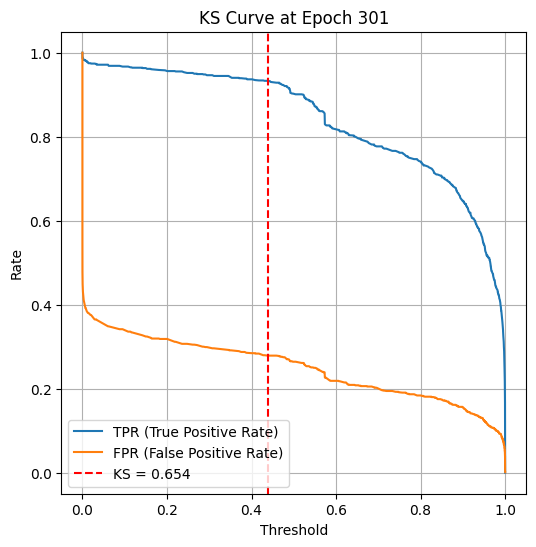

Epoch 300 — Train Loss: 0.2042 | Train Acc: 0.9051 | Val KS: 0.6543 | Val Acc: 0.8222 | Val Prec: 0.7874 | Val Recall: 0.9019 | Val F1: 0.8407
Epoch 310 — Train Loss: 0.2079 | Train Acc: 0.9042 | Val KS: 0.6386 | Val Acc: 0.8134 | Val Prec: 0.7802 | Val Recall: 0.8930 | Val F1: 0.8328
Epoch 320 — Train Loss: 0.2125 | Train Acc: 0.9024 | Val KS: 0.6535 | Val Acc: 0.8240 | Val Prec: 0.7823 | Val Recall: 0.9170 | Val F1: 0.8444


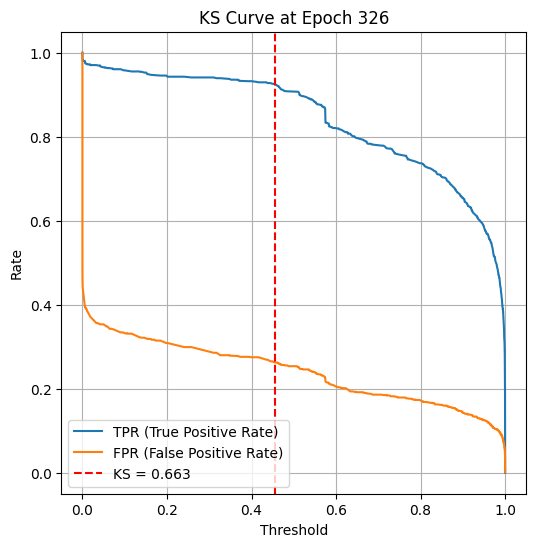

Epoch 330 — Train Loss: 0.1936 | Train Acc: 0.9121 | Val KS: 0.6561 | Val Acc: 0.8227 | Val Prec: 0.7827 | Val Recall: 0.9126 | Val F1: 0.8427
Epoch 340 — Train Loss: 0.2010 | Train Acc: 0.9095 | Val KS: 0.6573 | Val Acc: 0.8301 | Val Prec: 0.7836 | Val Recall: 0.9304 | Val F1: 0.8507


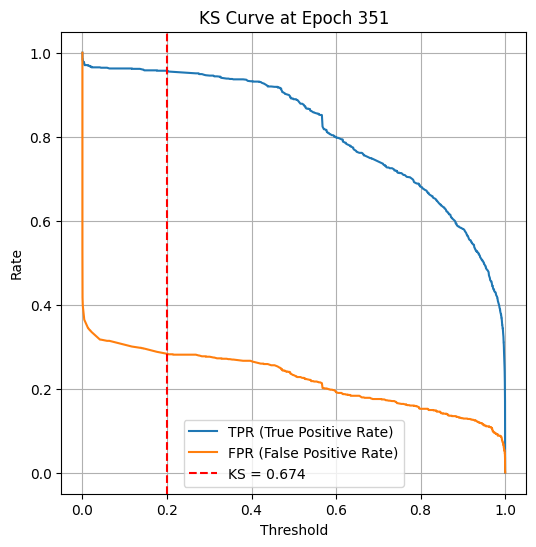

Epoch 350 — Train Loss: 0.1779 | Train Acc: 0.9158 | Val KS: 0.6735 | Val Acc: 0.8310 | Val Prec: 0.8060 | Val Recall: 0.8894 | Val F1: 0.8456
Epoch 360 — Train Loss: 0.1852 | Train Acc: 0.9132 | Val KS: 0.6664 | Val Acc: 0.8352 | Val Prec: 0.7871 | Val Recall: 0.9367 | Val F1: 0.8554
Epoch 370 — Train Loss: 0.1825 | Train Acc: 0.9186 | Val KS: 0.6602 | Val Acc: 0.8292 | Val Prec: 0.7885 | Val Recall: 0.9179 | Val F1: 0.8483


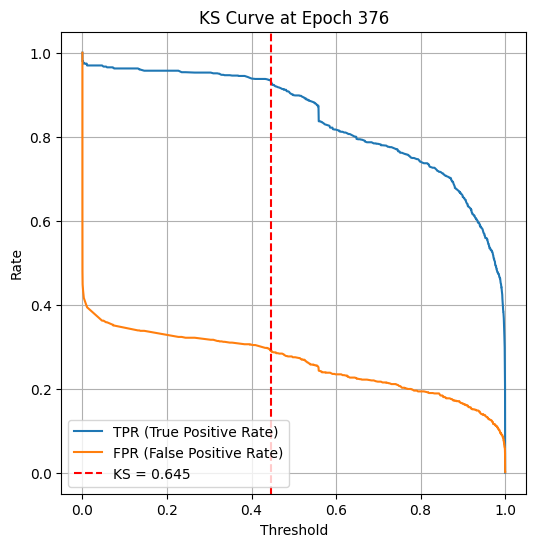

Epoch 380 — Train Loss: 0.1916 | Train Acc: 0.9121 | Val KS: 0.6548 | Val Acc: 0.8250 | Val Prec: 0.7862 | Val Recall: 0.9117 | Val F1: 0.8443
Epoch 390 — Train Loss: 0.1877 | Train Acc: 0.9106 | Val KS: 0.6658 | Val Acc: 0.8315 | Val Prec: 0.7854 | Val Recall: 0.9304 | Val F1: 0.8518


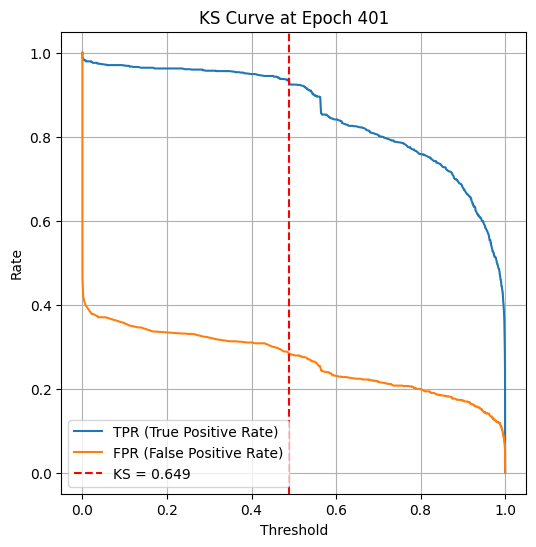

Epoch 400 — Train Loss: 0.1807 | Train Acc: 0.9127 | Val KS: 0.6495 | Val Acc: 0.8259 | Val Prec: 0.7813 | Val Recall: 0.9242 | Val F1: 0.8468
Epoch 410 — Train Loss: 0.1746 | Train Acc: 0.9180 | Val KS: 0.6701 | Val Acc: 0.8301 | Val Prec: 0.7956 | Val Recall: 0.9063 | Val F1: 0.8474
Epoch 420 — Train Loss: 0.1777 | Train Acc: 0.9160 | Val KS: 0.6680 | Val Acc: 0.8301 | Val Prec: 0.7942 | Val Recall: 0.9090 | Val F1: 0.8478


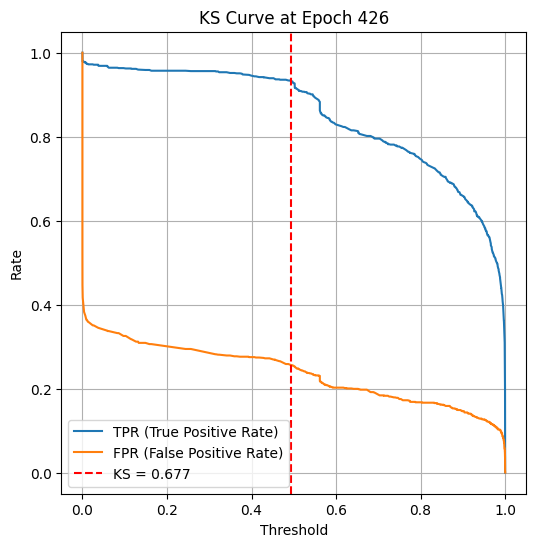

Epoch 430 — Train Loss: 0.1732 | Train Acc: 0.9211 | Val KS: 0.6860 | Val Acc: 0.8417 | Val Prec: 0.8000 | Val Recall: 0.9277 | Val F1: 0.8591
Epoch 440 — Train Loss: 0.1704 | Train Acc: 0.9200 | Val KS: 0.6528 | Val Acc: 0.8292 | Val Prec: 0.7808 | Val Recall: 0.9340 | Val F1: 0.8505


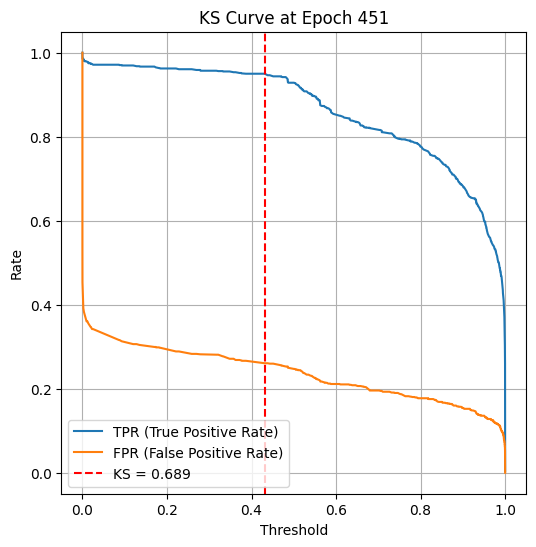

Epoch 450 — Train Loss: 0.1751 | Train Acc: 0.9201 | Val KS: 0.6887 | Val Acc: 0.8440 | Val Prec: 0.8026 | Val Recall: 0.9286 | Val F1: 0.8610
Epoch 460 — Train Loss: 0.1757 | Train Acc: 0.9186 | Val KS: 0.6589 | Val Acc: 0.8329 | Val Prec: 0.7812 | Val Recall: 0.9429 | Val F1: 0.8545
Epoch 470 — Train Loss: 0.1712 | Train Acc: 0.9242 | Val KS: 0.6841 | Val Acc: 0.8389 | Val Prec: 0.8076 | Val Recall: 0.9063 | Val F1: 0.8541


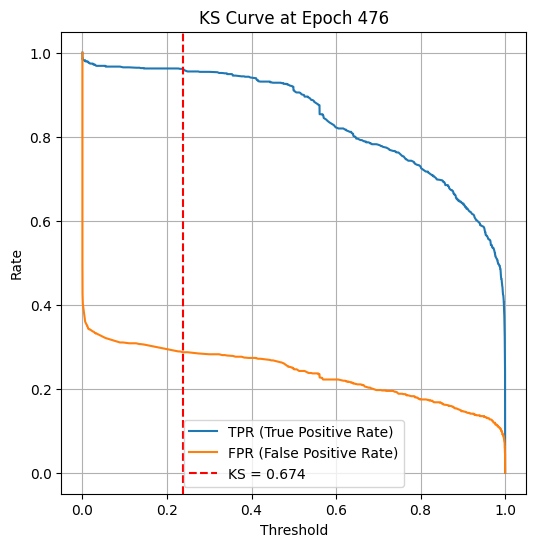

Epoch 480 — Train Loss: 0.1749 | Train Acc: 0.9197 | Val KS: 0.6652 | Val Acc: 0.8315 | Val Prec: 0.7880 | Val Recall: 0.9251 | Val F1: 0.8510
Epoch 490 — Train Loss: 0.1701 | Train Acc: 0.9206 | Val KS: 0.6777 | Val Acc: 0.8305 | Val Prec: 0.7967 | Val Recall: 0.9054 | Val F1: 0.8476


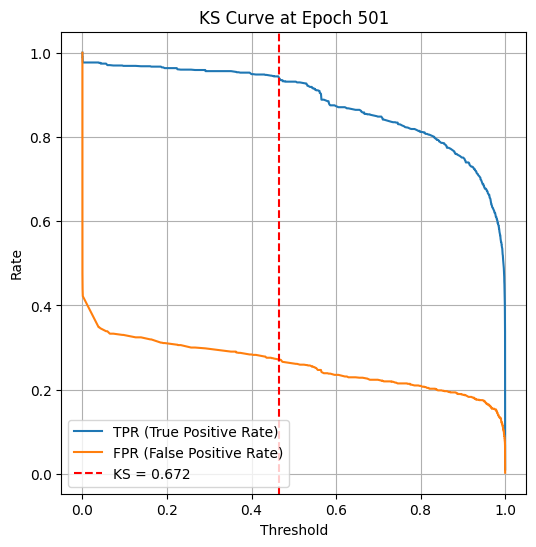

Epoch 500 — Train Loss: 0.1676 | Train Acc: 0.9222 | Val KS: 0.6719 | Val Acc: 0.8389 | Val Prec: 0.7945 | Val Recall: 0.9313 | Val F1: 0.8575
Epoch 510 — Train Loss: 0.1672 | Train Acc: 0.9232 | Val KS: 0.6885 | Val Acc: 0.8440 | Val Prec: 0.8045 | Val Recall: 0.9251 | Val F1: 0.8606
Epoch 520 — Train Loss: 0.1750 | Train Acc: 0.9229 | Val KS: 0.6993 | Val Acc: 0.8445 | Val Prec: 0.8109 | Val Recall: 0.9144 | Val F1: 0.8595


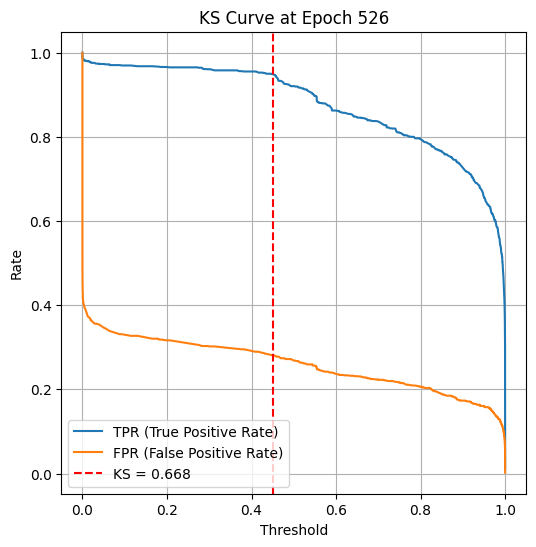

Epoch 530 — Train Loss: 0.1591 | Train Acc: 0.9245 | Val KS: 0.6829 | Val Acc: 0.8426 | Val Prec: 0.7998 | Val Recall: 0.9304 | Val F1: 0.8602
Epoch 540 — Train Loss: 0.1624 | Train Acc: 0.9259 | Val KS: 0.6797 | Val Acc: 0.8422 | Val Prec: 0.7974 | Val Recall: 0.9340 | Val F1: 0.8603


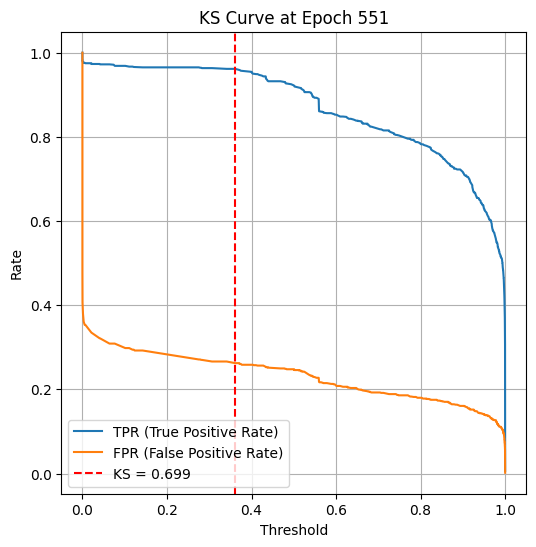

Epoch 550 — Train Loss: 0.1549 | Train Acc: 0.9253 | Val KS: 0.6993 | Val Acc: 0.8412 | Val Prec: 0.8022 | Val Recall: 0.9224 | Val F1: 0.8581
Epoch 560 — Train Loss: 0.1553 | Train Acc: 0.9282 | Val KS: 0.6866 | Val Acc: 0.8343 | Val Prec: 0.8041 | Val Recall: 0.9010 | Val F1: 0.8498
Epoch 570 — Train Loss: 0.1596 | Train Acc: 0.9271 | Val KS: 0.6754 | Val Acc: 0.8282 | Val Prec: 0.7913 | Val Recall: 0.9099 | Val F1: 0.8465


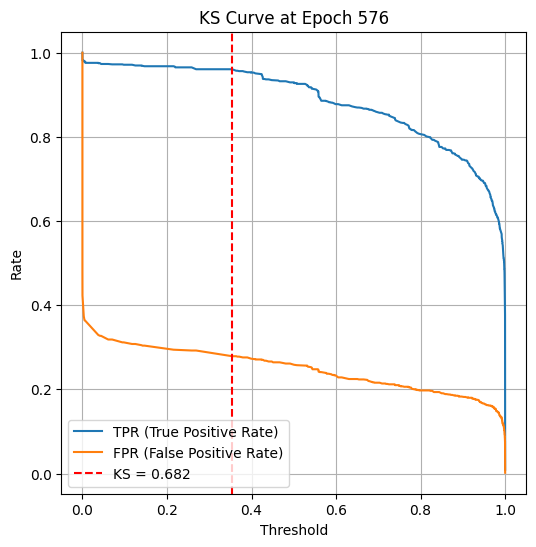

Epoch 580 — Train Loss: 0.1581 | Train Acc: 0.9265 | Val KS: 0.6923 | Val Acc: 0.8445 | Val Prec: 0.8056 | Val Recall: 0.9242 | Val F1: 0.8608
Epoch 590 — Train Loss: 0.1587 | Train Acc: 0.9274 | Val KS: 0.6772 | Val Acc: 0.8361 | Val Prec: 0.7986 | Val Recall: 0.9161 | Val F1: 0.8533


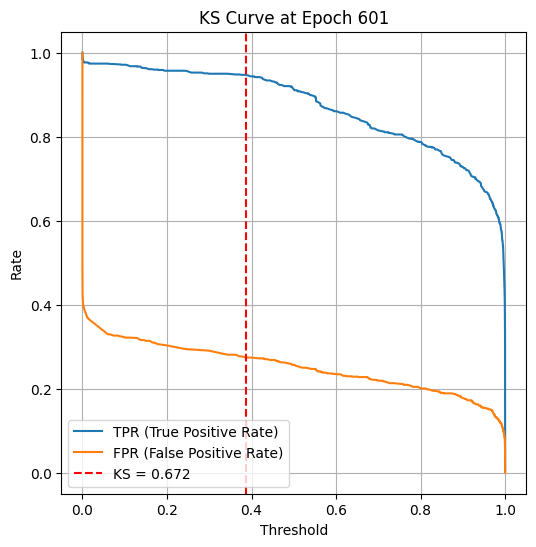

Epoch 600 — Train Loss: 0.1607 | Train Acc: 0.9279 | Val KS: 0.6724 | Val Acc: 0.8305 | Val Prec: 0.7935 | Val Recall: 0.9117 | Val F1: 0.8485
Epoch 610 — Train Loss: 0.1491 | Train Acc: 0.9322 | Val KS: 0.6896 | Val Acc: 0.8408 | Val Prec: 0.8039 | Val Recall: 0.9179 | Val F1: 0.8571
Epoch 620 — Train Loss: 0.1451 | Train Acc: 0.9333 | Val KS: 0.6946 | Val Acc: 0.8431 | Val Prec: 0.8085 | Val Recall: 0.9153 | Val F1: 0.8586


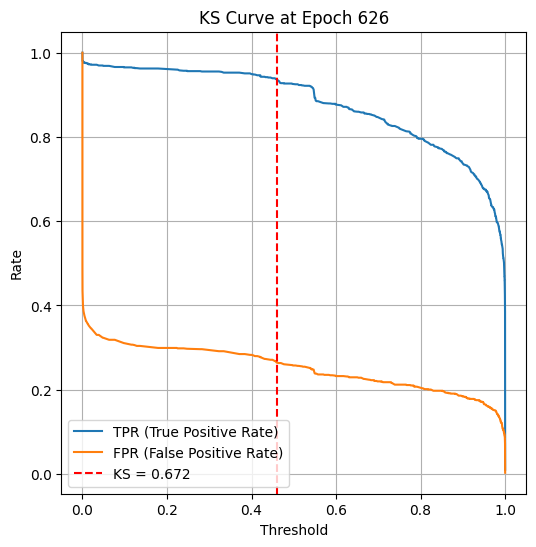

Epoch 630 — Train Loss: 0.1501 | Train Acc: 0.9338 | Val KS: 0.6882 | Val Acc: 0.8426 | Val Prec: 0.8022 | Val Recall: 0.9260 | Val F1: 0.8596
Epoch 640 — Train Loss: 0.1536 | Train Acc: 0.9290 | Val KS: 0.6812 | Val Acc: 0.8417 | Val Prec: 0.7995 | Val Recall: 0.9286 | Val F1: 0.8593


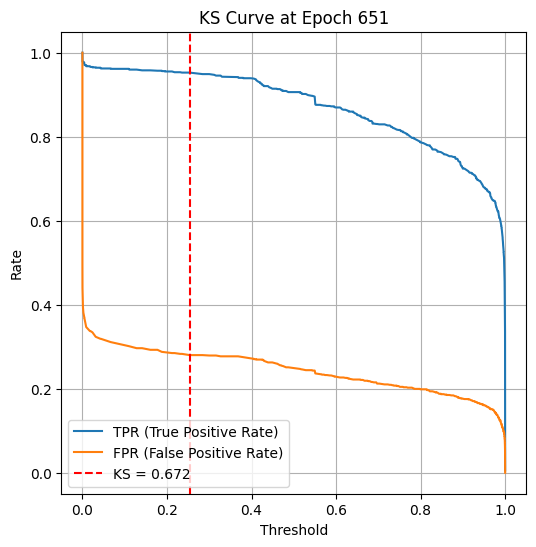

Epoch 650 — Train Loss: 0.1599 | Train Acc: 0.9294 | Val KS: 0.6720 | Val Acc: 0.8319 | Val Prec: 0.7981 | Val Recall: 0.9063 | Val F1: 0.8488
Epoch 660 — Train Loss: 0.1493 | Train Acc: 0.9333 | Val KS: 0.6789 | Val Acc: 0.8384 | Val Prec: 0.8003 | Val Recall: 0.9188 | Val F1: 0.8555
Epoch 670 — Train Loss: 0.1513 | Train Acc: 0.9339 | Val KS: 0.6627 | Val Acc: 0.8343 | Val Prec: 0.7872 | Val Recall: 0.9340 | Val F1: 0.8543


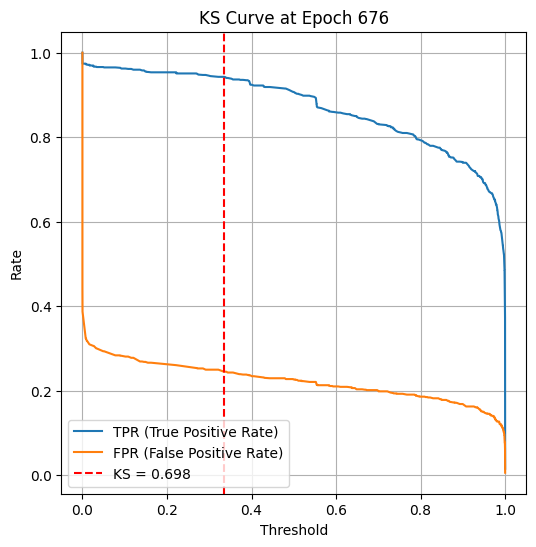

Epoch 680 — Train Loss: 0.1448 | Train Acc: 0.9324 | Val KS: 0.6730 | Val Acc: 0.8384 | Val Prec: 0.7921 | Val Recall: 0.9349 | Val F1: 0.8576
Epoch 690 — Train Loss: 0.1396 | Train Acc: 0.9379 | Val KS: 0.6952 | Val Acc: 0.8417 | Val Prec: 0.8155 | Val Recall: 0.8992 | Val F1: 0.8553


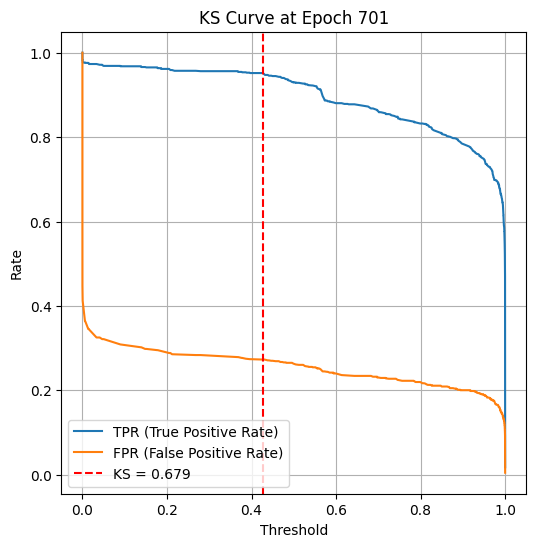

Epoch 700 — Train Loss: 0.1525 | Train Acc: 0.9352 | Val KS: 0.6788 | Val Acc: 0.8375 | Val Prec: 0.7936 | Val Recall: 0.9295 | Val F1: 0.8562
Epoch 710 — Train Loss: 0.1449 | Train Acc: 0.9345 | Val KS: 0.6911 | Val Acc: 0.8412 | Val Prec: 0.8060 | Val Recall: 0.9153 | Val F1: 0.8571
Epoch 720 — Train Loss: 0.1444 | Train Acc: 0.9347 | Val KS: 0.6865 | Val Acc: 0.8403 | Val Prec: 0.8000 | Val Recall: 0.9242 | Val F1: 0.8576


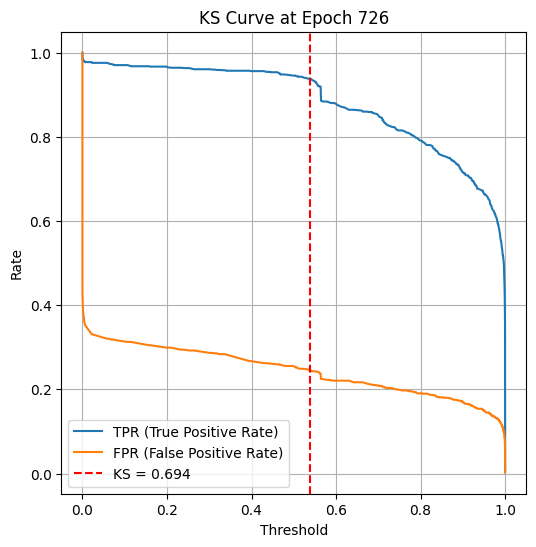

Epoch 730 — Train Loss: 0.1373 | Train Acc: 0.9376 | Val KS: 0.6960 | Val Acc: 0.8459 | Val Prec: 0.8061 | Val Recall: 0.9269 | Val F1: 0.8622
Epoch 740 — Train Loss: 0.1405 | Train Acc: 0.9367 | Val KS: 0.6735 | Val Acc: 0.8370 | Val Prec: 0.7921 | Val Recall: 0.9313 | Val F1: 0.8561


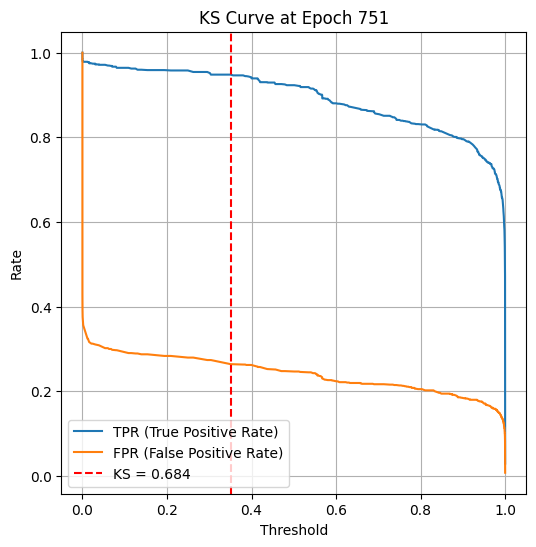

Epoch 750 — Train Loss: 0.1384 | Train Acc: 0.9396 | Val KS: 0.6840 | Val Acc: 0.8417 | Val Prec: 0.8023 | Val Recall: 0.9233 | Val F1: 0.8586
Epoch 760 — Train Loss: 0.1397 | Train Acc: 0.9375 | Val KS: 0.6850 | Val Acc: 0.8375 | Val Prec: 0.8062 | Val Recall: 0.9054 | Val F1: 0.8529
Epoch 770 — Train Loss: 0.1341 | Train Acc: 0.9407 | Val KS: 0.6748 | Val Acc: 0.8384 | Val Prec: 0.7908 | Val Recall: 0.9376 | Val F1: 0.8580


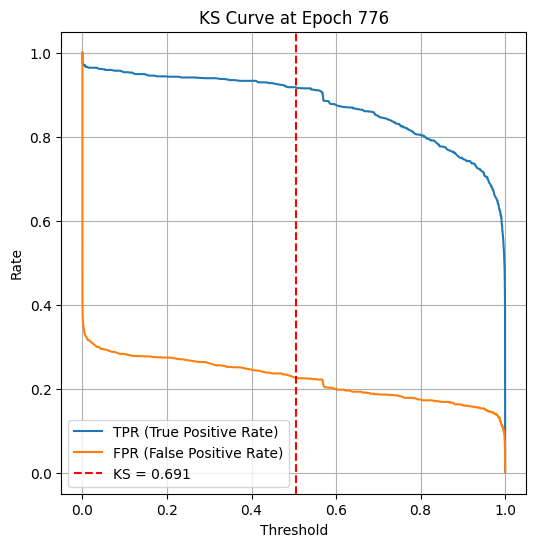

Epoch 780 — Train Loss: 0.1296 | Train Acc: 0.9426 | Val KS: 0.6941 | Val Acc: 0.8496 | Val Prec: 0.8101 | Val Recall: 0.9286 | Val F1: 0.8653
Epoch 790 — Train Loss: 0.1304 | Train Acc: 0.9423 | Val KS: 0.6854 | Val Acc: 0.8440 | Val Prec: 0.8008 | Val Recall: 0.9322 | Val F1: 0.8615


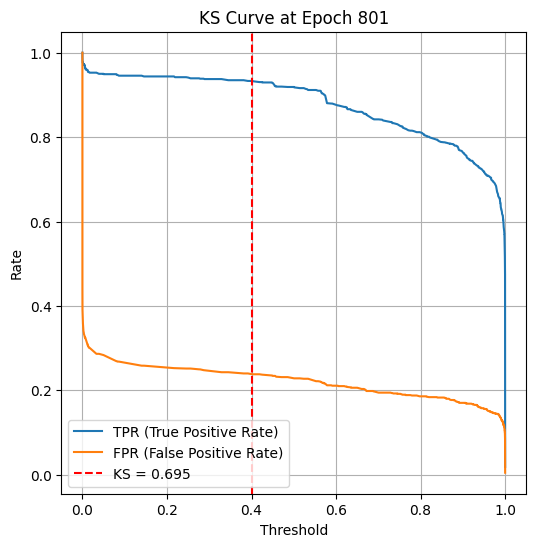

Epoch 800 — Train Loss: 0.1289 | Train Acc: 0.9437 | Val KS: 0.6950 | Val Acc: 0.8482 | Val Prec: 0.8136 | Val Recall: 0.9188 | Val F1: 0.8630
Epoch 810 — Train Loss: 0.1319 | Train Acc: 0.9401 | Val KS: 0.6918 | Val Acc: 0.8463 | Val Prec: 0.8076 | Val Recall: 0.9251 | Val F1: 0.8624
Epoch 820 — Train Loss: 0.1275 | Train Acc: 0.9395 | Val KS: 0.6827 | Val Acc: 0.8398 | Val Prec: 0.8046 | Val Recall: 0.9144 | Val F1: 0.8559


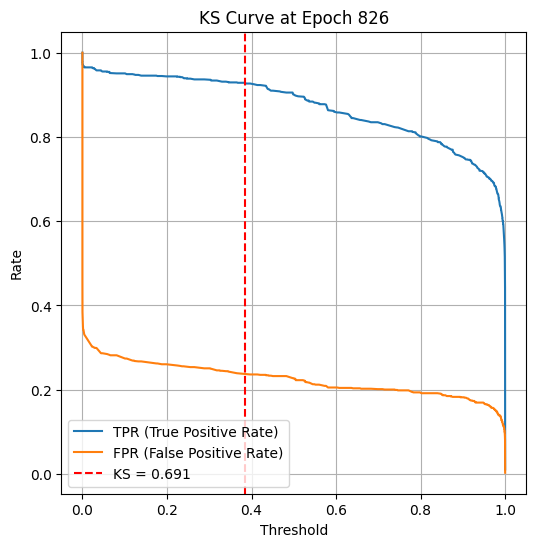

Epoch 830 — Train Loss: 0.1277 | Train Acc: 0.9448 | Val KS: 0.6830 | Val Acc: 0.8449 | Val Prec: 0.8006 | Val Recall: 0.9349 | Val F1: 0.8626
Epoch 840 — Train Loss: 0.1230 | Train Acc: 0.9446 | Val KS: 0.6837 | Val Acc: 0.8431 | Val Prec: 0.8014 | Val Recall: 0.9286 | Val F1: 0.8603


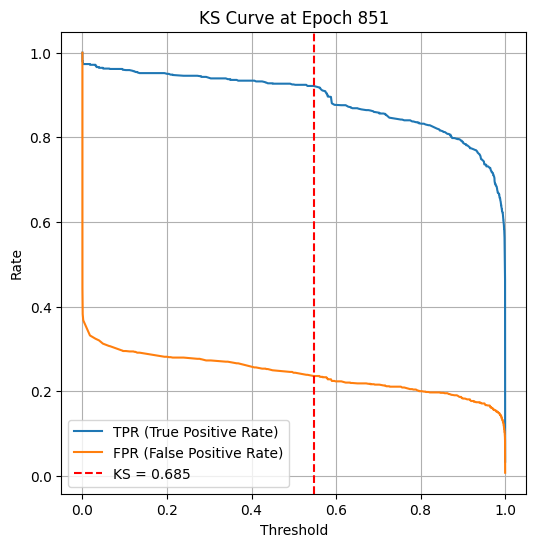

Epoch 850 — Train Loss: 0.1274 | Train Acc: 0.9449 | Val KS: 0.6853 | Val Acc: 0.8435 | Val Prec: 0.8043 | Val Recall: 0.9242 | Val F1: 0.8601
Epoch 860 — Train Loss: 0.1322 | Train Acc: 0.9406 | Val KS: 0.7034 | Val Acc: 0.8533 | Val Prec: 0.8123 | Val Recall: 0.9340 | Val F1: 0.8689
Epoch 870 — Train Loss: 0.1209 | Train Acc: 0.9452 | Val KS: 0.6883 | Val Acc: 0.8412 | Val Prec: 0.8055 | Val Recall: 0.9161 | Val F1: 0.8573


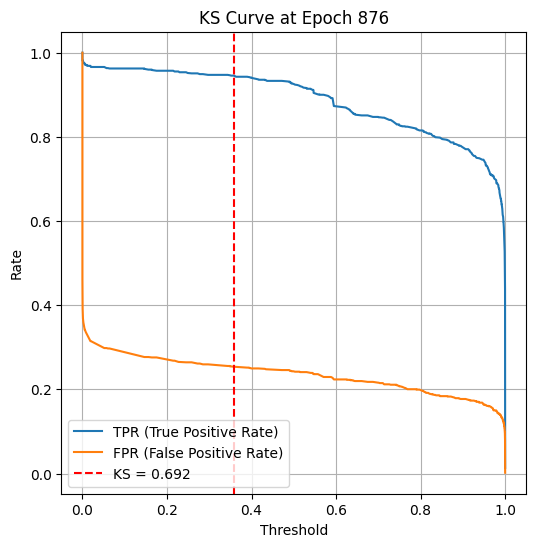

Epoch 880 — Train Loss: 0.1230 | Train Acc: 0.9448 | Val KS: 0.6924 | Val Acc: 0.8445 | Val Prec: 0.8085 | Val Recall: 0.9188 | Val F1: 0.8601
Epoch 890 — Train Loss: 0.1201 | Train Acc: 0.9438 | Val KS: 0.7037 | Val Acc: 0.8533 | Val Prec: 0.8094 | Val Recall: 0.9393 | Val F1: 0.8695


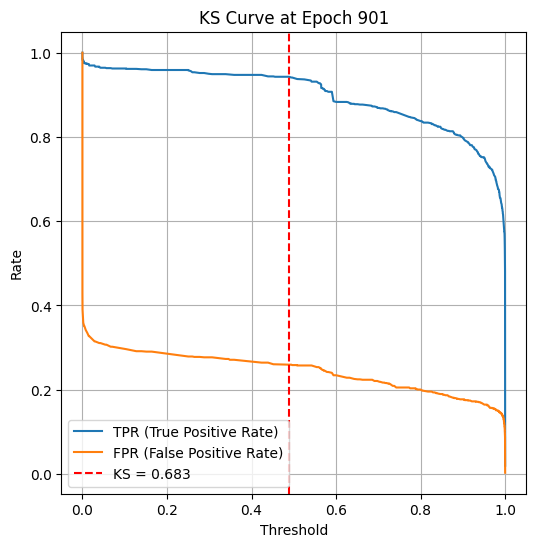

Epoch 900 — Train Loss: 0.1206 | Train Acc: 0.9460 | Val KS: 0.6835 | Val Acc: 0.8445 | Val Prec: 0.7977 | Val Recall: 0.9393 | Val F1: 0.8628
Epoch 910 — Train Loss: 0.1235 | Train Acc: 0.9420 | Val KS: 0.6840 | Val Acc: 0.8431 | Val Prec: 0.8042 | Val Recall: 0.9233 | Val F1: 0.8596
Epoch 920 — Train Loss: 0.1177 | Train Acc: 0.9449 | Val KS: 0.6885 | Val Acc: 0.8482 | Val Prec: 0.7967 | Val Recall: 0.9509 | Val F1: 0.8670


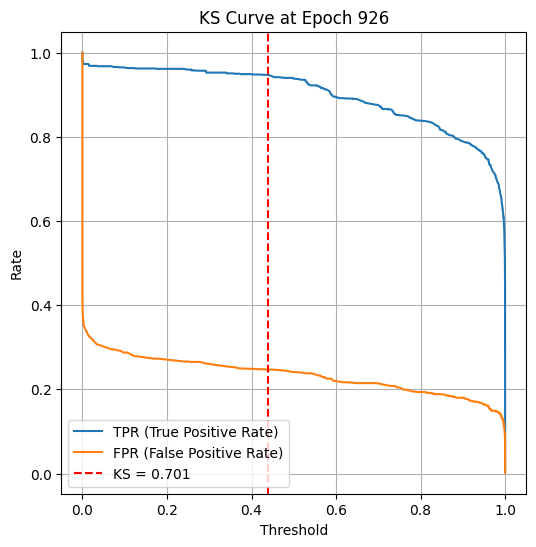

Epoch 930 — Train Loss: 0.1285 | Train Acc: 0.9427 | Val KS: 0.6760 | Val Acc: 0.8370 | Val Prec: 0.8036 | Val Recall: 0.9090 | Val F1: 0.8531
Epoch 940 — Train Loss: 0.1147 | Train Acc: 0.9489 | Val KS: 0.6853 | Val Acc: 0.8431 | Val Prec: 0.8009 | Val Recall: 0.9295 | Val F1: 0.8604


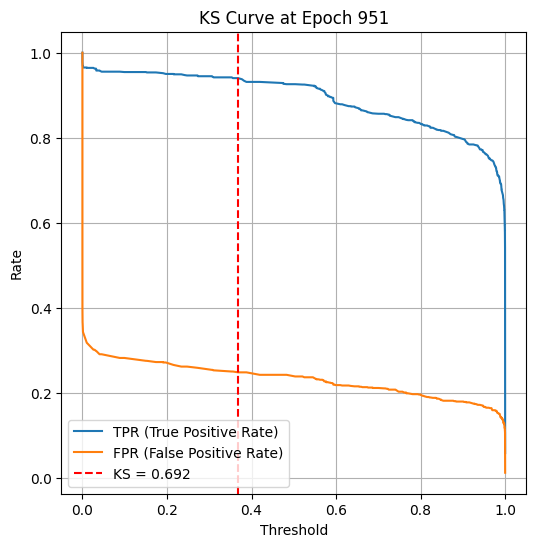

Epoch 950 — Train Loss: 0.1153 | Train Acc: 0.9485 | Val KS: 0.6924 | Val Acc: 0.8468 | Val Prec: 0.8078 | Val Recall: 0.9260 | Val F1: 0.8628
Epoch 960 — Train Loss: 0.1202 | Train Acc: 0.9499 | Val KS: 0.7086 | Val Acc: 0.8482 | Val Prec: 0.8141 | Val Recall: 0.9179 | Val F1: 0.8629
Epoch 970 — Train Loss: 0.1264 | Train Acc: 0.9444 | Val KS: 0.6956 | Val Acc: 0.8459 | Val Prec: 0.8143 | Val Recall: 0.9117 | Val F1: 0.8603


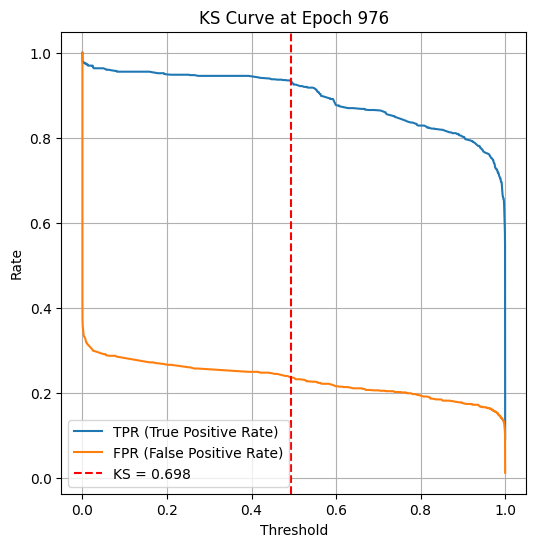

Epoch 980 — Train Loss: 0.1151 | Train Acc: 0.9499 | Val KS: 0.7062 | Val Acc: 0.8538 | Val Prec: 0.8086 | Val Recall: 0.9420 | Val F1: 0.8702
Epoch 990 — Train Loss: 0.1202 | Train Acc: 0.9494 | Val KS: 0.6884 | Val Acc: 0.8445 | Val Prec: 0.7959 | Val Recall: 0.9429 | Val F1: 0.8632
Epoch 999 — Train Loss: 0.1194 | Train Acc: 0.9468 | Val KS: 0.6902 | Val Acc: 0.8426 | Val Prec: 0.8069 | Val Recall: 0.9170 | Val F1: 0.8585


In [ ]:

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = STABTransformer(input_dim=X_train_tensor.shape[1], n_heads=16, n_layers=1, dropout=0.3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.BCELoss()


epochs=1000
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    all_preds = []
    all_targets = []

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        preds_np = (pred > 0.5).detach().cpu().numpy()
        targets_np = yb.detach().cpu().numpy()

        all_preds.extend(preds_np)
        all_targets.extend(targets_np)

    # Training metrics
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    # Validation metrics
    ks_val, acc_val, prec_val, rec_val, f1_val = evaluate_validation(model, val_loader, device, epoch)

    if epoch % 10 == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch:03d} — Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Train Acc: {acc:.4f} | Val KS: {ks_val:.4f} | Val Acc: {acc_val:.4f} | "
              f"Val Prec: {prec_val:.4f} | Val Recall: {rec_val:.4f} | Val F1: {f1_val:.4f}")


In [ ]:

torch.save(model.state_dict(), 'stab_transformer_16head_1layer_0.1droput_1000epochs.pt')
files.download('stab_transformer_16head_1layer_0.1droput_1000epochs.pt')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Accuracy: 0.8445
✅ Precision: 0.8090
✅ Recall: 0.9179
✅ F1 Score: 0.8600


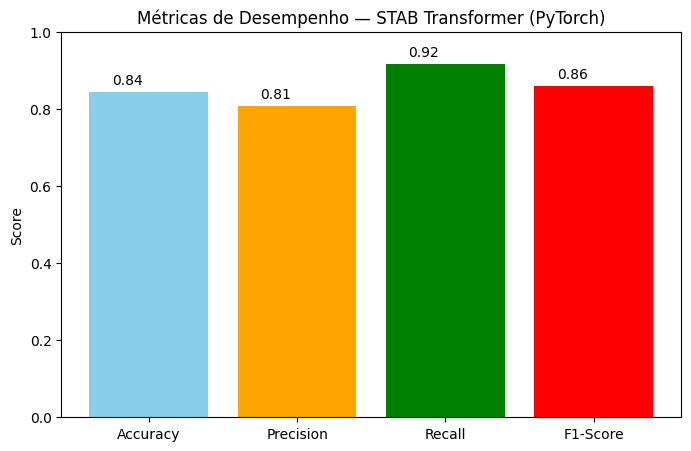

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)

acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



✅ Accuracy: 0.4986
✅ Precision: 0.5154
✅ Recall: 0.6102
✅ F1 Score: 0.5588


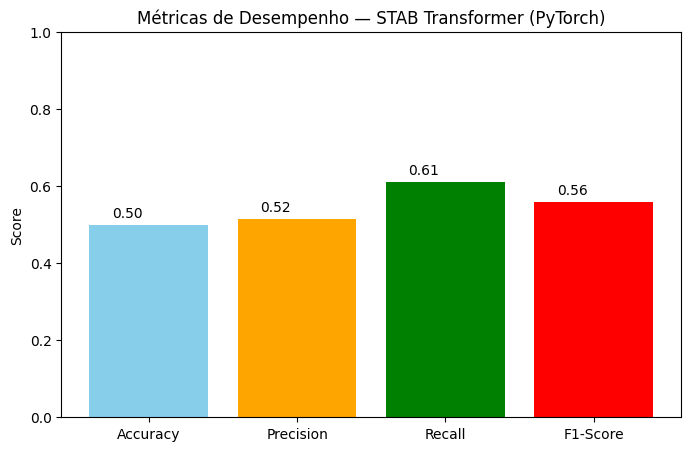

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_val_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_val_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)

acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



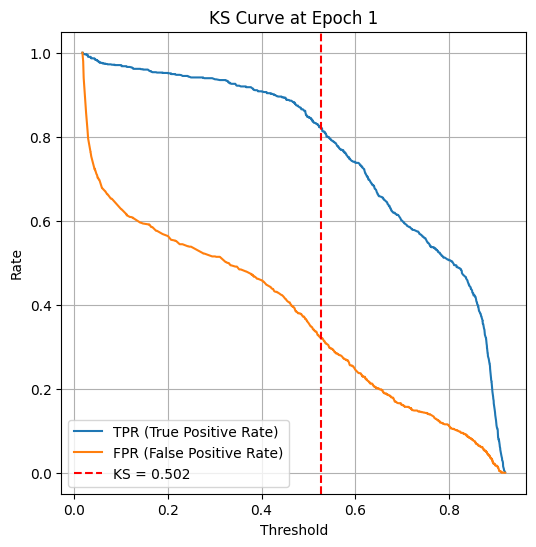

Epoch 000 — Train Loss: 0.5156 | Train Acc: 0.7498 | Val KS: 0.5021 | Val Acc: 0.7498 | Val Prec: 0.7208 | Val Recall: 0.8475 | Val F1: 0.7790
Epoch 010 — Train Loss: 0.4788 | Train Acc: 0.7751 | Val KS: 0.5154 | Val Acc: 0.7572 | Val Prec: 0.7521 | Val Recall: 0.7957 | Val F1: 0.7733
Epoch 020 — Train Loss: 0.4698 | Train Acc: 0.7779 | Val KS: 0.5155 | Val Acc: 0.7558 | Val Prec: 0.7393 | Val Recall: 0.8198 | Val F1: 0.7775


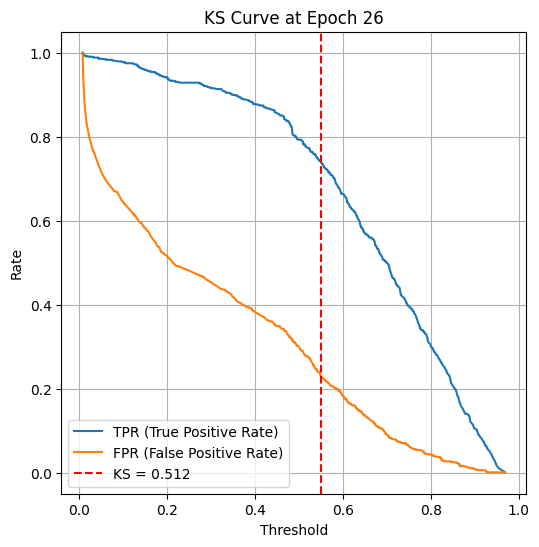

Epoch 030 — Train Loss: 0.4594 | Train Acc: 0.7810 | Val KS: 0.5144 | Val Acc: 0.7502 | Val Prec: 0.7334 | Val Recall: 0.8171 | Val F1: 0.7730
Epoch 040 — Train Loss: 0.4476 | Train Acc: 0.7869 | Val KS: 0.5341 | Val Acc: 0.7530 | Val Prec: 0.7637 | Val Recall: 0.7609 | Val F1: 0.7623


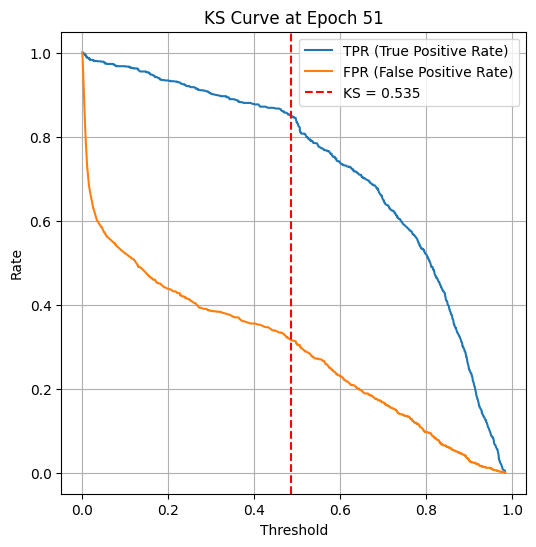

Epoch 050 — Train Loss: 0.4243 | Train Acc: 0.8010 | Val KS: 0.5345 | Val Acc: 0.7669 | Val Prec: 0.7478 | Val Recall: 0.8332 | Val F1: 0.7882
Epoch 060 — Train Loss: 0.4034 | Train Acc: 0.8114 | Val KS: 0.5475 | Val Acc: 0.7744 | Val Prec: 0.7309 | Val Recall: 0.8965 | Val F1: 0.8053
Epoch 070 — Train Loss: 0.3785 | Train Acc: 0.8194 | Val KS: 0.5657 | Val Acc: 0.7846 | Val Prec: 0.7428 | Val Recall: 0.8965 | Val F1: 0.8124


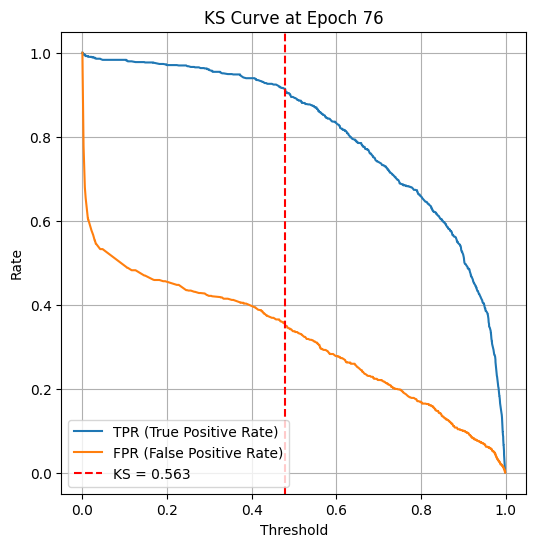

Epoch 080 — Train Loss: 0.3643 | Train Acc: 0.8327 | Val KS: 0.5619 | Val Acc: 0.7813 | Val Prec: 0.7386 | Val Recall: 0.8974 | Val F1: 0.8103
Epoch 090 — Train Loss: 0.3462 | Train Acc: 0.8401 | Val KS: 0.5833 | Val Acc: 0.7948 | Val Prec: 0.7610 | Val Recall: 0.8831 | Val F1: 0.8175


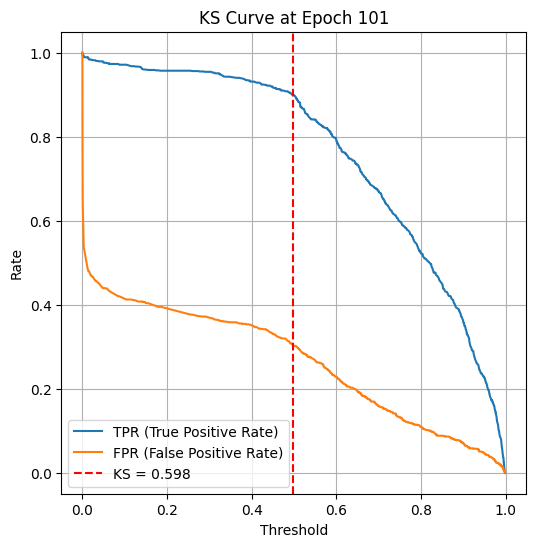

Epoch 100 — Train Loss: 0.3309 | Train Acc: 0.8462 | Val KS: 0.5981 | Val Acc: 0.8022 | Val Prec: 0.7635 | Val Recall: 0.8983 | Val F1: 0.8254
Epoch 110 — Train Loss: 0.3225 | Train Acc: 0.8538 | Val KS: 0.5956 | Val Acc: 0.8032 | Val Prec: 0.7463 | Val Recall: 0.9420 | Val F1: 0.8328
Epoch 120 — Train Loss: 0.3114 | Train Acc: 0.8589 | Val KS: 0.5974 | Val Acc: 0.7994 | Val Prec: 0.7539 | Val Recall: 0.9126 | Val F1: 0.8257


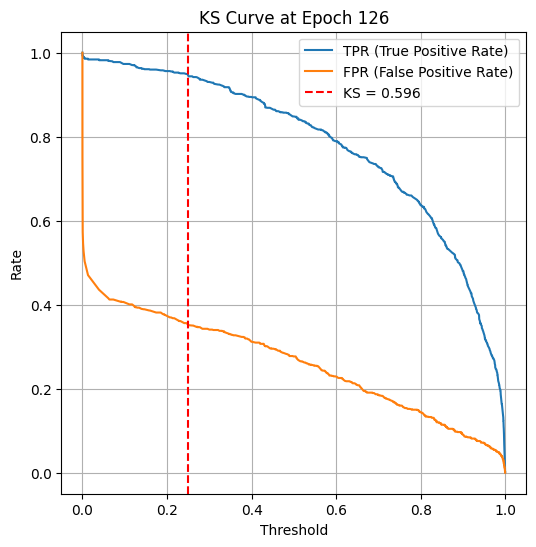

Epoch 130 — Train Loss: 0.3073 | Train Acc: 0.8646 | Val KS: 0.5964 | Val Acc: 0.7925 | Val Prec: 0.7637 | Val Recall: 0.8707 | Val F1: 0.8137
Epoch 140 — Train Loss: 0.2875 | Train Acc: 0.8669 | Val KS: 0.6004 | Val Acc: 0.7906 | Val Prec: 0.7557 | Val Recall: 0.8831 | Val F1: 0.8145


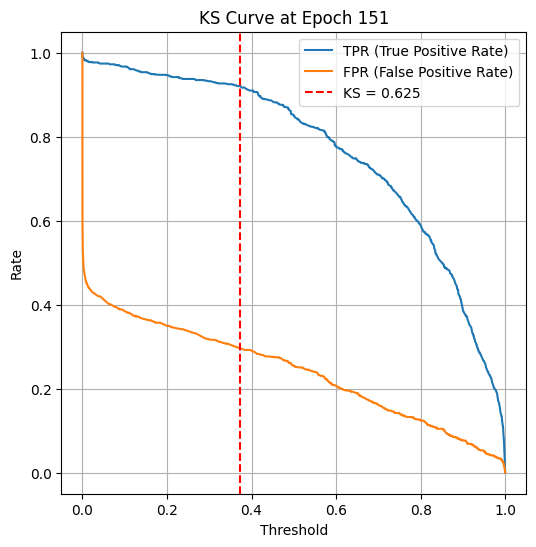

Epoch 150 — Train Loss: 0.2889 | Train Acc: 0.8665 | Val KS: 0.6254 | Val Acc: 0.7999 | Val Prec: 0.7837 | Val Recall: 0.8501 | Val F1: 0.8156
Epoch 160 — Train Loss: 0.2870 | Train Acc: 0.8723 | Val KS: 0.6305 | Val Acc: 0.8083 | Val Prec: 0.7792 | Val Recall: 0.8814 | Val F1: 0.8271
Epoch 170 — Train Loss: 0.2753 | Train Acc: 0.8740 | Val KS: 0.6199 | Val Acc: 0.8013 | Val Prec: 0.7757 | Val Recall: 0.8698 | Val F1: 0.8200


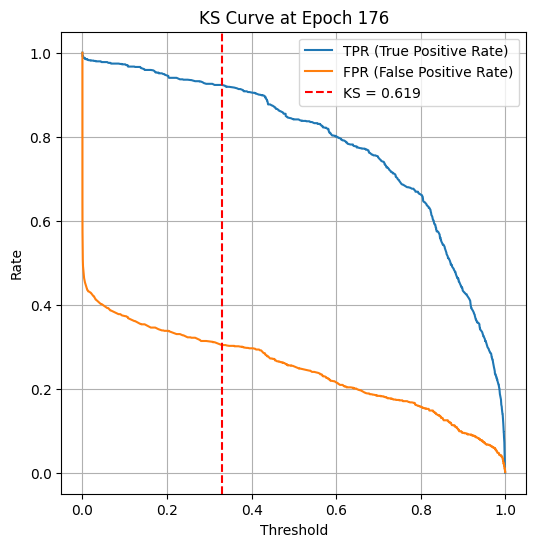

Epoch 180 — Train Loss: 0.2804 | Train Acc: 0.8720 | Val KS: 0.6163 | Val Acc: 0.8110 | Val Prec: 0.7572 | Val Recall: 0.9376 | Val F1: 0.8378
Epoch 190 — Train Loss: 0.2658 | Train Acc: 0.8841 | Val KS: 0.6349 | Val Acc: 0.8185 | Val Prec: 0.7664 | Val Recall: 0.9367 | Val F1: 0.8430


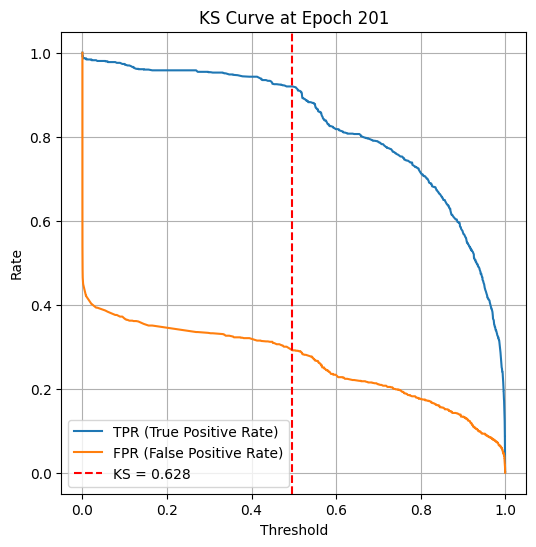

Epoch 200 — Train Loss: 0.2648 | Train Acc: 0.8805 | Val KS: 0.6283 | Val Acc: 0.8180 | Val Prec: 0.7739 | Val Recall: 0.9188 | Val F1: 0.8401
Epoch 210 — Train Loss: 0.2606 | Train Acc: 0.8818 | Val KS: 0.6325 | Val Acc: 0.8078 | Val Prec: 0.7948 | Val Recall: 0.8501 | Val F1: 0.8216
Epoch 220 — Train Loss: 0.2621 | Train Acc: 0.8852 | Val KS: 0.6323 | Val Acc: 0.8059 | Val Prec: 0.7860 | Val Recall: 0.8617 | Val F1: 0.8221


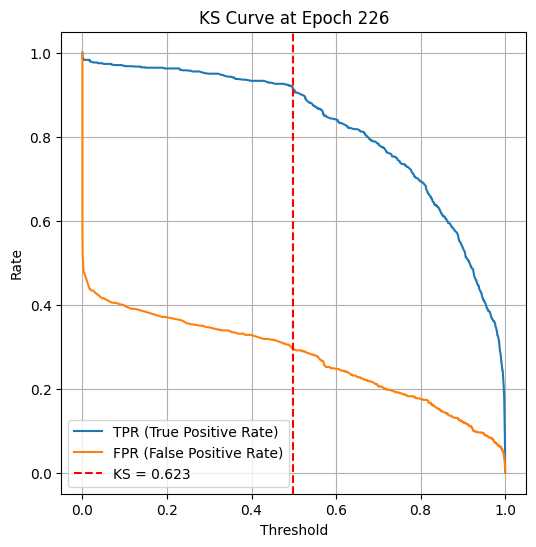

Epoch 230 — Train Loss: 0.2564 | Train Acc: 0.8832 | Val KS: 0.6268 | Val Acc: 0.8087 | Val Prec: 0.7838 | Val Recall: 0.8733 | Val F1: 0.8262
Epoch 240 — Train Loss: 0.2629 | Train Acc: 0.8796 | Val KS: 0.6108 | Val Acc: 0.8041 | Val Prec: 0.7758 | Val Recall: 0.8769 | Val F1: 0.8233


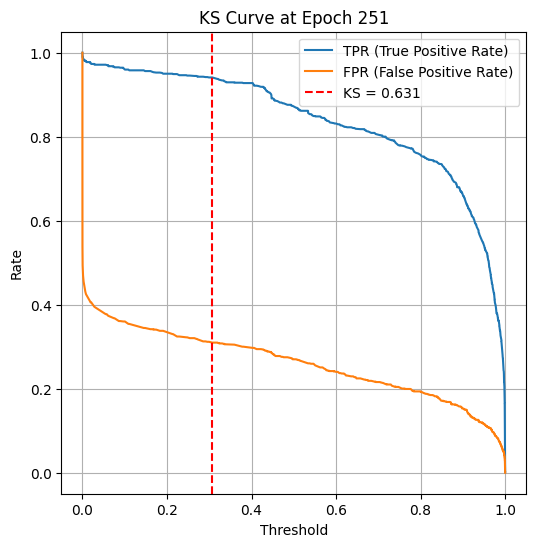

Epoch 250 — Train Loss: 0.2651 | Train Acc: 0.8812 | Val KS: 0.6313 | Val Acc: 0.8036 | Val Prec: 0.7779 | Val Recall: 0.8715 | Val F1: 0.8220
Epoch 260 — Train Loss: 0.2619 | Train Acc: 0.8850 | Val KS: 0.6169 | Val Acc: 0.8069 | Val Prec: 0.7739 | Val Recall: 0.8885 | Val F1: 0.8272
Epoch 270 — Train Loss: 0.2607 | Train Acc: 0.8856 | Val KS: 0.6211 | Val Acc: 0.8129 | Val Prec: 0.7707 | Val Recall: 0.9117 | Val F1: 0.8353


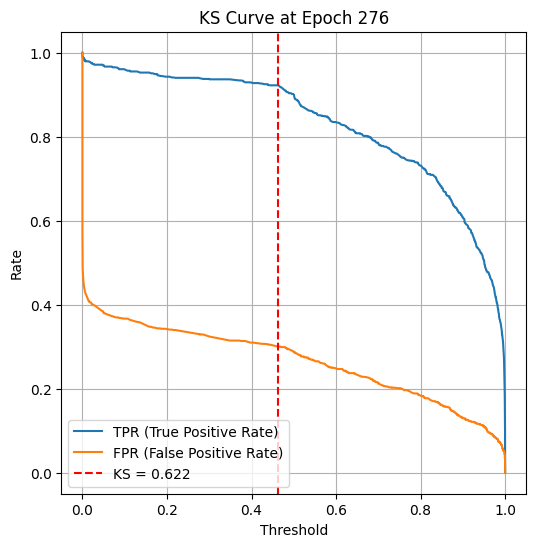

Epoch 280 — Train Loss: 0.2611 | Train Acc: 0.8866 | Val KS: 0.6219 | Val Acc: 0.7994 | Val Prec: 0.7888 | Val Recall: 0.8394 | Val F1: 0.8133
Epoch 290 — Train Loss: 0.2548 | Train Acc: 0.8858 | Val KS: 0.6166 | Val Acc: 0.8022 | Val Prec: 0.7725 | Val Recall: 0.8787 | Val F1: 0.8222


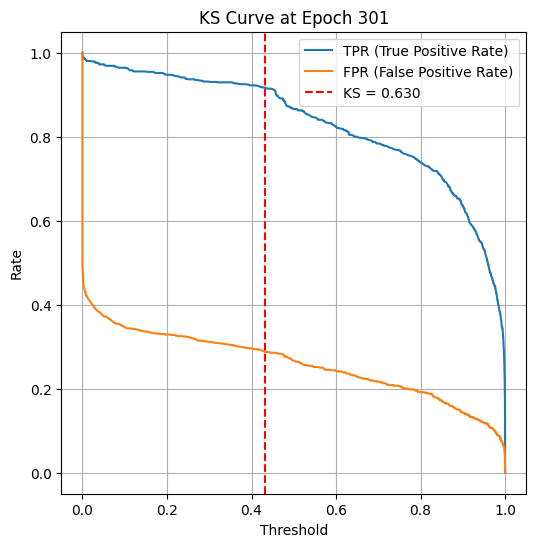

Epoch 300 — Train Loss: 0.2544 | Train Acc: 0.8825 | Val KS: 0.6295 | Val Acc: 0.8027 | Val Prec: 0.7793 | Val Recall: 0.8662 | Val F1: 0.8204
Epoch 310 — Train Loss: 0.2617 | Train Acc: 0.8810 | Val KS: 0.6103 | Val Acc: 0.8008 | Val Prec: 0.7653 | Val Recall: 0.8903 | Val F1: 0.8231
Epoch 320 — Train Loss: 0.2562 | Train Acc: 0.8836 | Val KS: 0.6307 | Val Acc: 0.8171 | Val Prec: 0.7855 | Val Recall: 0.8921 | Val F1: 0.8354


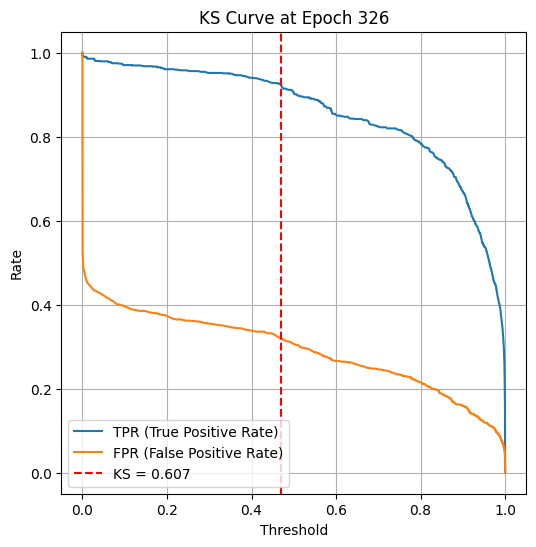

Epoch 330 — Train Loss: 0.2640 | Train Acc: 0.8824 | Val KS: 0.6136 | Val Acc: 0.8106 | Val Prec: 0.7643 | Val Recall: 0.9197 | Val F1: 0.8348
Epoch 340 — Train Loss: 0.2545 | Train Acc: 0.8880 | Val KS: 0.6019 | Val Acc: 0.7990 | Val Prec: 0.7761 | Val Recall: 0.8626 | Val F1: 0.8171


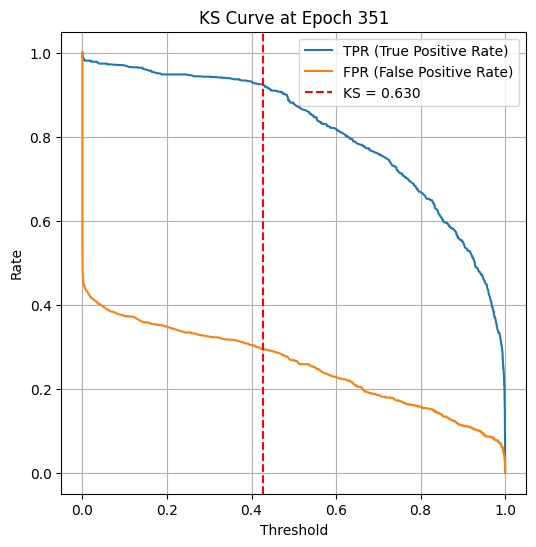

Epoch 350 — Train Loss: 0.2596 | Train Acc: 0.8880 | Val KS: 0.6299 | Val Acc: 0.8083 | Val Prec: 0.7805 | Val Recall: 0.8787 | Val F1: 0.8267
Epoch 360 — Train Loss: 0.2627 | Train Acc: 0.8858 | Val KS: 0.6378 | Val Acc: 0.8208 | Val Prec: 0.7795 | Val Recall: 0.9144 | Val F1: 0.8415
Epoch 370 — Train Loss: 0.2598 | Train Acc: 0.8859 | Val KS: 0.6247 | Val Acc: 0.8045 | Val Prec: 0.7782 | Val Recall: 0.8733 | Val F1: 0.8230


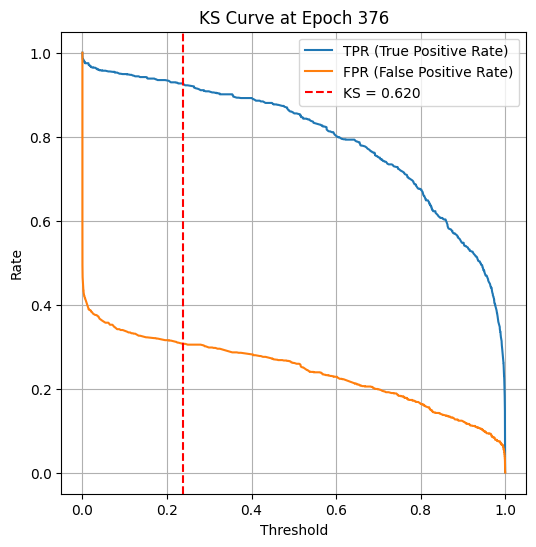

Epoch 380 — Train Loss: 0.2681 | Train Acc: 0.8801 | Val KS: 0.6273 | Val Acc: 0.8106 | Val Prec: 0.7805 | Val Recall: 0.8849 | Val F1: 0.8294
Epoch 390 — Train Loss: 0.2581 | Train Acc: 0.8833 | Val KS: 0.6165 | Val Acc: 0.8059 | Val Prec: 0.7689 | Val Recall: 0.8965 | Val F1: 0.8278


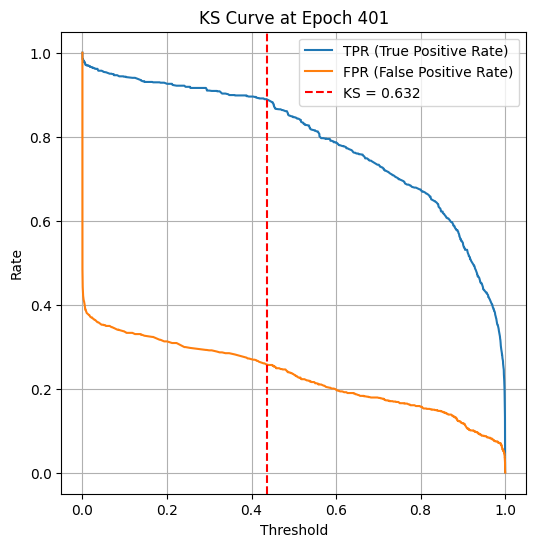

Epoch 400 — Train Loss: 0.2523 | Train Acc: 0.8884 | Val KS: 0.6319 | Val Acc: 0.8078 | Val Prec: 0.7968 | Val Recall: 0.8466 | Val F1: 0.8209
Epoch 410 — Train Loss: 0.2642 | Train Acc: 0.8829 | Val KS: 0.6174 | Val Acc: 0.8110 | Val Prec: 0.7613 | Val Recall: 0.9277 | Val F1: 0.8363
Epoch 420 — Train Loss: 0.2460 | Train Acc: 0.8911 | Val KS: 0.6147 | Val Acc: 0.8101 | Val Prec: 0.7561 | Val Recall: 0.9376 | Val F1: 0.8371


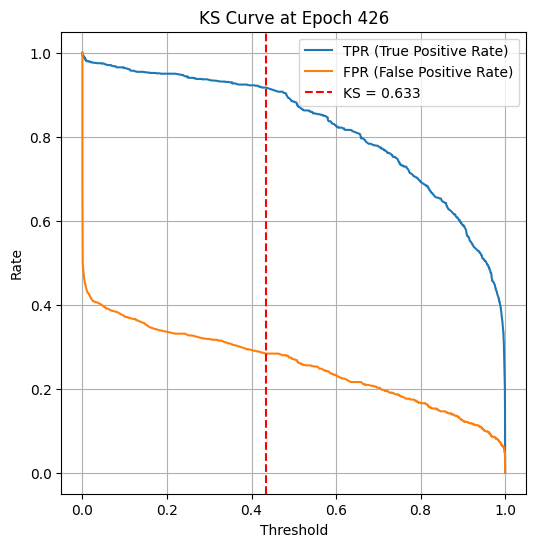

Epoch 430 — Train Loss: 0.2602 | Train Acc: 0.8836 | Val KS: 0.6295 | Val Acc: 0.8032 | Val Prec: 0.7951 | Val Recall: 0.8376 | Val F1: 0.8158
Epoch 440 — Train Loss: 0.2595 | Train Acc: 0.8829 | Val KS: 0.6310 | Val Acc: 0.8138 | Val Prec: 0.7880 | Val Recall: 0.8787 | Val F1: 0.8309


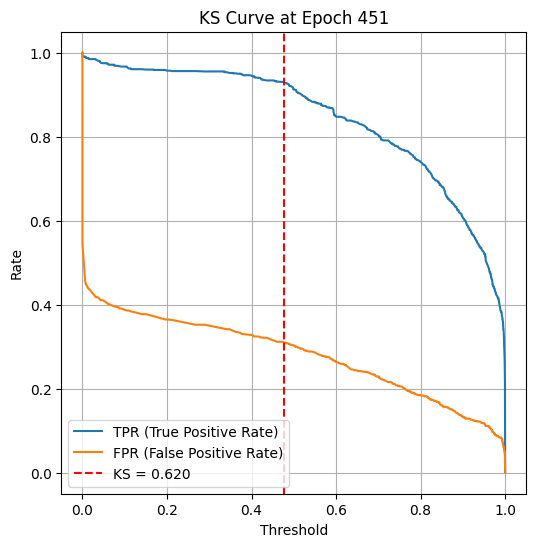

Epoch 450 — Train Loss: 0.2555 | Train Acc: 0.8870 | Val KS: 0.6197 | Val Acc: 0.8097 | Val Prec: 0.7663 | Val Recall: 0.9126 | Val F1: 0.8331
Epoch 460 — Train Loss: 0.2534 | Train Acc: 0.8816 | Val KS: 0.6321 | Val Acc: 0.8143 | Val Prec: 0.7919 | Val Recall: 0.8724 | Val F1: 0.8302
Epoch 470 — Train Loss: 0.2606 | Train Acc: 0.8850 | Val KS: 0.6066 | Val Acc: 0.8045 | Val Prec: 0.7574 | Val Recall: 0.9188 | Val F1: 0.8303


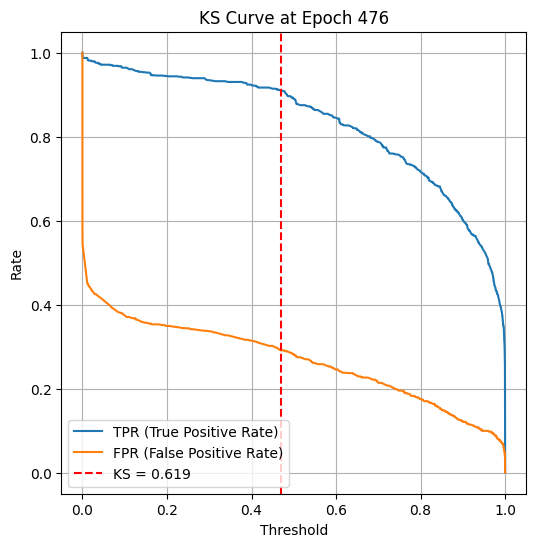

Epoch 480 — Train Loss: 0.2629 | Train Acc: 0.8859 | Val KS: 0.6253 | Val Acc: 0.8083 | Val Prec: 0.8005 | Val Recall: 0.8412 | Val F1: 0.8204
Epoch 490 — Train Loss: 0.2631 | Train Acc: 0.8793 | Val KS: 0.6228 | Val Acc: 0.8073 | Val Prec: 0.7745 | Val Recall: 0.8885 | Val F1: 0.8276


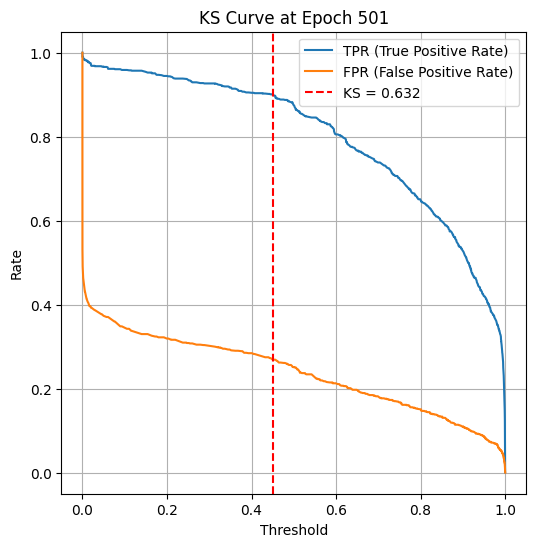

Epoch 500 — Train Loss: 0.2537 | Train Acc: 0.8872 | Val KS: 0.6319 | Val Acc: 0.8143 | Val Prec: 0.7905 | Val Recall: 0.8751 | Val F1: 0.8307
Epoch 510 — Train Loss: 0.2492 | Train Acc: 0.8878 | Val KS: 0.6253 | Val Acc: 0.8106 | Val Prec: 0.7682 | Val Recall: 0.9108 | Val F1: 0.8335
Epoch 520 — Train Loss: 0.2547 | Train Acc: 0.8886 | Val KS: 0.6428 | Val Acc: 0.8217 | Val Prec: 0.7846 | Val Recall: 0.9063 | Val F1: 0.8411


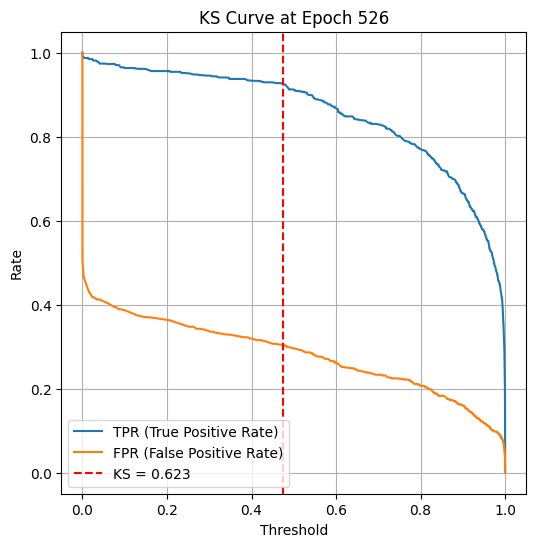

Epoch 530 — Train Loss: 0.2537 | Train Acc: 0.8861 | Val KS: 0.6442 | Val Acc: 0.8110 | Val Prec: 0.7865 | Val Recall: 0.8742 | Val F1: 0.8281
Epoch 540 — Train Loss: 0.2511 | Train Acc: 0.8853 | Val KS: 0.6332 | Val Acc: 0.8124 | Val Prec: 0.7912 | Val Recall: 0.8689 | Val F1: 0.8282


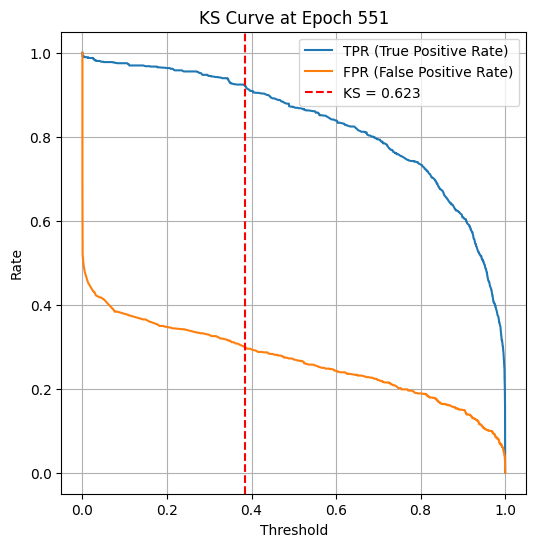

Epoch 550 — Train Loss: 0.2485 | Train Acc: 0.8894 | Val KS: 0.6233 | Val Acc: 0.8032 | Val Prec: 0.7777 | Val Recall: 0.8707 | Val F1: 0.8215
Epoch 560 — Train Loss: 0.2634 | Train Acc: 0.8886 | Val KS: 0.6359 | Val Acc: 0.8180 | Val Prec: 0.7802 | Val Recall: 0.9054 | Val F1: 0.8382
Epoch 570 — Train Loss: 0.2549 | Train Acc: 0.8884 | Val KS: 0.6264 | Val Acc: 0.8157 | Val Prec: 0.7772 | Val Recall: 0.9054 | Val F1: 0.8364


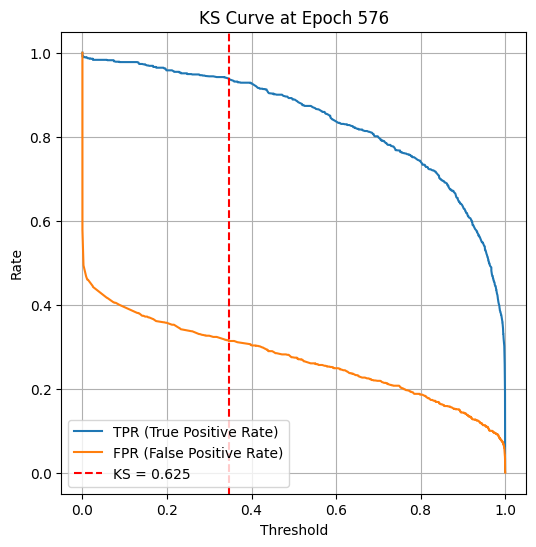

Epoch 580 — Train Loss: 0.2506 | Train Acc: 0.8904 | Val KS: 0.6476 | Val Acc: 0.8175 | Val Prec: 0.8143 | Val Recall: 0.8412 | Val F1: 0.8276
Epoch 590 — Train Loss: 0.2611 | Train Acc: 0.8818 | Val KS: 0.6233 | Val Acc: 0.8013 | Val Prec: 0.7783 | Val Recall: 0.8644 | Val F1: 0.8191


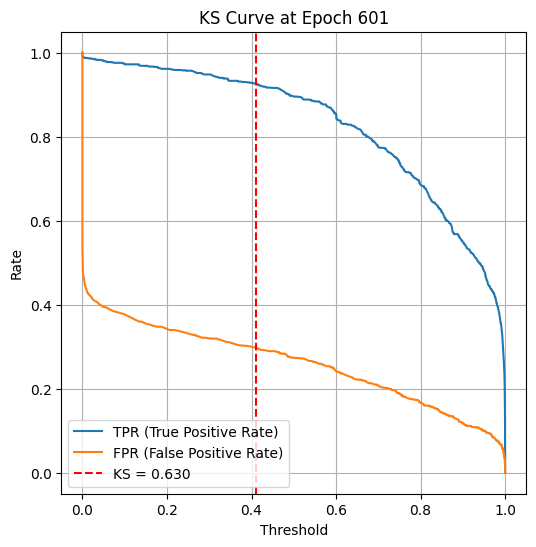

Epoch 600 — Train Loss: 0.2530 | Train Acc: 0.8895 | Val KS: 0.6297 | Val Acc: 0.8143 | Val Prec: 0.7801 | Val Recall: 0.8956 | Val F1: 0.8339
Epoch 610 — Train Loss: 0.2531 | Train Acc: 0.8886 | Val KS: 0.6436 | Val Acc: 0.8189 | Val Prec: 0.7931 | Val Recall: 0.8822 | Val F1: 0.8353
Epoch 620 — Train Loss: 0.2537 | Train Acc: 0.8858 | Val KS: 0.6522 | Val Acc: 0.8162 | Val Prec: 0.7974 | Val Recall: 0.8671 | Val F1: 0.8308


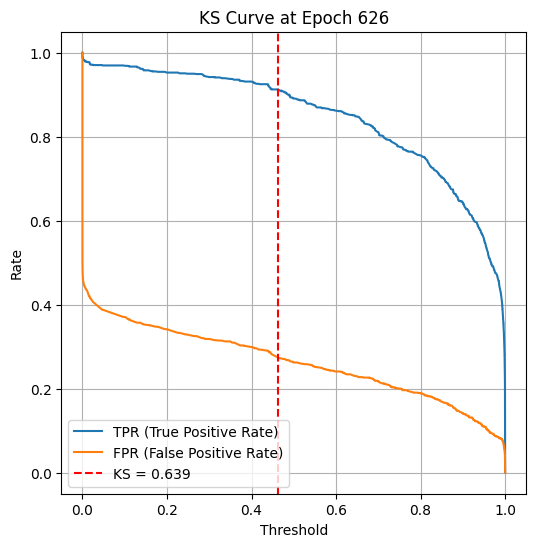

Epoch 630 — Train Loss: 0.2598 | Train Acc: 0.8877 | Val KS: 0.6380 | Val Acc: 0.8148 | Val Prec: 0.7829 | Val Recall: 0.8912 | Val F1: 0.8335
Epoch 640 — Train Loss: 0.2518 | Train Acc: 0.8887 | Val KS: 0.6263 | Val Acc: 0.8134 | Val Prec: 0.7785 | Val Recall: 0.8965 | Val F1: 0.8333


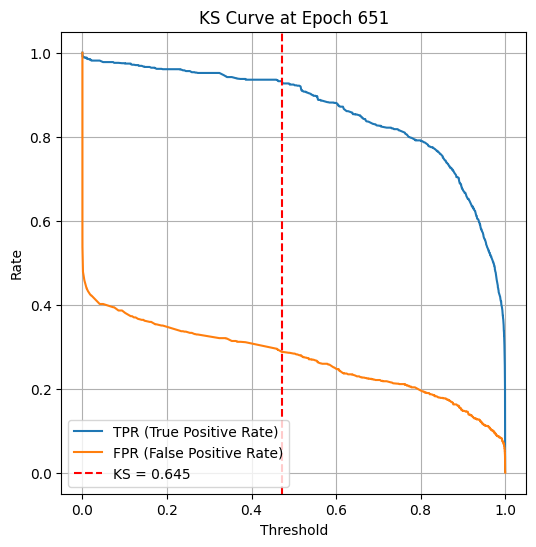

Epoch 650 — Train Loss: 0.2585 | Train Acc: 0.8880 | Val KS: 0.6447 | Val Acc: 0.8236 | Val Prec: 0.7792 | Val Recall: 0.9224 | Val F1: 0.8448
Epoch 660 — Train Loss: 0.2569 | Train Acc: 0.8853 | Val KS: 0.6630 | Val Acc: 0.8301 | Val Prec: 0.7994 | Val Recall: 0.8992 | Val F1: 0.8463
Epoch 670 — Train Loss: 0.2546 | Train Acc: 0.8880 | Val KS: 0.6372 | Val Acc: 0.8199 | Val Prec: 0.7939 | Val Recall: 0.8831 | Val F1: 0.8361


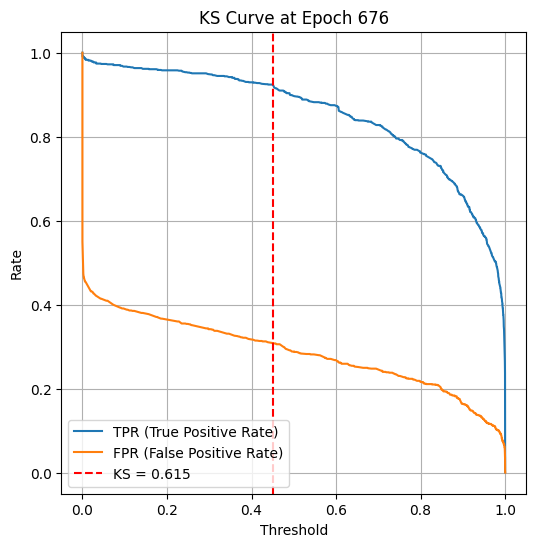

Epoch 680 — Train Loss: 0.2555 | Train Acc: 0.8855 | Val KS: 0.6354 | Val Acc: 0.8106 | Val Prec: 0.7901 | Val Recall: 0.8662 | Val F1: 0.8264
Epoch 690 — Train Loss: 0.2601 | Train Acc: 0.8844 | Val KS: 0.6166 | Val Acc: 0.8041 | Val Prec: 0.7900 | Val Recall: 0.8492 | Val F1: 0.8186


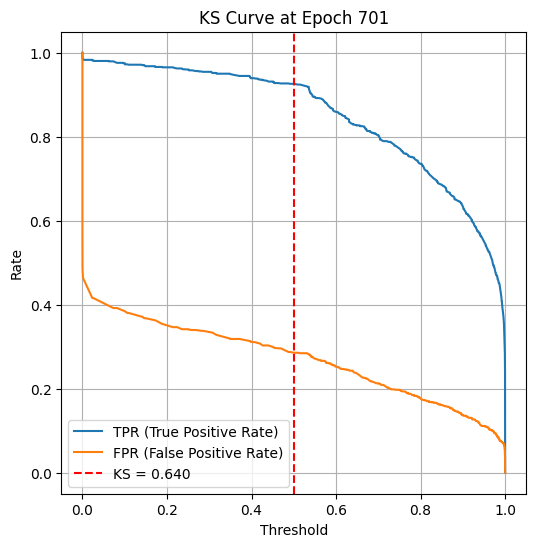

Epoch 700 — Train Loss: 0.2568 | Train Acc: 0.8852 | Val KS: 0.6404 | Val Acc: 0.8245 | Val Prec: 0.7787 | Val Recall: 0.9260 | Val F1: 0.8460
Epoch 710 — Train Loss: 0.2605 | Train Acc: 0.8875 | Val KS: 0.6474 | Val Acc: 0.8110 | Val Prec: 0.8000 | Val Recall: 0.8492 | Val F1: 0.8239
Epoch 720 — Train Loss: 0.2516 | Train Acc: 0.8895 | Val KS: 0.6304 | Val Acc: 0.8124 | Val Prec: 0.7760 | Val Recall: 0.8992 | Val F1: 0.8331


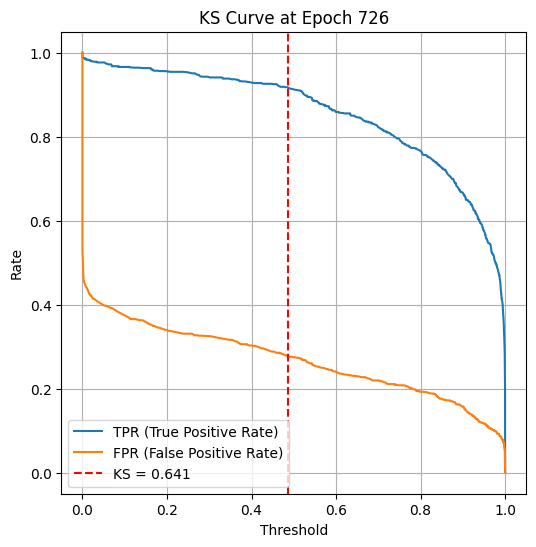

Epoch 730 — Train Loss: 0.2502 | Train Acc: 0.8912 | Val KS: 0.6541 | Val Acc: 0.8259 | Val Prec: 0.8013 | Val Recall: 0.8849 | Val F1: 0.8410
Epoch 740 — Train Loss: 0.2470 | Train Acc: 0.8898 | Val KS: 0.6391 | Val Acc: 0.8231 | Val Prec: 0.7829 | Val Recall: 0.9135 | Val F1: 0.8431


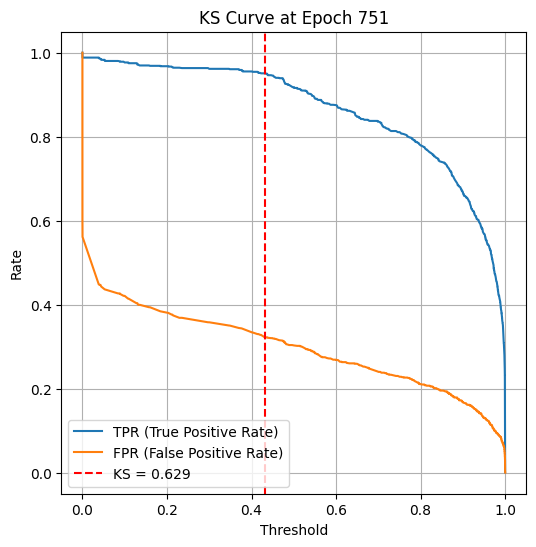

Epoch 750 — Train Loss: 0.2556 | Train Acc: 0.8909 | Val KS: 0.6286 | Val Acc: 0.8120 | Val Prec: 0.7668 | Val Recall: 0.9179 | Val F1: 0.8356
Epoch 760 — Train Loss: 0.2615 | Train Acc: 0.8810 | Val KS: 0.6304 | Val Acc: 0.8171 | Val Prec: 0.7723 | Val Recall: 0.9197 | Val F1: 0.8396
Epoch 770 — Train Loss: 0.2562 | Train Acc: 0.8858 | Val KS: 0.6583 | Val Acc: 0.8268 | Val Prec: 0.7922 | Val Recall: 0.9045 | Val F1: 0.8446


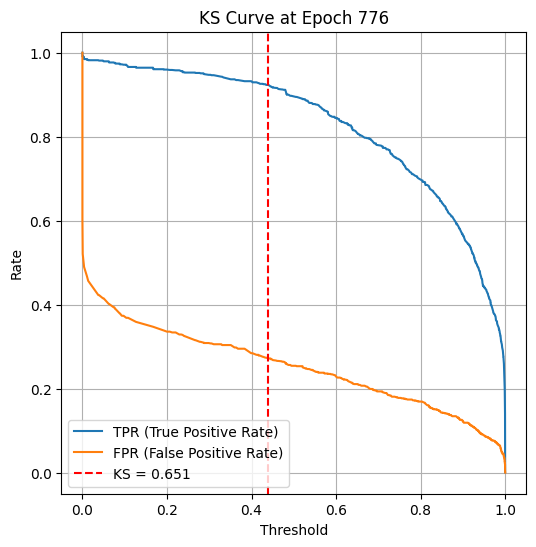

Epoch 780 — Train Loss: 0.2518 | Train Acc: 0.8887 | Val KS: 0.6310 | Val Acc: 0.8101 | Val Prec: 0.7726 | Val Recall: 0.9001 | Val F1: 0.8315
Epoch 790 — Train Loss: 0.2490 | Train Acc: 0.8897 | Val KS: 0.6309 | Val Acc: 0.8083 | Val Prec: 0.7850 | Val Recall: 0.8698 | Val F1: 0.8252


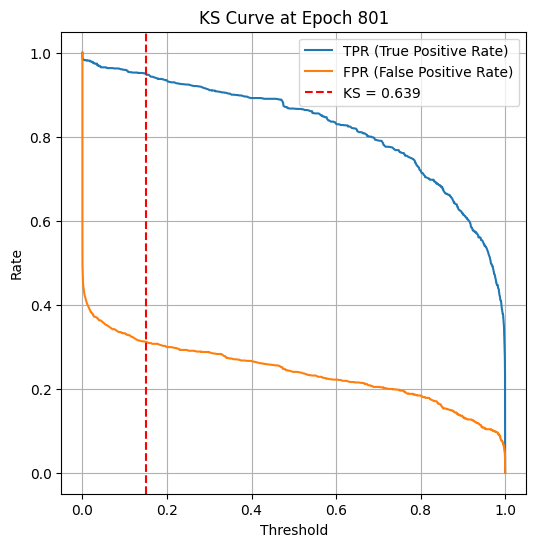

Epoch 800 — Train Loss: 0.2554 | Train Acc: 0.8853 | Val KS: 0.6392 | Val Acc: 0.8152 | Val Prec: 0.7966 | Val Recall: 0.8662 | Val F1: 0.8299
Epoch 810 — Train Loss: 0.2570 | Train Acc: 0.8861 | Val KS: 0.6429 | Val Acc: 0.8245 | Val Prec: 0.7817 | Val Recall: 0.9197 | Val F1: 0.8451
Epoch 820 — Train Loss: 0.2595 | Train Acc: 0.8884 | Val KS: 0.6415 | Val Acc: 0.8227 | Val Prec: 0.7823 | Val Recall: 0.9135 | Val F1: 0.8428


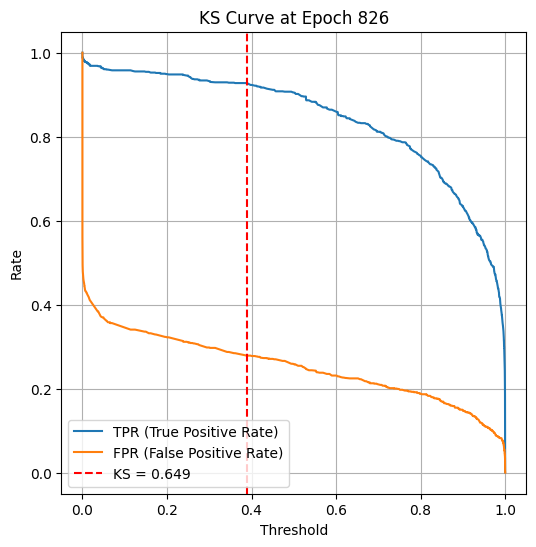

Epoch 830 — Train Loss: 0.2539 | Train Acc: 0.8907 | Val KS: 0.6283 | Val Acc: 0.8059 | Val Prec: 0.7787 | Val Recall: 0.8760 | Val F1: 0.8245
Epoch 840 — Train Loss: 0.2538 | Train Acc: 0.8900 | Val KS: 0.6209 | Val Acc: 0.8073 | Val Prec: 0.7736 | Val Recall: 0.8903 | Val F1: 0.8279


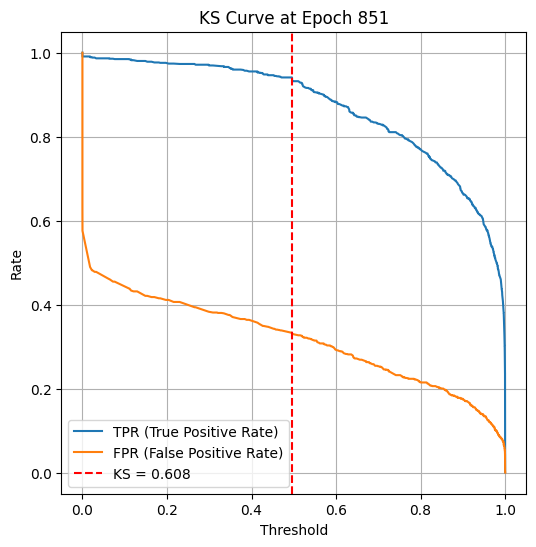

Epoch 850 — Train Loss: 0.2436 | Train Acc: 0.8894 | Val KS: 0.6082 | Val Acc: 0.8069 | Val Prec: 0.7545 | Val Recall: 0.9322 | Val F1: 0.8340
Epoch 860 — Train Loss: 0.2510 | Train Acc: 0.8869 | Val KS: 0.6429 | Val Acc: 0.8115 | Val Prec: 0.7947 | Val Recall: 0.8599 | Val F1: 0.8260
Epoch 870 — Train Loss: 0.2469 | Train Acc: 0.8867 | Val KS: 0.6409 | Val Acc: 0.8162 | Val Prec: 0.8018 | Val Recall: 0.8591 | Val F1: 0.8295


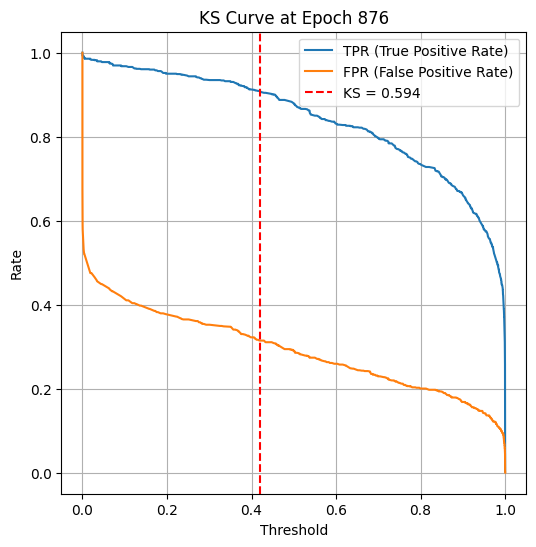

Epoch 880 — Train Loss: 0.2479 | Train Acc: 0.8889 | Val KS: 0.6259 | Val Acc: 0.8087 | Val Prec: 0.7894 | Val Recall: 0.8626 | Val F1: 0.8244
Epoch 890 — Train Loss: 0.2480 | Train Acc: 0.8906 | Val KS: 0.6329 | Val Acc: 0.8189 | Val Prec: 0.7801 | Val Recall: 0.9081 | Val F1: 0.8392


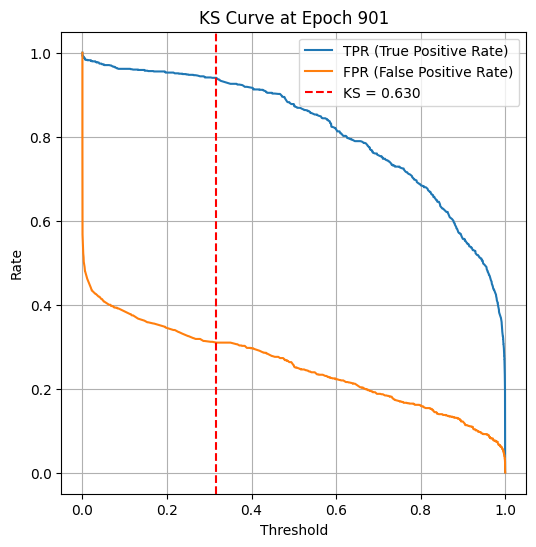

Epoch 900 — Train Loss: 0.2489 | Train Acc: 0.8907 | Val KS: 0.6305 | Val Acc: 0.8129 | Val Prec: 0.7881 | Val Recall: 0.8760 | Val F1: 0.8297
Epoch 910 — Train Loss: 0.2466 | Train Acc: 0.8904 | Val KS: 0.6401 | Val Acc: 0.8199 | Val Prec: 0.7843 | Val Recall: 0.9019 | Val F1: 0.8390
Epoch 920 — Train Loss: 0.2509 | Train Acc: 0.8909 | Val KS: 0.6403 | Val Acc: 0.8227 | Val Prec: 0.7806 | Val Recall: 0.9170 | Val F1: 0.8433


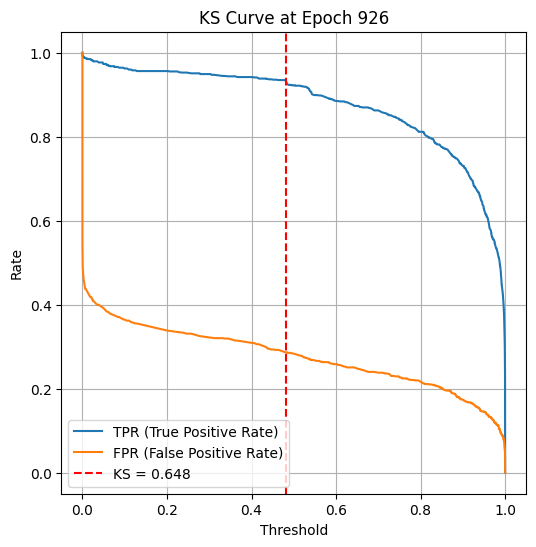

Epoch 930 — Train Loss: 0.2486 | Train Acc: 0.8912 | Val KS: 0.6087 | Val Acc: 0.8027 | Val Prec: 0.7727 | Val Recall: 0.8796 | Val F1: 0.8227
Epoch 940 — Train Loss: 0.2477 | Train Acc: 0.8900 | Val KS: 0.6671 | Val Acc: 0.8329 | Val Prec: 0.7989 | Val Recall: 0.9072 | Val F1: 0.8496


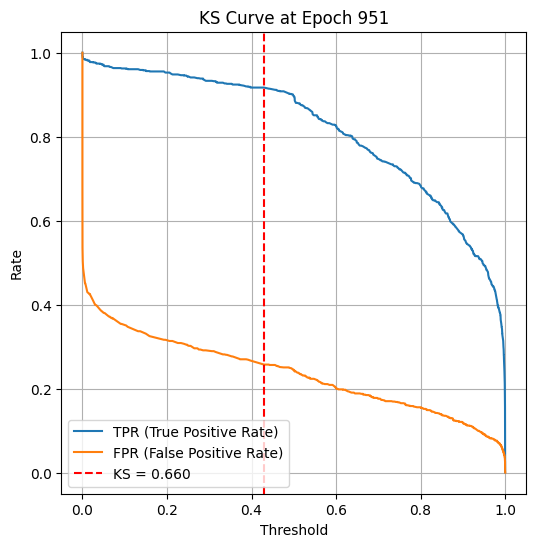

Epoch 950 — Train Loss: 0.2524 | Train Acc: 0.8921 | Val KS: 0.6595 | Val Acc: 0.8292 | Val Prec: 0.7995 | Val Recall: 0.8965 | Val F1: 0.8452
Epoch 960 — Train Loss: 0.2501 | Train Acc: 0.8883 | Val KS: 0.6178 | Val Acc: 0.7981 | Val Prec: 0.7821 | Val Recall: 0.8483 | Val F1: 0.8139
Epoch 970 — Train Loss: 0.2577 | Train Acc: 0.8836 | Val KS: 0.6222 | Val Acc: 0.8087 | Val Prec: 0.7992 | Val Recall: 0.8448 | Val F1: 0.8213


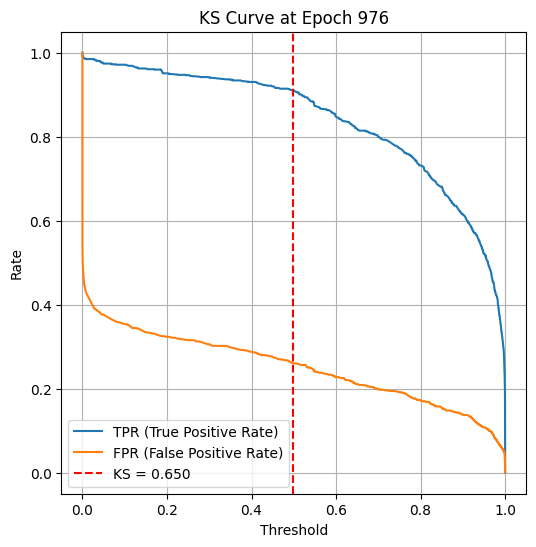

Epoch 980 — Train Loss: 0.2570 | Train Acc: 0.8886 | Val KS: 0.6215 | Val Acc: 0.8134 | Val Prec: 0.7566 | Val Recall: 0.9456 | Val F1: 0.8406
Epoch 990 — Train Loss: 0.2571 | Train Acc: 0.8833 | Val KS: 0.6388 | Val Acc: 0.8208 | Val Prec: 0.7838 | Val Recall: 0.9054 | Val F1: 0.8402


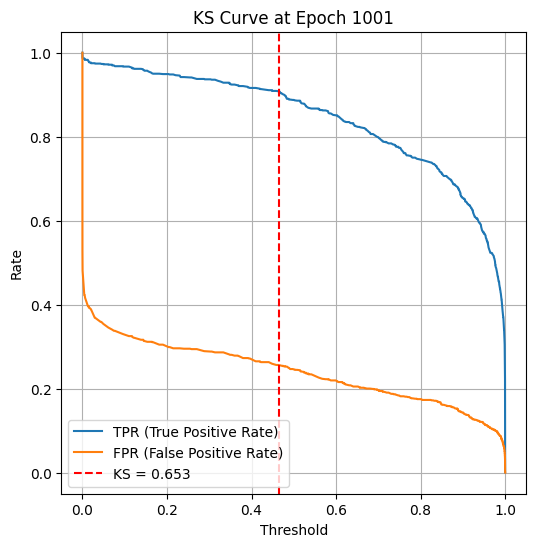

Epoch 1000 — Train Loss: 0.2420 | Train Acc: 0.8912 | Val KS: 0.6526 | Val Acc: 0.8236 | Val Prec: 0.7966 | Val Recall: 0.8876 | Val F1: 0.8397
Epoch 1010 — Train Loss: 0.2497 | Train Acc: 0.8892 | Val KS: 0.6145 | Val Acc: 0.8055 | Val Prec: 0.7655 | Val Recall: 0.9028 | Val F1: 0.8285
Epoch 1020 — Train Loss: 0.2446 | Train Acc: 0.8904 | Val KS: 0.6395 | Val Acc: 0.8101 | Val Prec: 0.7932 | Val Recall: 0.8591 | Val F1: 0.8248


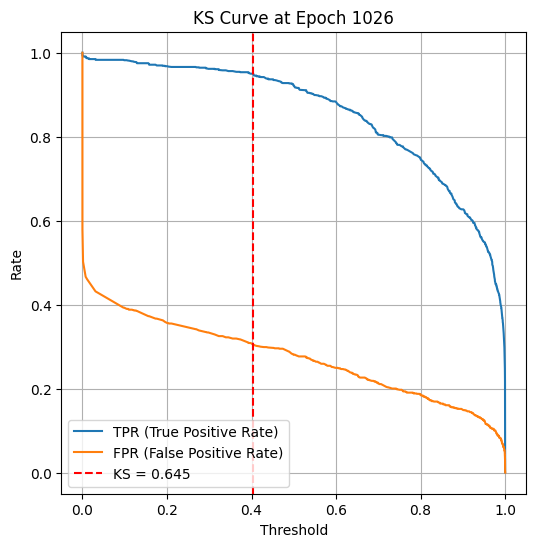

Epoch 1030 — Train Loss: 0.2520 | Train Acc: 0.8921 | Val KS: 0.6394 | Val Acc: 0.8222 | Val Prec: 0.7865 | Val Recall: 0.9037 | Val F1: 0.8410
Epoch 1040 — Train Loss: 0.2532 | Train Acc: 0.8894 | Val KS: 0.6238 | Val Acc: 0.8124 | Val Prec: 0.7718 | Val Recall: 0.9081 | Val F1: 0.8344


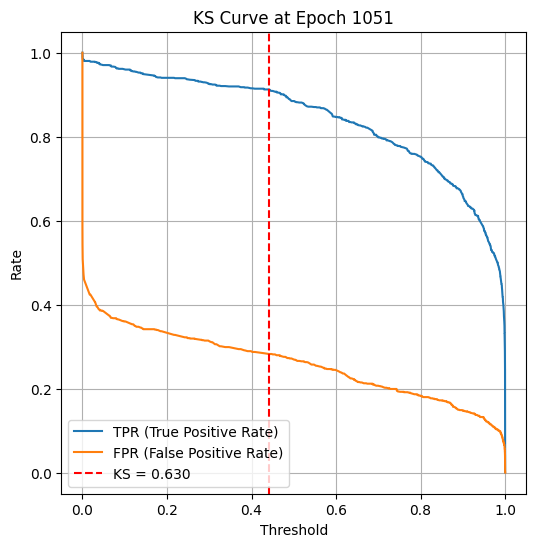

Epoch 1050 — Train Loss: 0.2490 | Train Acc: 0.8924 | Val KS: 0.6299 | Val Acc: 0.8110 | Val Prec: 0.7811 | Val Recall: 0.8849 | Val F1: 0.8298
Epoch 1060 — Train Loss: 0.2351 | Train Acc: 0.8965 | Val KS: 0.6339 | Val Acc: 0.8078 | Val Prec: 0.7858 | Val Recall: 0.8671 | Val F1: 0.8244
Epoch 1070 — Train Loss: 0.2492 | Train Acc: 0.8942 | Val KS: 0.6340 | Val Acc: 0.8138 | Val Prec: 0.7835 | Val Recall: 0.8876 | Val F1: 0.8323


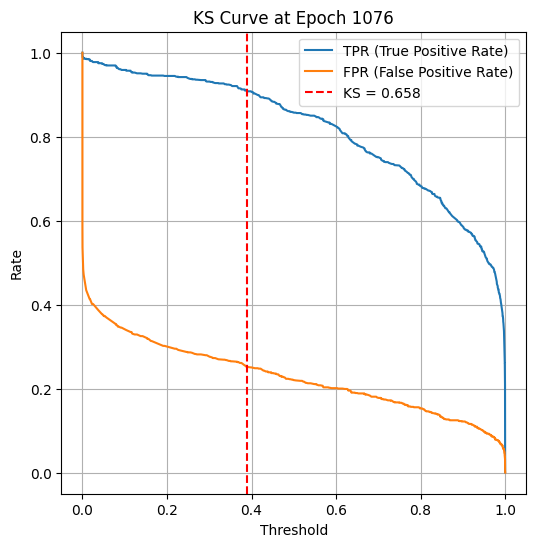

Epoch 1080 — Train Loss: 0.2541 | Train Acc: 0.8901 | Val KS: 0.6407 | Val Acc: 0.8175 | Val Prec: 0.8122 | Val Recall: 0.8448 | Val F1: 0.8282
Epoch 1090 — Train Loss: 0.2473 | Train Acc: 0.8897 | Val KS: 0.6496 | Val Acc: 0.8157 | Val Prec: 0.7938 | Val Recall: 0.8724 | Val F1: 0.8313


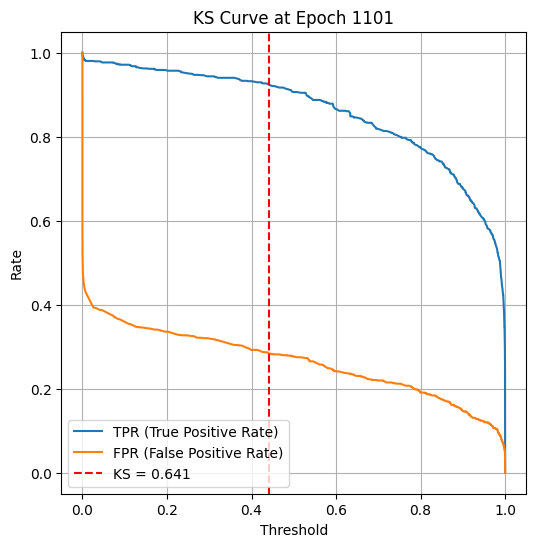

Epoch 1100 — Train Loss: 0.2553 | Train Acc: 0.8861 | Val KS: 0.6414 | Val Acc: 0.8189 | Val Prec: 0.7809 | Val Recall: 0.9063 | Val F1: 0.8390
Epoch 1110 — Train Loss: 0.2494 | Train Acc: 0.8878 | Val KS: 0.6421 | Val Acc: 0.8138 | Val Prec: 0.7990 | Val Recall: 0.8582 | Val F1: 0.8275
Epoch 1120 — Train Loss: 0.2492 | Train Acc: 0.8920 | Val KS: 0.6287 | Val Acc: 0.8115 | Val Prec: 0.7977 | Val Recall: 0.8546 | Val F1: 0.8252


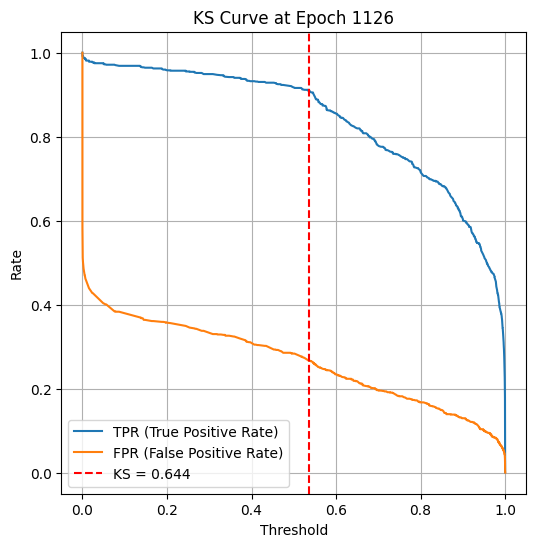

Epoch 1130 — Train Loss: 0.2513 | Train Acc: 0.8856 | Val KS: 0.6537 | Val Acc: 0.8166 | Val Prec: 0.8040 | Val Recall: 0.8564 | Val F1: 0.8294
Epoch 1140 — Train Loss: 0.2464 | Train Acc: 0.8907 | Val KS: 0.6374 | Val Acc: 0.8217 | Val Prec: 0.7756 | Val Recall: 0.9251 | Val F1: 0.8438


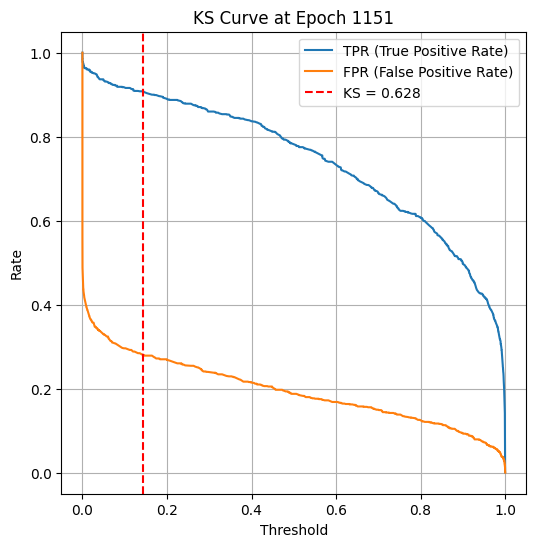

Epoch 1150 — Train Loss: 0.2437 | Train Acc: 0.8948 | Val KS: 0.6284 | Val Acc: 0.7962 | Val Prec: 0.8187 | Val Recall: 0.7814 | Val F1: 0.7996
Epoch 1160 — Train Loss: 0.2500 | Train Acc: 0.8938 | Val KS: 0.6298 | Val Acc: 0.8143 | Val Prec: 0.7784 | Val Recall: 0.8992 | Val F1: 0.8344
Epoch 1170 — Train Loss: 0.2542 | Train Acc: 0.8870 | Val KS: 0.6406 | Val Acc: 0.8092 | Val Prec: 0.7826 | Val Recall: 0.8769 | Val F1: 0.8271


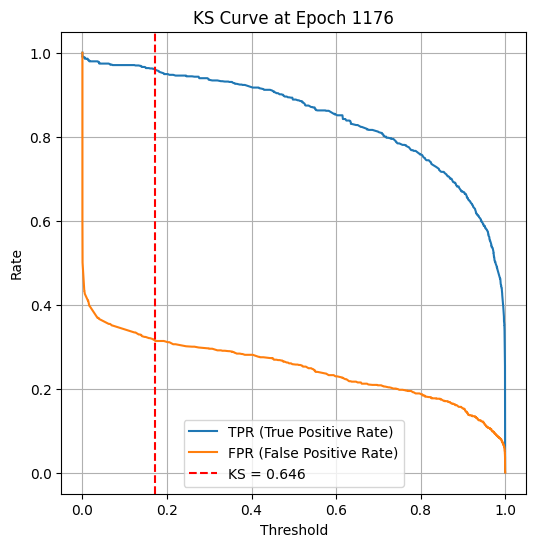

Epoch 1180 — Train Loss: 0.2501 | Train Acc: 0.8900 | Val KS: 0.6260 | Val Acc: 0.8101 | Val Prec: 0.7812 | Val Recall: 0.8822 | Val F1: 0.8287
Epoch 1190 — Train Loss: 0.2430 | Train Acc: 0.8955 | Val KS: 0.6335 | Val Acc: 0.8194 | Val Prec: 0.7691 | Val Recall: 0.9331 | Val F1: 0.8432


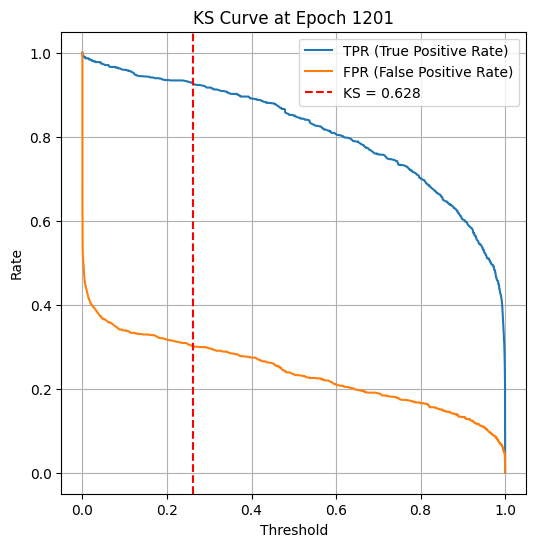

Epoch 1200 — Train Loss: 0.2529 | Train Acc: 0.8855 | Val KS: 0.6276 | Val Acc: 0.8097 | Val Prec: 0.7975 | Val Recall: 0.8501 | Val F1: 0.8230
Epoch 1210 — Train Loss: 0.2510 | Train Acc: 0.8892 | Val KS: 0.6317 | Val Acc: 0.8115 | Val Prec: 0.7817 | Val Recall: 0.8849 | Val F1: 0.8301
Epoch 1220 — Train Loss: 0.2481 | Train Acc: 0.8884 | Val KS: 0.6292 | Val Acc: 0.8101 | Val Prec: 0.7947 | Val Recall: 0.8564 | Val F1: 0.8244


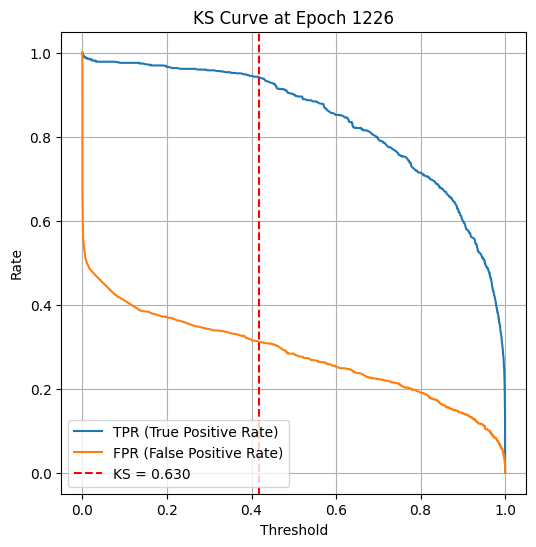

Epoch 1230 — Train Loss: 0.2489 | Train Acc: 0.8926 | Val KS: 0.6549 | Val Acc: 0.8231 | Val Prec: 0.8028 | Val Recall: 0.8751 | Val F1: 0.8374
Epoch 1240 — Train Loss: 0.2426 | Train Acc: 0.8948 | Val KS: 0.6546 | Val Acc: 0.8264 | Val Prec: 0.8059 | Val Recall: 0.8778 | Val F1: 0.8403


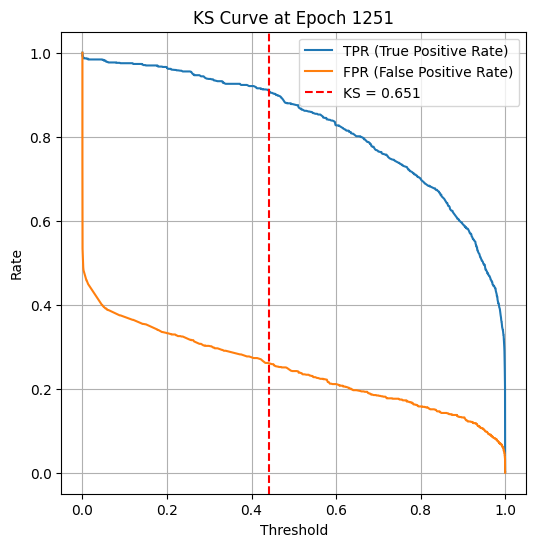

Epoch 1250 — Train Loss: 0.2480 | Train Acc: 0.8887 | Val KS: 0.6513 | Val Acc: 0.8199 | Val Prec: 0.7972 | Val Recall: 0.8769 | Val F1: 0.8352
Epoch 1260 — Train Loss: 0.2421 | Train Acc: 0.8937 | Val KS: 0.6406 | Val Acc: 0.8208 | Val Prec: 0.7942 | Val Recall: 0.8849 | Val F1: 0.8371
Epoch 1270 — Train Loss: 0.2457 | Train Acc: 0.8935 | Val KS: 0.6354 | Val Acc: 0.8027 | Val Prec: 0.7852 | Val Recall: 0.8546 | Val F1: 0.8185


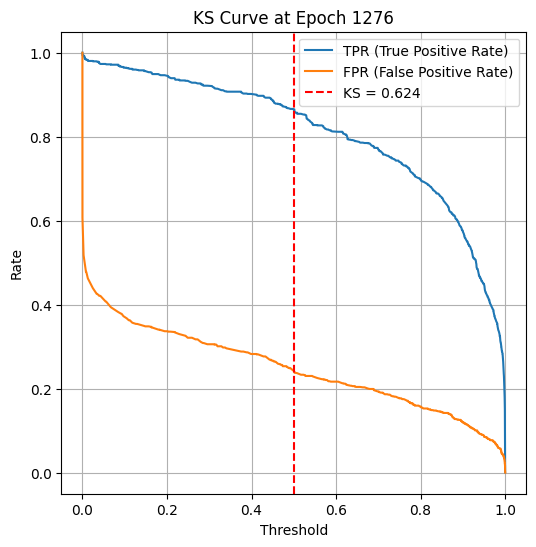

Epoch 1280 — Train Loss: 0.2453 | Train Acc: 0.8942 | Val KS: 0.6389 | Val Acc: 0.8231 | Val Prec: 0.7741 | Val Recall: 0.9322 | Val F1: 0.8458
Epoch 1290 — Train Loss: 0.2510 | Train Acc: 0.8921 | Val KS: 0.6334 | Val Acc: 0.8166 | Val Prec: 0.7872 | Val Recall: 0.8876 | Val F1: 0.8344


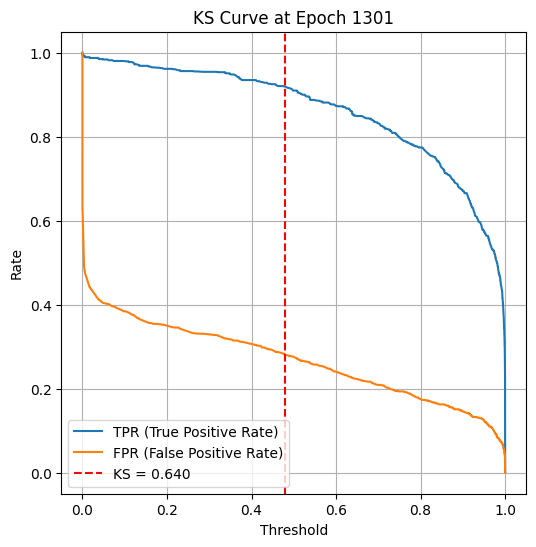

Epoch 1300 — Train Loss: 0.2497 | Train Acc: 0.8917 | Val KS: 0.6399 | Val Acc: 0.8208 | Val Prec: 0.7816 | Val Recall: 0.9099 | Val F1: 0.8409
Epoch 1310 — Train Loss: 0.2459 | Train Acc: 0.8900 | Val KS: 0.6590 | Val Acc: 0.8315 | Val Prec: 0.8003 | Val Recall: 0.9010 | Val F1: 0.8477
Epoch 1320 — Train Loss: 0.2478 | Train Acc: 0.8952 | Val KS: 0.6348 | Val Acc: 0.8194 | Val Prec: 0.7864 | Val Recall: 0.8965 | Val F1: 0.8378


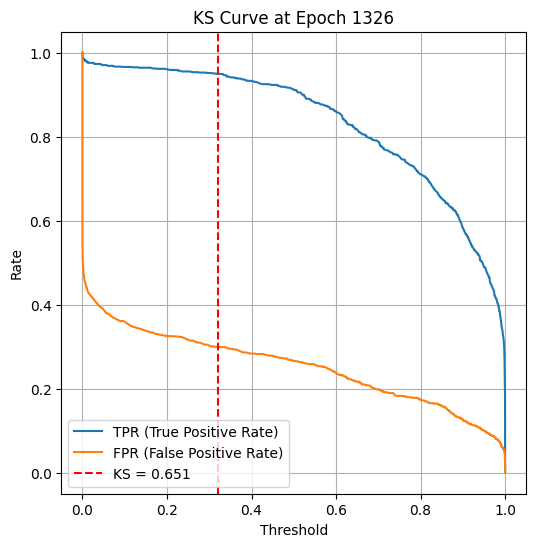

Epoch 1330 — Train Loss: 0.2573 | Train Acc: 0.8870 | Val KS: 0.6356 | Val Acc: 0.8120 | Val Prec: 0.7959 | Val Recall: 0.8591 | Val F1: 0.8263
Epoch 1340 — Train Loss: 0.2513 | Train Acc: 0.8923 | Val KS: 0.6373 | Val Acc: 0.8106 | Val Prec: 0.8055 | Val Recall: 0.8385 | Val F1: 0.8217


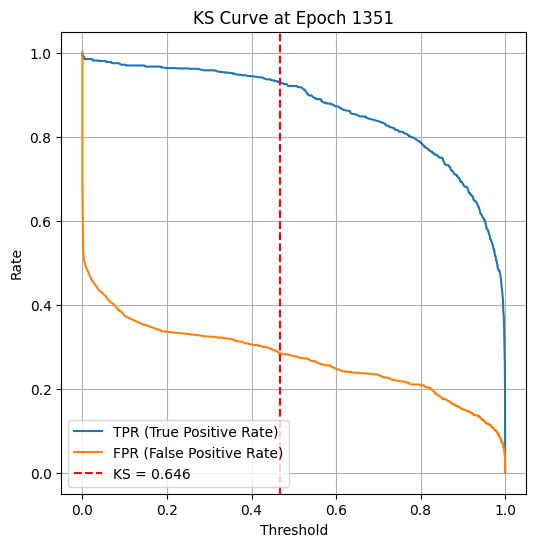

Epoch 1350 — Train Loss: 0.2425 | Train Acc: 0.8942 | Val KS: 0.6459 | Val Acc: 0.8264 | Val Prec: 0.7836 | Val Recall: 0.9206 | Val F1: 0.8466
Epoch 1360 — Train Loss: 0.2468 | Train Acc: 0.8943 | Val KS: 0.6500 | Val Acc: 0.8264 | Val Prec: 0.8089 | Val Recall: 0.8724 | Val F1: 0.8395
Epoch 1370 — Train Loss: 0.2481 | Train Acc: 0.8880 | Val KS: 0.6470 | Val Acc: 0.8259 | Val Prec: 0.7747 | Val Recall: 0.9384 | Val F1: 0.8487


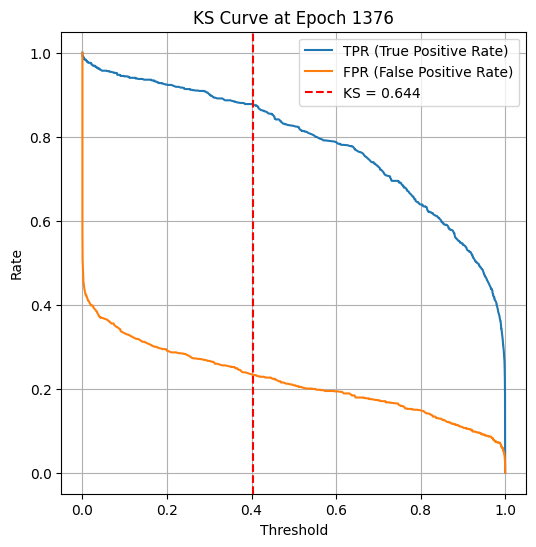

Epoch 1380 — Train Loss: 0.2449 | Train Acc: 0.8904 | Val KS: 0.6389 | Val Acc: 0.8189 | Val Prec: 0.7894 | Val Recall: 0.8894 | Val F1: 0.8364
Epoch 1390 — Train Loss: 0.2539 | Train Acc: 0.8852 | Val KS: 0.6442 | Val Acc: 0.8069 | Val Prec: 0.7955 | Val Recall: 0.8466 | Val F1: 0.8202


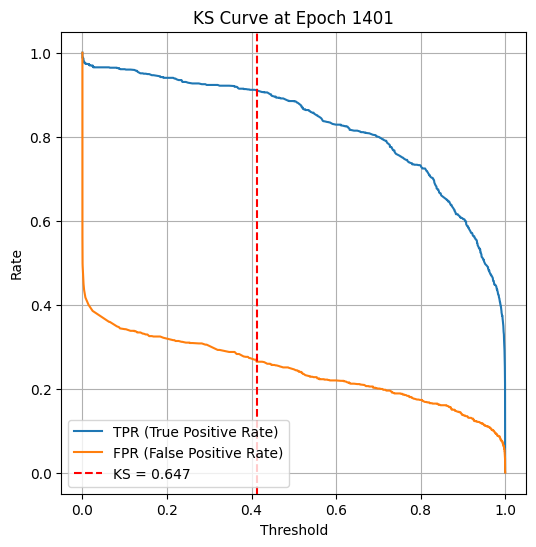

Epoch 1400 — Train Loss: 0.2523 | Train Acc: 0.8895 | Val KS: 0.6465 | Val Acc: 0.8222 | Val Prec: 0.7961 | Val Recall: 0.8849 | Val F1: 0.8382
Epoch 1410 — Train Loss: 0.2446 | Train Acc: 0.8928 | Val KS: 0.6614 | Val Acc: 0.8268 | Val Prec: 0.7908 | Val Recall: 0.9072 | Val F1: 0.8450
Epoch 1420 — Train Loss: 0.2487 | Train Acc: 0.8909 | Val KS: 0.6609 | Val Acc: 0.8268 | Val Prec: 0.8016 | Val Recall: 0.8867 | Val F1: 0.8420


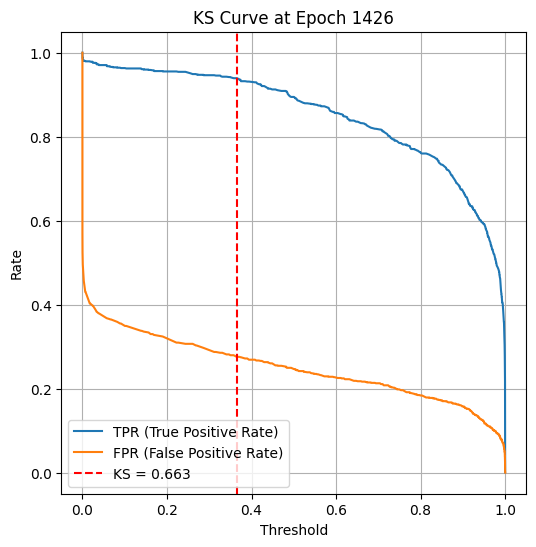

Epoch 1430 — Train Loss: 0.2525 | Train Acc: 0.8897 | Val KS: 0.6551 | Val Acc: 0.8180 | Val Prec: 0.8045 | Val Recall: 0.8591 | Val F1: 0.8309
Epoch 1440 — Train Loss: 0.2434 | Train Acc: 0.8914 | Val KS: 0.6409 | Val Acc: 0.8185 | Val Prec: 0.7987 | Val Recall: 0.8707 | Val F1: 0.8331


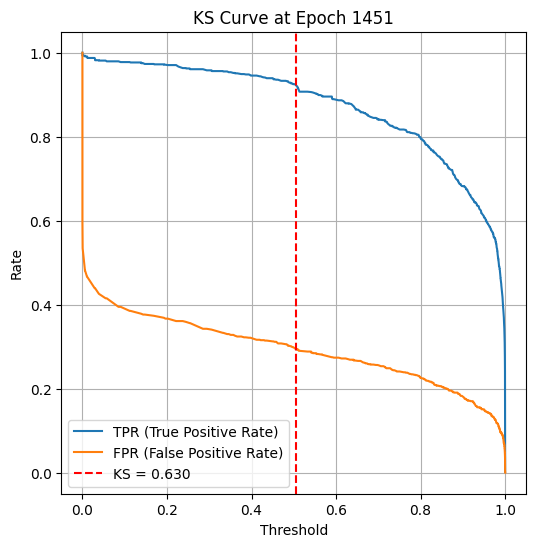

Epoch 1450 — Train Loss: 0.2581 | Train Acc: 0.8867 | Val KS: 0.6299 | Val Acc: 0.8185 | Val Prec: 0.7716 | Val Recall: 0.9251 | Val F1: 0.8414
Epoch 1460 — Train Loss: 0.2435 | Train Acc: 0.8954 | Val KS: 0.6524 | Val Acc: 0.8264 | Val Prec: 0.7925 | Val Recall: 0.9028 | Val F1: 0.8440
Epoch 1470 — Train Loss: 0.2513 | Train Acc: 0.8895 | Val KS: 0.6625 | Val Acc: 0.8315 | Val Prec: 0.7961 | Val Recall: 0.9090 | Val F1: 0.8488


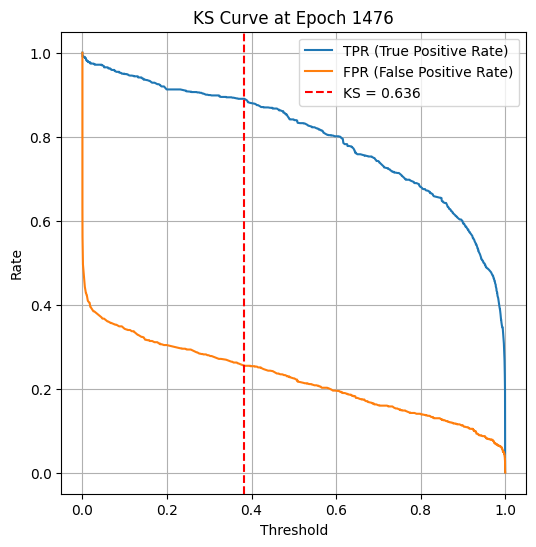

Epoch 1480 — Train Loss: 0.2503 | Train Acc: 0.8895 | Val KS: 0.6260 | Val Acc: 0.8134 | Val Prec: 0.7806 | Val Recall: 0.8921 | Val F1: 0.8326
Epoch 1490 — Train Loss: 0.2475 | Train Acc: 0.8889 | Val KS: 0.6451 | Val Acc: 0.8199 | Val Prec: 0.7992 | Val Recall: 0.8733 | Val F1: 0.8346


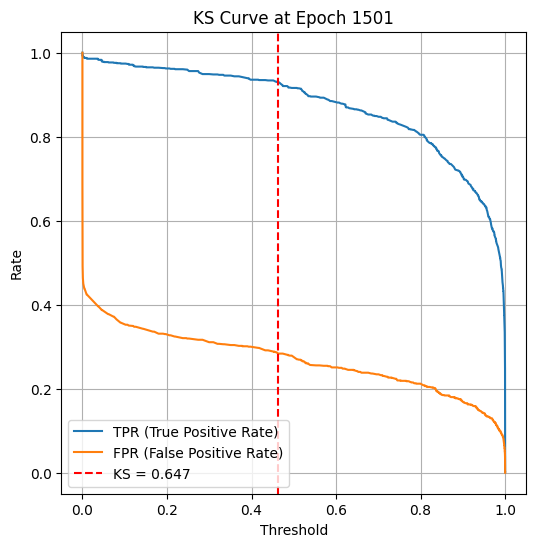

Epoch 1500 — Train Loss: 0.2431 | Train Acc: 0.8895 | Val KS: 0.6468 | Val Acc: 0.8254 | Val Prec: 0.7846 | Val Recall: 0.9161 | Val F1: 0.8453
Epoch 1510 — Train Loss: 0.2432 | Train Acc: 0.8900 | Val KS: 0.6481 | Val Acc: 0.8250 | Val Prec: 0.8054 | Val Recall: 0.8751 | Val F1: 0.8388
Epoch 1520 — Train Loss: 0.2573 | Train Acc: 0.8892 | Val KS: 0.6520 | Val Acc: 0.8231 | Val Prec: 0.8053 | Val Recall: 0.8707 | Val F1: 0.8367


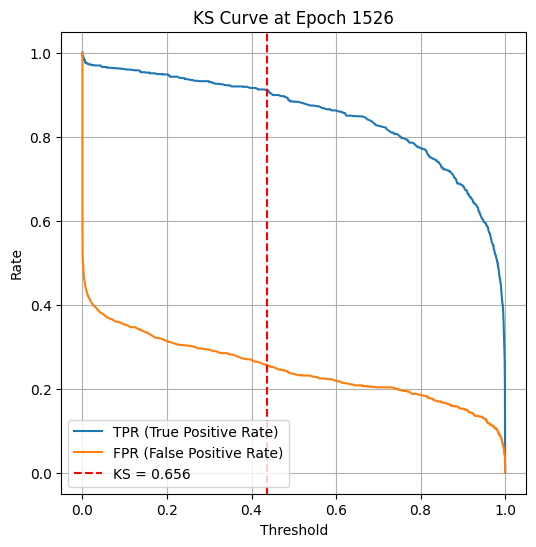

Epoch 1530 — Train Loss: 0.2482 | Train Acc: 0.8909 | Val KS: 0.6498 | Val Acc: 0.8250 | Val Prec: 0.7995 | Val Recall: 0.8858 | Val F1: 0.8405
Epoch 1540 — Train Loss: 0.2581 | Train Acc: 0.8841 | Val KS: 0.6448 | Val Acc: 0.8199 | Val Prec: 0.7884 | Val Recall: 0.8938 | Val F1: 0.8378


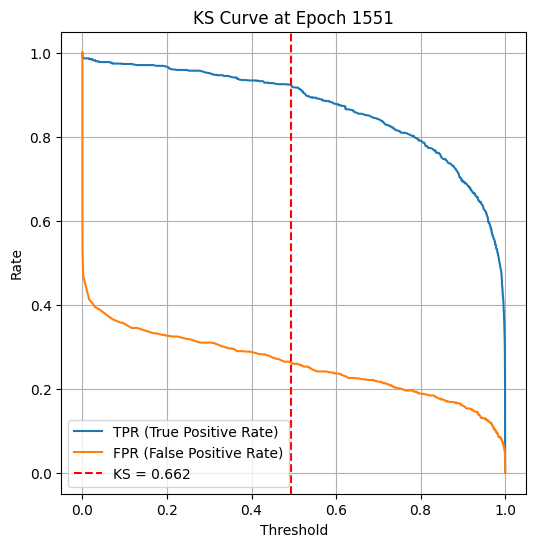

Epoch 1550 — Train Loss: 0.2497 | Train Acc: 0.8918 | Val KS: 0.6619 | Val Acc: 0.8324 | Val Prec: 0.7932 | Val Recall: 0.9170 | Val F1: 0.8506
Epoch 1560 — Train Loss: 0.2452 | Train Acc: 0.8904 | Val KS: 0.6227 | Val Acc: 0.8073 | Val Prec: 0.7536 | Val Recall: 0.9358 | Val F1: 0.8349
Epoch 1570 — Train Loss: 0.2453 | Train Acc: 0.8932 | Val KS: 0.6472 | Val Acc: 0.8152 | Val Prec: 0.7844 | Val Recall: 0.8894 | Val F1: 0.8336


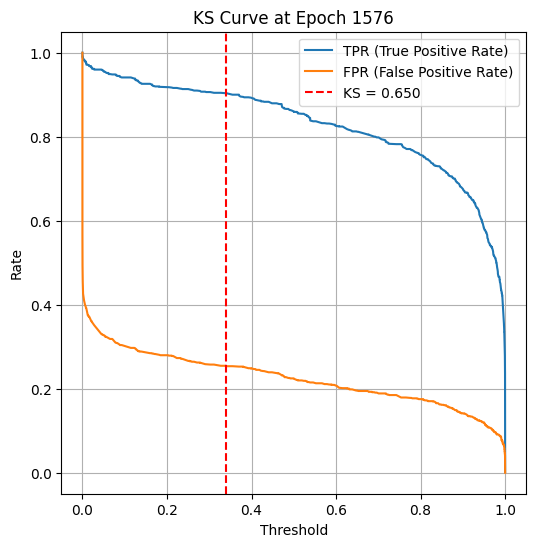

Epoch 1580 — Train Loss: 0.2431 | Train Acc: 0.8948 | Val KS: 0.6400 | Val Acc: 0.8175 | Val Prec: 0.7770 | Val Recall: 0.9108 | Val F1: 0.8386
Epoch 1590 — Train Loss: 0.2447 | Train Acc: 0.8932 | Val KS: 0.6589 | Val Acc: 0.8282 | Val Prec: 0.7891 | Val Recall: 0.9144 | Val F1: 0.8471


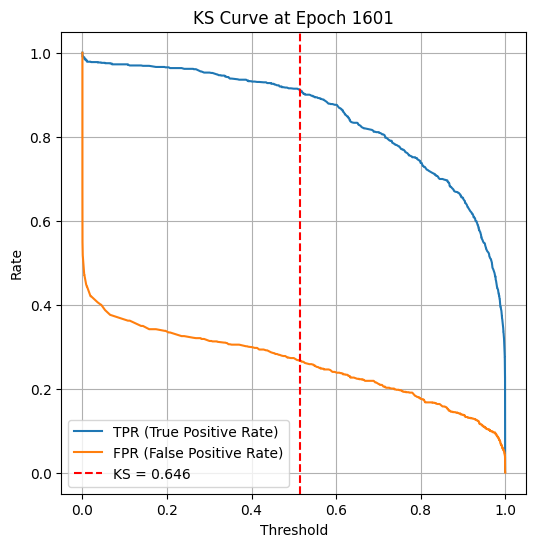

Epoch 1600 — Train Loss: 0.2479 | Train Acc: 0.8911 | Val KS: 0.6464 | Val Acc: 0.8245 | Val Prec: 0.7842 | Val Recall: 0.9144 | Val F1: 0.8443
Epoch 1610 — Train Loss: 0.2478 | Train Acc: 0.8920 | Val KS: 0.6402 | Val Acc: 0.8171 | Val Prec: 0.7842 | Val Recall: 0.8947 | Val F1: 0.8358
Epoch 1620 — Train Loss: 0.2584 | Train Acc: 0.8866 | Val KS: 0.6391 | Val Acc: 0.8171 | Val Prec: 0.7878 | Val Recall: 0.8876 | Val F1: 0.8347


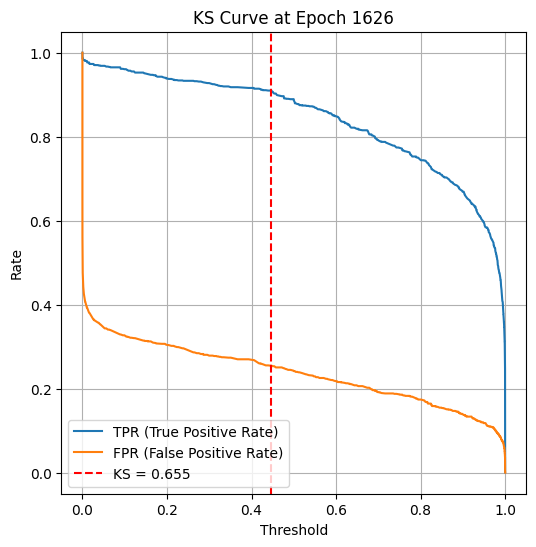

Epoch 1630 — Train Loss: 0.2567 | Train Acc: 0.8892 | Val KS: 0.6468 | Val Acc: 0.8175 | Val Prec: 0.7959 | Val Recall: 0.8733 | Val F1: 0.8328
Epoch 1640 — Train Loss: 0.2436 | Train Acc: 0.8923 | Val KS: 0.6497 | Val Acc: 0.8282 | Val Prec: 0.7813 | Val Recall: 0.9304 | Val F1: 0.8493


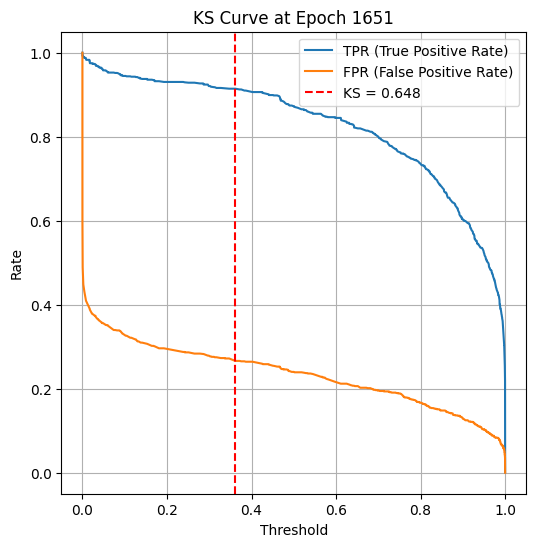

Epoch 1650 — Train Loss: 0.2576 | Train Acc: 0.8864 | Val KS: 0.6481 | Val Acc: 0.8185 | Val Prec: 0.7977 | Val Recall: 0.8724 | Val F1: 0.8334
Epoch 1660 — Train Loss: 0.2410 | Train Acc: 0.8923 | Val KS: 0.6378 | Val Acc: 0.8227 | Val Prec: 0.7814 | Val Recall: 0.9153 | Val F1: 0.8431
Epoch 1670 — Train Loss: 0.2612 | Train Acc: 0.8901 | Val KS: 0.6281 | Val Acc: 0.8175 | Val Prec: 0.7733 | Val Recall: 0.9188 | Val F1: 0.8398


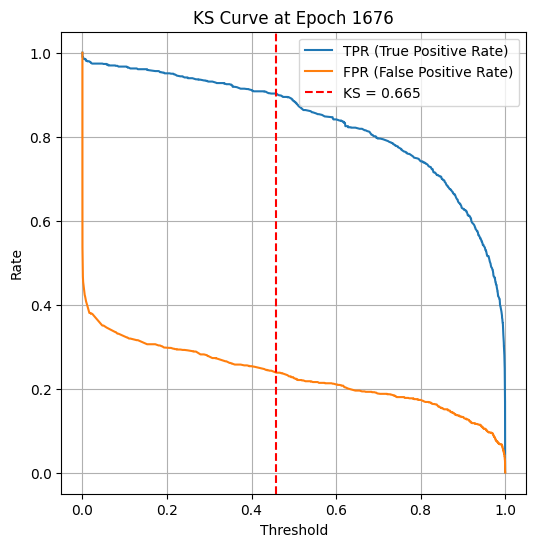

Epoch 1680 — Train Loss: 0.2514 | Train Acc: 0.8886 | Val KS: 0.6523 | Val Acc: 0.8189 | Val Prec: 0.8074 | Val Recall: 0.8564 | Val F1: 0.8312
Epoch 1690 — Train Loss: 0.2492 | Train Acc: 0.8906 | Val KS: 0.6545 | Val Acc: 0.8208 | Val Prec: 0.8050 | Val Recall: 0.8653 | Val F1: 0.8340


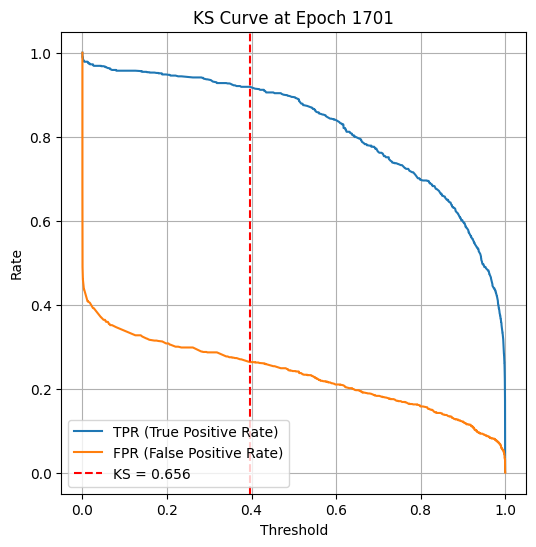

Epoch 1700 — Train Loss: 0.2491 | Train Acc: 0.8900 | Val KS: 0.6555 | Val Acc: 0.8287 | Val Prec: 0.8003 | Val Recall: 0.8938 | Val F1: 0.8445
Epoch 1710 — Train Loss: 0.2493 | Train Acc: 0.8901 | Val KS: 0.6224 | Val Acc: 0.8059 | Val Prec: 0.7903 | Val Recall: 0.8537 | Val F1: 0.8208
Epoch 1720 — Train Loss: 0.2466 | Train Acc: 0.8912 | Val KS: 0.6495 | Val Acc: 0.8254 | Val Prec: 0.7837 | Val Recall: 0.9179 | Val F1: 0.8455


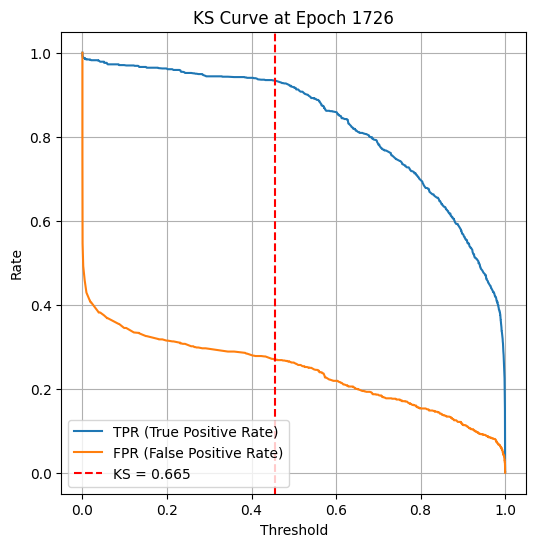

Epoch 1730 — Train Loss: 0.2539 | Train Acc: 0.8881 | Val KS: 0.6450 | Val Acc: 0.8208 | Val Prec: 0.7957 | Val Recall: 0.8822 | Val F1: 0.8367
Epoch 1740 — Train Loss: 0.2484 | Train Acc: 0.8948 | Val KS: 0.6516 | Val Acc: 0.8292 | Val Prec: 0.7935 | Val Recall: 0.9081 | Val F1: 0.8469


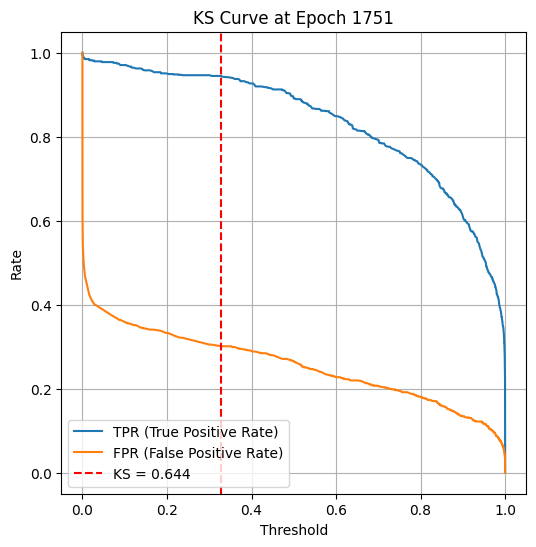

Epoch 1750 — Train Loss: 0.2518 | Train Acc: 0.8875 | Val KS: 0.6436 | Val Acc: 0.8166 | Val Prec: 0.7854 | Val Recall: 0.8912 | Val F1: 0.8349
Epoch 1760 — Train Loss: 0.2553 | Train Acc: 0.8877 | Val KS: 0.6345 | Val Acc: 0.8162 | Val Prec: 0.7808 | Val Recall: 0.8992 | Val F1: 0.8358
Epoch 1770 — Train Loss: 0.2574 | Train Acc: 0.8892 | Val KS: 0.6653 | Val Acc: 0.8343 | Val Prec: 0.7961 | Val Recall: 0.9161 | Val F1: 0.8519


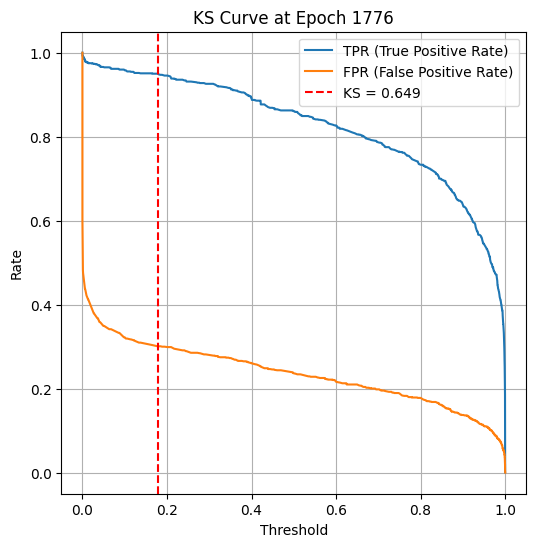

Epoch 1780 — Train Loss: 0.2462 | Train Acc: 0.8943 | Val KS: 0.6360 | Val Acc: 0.8213 | Val Prec: 0.7822 | Val Recall: 0.9099 | Val F1: 0.8412
Epoch 1790 — Train Loss: 0.2457 | Train Acc: 0.8924 | Val KS: 0.6397 | Val Acc: 0.8203 | Val Prec: 0.7806 | Val Recall: 0.9108 | Val F1: 0.8407


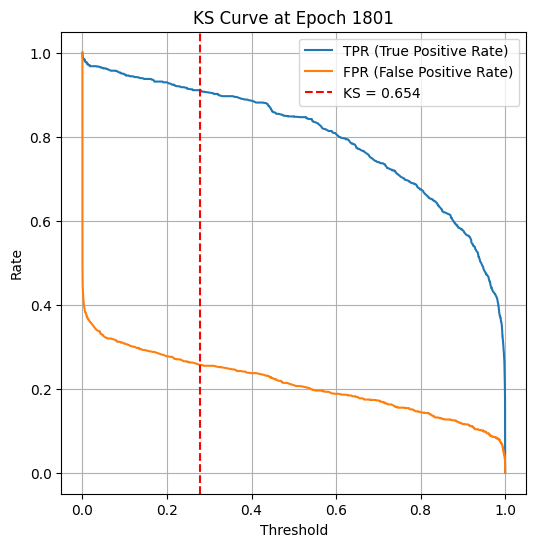

Epoch 1800 — Train Loss: 0.2435 | Train Acc: 0.8963 | Val KS: 0.6543 | Val Acc: 0.8213 | Val Prec: 0.8156 | Val Recall: 0.8483 | Val F1: 0.8317
Epoch 1810 — Train Loss: 0.2477 | Train Acc: 0.8906 | Val KS: 0.6471 | Val Acc: 0.8254 | Val Prec: 0.7894 | Val Recall: 0.9063 | Val F1: 0.8439
Epoch 1820 — Train Loss: 0.2572 | Train Acc: 0.8928 | Val KS: 0.6351 | Val Acc: 0.8157 | Val Prec: 0.7755 | Val Recall: 0.9090 | Val F1: 0.8370


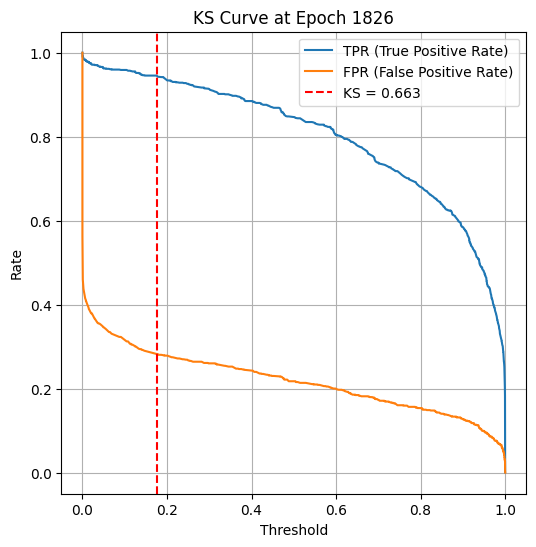

Epoch 1830 — Train Loss: 0.2567 | Train Acc: 0.8900 | Val KS: 0.6575 | Val Acc: 0.8273 | Val Prec: 0.7998 | Val Recall: 0.8912 | Val F1: 0.8430
Epoch 1840 — Train Loss: 0.2447 | Train Acc: 0.8929 | Val KS: 0.6374 | Val Acc: 0.8171 | Val Prec: 0.7910 | Val Recall: 0.8814 | Val F1: 0.8338


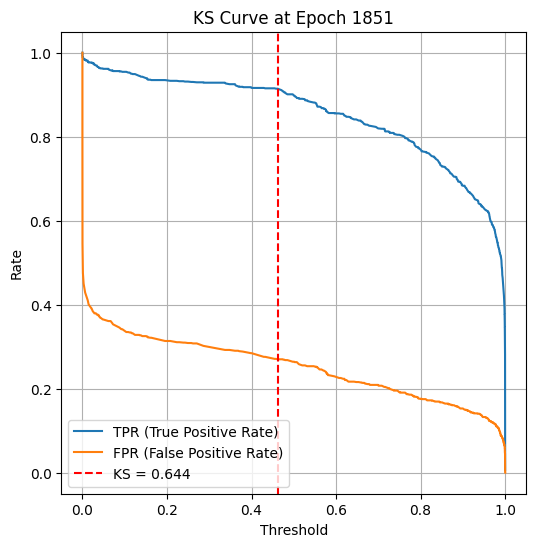

Epoch 1850 — Train Loss: 0.2518 | Train Acc: 0.8892 | Val KS: 0.6443 | Val Acc: 0.8208 | Val Prec: 0.7869 | Val Recall: 0.8992 | Val F1: 0.8393
Epoch 1860 — Train Loss: 0.2507 | Train Acc: 0.8890 | Val KS: 0.6355 | Val Acc: 0.8148 | Val Prec: 0.7883 | Val Recall: 0.8805 | Val F1: 0.8319
Epoch 1870 — Train Loss: 0.2561 | Train Acc: 0.8903 | Val KS: 0.6463 | Val Acc: 0.8208 | Val Prec: 0.7933 | Val Recall: 0.8867 | Val F1: 0.8374


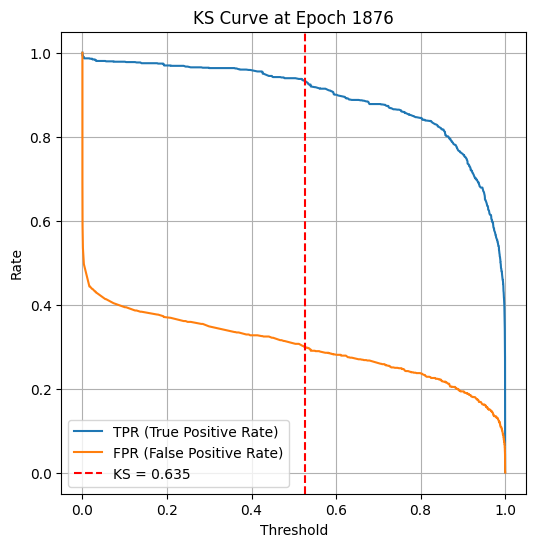

Epoch 1880 — Train Loss: 0.2433 | Train Acc: 0.8935 | Val KS: 0.6788 | Val Acc: 0.8361 | Val Prec: 0.8163 | Val Recall: 0.8840 | Val F1: 0.8488
Epoch 1890 — Train Loss: 0.2469 | Train Acc: 0.8934 | Val KS: 0.6361 | Val Acc: 0.8222 | Val Prec: 0.7737 | Val Recall: 0.9304 | Val F1: 0.8449


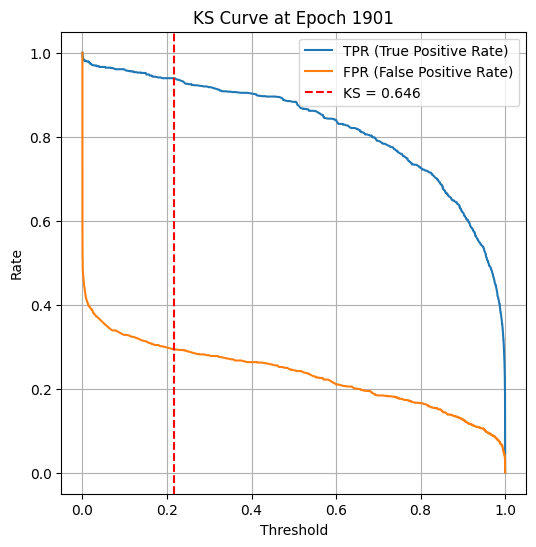

Epoch 1900 — Train Loss: 0.2542 | Train Acc: 0.8880 | Val KS: 0.6460 | Val Acc: 0.8222 | Val Prec: 0.7971 | Val Recall: 0.8831 | Val F1: 0.8379
Epoch 1910 — Train Loss: 0.2538 | Train Acc: 0.8872 | Val KS: 0.6534 | Val Acc: 0.8115 | Val Prec: 0.8178 | Val Recall: 0.8207 | Val F1: 0.8192
Epoch 1920 — Train Loss: 0.2508 | Train Acc: 0.8877 | Val KS: 0.6594 | Val Acc: 0.8236 | Val Prec: 0.7947 | Val Recall: 0.8912 | Val F1: 0.8402


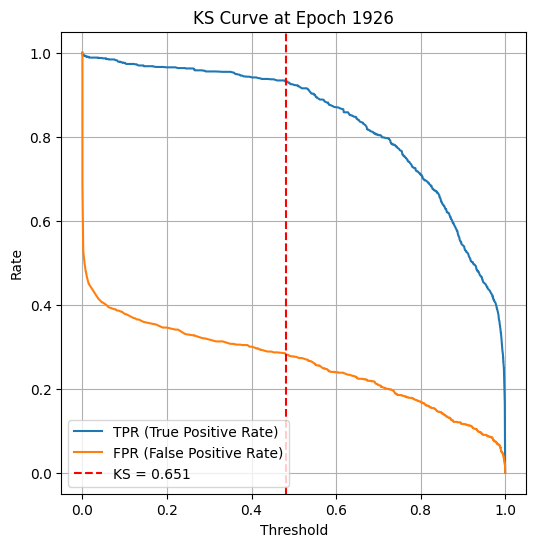

Epoch 1930 — Train Loss: 0.2557 | Train Acc: 0.8858 | Val KS: 0.6566 | Val Acc: 0.8310 | Val Prec: 0.7909 | Val Recall: 0.9179 | Val F1: 0.8497
Epoch 1940 — Train Loss: 0.2519 | Train Acc: 0.8912 | Val KS: 0.6528 | Val Acc: 0.8143 | Val Prec: 0.7962 | Val Recall: 0.8644 | Val F1: 0.8289


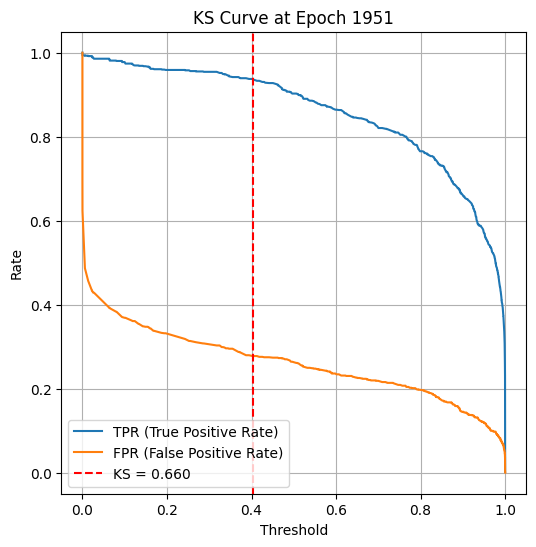

Epoch 1950 — Train Loss: 0.2471 | Train Acc: 0.8918 | Val KS: 0.6597 | Val Acc: 0.8231 | Val Prec: 0.7882 | Val Recall: 0.9028 | Val F1: 0.8416
Epoch 1960 — Train Loss: 0.2610 | Train Acc: 0.8867 | Val KS: 0.6413 | Val Acc: 0.8227 | Val Prec: 0.7831 | Val Recall: 0.9117 | Val F1: 0.8425
Epoch 1970 — Train Loss: 0.2486 | Train Acc: 0.8870 | Val KS: 0.6787 | Val Acc: 0.8426 | Val Prec: 0.7998 | Val Recall: 0.9304 | Val F1: 0.8602


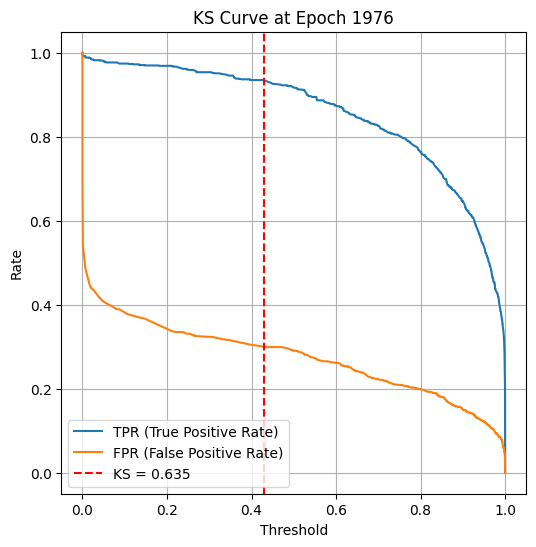

Epoch 1980 — Train Loss: 0.2476 | Train Acc: 0.8976 | Val KS: 0.6301 | Val Acc: 0.8087 | Val Prec: 0.7981 | Val Recall: 0.8466 | Val F1: 0.8216
Epoch 1990 — Train Loss: 0.2481 | Train Acc: 0.8911 | Val KS: 0.6533 | Val Acc: 0.8152 | Val Prec: 0.8108 | Val Recall: 0.8412 | Val F1: 0.8257
Epoch 1999 — Train Loss: 0.2480 | Train Acc: 0.8895 | Val KS: 0.6404 | Val Acc: 0.8245 | Val Prec: 0.7734 | Val Recall: 0.9376 | Val F1: 0.8476


In [ ]:

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = STABTransformer(input_dim=X_train_tensor.shape[1], n_heads=32, n_layers=1, dropout=0.3).to(device)
optimizer = torch.optim.RMSprop(model.parameters(), lr=1e-3)
loss_fn = nn.BCELoss()


epochs=2000
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    all_preds = []
    all_targets = []

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        preds_np = (pred > 0.5).detach().cpu().numpy()
        targets_np = yb.detach().cpu().numpy()

        all_preds.extend(preds_np)
        all_targets.extend(targets_np)

    # Training metrics
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    # Validation metrics
    ks_val, acc_val, prec_val, rec_val, f1_val = evaluate_validation(model, val_loader, device, epoch)

    if epoch % 10 == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch:03d} — Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Train Acc: {acc:.4f} | Val KS: {ks_val:.4f} | Val Acc: {acc_val:.4f} | "
              f"Val Prec: {prec_val:.4f} | Val Recall: {rec_val:.4f} | Val F1: {f1_val:.4f}")


✅ Accuracy: 0.8059
✅ Precision: 0.7553
✅ Recall: 0.9277
✅ F1 Score: 0.8327


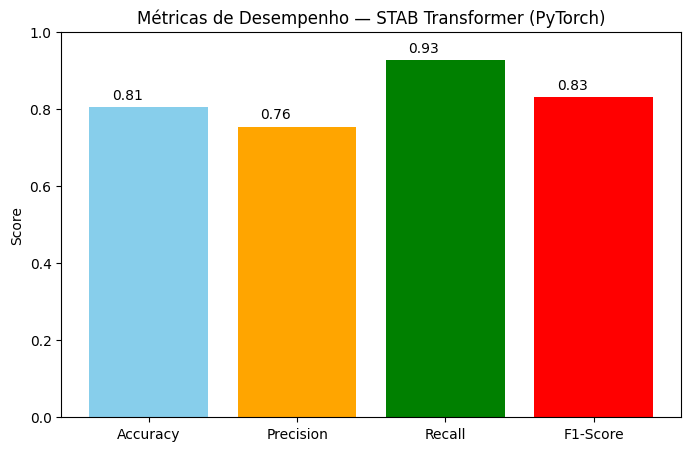

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)

acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



In [ ]:

torch.save(model.state_dict(), 'stab_transformer_16head_1layer_0.1droput_1000epochs.pt')
files.download('stab_transformer_16head_1layer_0.1droput_1000epochs.pt')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!pip install torch

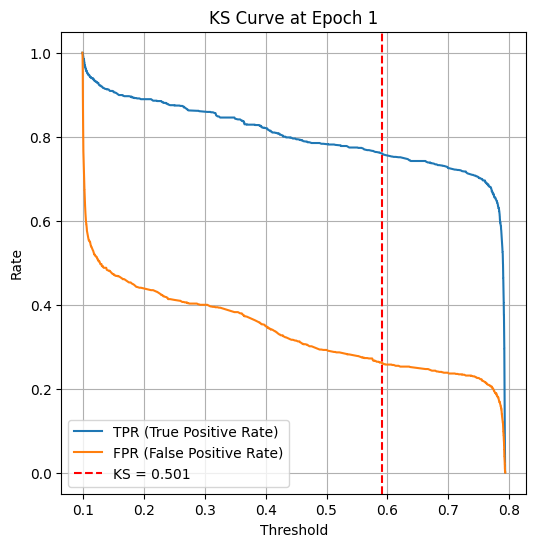

Epoch 000 — Train Loss: 0.5652 | Train Acc: 0.7447 | Val KS: 0.5006 | Val Acc: 0.7470 | Val Prec: 0.7445 | Val Recall: 0.7823 | Val F1: 0.7629
Epoch 010 — Train Loss: 0.4958 | Train Acc: 0.7635 | Val KS: 0.5200 | Val Acc: 0.7349 | Val Prec: 0.7919 | Val Recall: 0.6655 | Val F1: 0.7232
Epoch 020 — Train Loss: 0.4974 | Train Acc: 0.7604 | Val KS: 0.5000 | Val Acc: 0.7122 | Val Prec: 0.8081 | Val Recall: 0.5861 | Val F1: 0.6794


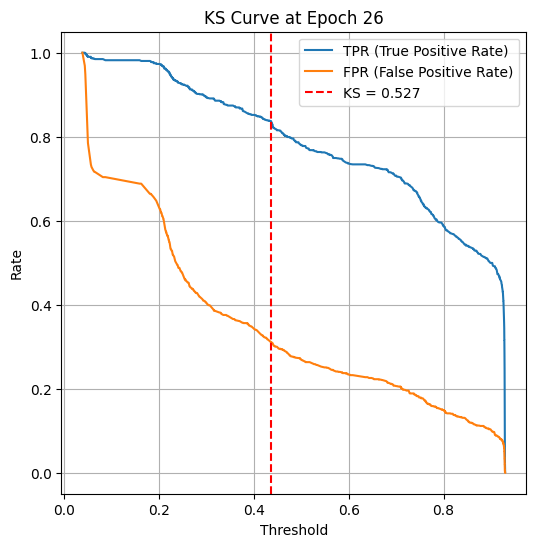

Epoch 030 — Train Loss: 0.4917 | Train Acc: 0.7612 | Val KS: 0.5055 | Val Acc: 0.7512 | Val Prec: 0.7633 | Val Recall: 0.7565 | Val F1: 0.7599
Epoch 040 — Train Loss: 0.4868 | Train Acc: 0.7656 | Val KS: 0.5135 | Val Acc: 0.7512 | Val Prec: 0.7064 | Val Recall: 0.8930 | Val F1: 0.7888


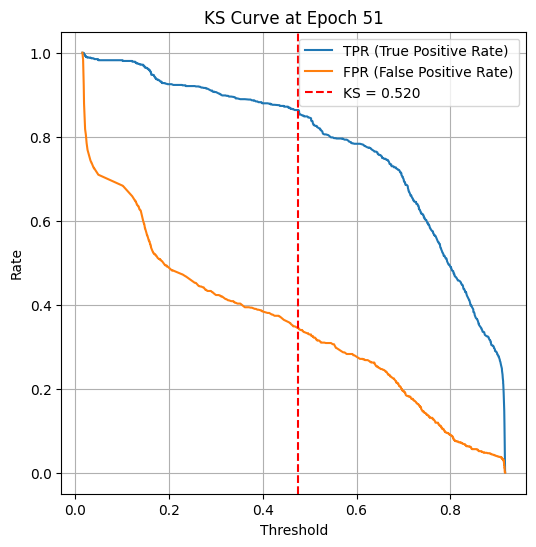

Epoch 050 — Train Loss: 0.4826 | Train Acc: 0.7738 | Val KS: 0.5199 | Val Acc: 0.7609 | Val Prec: 0.7356 | Val Recall: 0.8439 | Val F1: 0.7860
Epoch 060 — Train Loss: 0.4802 | Train Acc: 0.7748 | Val KS: 0.5275 | Val Acc: 0.7600 | Val Prec: 0.7401 | Val Recall: 0.8305 | Val F1: 0.7827
Epoch 070 — Train Loss: 0.4777 | Train Acc: 0.7753 | Val KS: 0.5301 | Val Acc: 0.7642 | Val Prec: 0.7427 | Val Recall: 0.8368 | Val F1: 0.7869


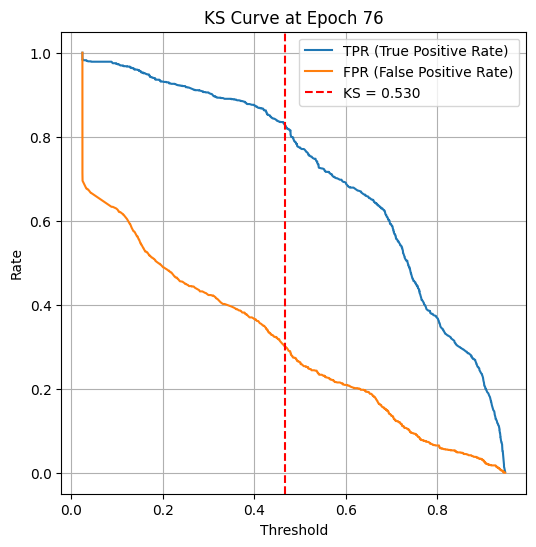

Epoch 080 — Train Loss: 0.4735 | Train Acc: 0.7776 | Val KS: 0.5371 | Val Acc: 0.7549 | Val Prec: 0.7723 | Val Recall: 0.7502 | Val F1: 0.7611
Epoch 090 — Train Loss: 0.4728 | Train Acc: 0.7798 | Val KS: 0.5155 | Val Acc: 0.7558 | Val Prec: 0.7473 | Val Recall: 0.8020 | Val F1: 0.7737


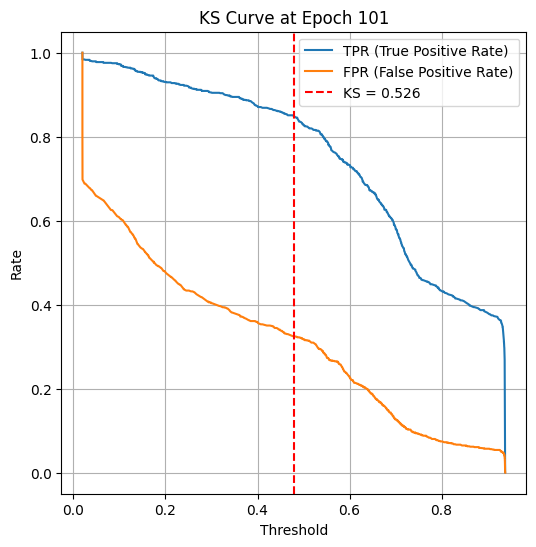

Epoch 100 — Train Loss: 0.4734 | Train Acc: 0.7778 | Val KS: 0.5258 | Val Acc: 0.7581 | Val Prec: 0.7389 | Val Recall: 0.8278 | Val F1: 0.7808
Epoch 110 — Train Loss: 0.4715 | Train Acc: 0.7809 | Val KS: 0.5186 | Val Acc: 0.7609 | Val Prec: 0.7254 | Val Recall: 0.8698 | Val F1: 0.7911
Epoch 120 — Train Loss: 0.4667 | Train Acc: 0.7863 | Val KS: 0.5126 | Val Acc: 0.7530 | Val Prec: 0.7350 | Val Recall: 0.8216 | Val F1: 0.7759


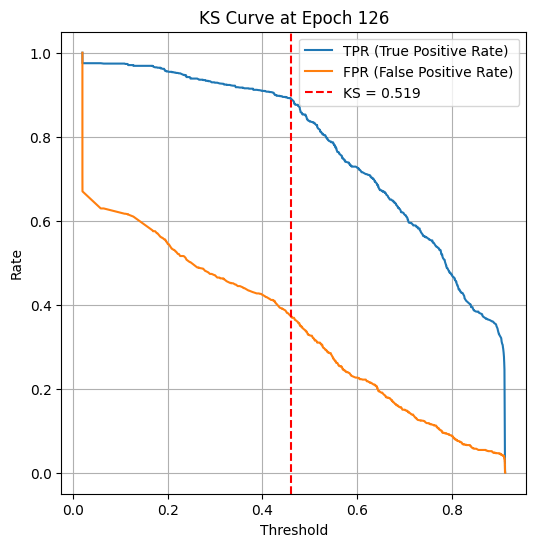

Epoch 130 — Train Loss: 0.4657 | Train Acc: 0.7804 | Val KS: 0.5472 | Val Acc: 0.7628 | Val Prec: 0.7233 | Val Recall: 0.8814 | Val F1: 0.7945
Epoch 140 — Train Loss: 0.4751 | Train Acc: 0.7770 | Val KS: 0.5046 | Val Acc: 0.7433 | Val Prec: 0.7272 | Val Recall: 0.8109 | Val F1: 0.7668


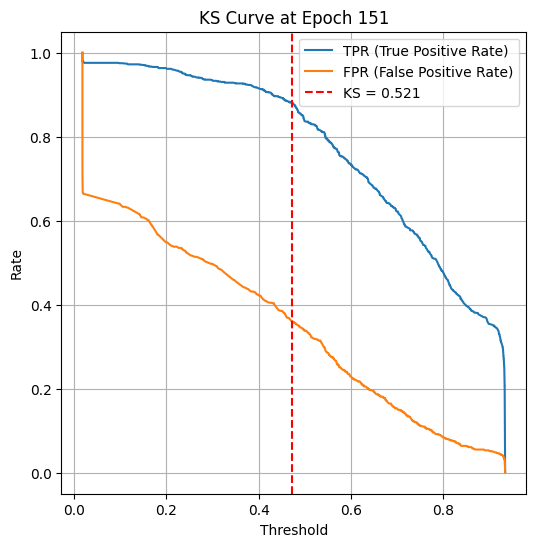

Epoch 150 — Train Loss: 0.4656 | Train Acc: 0.7843 | Val KS: 0.5212 | Val Acc: 0.7530 | Val Prec: 0.7288 | Val Recall: 0.8368 | Val F1: 0.7791
Epoch 160 — Train Loss: 0.4650 | Train Acc: 0.7816 | Val KS: 0.5238 | Val Acc: 0.7595 | Val Prec: 0.7354 | Val Recall: 0.8403 | Val F1: 0.7843
Epoch 170 — Train Loss: 0.4649 | Train Acc: 0.7827 | Val KS: 0.5312 | Val Acc: 0.7581 | Val Prec: 0.7555 | Val Recall: 0.7913 | Val F1: 0.7730


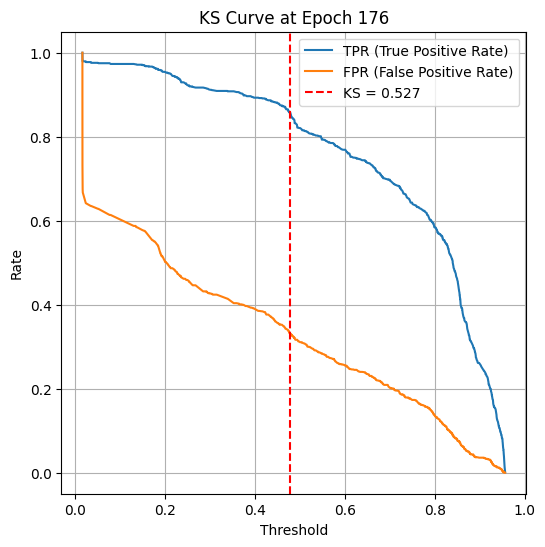

Epoch 180 — Train Loss: 0.4608 | Train Acc: 0.7833 | Val KS: 0.5190 | Val Acc: 0.7586 | Val Prec: 0.7473 | Val Recall: 0.8100 | Val F1: 0.7774
Epoch 190 — Train Loss: 0.4697 | Train Acc: 0.7782 | Val KS: 0.5082 | Val Acc: 0.7549 | Val Prec: 0.7238 | Val Recall: 0.8555 | Val F1: 0.7841


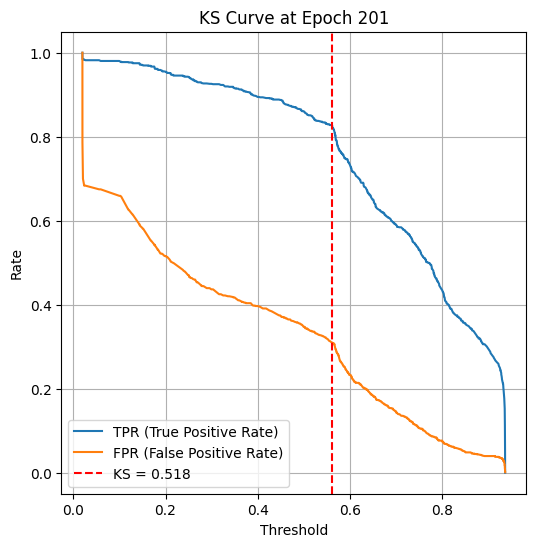

Epoch 200 — Train Loss: 0.4643 | Train Acc: 0.7843 | Val KS: 0.5181 | Val Acc: 0.7600 | Val Prec: 0.7284 | Val Recall: 0.8591 | Val F1: 0.7884
Epoch 210 — Train Loss: 0.4862 | Train Acc: 0.7700 | Val KS: 0.5177 | Val Acc: 0.7591 | Val Prec: 0.7243 | Val Recall: 0.8671 | Val F1: 0.7893
Epoch 220 — Train Loss: 0.4537 | Train Acc: 0.7909 | Val KS: 0.5330 | Val Acc: 0.7521 | Val Prec: 0.7456 | Val Recall: 0.7948 | Val F1: 0.7694


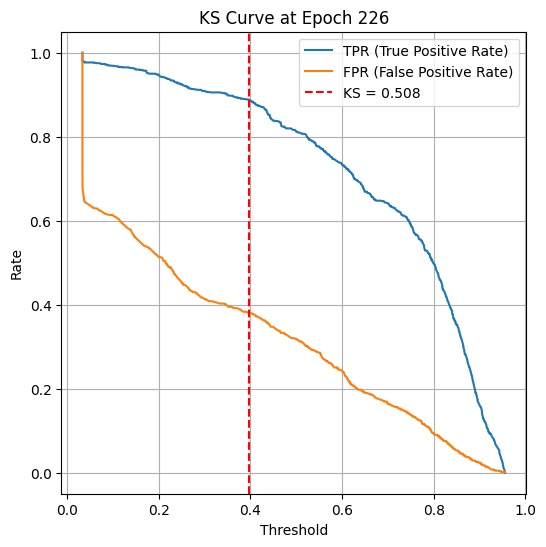

Epoch 230 — Train Loss: 0.4571 | Train Acc: 0.7900 | Val KS: 0.5285 | Val Acc: 0.7669 | Val Prec: 0.7412 | Val Recall: 0.8483 | Val F1: 0.7912
Epoch 240 — Train Loss: 0.4584 | Train Acc: 0.7905 | Val KS: 0.5179 | Val Acc: 0.7623 | Val Prec: 0.7295 | Val Recall: 0.8635 | Val F1: 0.7908


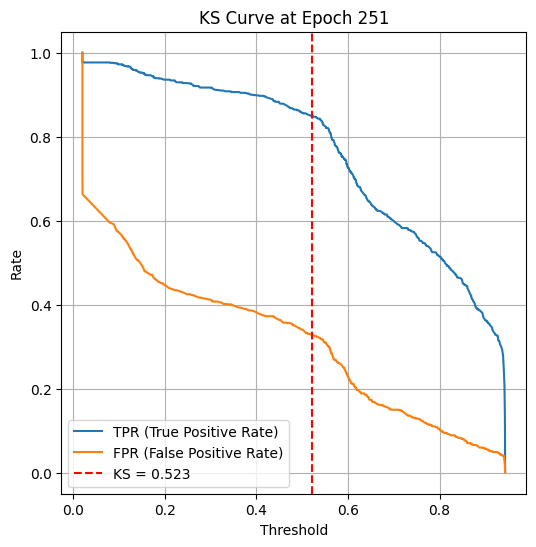

Epoch 250 — Train Loss: 0.4561 | Train Acc: 0.7857 | Val KS: 0.5229 | Val Acc: 0.7618 | Val Prec: 0.7317 | Val Recall: 0.8564 | Val F1: 0.7891
Epoch 260 — Train Loss: 0.4574 | Train Acc: 0.7881 | Val KS: 0.5166 | Val Acc: 0.7586 | Val Prec: 0.7173 | Val Recall: 0.8849 | Val F1: 0.7923
Epoch 270 — Train Loss: 0.4528 | Train Acc: 0.7895 | Val KS: 0.5435 | Val Acc: 0.7725 | Val Prec: 0.7349 | Val Recall: 0.8805 | Val F1: 0.8011


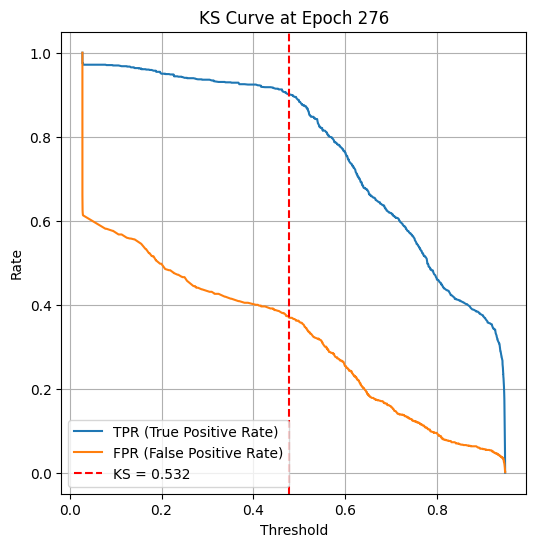

Epoch 280 — Train Loss: 0.4428 | Train Acc: 0.7971 | Val KS: 0.5273 | Val Acc: 0.7642 | Val Prec: 0.7427 | Val Recall: 0.8368 | Val F1: 0.7869
Epoch 290 — Train Loss: 0.4403 | Train Acc: 0.8001 | Val KS: 0.5322 | Val Acc: 0.7642 | Val Prec: 0.7382 | Val Recall: 0.8475 | Val F1: 0.7890


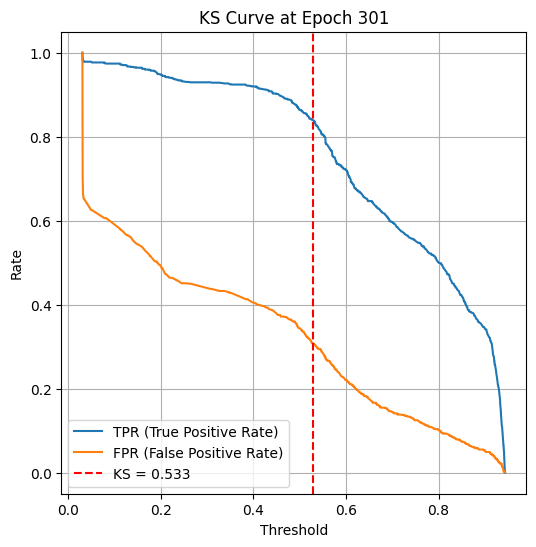

Epoch 300 — Train Loss: 0.4453 | Train Acc: 0.7931 | Val KS: 0.5334 | Val Acc: 0.7642 | Val Prec: 0.7317 | Val Recall: 0.8635 | Val F1: 0.7921
Epoch 310 — Train Loss: 0.4486 | Train Acc: 0.7916 | Val KS: 0.5462 | Val Acc: 0.7767 | Val Prec: 0.7432 | Val Recall: 0.8724 | Val F1: 0.8026
Epoch 320 — Train Loss: 0.4392 | Train Acc: 0.8038 | Val KS: 0.5267 | Val Acc: 0.7642 | Val Prec: 0.7210 | Val Recall: 0.8921 | Val F1: 0.7974


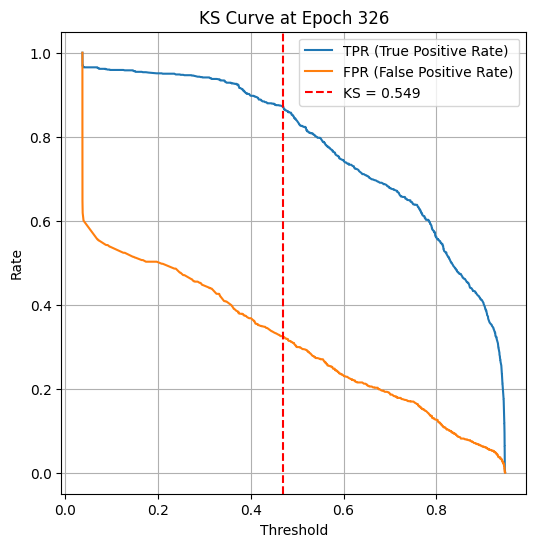

Epoch 330 — Train Loss: 0.4460 | Train Acc: 0.7973 | Val KS: 0.5313 | Val Acc: 0.7581 | Val Prec: 0.7467 | Val Recall: 0.8100 | Val F1: 0.7771
Epoch 340 — Train Loss: 0.4418 | Train Acc: 0.7984 | Val KS: 0.5385 | Val Acc: 0.7711 | Val Prec: 0.7302 | Val Recall: 0.8885 | Val F1: 0.8016


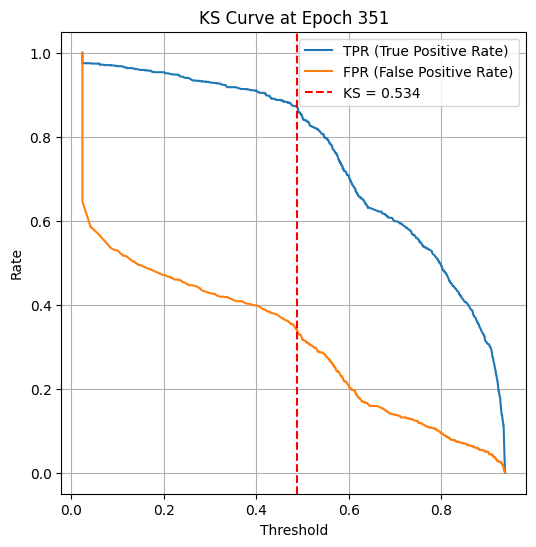

Epoch 350 — Train Loss: 0.4470 | Train Acc: 0.7926 | Val KS: 0.5338 | Val Acc: 0.7665 | Val Prec: 0.7425 | Val Recall: 0.8439 | Val F1: 0.7900
Epoch 360 — Train Loss: 0.4462 | Train Acc: 0.7963 | Val KS: 0.5414 | Val Acc: 0.7697 | Val Prec: 0.7443 | Val Recall: 0.8492 | Val F1: 0.7933
Epoch 370 — Train Loss: 0.4303 | Train Acc: 0.8064 | Val KS: 0.5391 | Val Acc: 0.7744 | Val Prec: 0.7326 | Val Recall: 0.8921 | Val F1: 0.8045


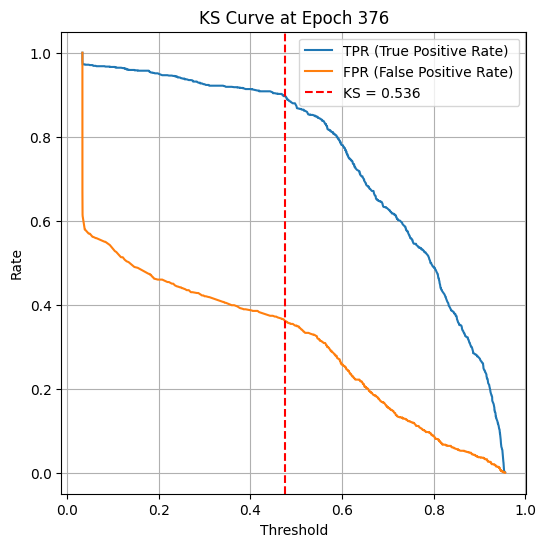

Epoch 380 — Train Loss: 0.4265 | Train Acc: 0.8080 | Val KS: 0.5464 | Val Acc: 0.7683 | Val Prec: 0.7472 | Val Recall: 0.8385 | Val F1: 0.7902
Epoch 390 — Train Loss: 0.4261 | Train Acc: 0.8134 | Val KS: 0.5363 | Val Acc: 0.7591 | Val Prec: 0.7412 | Val Recall: 0.8252 | Val F1: 0.7809


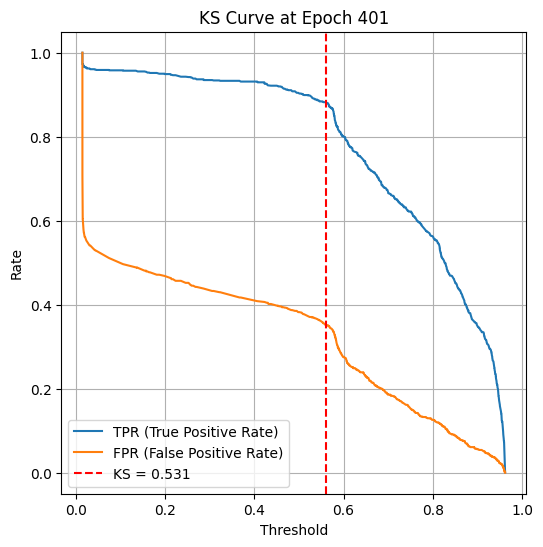

Epoch 400 — Train Loss: 0.4256 | Train Acc: 0.8106 | Val KS: 0.5308 | Val Acc: 0.7660 | Val Prec: 0.7193 | Val Recall: 0.9028 | Val F1: 0.8006
Epoch 410 — Train Loss: 0.4189 | Train Acc: 0.8104 | Val KS: 0.5527 | Val Acc: 0.7711 | Val Prec: 0.7227 | Val Recall: 0.9090 | Val F1: 0.8052
Epoch 420 — Train Loss: 0.4222 | Train Acc: 0.8149 | Val KS: 0.5486 | Val Acc: 0.7781 | Val Prec: 0.7335 | Val Recall: 0.9010 | Val F1: 0.8086


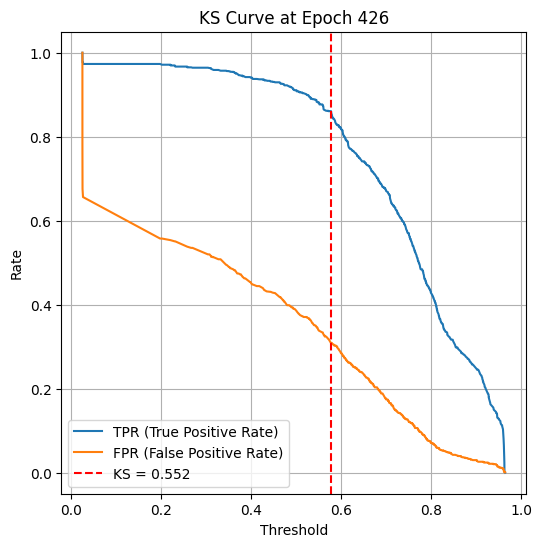

Epoch 430 — Train Loss: 0.4235 | Train Acc: 0.8104 | Val KS: 0.5407 | Val Acc: 0.7679 | Val Prec: 0.7474 | Val Recall: 0.8368 | Val F1: 0.7896
Epoch 440 — Train Loss: 0.4180 | Train Acc: 0.8148 | Val KS: 0.5540 | Val Acc: 0.7697 | Val Prec: 0.7466 | Val Recall: 0.8439 | Val F1: 0.7923


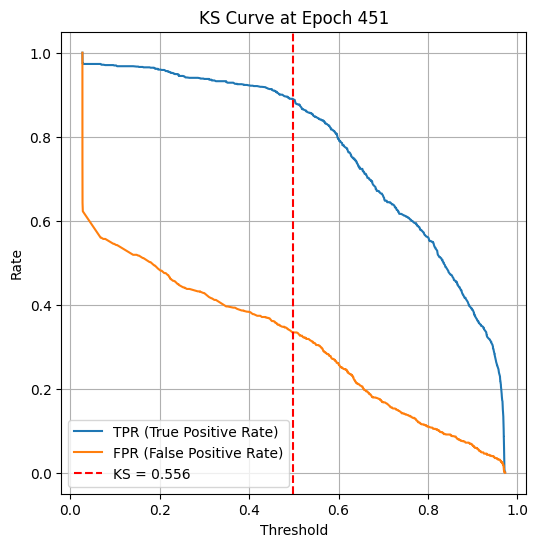

Epoch 450 — Train Loss: 0.4120 | Train Acc: 0.8162 | Val KS: 0.5563 | Val Acc: 0.7813 | Val Prec: 0.7425 | Val Recall: 0.8876 | Val F1: 0.8086
Epoch 460 — Train Loss: 0.4154 | Train Acc: 0.8112 | Val KS: 0.5494 | Val Acc: 0.7790 | Val Prec: 0.7380 | Val Recall: 0.8921 | Val F1: 0.8078
Epoch 470 — Train Loss: 0.4101 | Train Acc: 0.8158 | Val KS: 0.5611 | Val Acc: 0.7753 | Val Prec: 0.7494 | Val Recall: 0.8537 | Val F1: 0.7982


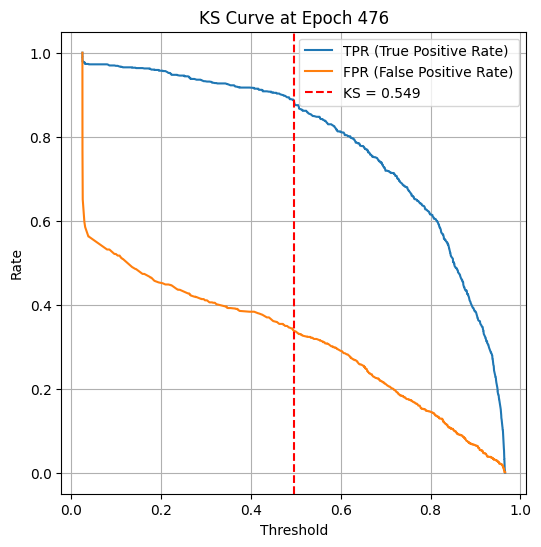

Epoch 480 — Train Loss: 0.4244 | Train Acc: 0.8121 | Val KS: 0.5471 | Val Acc: 0.7693 | Val Prec: 0.7449 | Val Recall: 0.8466 | Val F1: 0.7925
Epoch 490 — Train Loss: 0.4146 | Train Acc: 0.8135 | Val KS: 0.5387 | Val Acc: 0.7656 | Val Prec: 0.7584 | Val Recall: 0.8064 | Val F1: 0.7817


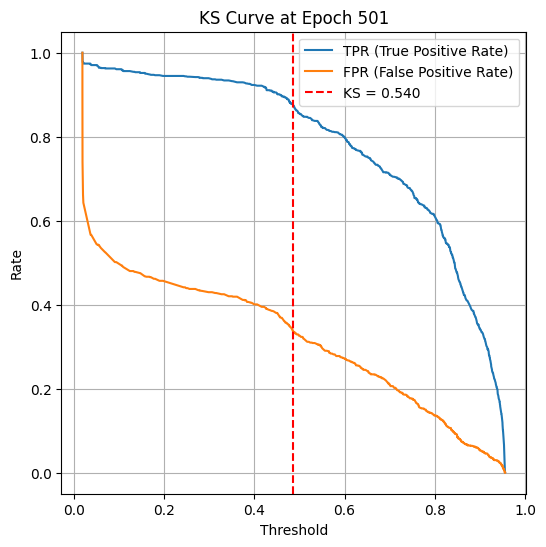

Epoch 500 — Train Loss: 0.4221 | Train Acc: 0.8097 | Val KS: 0.5400 | Val Acc: 0.7679 | Val Prec: 0.7398 | Val Recall: 0.8546 | Val F1: 0.7930
Epoch 510 — Train Loss: 0.4105 | Train Acc: 0.8157 | Val KS: 0.5568 | Val Acc: 0.7804 | Val Prec: 0.7379 | Val Recall: 0.8965 | Val F1: 0.8095
Epoch 520 — Train Loss: 0.4172 | Train Acc: 0.8151 | Val KS: 0.5516 | Val Acc: 0.7748 | Val Prec: 0.7352 | Val Recall: 0.8867 | Val F1: 0.8039


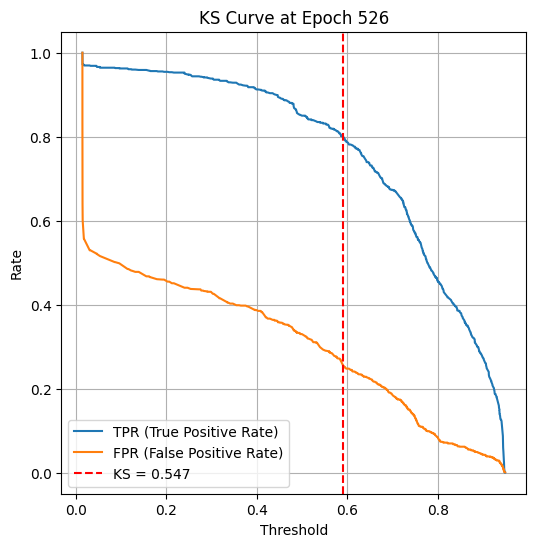

Epoch 530 — Train Loss: 0.4133 | Train Acc: 0.8162 | Val KS: 0.5541 | Val Acc: 0.7804 | Val Prec: 0.7344 | Val Recall: 0.9054 | Val F1: 0.8110
Epoch 540 — Train Loss: 0.4036 | Train Acc: 0.8217 | Val KS: 0.5695 | Val Acc: 0.7883 | Val Prec: 0.7450 | Val Recall: 0.9019 | Val F1: 0.8160


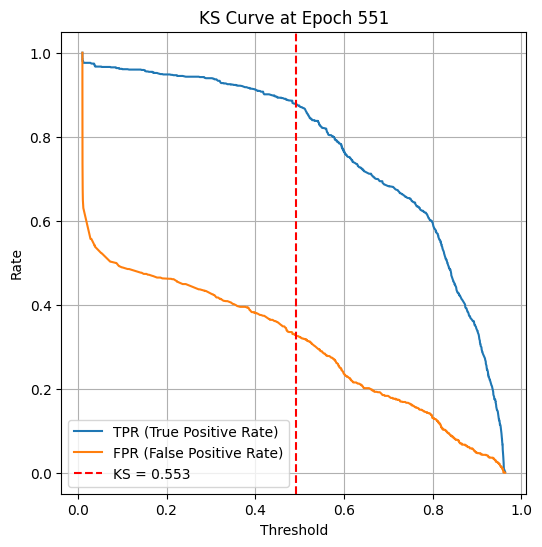

Epoch 550 — Train Loss: 0.4033 | Train Acc: 0.8163 | Val KS: 0.5525 | Val Acc: 0.7781 | Val Prec: 0.7452 | Val Recall: 0.8715 | Val F1: 0.8035
Epoch 560 — Train Loss: 0.3990 | Train Acc: 0.8240 | Val KS: 0.5593 | Val Acc: 0.7786 | Val Prec: 0.7396 | Val Recall: 0.8867 | Val F1: 0.8065
Epoch 570 — Train Loss: 0.4088 | Train Acc: 0.8160 | Val KS: 0.5519 | Val Acc: 0.7781 | Val Prec: 0.7494 | Val Recall: 0.8617 | Val F1: 0.8017


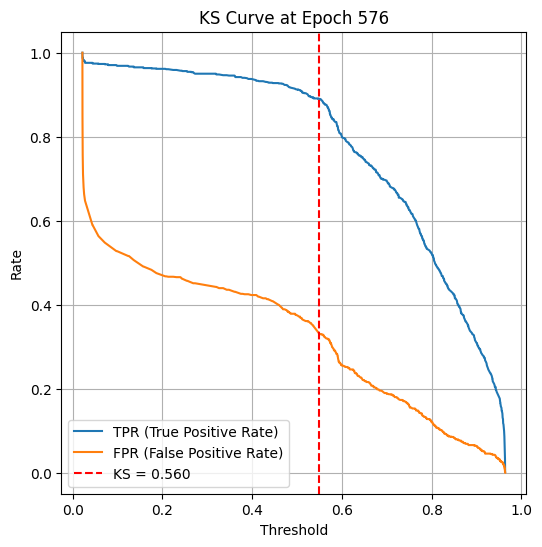

Epoch 580 — Train Loss: 0.3992 | Train Acc: 0.8189 | Val KS: 0.5534 | Val Acc: 0.7758 | Val Prec: 0.7492 | Val Recall: 0.8555 | Val F1: 0.7988
Epoch 590 — Train Loss: 0.4008 | Train Acc: 0.8219 | Val KS: 0.5595 | Val Acc: 0.7730 | Val Prec: 0.7532 | Val Recall: 0.8385 | Val F1: 0.7936


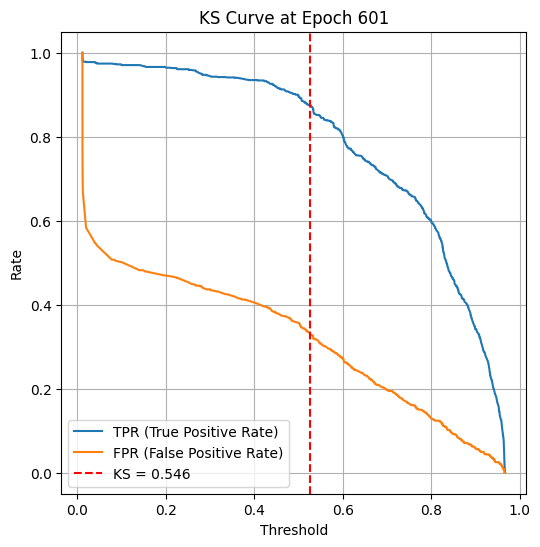

Epoch 600 — Train Loss: 0.3931 | Train Acc: 0.8248 | Val KS: 0.5460 | Val Acc: 0.7762 | Val Prec: 0.7324 | Val Recall: 0.8983 | Val F1: 0.8069
Epoch 610 — Train Loss: 0.3915 | Train Acc: 0.8279 | Val KS: 0.5410 | Val Acc: 0.7707 | Val Prec: 0.7327 | Val Recall: 0.8805 | Val F1: 0.7998
Epoch 620 — Train Loss: 0.3907 | Train Acc: 0.8240 | Val KS: 0.5659 | Val Acc: 0.7851 | Val Prec: 0.7405 | Val Recall: 0.9037 | Val F1: 0.8140


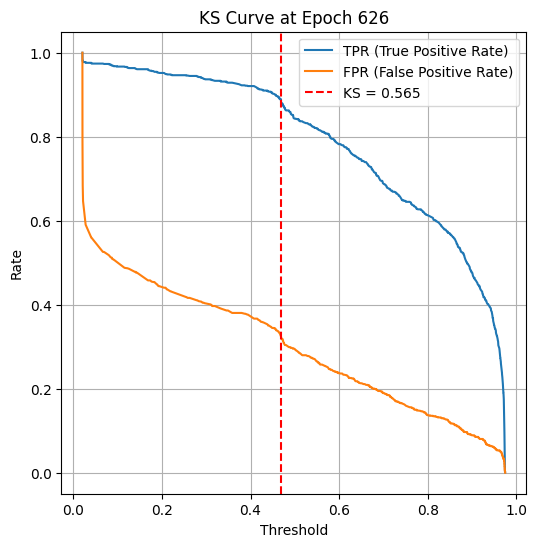

Epoch 630 — Train Loss: 0.3923 | Train Acc: 0.8288 | Val KS: 0.5610 | Val Acc: 0.7827 | Val Prec: 0.7453 | Val Recall: 0.8849 | Val F1: 0.8091
Epoch 640 — Train Loss: 0.3793 | Train Acc: 0.8329 | Val KS: 0.5525 | Val Acc: 0.7772 | Val Prec: 0.7291 | Val Recall: 0.9099 | Val F1: 0.8095


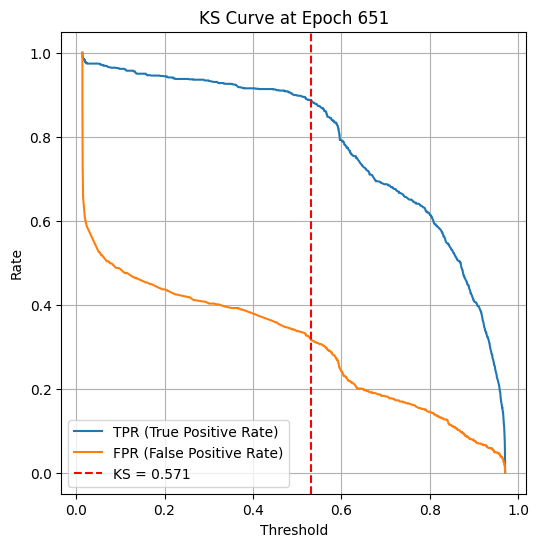

Epoch 650 — Train Loss: 0.3917 | Train Acc: 0.8244 | Val KS: 0.5710 | Val Acc: 0.7855 | Val Prec: 0.7432 | Val Recall: 0.8983 | Val F1: 0.8134
Epoch 660 — Train Loss: 0.3950 | Train Acc: 0.8259 | Val KS: 0.5675 | Val Acc: 0.7841 | Val Prec: 0.7451 | Val Recall: 0.8894 | Val F1: 0.8109
Epoch 670 — Train Loss: 0.3850 | Train Acc: 0.8330 | Val KS: 0.5689 | Val Acc: 0.7878 | Val Prec: 0.7448 | Val Recall: 0.9010 | Val F1: 0.8155


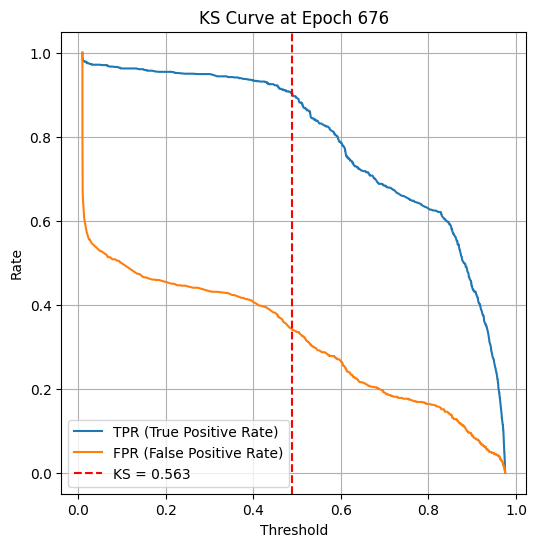

Epoch 680 — Train Loss: 0.3719 | Train Acc: 0.8392 | Val KS: 0.5639 | Val Acc: 0.7827 | Val Prec: 0.7457 | Val Recall: 0.8840 | Val F1: 0.8090
Epoch 690 — Train Loss: 0.3819 | Train Acc: 0.8305 | Val KS: 0.5717 | Val Acc: 0.7846 | Val Prec: 0.7421 | Val Recall: 0.8983 | Val F1: 0.8128


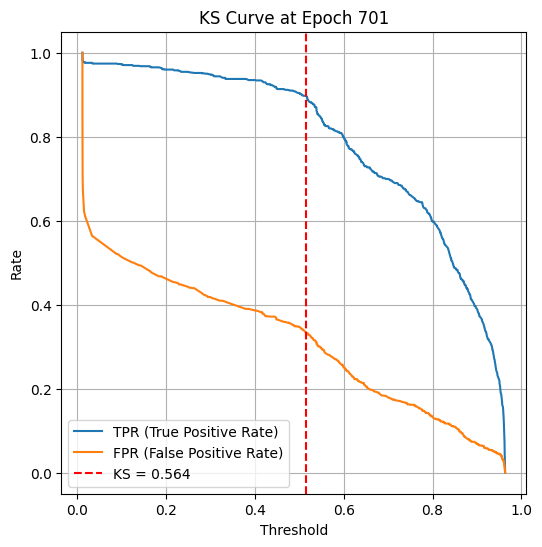

Epoch 700 — Train Loss: 0.3797 | Train Acc: 0.8323 | Val KS: 0.5644 | Val Acc: 0.7832 | Val Prec: 0.7383 | Val Recall: 0.9037 | Val F1: 0.8127
Epoch 710 — Train Loss: 0.3805 | Train Acc: 0.8319 | Val KS: 0.5666 | Val Acc: 0.7864 | Val Prec: 0.7461 | Val Recall: 0.8938 | Val F1: 0.8133
Epoch 720 — Train Loss: 0.3724 | Train Acc: 0.8352 | Val KS: 0.5813 | Val Acc: 0.7925 | Val Prec: 0.7557 | Val Recall: 0.8885 | Val F1: 0.8167


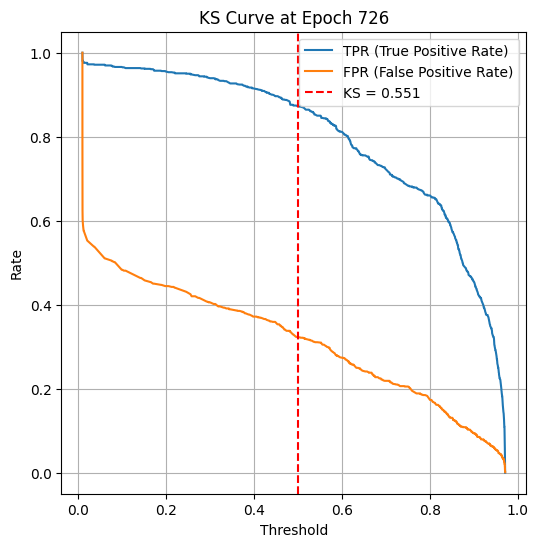

Epoch 730 — Train Loss: 0.3674 | Train Acc: 0.8426 | Val KS: 0.5759 | Val Acc: 0.7916 | Val Prec: 0.7519 | Val Recall: 0.8947 | Val F1: 0.8171
Epoch 740 — Train Loss: 0.3772 | Train Acc: 0.8323 | Val KS: 0.5762 | Val Acc: 0.7878 | Val Prec: 0.7610 | Val Recall: 0.8635 | Val F1: 0.8090


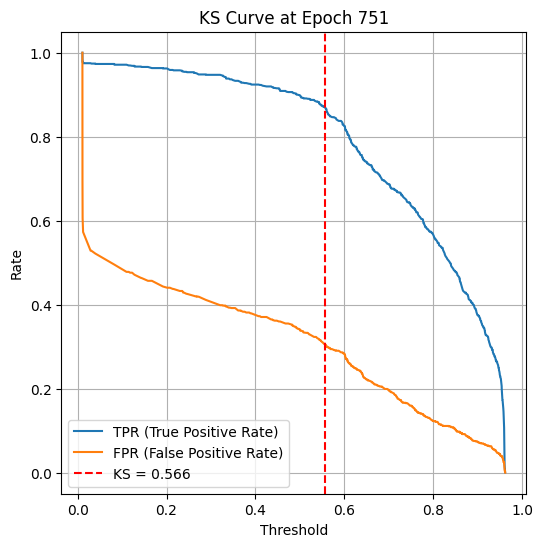

Epoch 750 — Train Loss: 0.3707 | Train Acc: 0.8375 | Val KS: 0.5659 | Val Acc: 0.7832 | Val Prec: 0.7408 | Val Recall: 0.8974 | Val F1: 0.8116
Epoch 760 — Train Loss: 0.3648 | Train Acc: 0.8377 | Val KS: 0.5768 | Val Acc: 0.7851 | Val Prec: 0.7595 | Val Recall: 0.8591 | Val F1: 0.8062
Epoch 770 — Train Loss: 0.3719 | Train Acc: 0.8363 | Val KS: 0.5815 | Val Acc: 0.7878 | Val Prec: 0.7610 | Val Recall: 0.8635 | Val F1: 0.8090


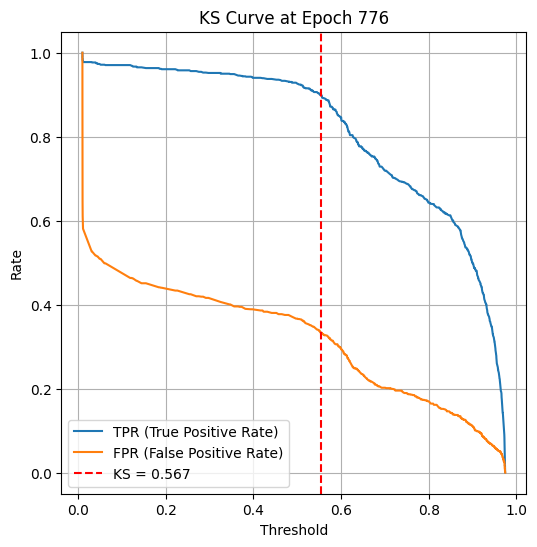

Epoch 780 — Train Loss: 0.3566 | Train Acc: 0.8398 | Val KS: 0.5693 | Val Acc: 0.7864 | Val Prec: 0.7436 | Val Recall: 0.9001 | Val F1: 0.8144
Epoch 790 — Train Loss: 0.3662 | Train Acc: 0.8423 | Val KS: 0.5798 | Val Acc: 0.7888 | Val Prec: 0.7463 | Val Recall: 0.9001 | Val F1: 0.8160


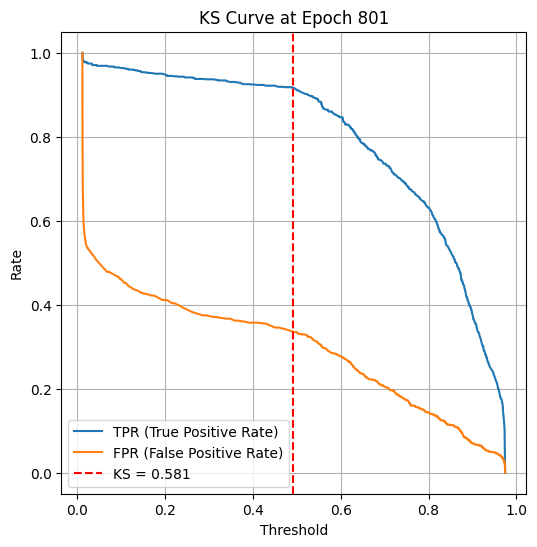

Epoch 800 — Train Loss: 0.3706 | Train Acc: 0.8406 | Val KS: 0.5811 | Val Acc: 0.7943 | Val Prec: 0.7482 | Val Recall: 0.9117 | Val F1: 0.8219
Epoch 810 — Train Loss: 0.3673 | Train Acc: 0.8387 | Val KS: 0.5866 | Val Acc: 0.7953 | Val Prec: 0.7580 | Val Recall: 0.8912 | Val F1: 0.8192
Epoch 820 — Train Loss: 0.3669 | Train Acc: 0.8401 | Val KS: 0.6006 | Val Acc: 0.7967 | Val Prec: 0.7829 | Val Recall: 0.8430 | Val F1: 0.8119


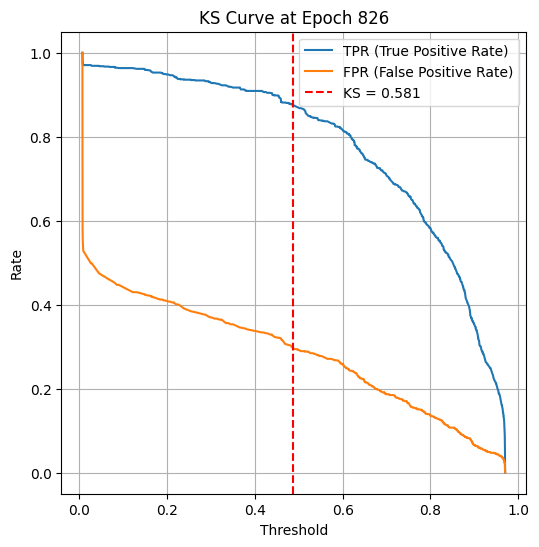

Epoch 830 — Train Loss: 0.3624 | Train Acc: 0.8445 | Val KS: 0.5864 | Val Acc: 0.7934 | Val Prec: 0.7572 | Val Recall: 0.8876 | Val F1: 0.8172
Epoch 840 — Train Loss: 0.3642 | Train Acc: 0.8405 | Val KS: 0.5624 | Val Acc: 0.7776 | Val Prec: 0.7193 | Val Recall: 0.9393 | Val F1: 0.8147


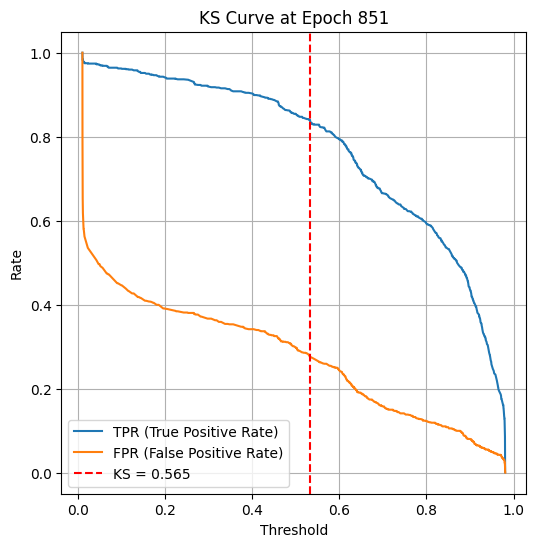

Epoch 850 — Train Loss: 0.3653 | Train Acc: 0.8370 | Val KS: 0.5654 | Val Acc: 0.7813 | Val Prec: 0.7567 | Val Recall: 0.8546 | Val F1: 0.8027
Epoch 860 — Train Loss: 0.3751 | Train Acc: 0.8329 | Val KS: 0.5751 | Val Acc: 0.7878 | Val Prec: 0.7508 | Val Recall: 0.8867 | Val F1: 0.8131
Epoch 870 — Train Loss: 0.3562 | Train Acc: 0.8446 | Val KS: 0.5840 | Val Acc: 0.7874 | Val Prec: 0.7517 | Val Recall: 0.8831 | Val F1: 0.8121


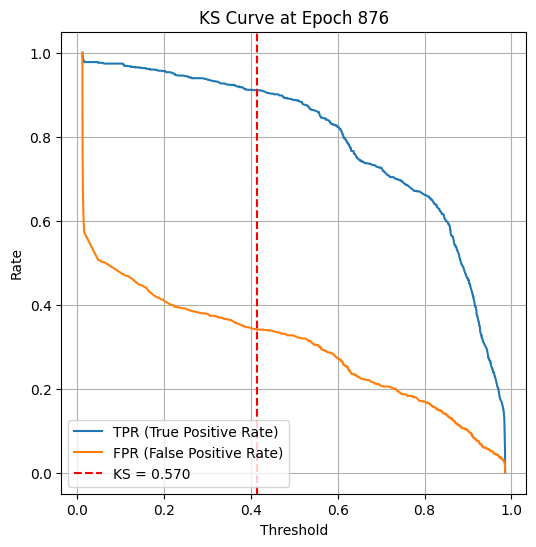

Epoch 880 — Train Loss: 0.3521 | Train Acc: 0.8479 | Val KS: 0.5607 | Val Acc: 0.7799 | Val Prec: 0.7326 | Val Recall: 0.9090 | Val F1: 0.8113
Epoch 890 — Train Loss: 0.3597 | Train Acc: 0.8437 | Val KS: 0.5738 | Val Acc: 0.7902 | Val Prec: 0.7491 | Val Recall: 0.8974 | Val F1: 0.8166


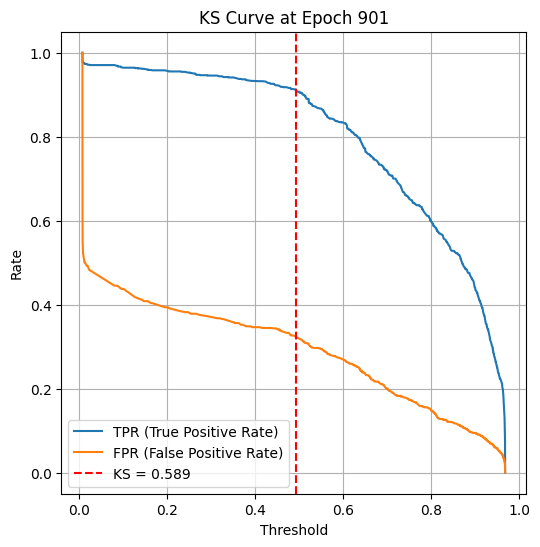

Epoch 900 — Train Loss: 0.3598 | Train Acc: 0.8435 | Val KS: 0.5892 | Val Acc: 0.7981 | Val Prec: 0.7548 | Val Recall: 0.9063 | Val F1: 0.8237
Epoch 910 — Train Loss: 0.3542 | Train Acc: 0.8493 | Val KS: 0.5743 | Val Acc: 0.7906 | Val Prec: 0.7438 | Val Recall: 0.9117 | Val F1: 0.8192
Epoch 920 — Train Loss: 0.3546 | Train Acc: 0.8443 | Val KS: 0.5798 | Val Acc: 0.7869 | Val Prec: 0.7423 | Val Recall: 0.9045 | Val F1: 0.8154


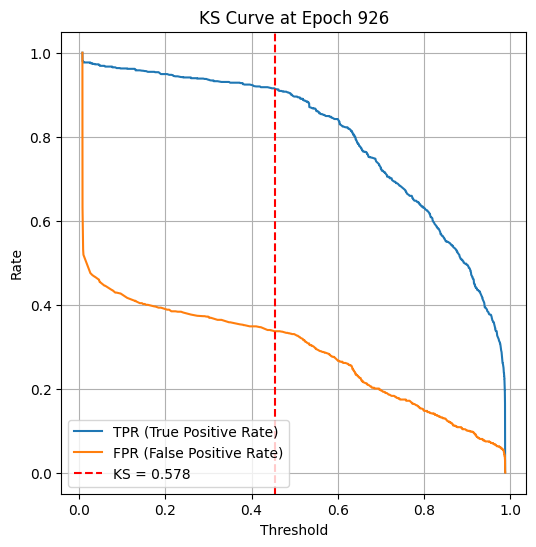

Epoch 930 — Train Loss: 0.3551 | Train Acc: 0.8431 | Val KS: 0.5831 | Val Acc: 0.7902 | Val Prec: 0.7461 | Val Recall: 0.9045 | Val F1: 0.8177
Epoch 940 — Train Loss: 0.3477 | Train Acc: 0.8474 | Val KS: 0.5834 | Val Acc: 0.7920 | Val Prec: 0.7590 | Val Recall: 0.8796 | Val F1: 0.8149


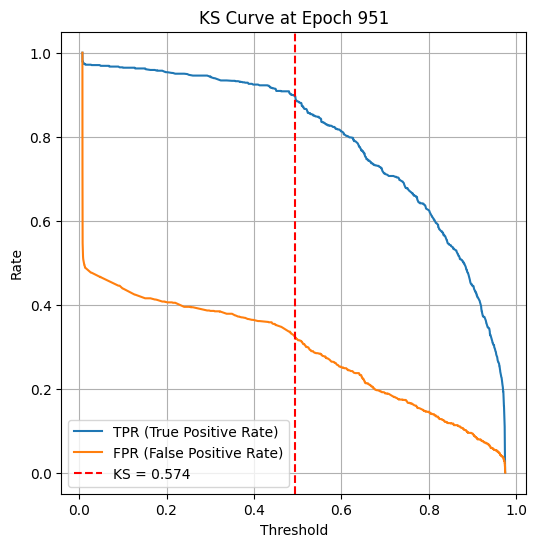

Epoch 950 — Train Loss: 0.3451 | Train Acc: 0.8465 | Val KS: 0.5742 | Val Acc: 0.7883 | Val Prec: 0.7525 | Val Recall: 0.8840 | Val F1: 0.8130
Epoch 960 — Train Loss: 0.3506 | Train Acc: 0.8460 | Val KS: 0.5726 | Val Acc: 0.7832 | Val Prec: 0.7496 | Val Recall: 0.8760 | Val F1: 0.8079
Epoch 970 — Train Loss: 0.3464 | Train Acc: 0.8516 | Val KS: 0.5822 | Val Acc: 0.7864 | Val Prec: 0.7544 | Val Recall: 0.8742 | Val F1: 0.8099


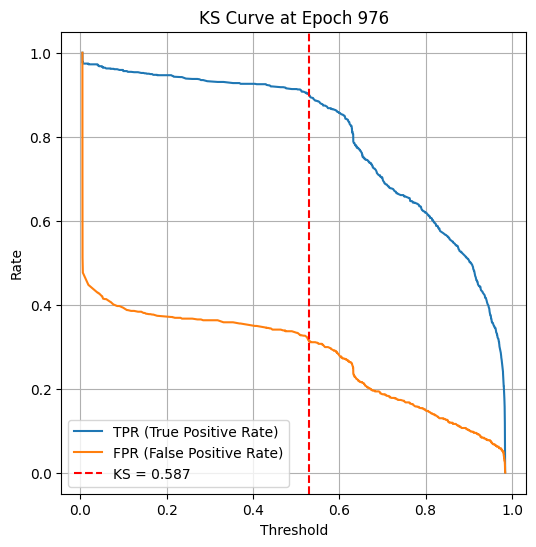

Epoch 980 — Train Loss: 0.3499 | Train Acc: 0.8517 | Val KS: 0.5863 | Val Acc: 0.7939 | Val Prec: 0.7555 | Val Recall: 0.8930 | Val F1: 0.8185
Epoch 990 — Train Loss: 0.3428 | Train Acc: 0.8507 | Val KS: 0.5536 | Val Acc: 0.7730 | Val Prec: 0.7401 | Val Recall: 0.8689 | Val F1: 0.7993


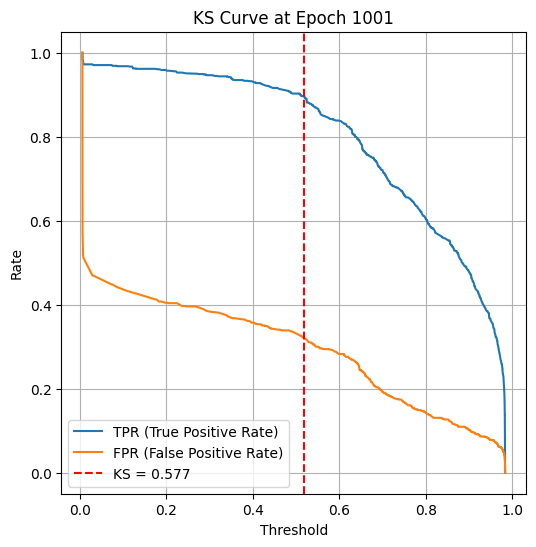

Epoch 1000 — Train Loss: 0.3415 | Train Acc: 0.8488 | Val KS: 0.5771 | Val Acc: 0.7906 | Val Prec: 0.7474 | Val Recall: 0.9028 | Val F1: 0.8178
Epoch 1010 — Train Loss: 0.3383 | Train Acc: 0.8527 | Val KS: 0.5787 | Val Acc: 0.7906 | Val Prec: 0.7511 | Val Recall: 0.8938 | Val F1: 0.8163
Epoch 1020 — Train Loss: 0.3356 | Train Acc: 0.8525 | Val KS: 0.5714 | Val Acc: 0.7855 | Val Prec: 0.7435 | Val Recall: 0.8974 | Val F1: 0.8133


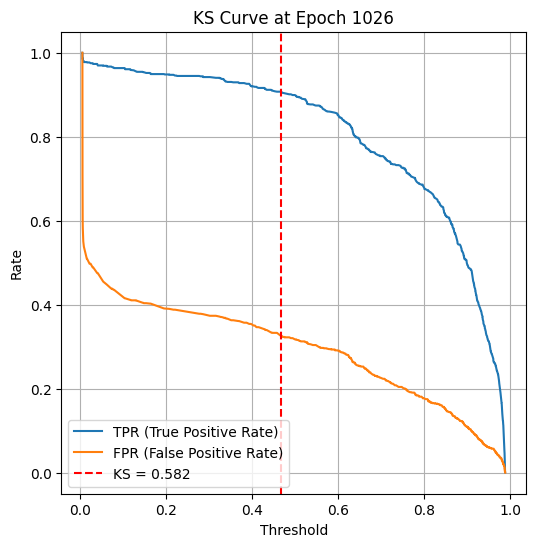

Epoch 1030 — Train Loss: 0.3416 | Train Acc: 0.8508 | Val KS: 0.5883 | Val Acc: 0.7902 | Val Prec: 0.7670 | Val Recall: 0.8573 | Val F1: 0.8096
Epoch 1040 — Train Loss: 0.3427 | Train Acc: 0.8510 | Val KS: 0.5877 | Val Acc: 0.7892 | Val Prec: 0.7700 | Val Recall: 0.8483 | Val F1: 0.8073


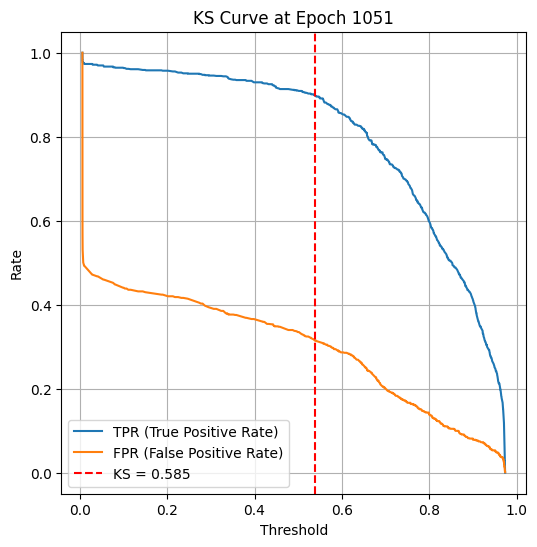

Epoch 1050 — Train Loss: 0.3349 | Train Acc: 0.8569 | Val KS: 0.5846 | Val Acc: 0.7920 | Val Prec: 0.7465 | Val Recall: 0.9090 | Val F1: 0.8198
Epoch 1060 — Train Loss: 0.3384 | Train Acc: 0.8524 | Val KS: 0.5911 | Val Acc: 0.7985 | Val Prec: 0.7628 | Val Recall: 0.8894 | Val F1: 0.8213
Epoch 1070 — Train Loss: 0.3353 | Train Acc: 0.8561 | Val KS: 0.5934 | Val Acc: 0.7953 | Val Prec: 0.7556 | Val Recall: 0.8965 | Val F1: 0.8201


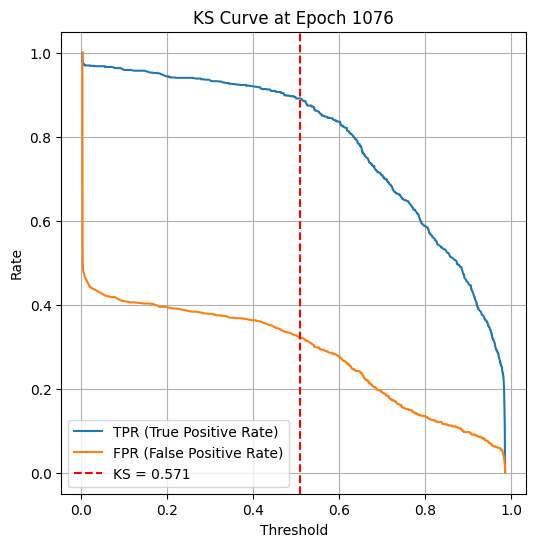

Epoch 1080 — Train Loss: 0.3353 | Train Acc: 0.8561 | Val KS: 0.5919 | Val Acc: 0.7971 | Val Prec: 0.7627 | Val Recall: 0.8858 | Val F1: 0.8196
Epoch 1090 — Train Loss: 0.3370 | Train Acc: 0.8513 | Val KS: 0.5701 | Val Acc: 0.7841 | Val Prec: 0.7579 | Val Recall: 0.8599 | Val F1: 0.8057


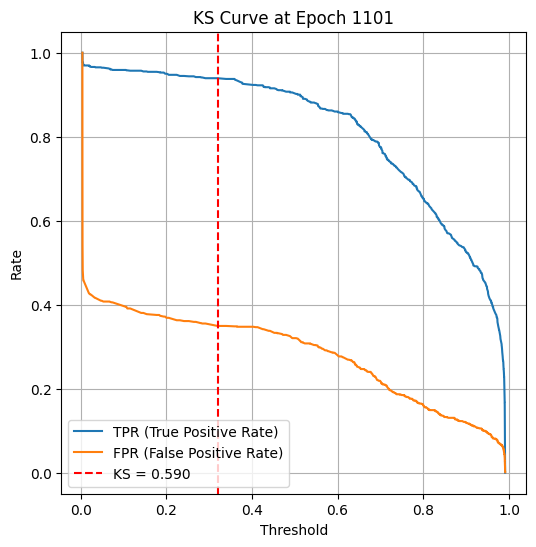

Epoch 1100 — Train Loss: 0.3285 | Train Acc: 0.8596 | Val KS: 0.5899 | Val Acc: 0.7953 | Val Prec: 0.7534 | Val Recall: 0.9019 | Val F1: 0.8210
Epoch 1110 — Train Loss: 0.3387 | Train Acc: 0.8539 | Val KS: 0.5843 | Val Acc: 0.7869 | Val Prec: 0.7570 | Val Recall: 0.8698 | Val F1: 0.8095
Epoch 1120 — Train Loss: 0.3405 | Train Acc: 0.8533 | Val KS: 0.5855 | Val Acc: 0.7962 | Val Prec: 0.7583 | Val Recall: 0.8930 | Val F1: 0.8202


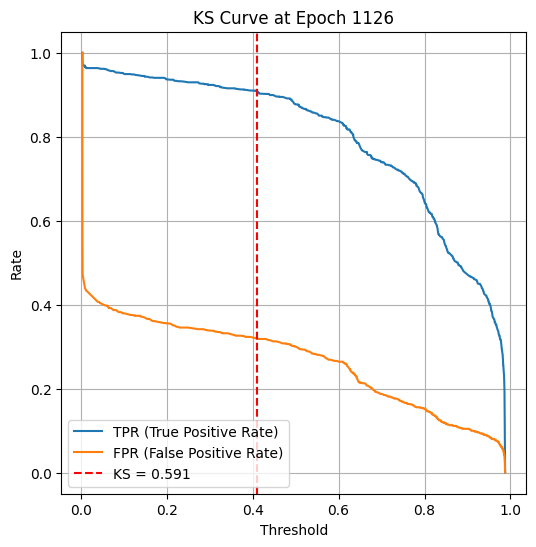

Epoch 1130 — Train Loss: 0.3318 | Train Acc: 0.8556 | Val KS: 0.5757 | Val Acc: 0.7864 | Val Prec: 0.7461 | Val Recall: 0.8938 | Val F1: 0.8133
Epoch 1140 — Train Loss: 0.3337 | Train Acc: 0.8550 | Val KS: 0.5866 | Val Acc: 0.7902 | Val Prec: 0.7525 | Val Recall: 0.8894 | Val F1: 0.8152


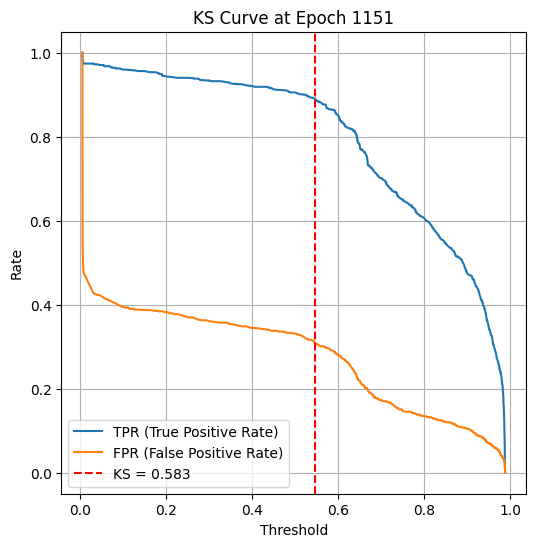

Epoch 1150 — Train Loss: 0.3317 | Train Acc: 0.8535 | Val KS: 0.5833 | Val Acc: 0.7916 | Val Prec: 0.7478 | Val Recall: 0.9045 | Val F1: 0.8187
Epoch 1160 — Train Loss: 0.3282 | Train Acc: 0.8511 | Val KS: 0.6002 | Val Acc: 0.8018 | Val Prec: 0.7649 | Val Recall: 0.8938 | Val F1: 0.8244
Epoch 1170 — Train Loss: 0.3311 | Train Acc: 0.8552 | Val KS: 0.5887 | Val Acc: 0.7934 | Val Prec: 0.7493 | Val Recall: 0.9063 | Val F1: 0.8203


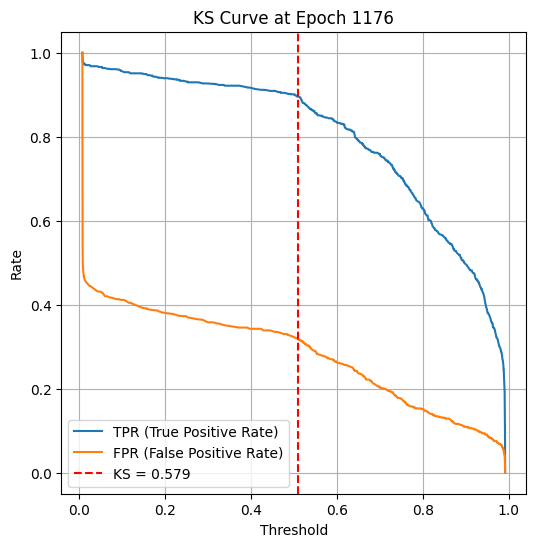

Epoch 1180 — Train Loss: 0.3249 | Train Acc: 0.8589 | Val KS: 0.5827 | Val Acc: 0.7925 | Val Prec: 0.7545 | Val Recall: 0.8912 | Val F1: 0.8172
Epoch 1190 — Train Loss: 0.3270 | Train Acc: 0.8604 | Val KS: 0.5967 | Val Acc: 0.7939 | Val Prec: 0.7651 | Val Recall: 0.8715 | Val F1: 0.8148


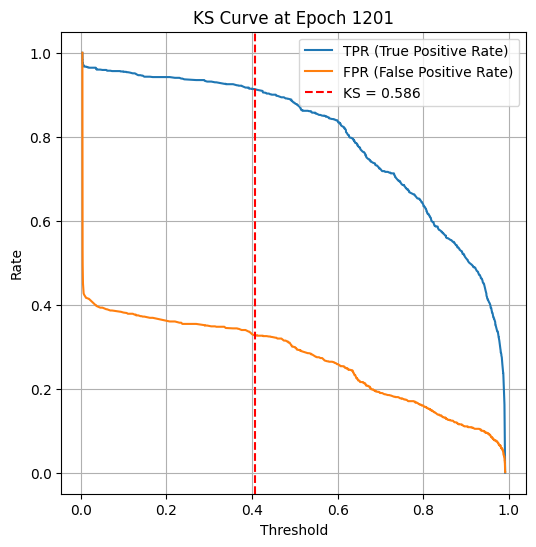

Epoch 1200 — Train Loss: 0.3274 | Train Acc: 0.8553 | Val KS: 0.5863 | Val Acc: 0.7943 | Val Prec: 0.7616 | Val Recall: 0.8805 | Val F1: 0.8167
Epoch 1210 — Train Loss: 0.3304 | Train Acc: 0.8573 | Val KS: 0.5768 | Val Acc: 0.7864 | Val Prec: 0.7621 | Val Recall: 0.8573 | Val F1: 0.8069
Epoch 1220 — Train Loss: 0.3243 | Train Acc: 0.8567 | Val KS: 0.5781 | Val Acc: 0.7939 | Val Prec: 0.7441 | Val Recall: 0.9206 | Val F1: 0.8230


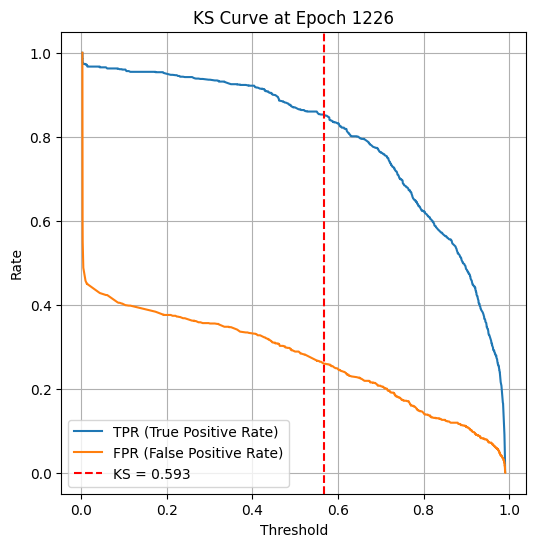

Epoch 1230 — Train Loss: 0.3197 | Train Acc: 0.8595 | Val KS: 0.5894 | Val Acc: 0.7985 | Val Prec: 0.7546 | Val Recall: 0.9081 | Val F1: 0.8243
Epoch 1240 — Train Loss: 0.3290 | Train Acc: 0.8573 | Val KS: 0.5956 | Val Acc: 0.7948 | Val Prec: 0.7578 | Val Recall: 0.8903 | Val F1: 0.8187


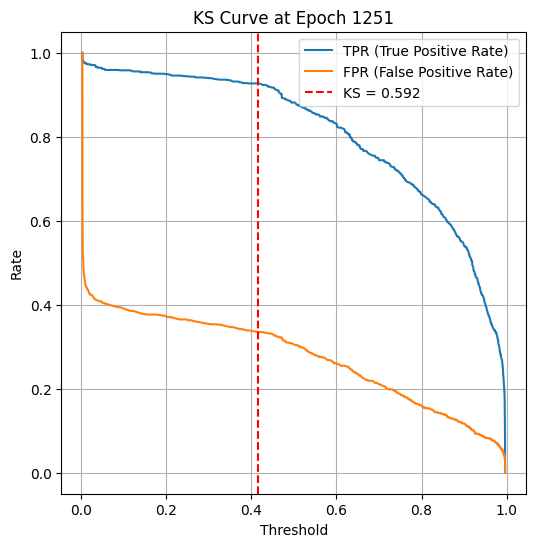

Epoch 1250 — Train Loss: 0.3141 | Train Acc: 0.8627 | Val KS: 0.5919 | Val Acc: 0.7916 | Val Prec: 0.7577 | Val Recall: 0.8814 | Val F1: 0.8148
Epoch 1260 — Train Loss: 0.3193 | Train Acc: 0.8603 | Val KS: 0.5896 | Val Acc: 0.7916 | Val Prec: 0.7526 | Val Recall: 0.8930 | Val F1: 0.8168
Epoch 1270 — Train Loss: 0.3178 | Train Acc: 0.8600 | Val KS: 0.5974 | Val Acc: 0.7929 | Val Prec: 0.7694 | Val Recall: 0.8599 | Val F1: 0.8121


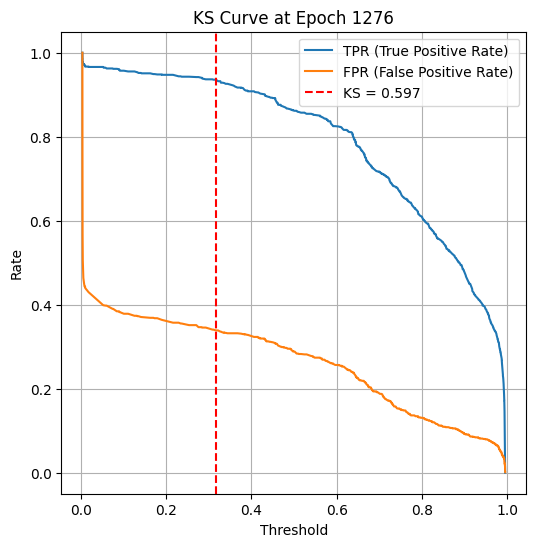

Epoch 1280 — Train Loss: 0.3202 | Train Acc: 0.8640 | Val KS: 0.5817 | Val Acc: 0.7874 | Val Prec: 0.7487 | Val Recall: 0.8903 | Val F1: 0.8134
Epoch 1290 — Train Loss: 0.3192 | Train Acc: 0.8581 | Val KS: 0.6045 | Val Acc: 0.8050 | Val Prec: 0.7665 | Val Recall: 0.8992 | Val F1: 0.8276


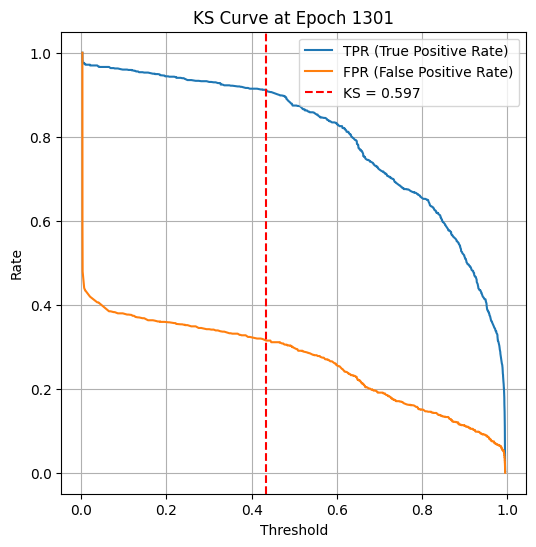

Epoch 1300 — Train Loss: 0.3284 | Train Acc: 0.8545 | Val KS: 0.5971 | Val Acc: 0.7925 | Val Prec: 0.7621 | Val Recall: 0.8742 | Val F1: 0.8143
Epoch 1310 — Train Loss: 0.3225 | Train Acc: 0.8586 | Val KS: 0.5981 | Val Acc: 0.8022 | Val Prec: 0.7615 | Val Recall: 0.9028 | Val F1: 0.8261
Epoch 1320 — Train Loss: 0.3188 | Train Acc: 0.8603 | Val KS: 0.5942 | Val Acc: 0.7990 | Val Prec: 0.7489 | Val Recall: 0.9233 | Val F1: 0.8270


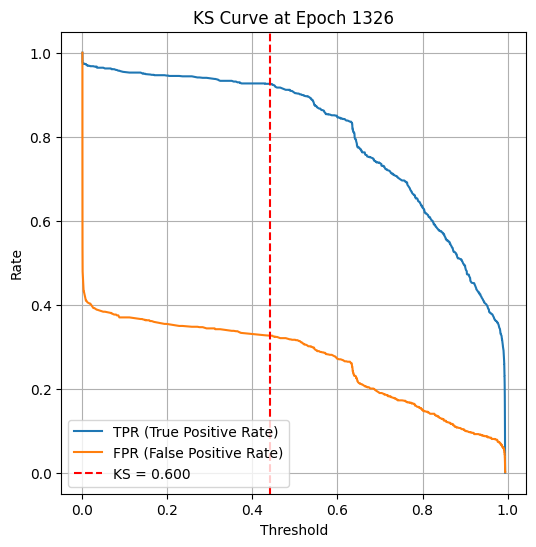

Epoch 1330 — Train Loss: 0.3263 | Train Acc: 0.8598 | Val KS: 0.6054 | Val Acc: 0.8059 | Val Prec: 0.7602 | Val Recall: 0.9161 | Val F1: 0.8309
Epoch 1340 — Train Loss: 0.3233 | Train Acc: 0.8607 | Val KS: 0.5908 | Val Acc: 0.7934 | Val Prec: 0.7526 | Val Recall: 0.8983 | Val F1: 0.8190


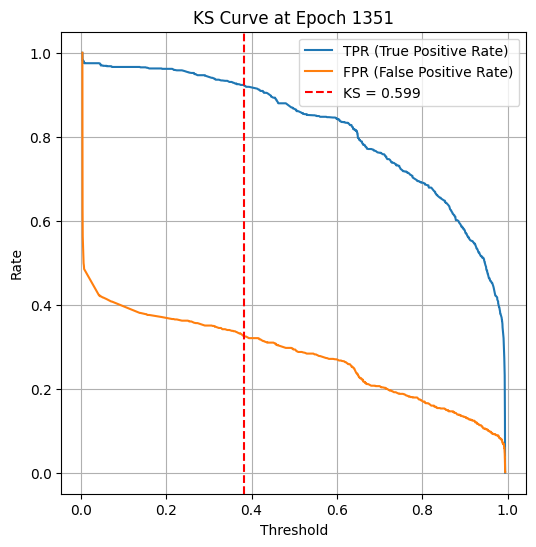

Epoch 1350 — Train Loss: 0.3205 | Train Acc: 0.8629 | Val KS: 0.5990 | Val Acc: 0.7897 | Val Prec: 0.7622 | Val Recall: 0.8662 | Val F1: 0.8109
Epoch 1360 — Train Loss: 0.3177 | Train Acc: 0.8626 | Val KS: 0.5815 | Val Acc: 0.7860 | Val Prec: 0.7554 | Val Recall: 0.8707 | Val F1: 0.8090
Epoch 1370 — Train Loss: 0.3167 | Train Acc: 0.8613 | Val KS: 0.5937 | Val Acc: 0.7953 | Val Prec: 0.7636 | Val Recall: 0.8787 | Val F1: 0.8171


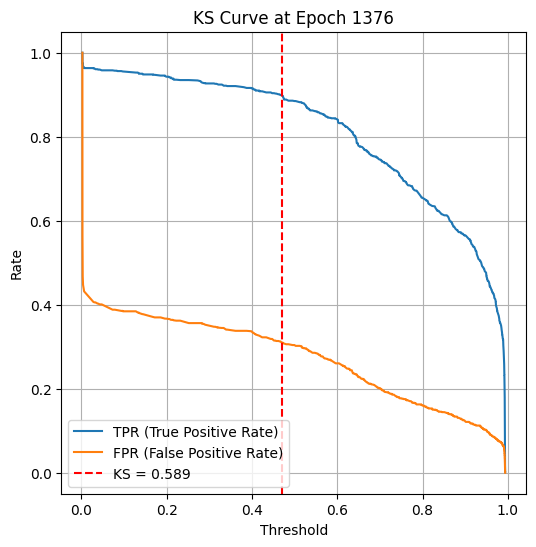

Epoch 1380 — Train Loss: 0.3148 | Train Acc: 0.8668 | Val KS: 0.5979 | Val Acc: 0.7994 | Val Prec: 0.7581 | Val Recall: 0.9028 | Val F1: 0.8241
Epoch 1390 — Train Loss: 0.3137 | Train Acc: 0.8601 | Val KS: 0.5953 | Val Acc: 0.7934 | Val Prec: 0.7748 | Val Recall: 0.8501 | Val F1: 0.8107


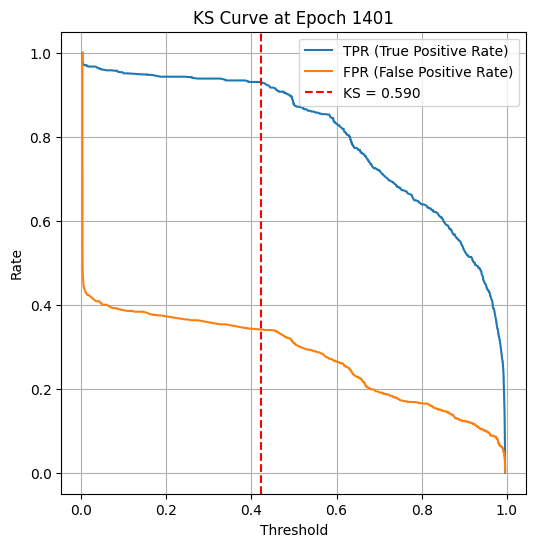

Epoch 1400 — Train Loss: 0.3155 | Train Acc: 0.8548 | Val KS: 0.5897 | Val Acc: 0.7869 | Val Prec: 0.7550 | Val Recall: 0.8742 | Val F1: 0.8103
Epoch 1410 — Train Loss: 0.3089 | Train Acc: 0.8646 | Val KS: 0.6026 | Val Acc: 0.7981 | Val Prec: 0.7659 | Val Recall: 0.8814 | Val F1: 0.8196
Epoch 1420 — Train Loss: 0.3106 | Train Acc: 0.8657 | Val KS: 0.6043 | Val Acc: 0.7990 | Val Prec: 0.7692 | Val Recall: 0.8769 | Val F1: 0.8195


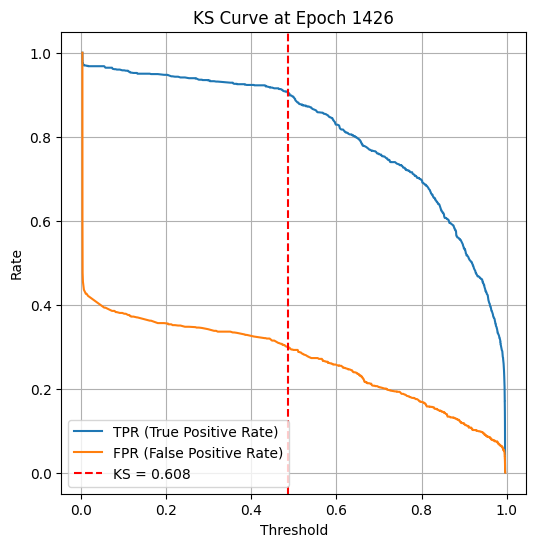

Epoch 1430 — Train Loss: 0.3217 | Train Acc: 0.8603 | Val KS: 0.5923 | Val Acc: 0.7981 | Val Prec: 0.7591 | Val Recall: 0.8965 | Val F1: 0.8221
Epoch 1440 — Train Loss: 0.3157 | Train Acc: 0.8623 | Val KS: 0.6132 | Val Acc: 0.8069 | Val Prec: 0.7726 | Val Recall: 0.8912 | Val F1: 0.8277


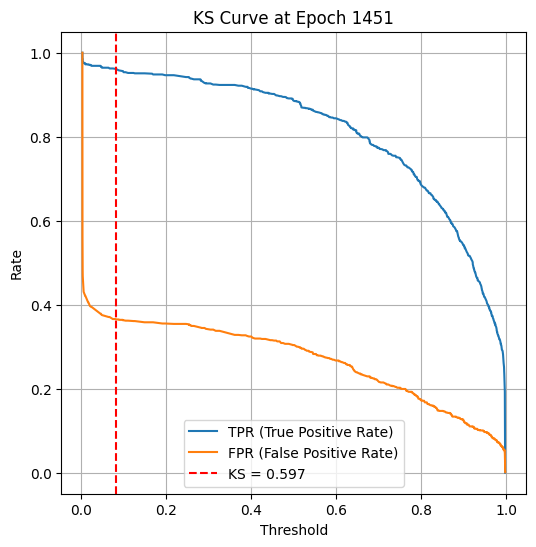

Epoch 1450 — Train Loss: 0.3160 | Train Acc: 0.8612 | Val KS: 0.5967 | Val Acc: 0.7943 | Val Prec: 0.7596 | Val Recall: 0.8849 | Val F1: 0.8175
Epoch 1460 — Train Loss: 0.3087 | Train Acc: 0.8647 | Val KS: 0.5830 | Val Acc: 0.7869 | Val Prec: 0.7606 | Val Recall: 0.8617 | Val F1: 0.8080
Epoch 1470 — Train Loss: 0.3167 | Train Acc: 0.8626 | Val KS: 0.6085 | Val Acc: 0.8004 | Val Prec: 0.7798 | Val Recall: 0.8591 | Val F1: 0.8175


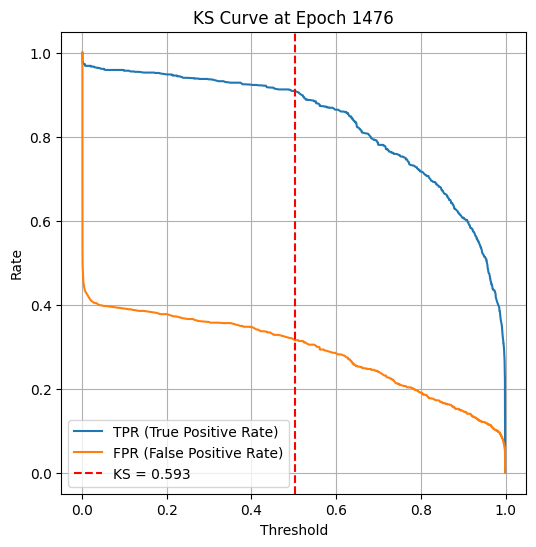

Epoch 1480 — Train Loss: 0.3080 | Train Acc: 0.8657 | Val KS: 0.5972 | Val Acc: 0.7864 | Val Prec: 0.7725 | Val Recall: 0.8359 | Val F1: 0.8029
Epoch 1490 — Train Loss: 0.3072 | Train Acc: 0.8657 | Val KS: 0.5860 | Val Acc: 0.7948 | Val Prec: 0.7555 | Val Recall: 0.8956 | Val F1: 0.8196


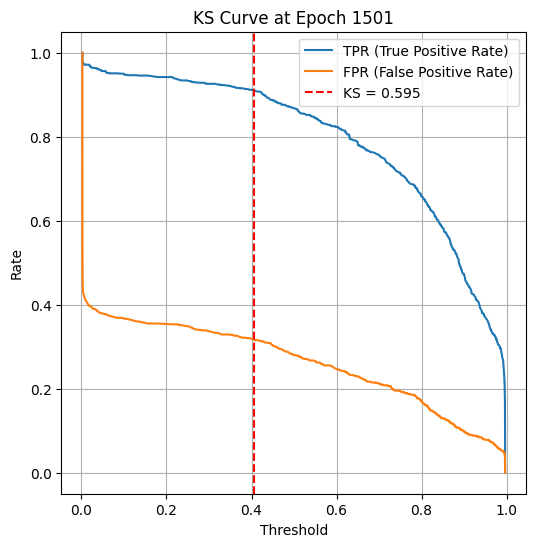

Epoch 1500 — Train Loss: 0.3119 | Train Acc: 0.8612 | Val KS: 0.5951 | Val Acc: 0.7967 | Val Prec: 0.7708 | Val Recall: 0.8671 | Val F1: 0.8161
Epoch 1510 — Train Loss: 0.3149 | Train Acc: 0.8586 | Val KS: 0.6069 | Val Acc: 0.8027 | Val Prec: 0.7648 | Val Recall: 0.8965 | Val F1: 0.8255
Epoch 1520 — Train Loss: 0.3117 | Train Acc: 0.8623 | Val KS: 0.5962 | Val Acc: 0.7897 | Val Prec: 0.7698 | Val Recall: 0.8501 | Val F1: 0.8080


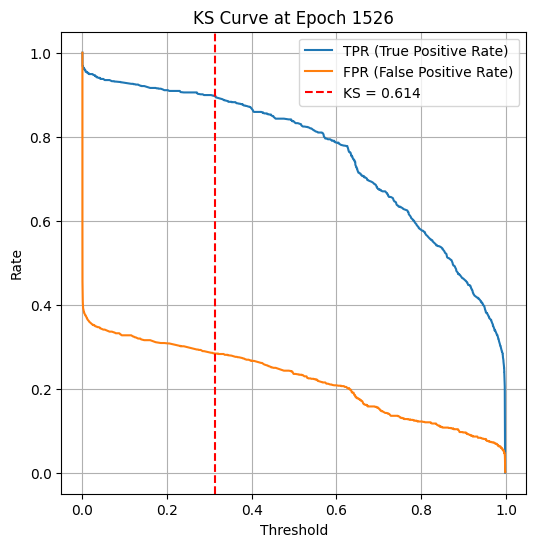

Epoch 1530 — Train Loss: 0.3078 | Train Acc: 0.8685 | Val KS: 0.6091 | Val Acc: 0.8013 | Val Prec: 0.7672 | Val Recall: 0.8876 | Val F1: 0.8230
Epoch 1540 — Train Loss: 0.3101 | Train Acc: 0.8635 | Val KS: 0.6035 | Val Acc: 0.8022 | Val Prec: 0.7671 | Val Recall: 0.8903 | Val F1: 0.8241


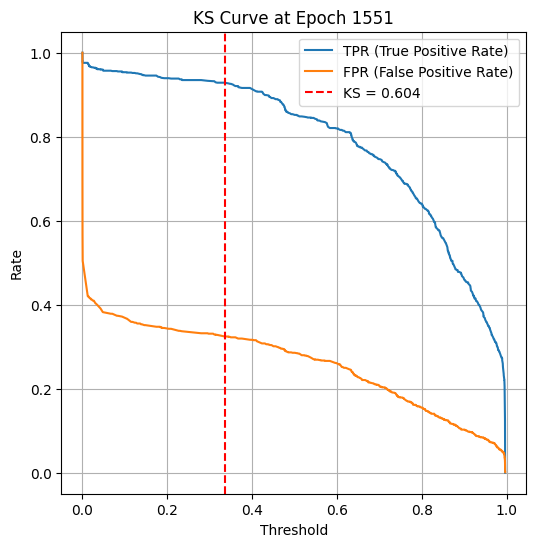

Epoch 1550 — Train Loss: 0.3091 | Train Acc: 0.8661 | Val KS: 0.6043 | Val Acc: 0.7860 | Val Prec: 0.7640 | Val Recall: 0.8519 | Val F1: 0.8056
Epoch 1560 — Train Loss: 0.3064 | Train Acc: 0.8643 | Val KS: 0.6011 | Val Acc: 0.8004 | Val Prec: 0.7604 | Val Recall: 0.9001 | Val F1: 0.8243
Epoch 1570 — Train Loss: 0.3093 | Train Acc: 0.8647 | Val KS: 0.5998 | Val Acc: 0.7990 | Val Prec: 0.7630 | Val Recall: 0.8903 | Val F1: 0.8217


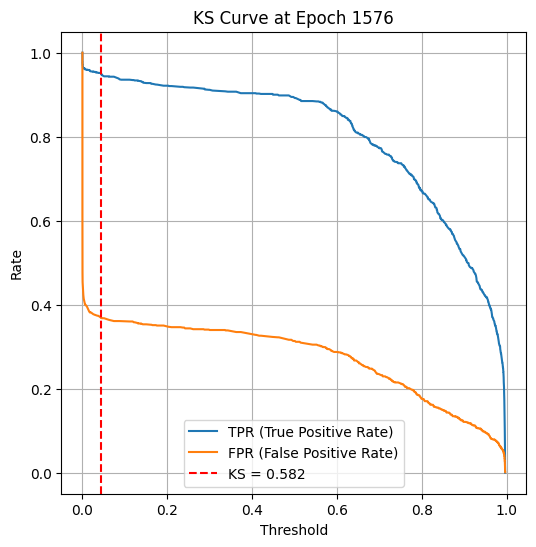

Epoch 1580 — Train Loss: 0.3040 | Train Acc: 0.8677 | Val KS: 0.6053 | Val Acc: 0.7967 | Val Prec: 0.7658 | Val Recall: 0.8778 | Val F1: 0.8180
Epoch 1590 — Train Loss: 0.3112 | Train Acc: 0.8671 | Val KS: 0.6021 | Val Acc: 0.7957 | Val Prec: 0.7722 | Val Recall: 0.8617 | Val F1: 0.8145


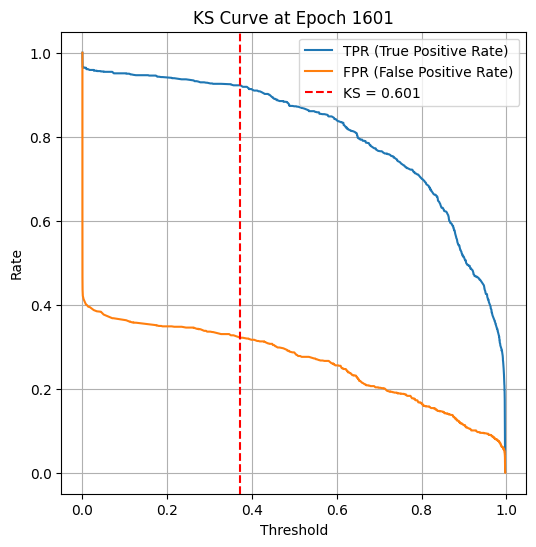

Epoch 1600 — Train Loss: 0.3025 | Train Acc: 0.8683 | Val KS: 0.6010 | Val Acc: 0.7962 | Val Prec: 0.7677 | Val Recall: 0.8724 | Val F1: 0.8167
Epoch 1610 — Train Loss: 0.3054 | Train Acc: 0.8674 | Val KS: 0.6100 | Val Acc: 0.8064 | Val Prec: 0.7683 | Val Recall: 0.8992 | Val F1: 0.8286
Epoch 1620 — Train Loss: 0.2969 | Train Acc: 0.8711 | Val KS: 0.5980 | Val Acc: 0.7999 | Val Prec: 0.7666 | Val Recall: 0.8849 | Val F1: 0.8215


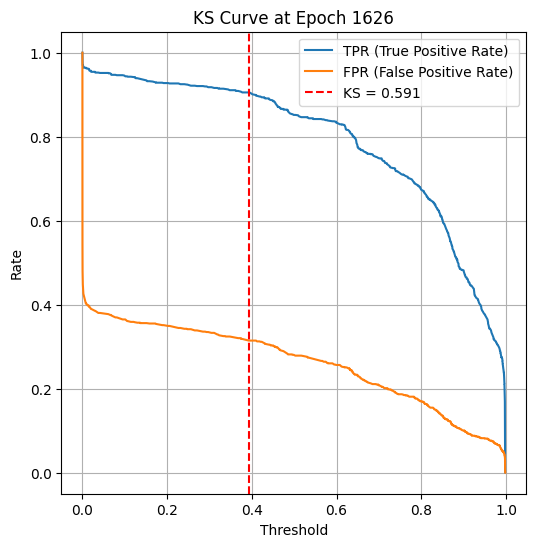

Epoch 1630 — Train Loss: 0.2986 | Train Acc: 0.8678 | Val KS: 0.5926 | Val Acc: 0.7957 | Val Prec: 0.7570 | Val Recall: 0.8947 | Val F1: 0.8201
Epoch 1640 — Train Loss: 0.2978 | Train Acc: 0.8658 | Val KS: 0.5969 | Val Acc: 0.7943 | Val Prec: 0.7695 | Val Recall: 0.8635 | Val F1: 0.8138


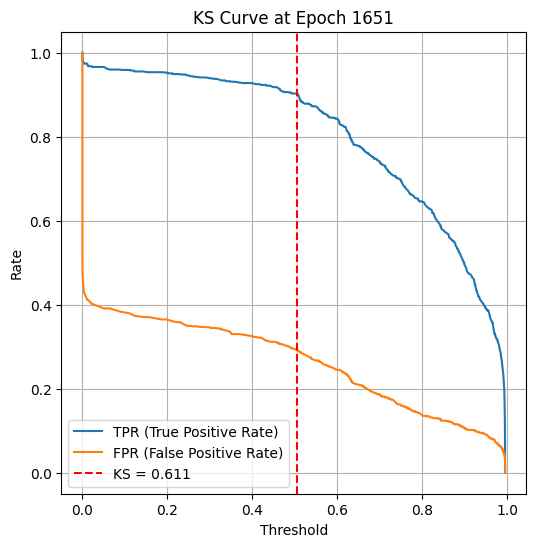

Epoch 1650 — Train Loss: 0.3093 | Train Acc: 0.8654 | Val KS: 0.6114 | Val Acc: 0.8092 | Val Prec: 0.7702 | Val Recall: 0.9028 | Val F1: 0.8312
Epoch 1660 — Train Loss: 0.3040 | Train Acc: 0.8674 | Val KS: 0.6040 | Val Acc: 0.7953 | Val Prec: 0.7716 | Val Recall: 0.8617 | Val F1: 0.8142
Epoch 1670 — Train Loss: 0.3008 | Train Acc: 0.8669 | Val KS: 0.6005 | Val Acc: 0.7994 | Val Prec: 0.7604 | Val Recall: 0.8974 | Val F1: 0.8232


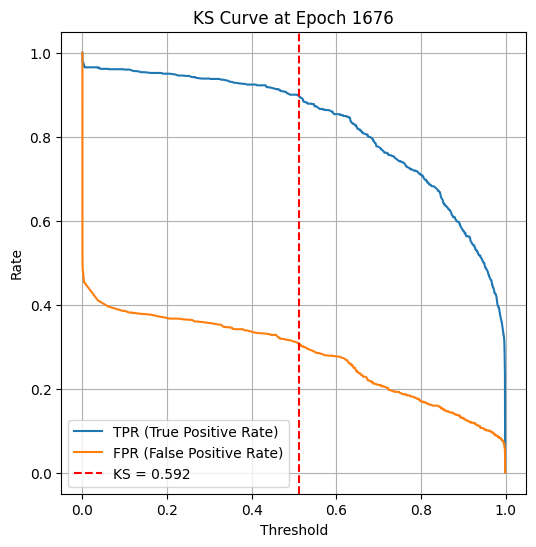

Epoch 1680 — Train Loss: 0.3048 | Train Acc: 0.8629 | Val KS: 0.6081 | Val Acc: 0.8004 | Val Prec: 0.7627 | Val Recall: 0.8947 | Val F1: 0.8235
Epoch 1690 — Train Loss: 0.3122 | Train Acc: 0.8641 | Val KS: 0.6196 | Val Acc: 0.8097 | Val Prec: 0.7712 | Val Recall: 0.9019 | Val F1: 0.8314


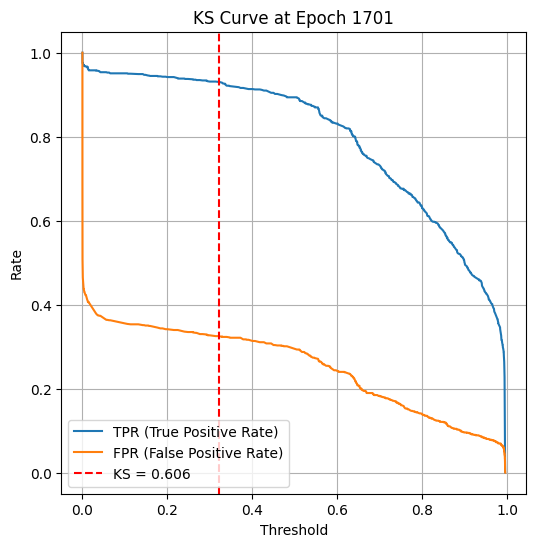

Epoch 1700 — Train Loss: 0.3054 | Train Acc: 0.8649 | Val KS: 0.6061 | Val Acc: 0.8032 | Val Prec: 0.7666 | Val Recall: 0.8938 | Val F1: 0.8254
Epoch 1710 — Train Loss: 0.3015 | Train Acc: 0.8680 | Val KS: 0.5928 | Val Acc: 0.7994 | Val Prec: 0.7505 | Val Recall: 0.9206 | Val F1: 0.8269
Epoch 1720 — Train Loss: 0.3063 | Train Acc: 0.8652 | Val KS: 0.6056 | Val Acc: 0.7994 | Val Prec: 0.7656 | Val Recall: 0.8858 | Val F1: 0.8213


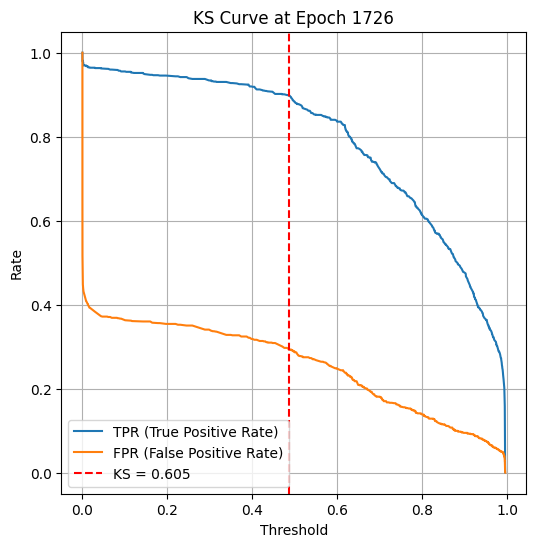

Epoch 1730 — Train Loss: 0.3031 | Train Acc: 0.8669 | Val KS: 0.6183 | Val Acc: 0.8106 | Val Prec: 0.7662 | Val Recall: 0.9153 | Val F1: 0.8341
Epoch 1740 — Train Loss: 0.3107 | Train Acc: 0.8629 | Val KS: 0.5921 | Val Acc: 0.7981 | Val Prec: 0.7541 | Val Recall: 0.9081 | Val F1: 0.8240


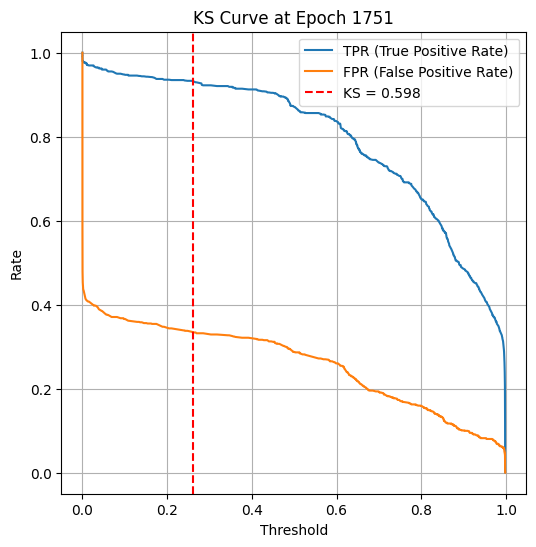

Epoch 1750 — Train Loss: 0.3053 | Train Acc: 0.8674 | Val KS: 0.5982 | Val Acc: 0.7948 | Val Prec: 0.7667 | Val Recall: 0.8707 | Val F1: 0.8154
Epoch 1760 — Train Loss: 0.2981 | Train Acc: 0.8689 | Val KS: 0.6017 | Val Acc: 0.8032 | Val Prec: 0.7670 | Val Recall: 0.8930 | Val F1: 0.8252
Epoch 1770 — Train Loss: 0.3079 | Train Acc: 0.8691 | Val KS: 0.6116 | Val Acc: 0.8041 | Val Prec: 0.7772 | Val Recall: 0.8742 | Val F1: 0.8228


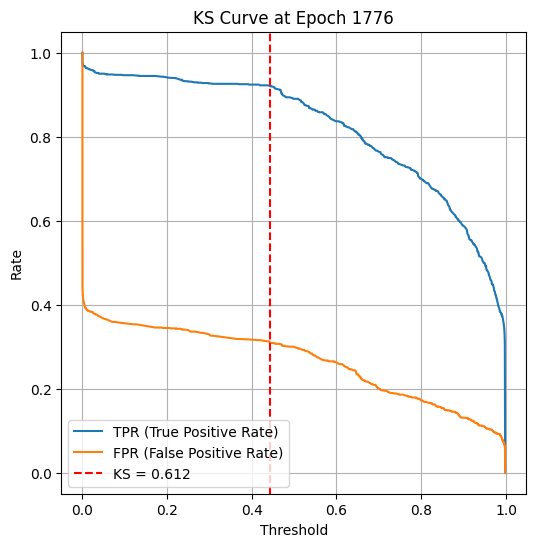

Epoch 1780 — Train Loss: 0.3024 | Train Acc: 0.8689 | Val KS: 0.6062 | Val Acc: 0.8022 | Val Prec: 0.7721 | Val Recall: 0.8796 | Val F1: 0.8224
Epoch 1790 — Train Loss: 0.3032 | Train Acc: 0.8647 | Val KS: 0.6027 | Val Acc: 0.8045 | Val Prec: 0.7628 | Val Recall: 0.9063 | Val F1: 0.8284


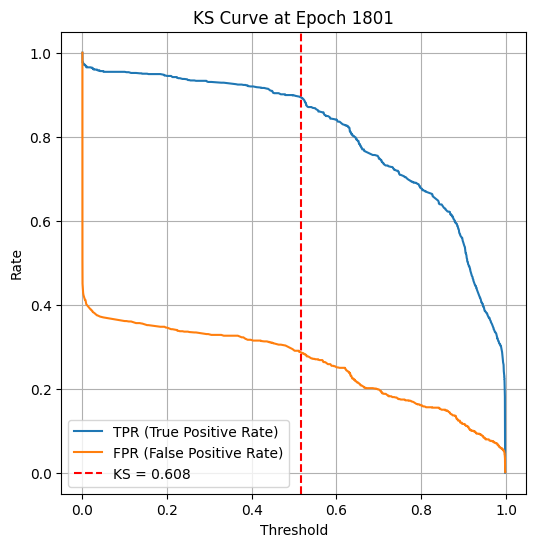

Epoch 1800 — Train Loss: 0.3002 | Train Acc: 0.8677 | Val KS: 0.6083 | Val Acc: 0.8073 | Val Prec: 0.7699 | Val Recall: 0.8983 | Val F1: 0.8291
Epoch 1810 — Train Loss: 0.2899 | Train Acc: 0.8722 | Val KS: 0.6061 | Val Acc: 0.7985 | Val Prec: 0.7737 | Val Recall: 0.8662 | Val F1: 0.8173
Epoch 1820 — Train Loss: 0.3003 | Train Acc: 0.8692 | Val KS: 0.5934 | Val Acc: 0.7939 | Val Prec: 0.7659 | Val Recall: 0.8698 | Val F1: 0.8145


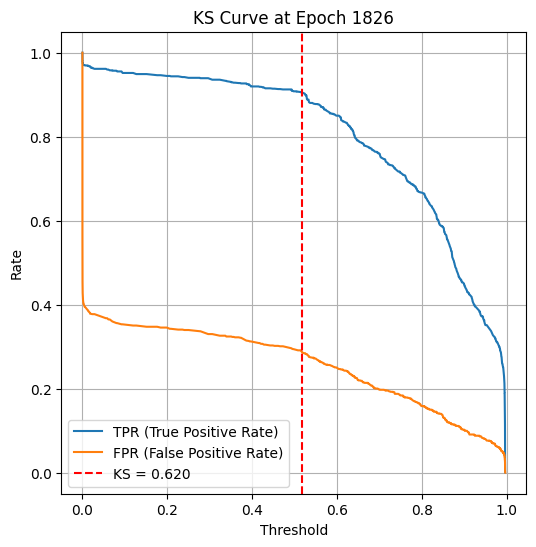

Epoch 1830 — Train Loss: 0.2992 | Train Acc: 0.8697 | Val KS: 0.6044 | Val Acc: 0.8022 | Val Prec: 0.7778 | Val Recall: 0.8680 | Val F1: 0.8204
Epoch 1840 — Train Loss: 0.3019 | Train Acc: 0.8677 | Val KS: 0.5998 | Val Acc: 0.7957 | Val Prec: 0.7722 | Val Recall: 0.8617 | Val F1: 0.8145


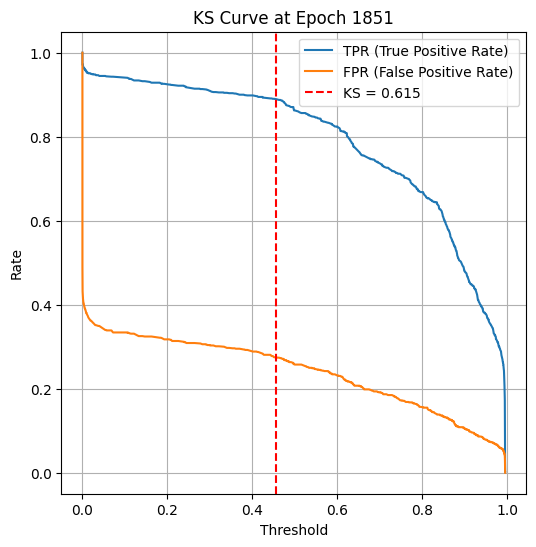

Epoch 1850 — Train Loss: 0.2980 | Train Acc: 0.8703 | Val KS: 0.6154 | Val Acc: 0.8050 | Val Prec: 0.7843 | Val Recall: 0.8626 | Val F1: 0.8216
Epoch 1860 — Train Loss: 0.2997 | Train Acc: 0.8695 | Val KS: 0.6224 | Val Acc: 0.8120 | Val Prec: 0.7784 | Val Recall: 0.8930 | Val F1: 0.8317
Epoch 1870 — Train Loss: 0.2953 | Train Acc: 0.8731 | Val KS: 0.6083 | Val Acc: 0.8036 | Val Prec: 0.7710 | Val Recall: 0.8858 | Val F1: 0.8244


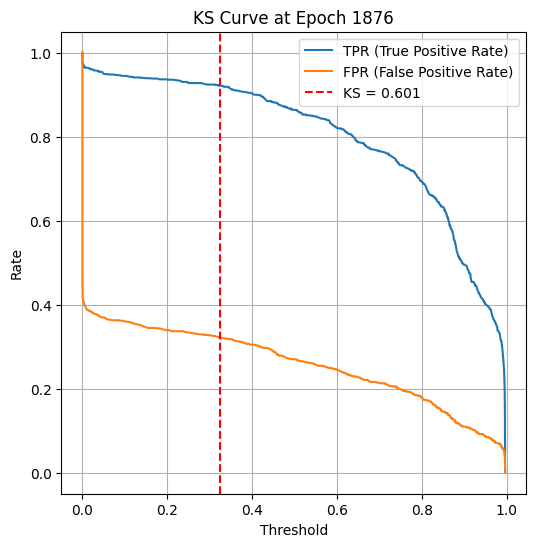

Epoch 1880 — Train Loss: 0.3007 | Train Acc: 0.8706 | Val KS: 0.6192 | Val Acc: 0.8041 | Val Prec: 0.7767 | Val Recall: 0.8751 | Val F1: 0.8230
Epoch 1890 — Train Loss: 0.2981 | Train Acc: 0.8719 | Val KS: 0.6133 | Val Acc: 0.8008 | Val Prec: 0.7724 | Val Recall: 0.8751 | Val F1: 0.8206


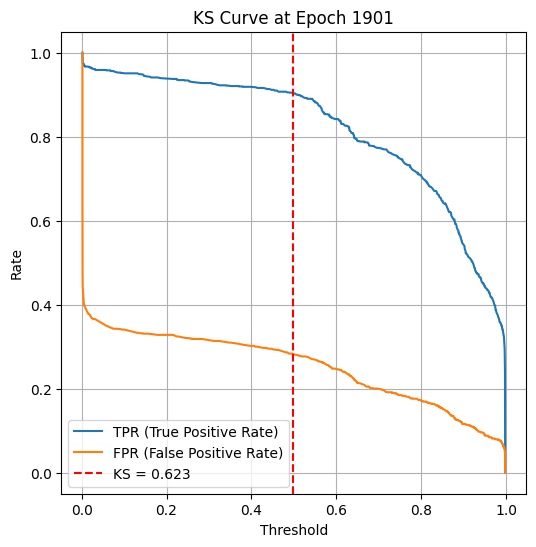

Epoch 1900 — Train Loss: 0.2983 | Train Acc: 0.8694 | Val KS: 0.6228 | Val Acc: 0.8148 | Val Prec: 0.7768 | Val Recall: 0.9037 | Val F1: 0.8355
Epoch 1910 — Train Loss: 0.2961 | Train Acc: 0.8695 | Val KS: 0.6184 | Val Acc: 0.8064 | Val Prec: 0.7843 | Val Recall: 0.8662 | Val F1: 0.8232
Epoch 1920 — Train Loss: 0.2943 | Train Acc: 0.8660 | Val KS: 0.6115 | Val Acc: 0.8059 | Val Prec: 0.7693 | Val Recall: 0.8956 | Val F1: 0.8277


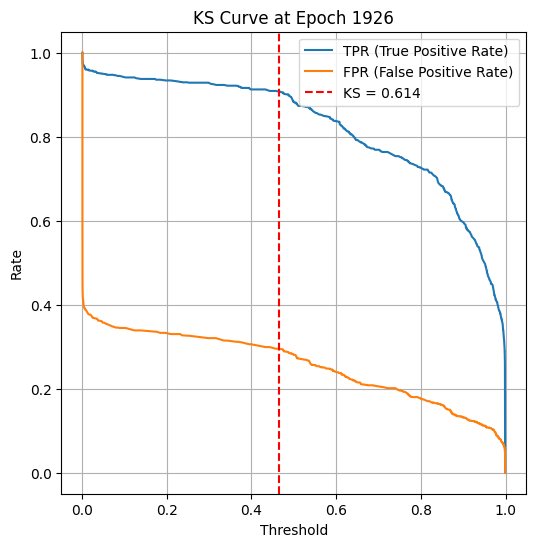

Epoch 1930 — Train Loss: 0.2892 | Train Acc: 0.8751 | Val KS: 0.6234 | Val Acc: 0.8050 | Val Prec: 0.7894 | Val Recall: 0.8528 | Val F1: 0.8199
Epoch 1940 — Train Loss: 0.3023 | Train Acc: 0.8709 | Val KS: 0.6218 | Val Acc: 0.8143 | Val Prec: 0.7713 | Val Recall: 0.9144 | Val F1: 0.8367


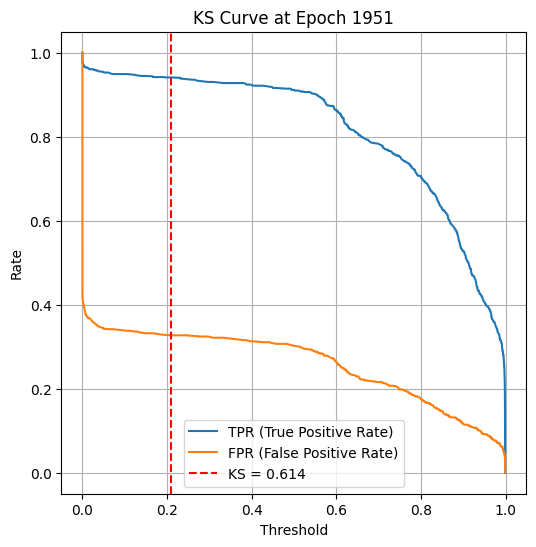

Epoch 1950 — Train Loss: 0.2869 | Train Acc: 0.8773 | Val KS: 0.6139 | Val Acc: 0.8083 | Val Prec: 0.7658 | Val Recall: 0.9099 | Val F1: 0.8316
Epoch 1960 — Train Loss: 0.2961 | Train Acc: 0.8709 | Val KS: 0.6128 | Val Acc: 0.7990 | Val Prec: 0.7867 | Val Recall: 0.8421 | Val F1: 0.8134
Epoch 1970 — Train Loss: 0.2853 | Train Acc: 0.8733 | Val KS: 0.6193 | Val Acc: 0.8087 | Val Prec: 0.7802 | Val Recall: 0.8805 | Val F1: 0.8273


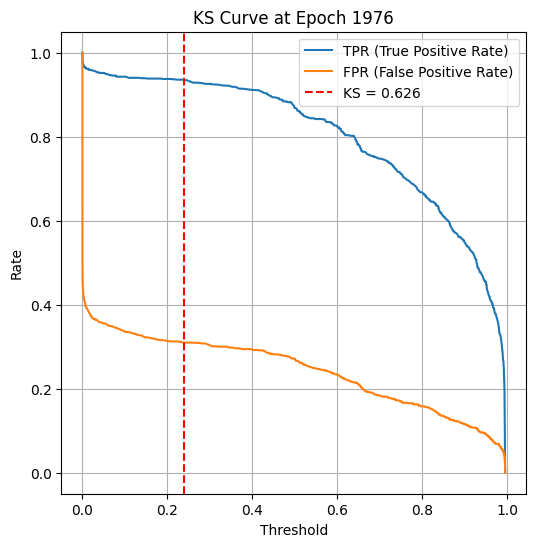

Epoch 1980 — Train Loss: 0.2901 | Train Acc: 0.8726 | Val KS: 0.6158 | Val Acc: 0.8097 | Val Prec: 0.7733 | Val Recall: 0.8974 | Val F1: 0.8307
Epoch 1990 — Train Loss: 0.2966 | Train Acc: 0.8682 | Val KS: 0.6074 | Val Acc: 0.7962 | Val Prec: 0.7809 | Val Recall: 0.8457 | Val F1: 0.8120
Epoch 1999 — Train Loss: 0.2944 | Train Acc: 0.8705 | Val KS: 0.6187 | Val Acc: 0.8064 | Val Prec: 0.7794 | Val Recall: 0.8760 | Val F1: 0.8249


In [ ]:

import torch
import torch.nn as nn
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F

X_train_tensor = torch.tensor(X_train_nn, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_nn, dtype=torch.float32)


train_loader = DataLoader(TensorDataset(X_train_tensor, y_train_tensor), batch_size=32, shuffle=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = STABTransformer(input_dim=X_train_tensor.shape[1], n_heads=4, n_layers=4, dropout=0.3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.BCELoss()


epochs=2000
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    all_preds = []
    all_targets = []

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        preds_np = (pred > 0.5).detach().cpu().numpy()
        targets_np = yb.detach().cpu().numpy()

        all_preds.extend(preds_np)
        all_targets.extend(targets_np)

    # Training metrics
    acc = accuracy_score(all_targets, all_preds)
    prec = precision_score(all_targets, all_preds)
    rec = recall_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds)

    # Validation metrics
    ks_val, acc_val, prec_val, rec_val, f1_val = evaluate_validation(model, val_loader, device, epoch)

    if epoch % 10 == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch:03d} — Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Train Acc: {acc:.4f} | Val KS: {ks_val:.4f} | Val Acc: {acc_val:.4f} | "
              f"Val Prec: {prec_val:.4f} | Val Recall: {rec_val:.4f} | Val F1: {f1_val:.4f}")


✅ Accuracy: 0.8055
✅ Precision: 0.7764
✅ Recall: 0.8796
✅ F1 Score: 0.8248


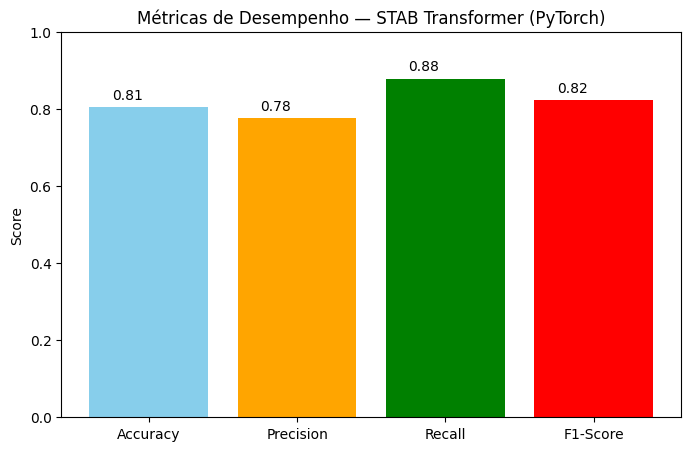

In [ ]:
model.eval()
X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_nn.values, dtype=torch.float32)  # <-- Aqui está o fix

with torch.no_grad():
    y_pred_prob = model(X_test_tensor.to(device)).cpu().squeeze().numpy()
    y_pred = (y_pred_prob >= 0.5).astype(int)

acc = accuracy_score(y_test_nn, y_pred)
prec = precision_score(y_test_nn, y_pred)
rec = recall_score(y_test_nn, y_pred)
f1 = f1_score(y_test_nn, y_pred)

print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Precision: {prec:.4f}")
print(f"✅ Recall: {rec:.4f}")
print(f"✅ F1 Score: {f1:.4f}")

metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [acc, prec, rec, f1]

plt.figure(figsize=(8, 5))
bars = plt.bar(metrics_names, metrics_values, color=['skyblue', 'orange', 'green', 'red'])
plt.ylim(0, 1)
plt.title('Métricas de Desempenho — STAB Transformer (PyTorch)')
plt.ylabel('Score')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.15, yval + 0.02, f'{yval:.2f}')
plt.show()



In [ ]:

torch.save(model.state_dict(), 'stab_transformer_4head_5layer_0.1droput_1000epochs.pt')
files.download('stab_transformer_4head_5layer_0.1droput_1000epochs.pt')


In [15]:
!pip install optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 19.0 MB/s eta 0:00:00


In [21]:
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)


In [22]:

def objective(trial):
    # Transformer architecture
    d_model = trial.suggest_categorical("d_model", [32, 64, 128])
    n_heads = trial.suggest_categorical("n_heads", [2, 4, 8])
    n_layers = trial.suggest_int("n_layers", 1, 5)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)

    # 🔹 Activation function choice
    activation_name = trial.suggest_categorical("activation", ["ReLU", "LeakyReLU", "GELU"])
    if activation_name == "ReLU":
        activation_fn = nn.ReLU()
    elif activation_name == "LeakyReLU":
        activation_fn = nn.LeakyReLU()
    else:
        activation_fn = nn.GELU()

    # 🔹 Optimizer choice
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", "SGD"])
    lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = STABTransformer(
        input_dim=X_train_nn.shape[1],
        d_model=d_model,
        n_heads=n_heads,
        n_layers=n_layers,
        dropout=dropout
    ).to(device)

    # Replace activation in the head dynamically
    model.head[1] = activation_fn

    # Pick optimizer
    if optimizer_name == "Adam":
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    elif optimizer_name == "AdamW":
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    else:
        optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9)

    criterion = nn.BCELoss()

    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_train_nn, dtype=torch.float32),
                      torch.tensor(y_train_nn.values, dtype=torch.float32)),
        batch_size=32, shuffle=True
    )
    val_loader = DataLoader(
        TensorDataset(torch.tensor(X_val_nn, dtype=torch.float32),
                      torch.tensor(y_val_nn.values, dtype=torch.float32)),
        batch_size=32, shuffle=False
    )

    for epoch in range(20):
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            preds = model(xb).squeeze()
            loss = criterion(preds, yb)
            loss.backward()
            optimizer.step()

    ks, _, _, _, _ = evaluate_validation(model, val_loader, device)
    return ks


# 🔍 Create study and optimize
study = optuna.create_study(direction="maximize")  # KS: higher is better
study.optimize(objective, n_trials=30)

print("Best trial:")
trial = study.best_trial
print(f"  KS: {trial.value}")
print("  Params:", trial.params)


[I 2025-08-10 12:52:15,406] A new study created in memory with name: no-name-726812fe-988e-49e6-8c6f-5693e8872460
/tmp/ipython-input-2380508469.py:25: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
[I 2025-08-10 12:53:25,764] Trial 0 finished with value: 0.5041653965093054 and parameters: {'d_model': 32, 'n_heads': 8, 'n_layers': 3, 'dropout': 0.22579986423089815, 'activation': 'ReLU', 'optimizer': 'Adam', 'lr': 0.0035402355734712363}. Best is trial 0 with value: 0.5041653965093054.
/tmp/ipython-input-2380508469.py:25: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
[I 2025-08-1

Best trial:
  KS: 0.5640819935871806
  Params: {'d_model': 128, 'n_heads': 8, 'n_layers': 1, 'dropout': 0.11712022273353077, 'activation': 'GELU', 'optimizer': 'Adam', 'lr': 0.0003437652586071963}


# 🌲 5. Modelagem com Árvores (Pessoa 3)

# 📊 6. Avaliação (Pessoa 4)

## 6.1. Métricas de avaliação

In [ ]:
from sklearn.metrics import classification_report
from scipy.stats import ks_2samp

def avaliar_modelo(model, X, y):
    y_pred = model.predict(X)
    y_pred_prob = model.predict_proba(X)[:, 1]
    print(classification_report(y, y_pred))
    print("KS:", ks_2samp(y_pred_prob[y==0], y_pred_prob[y==1]).statistic)


## 6.2. Visualizações

- Matriz de confusão
- Curvas ROC e Precision-Recall
- Comparação de modelos em tabela

## 7.1. Organização dos notebooks
- Juntar notebooks por responsável
- Separar funções reutilizáveis em arquivo `.py`

## 7.2. Instruções de uso (README.md)
- Como executar o projeto
- Dependências (`requirements.txt`)
- Estrutura de diretórios

# 📎 9. Referências
- [Dataset do Kaggle](https://www.kaggle.com/datasets/kapturovalexander/customers-churned-in-telecom-services/data)
- Germano Vasconcelos (slides)
- Documentação do Scikit-Learn, Keras e XGBoost

## 3.6. Visualização e Análise dos Dados Após Cada Etapa de Pré-processamento

Nesta seção, visualizaremos os dados após cada etapa de pré-processamento para entender as transformações aplicadas e o impacto na estrutura dos dados.